In [2]:
!pip install insightface onnxruntime-gpu opencv-python numpy scikit-learn matplotlib seaborn tqdm deepface ultralytics tf-keras Pillow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 439.5/439.5 kB 18.5 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 300.5/300.5 MB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.1/133.1 kB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 73.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.9/115.9 kB 11.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.0/85.0 kB 8.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.4/59.4 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 75.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.1/18.1 MB 121.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 8.2 MB/s eta 0:00

In [15]:
!unzip datasetik_of_mine.zip

Archive:  datasetik_of_mine.zip
   creating: datasetik_of_mine/
   creating: datasetik_of_mine/Keanu_Reeves/
  inflating: datasetik_of_mine/Keanu_Reeves/Keanu_Reeves_0001.jpg  
  inflating: datasetik_of_mine/Keanu_Reeves/Keanu_Reeves_0002.jpg  
  inflating: datasetik_of_mine/Keanu_Reeves/Keanu_Reeves_0003.jpg  
  inflating: datasetik_of_mine/Keanu_Reeves/Keanu_Reeves_0004.jpg  
  inflating: datasetik_of_mine/Keanu_Reeves/Keanu_Reeves_0005.jpg  
  inflating: datasetik_of_mine/Keanu_Reeves/Keanu_Reeves_0006.jpg  
  inflating: datasetik_of_mine/Keanu_Reeves/Keanu_Reeves_0007.jpg  
  inflating: datasetik_of_mine/Keanu_Reeves/Keanu_Reeves_0008.jpg  
  inflating: datasetik_of_mine/Keanu_Reeves/Keanu_Reeves_0009.jpg  
  inflating: datasetik_of_mine/Keanu_Reeves/Keanu_Reeves_0010.jpg  
  inflating: datasetik_of_mine/Keanu_Reeves/Keanu_Reeves_0011.jpg  
  inflating: datasetik_of_mine/Keanu_Reeves/Keanu_Reeves_0012.jpg  
   creating: datasetik_of_mine/Mahathir_Mohamad/
  inflating: datasetik_of_

In [1]:
!unzip lfw.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: lfw/Paradorn_Srichaphan/Paradorn_Srichaphan_0006.jpg  
  inflating: lfw/Paradorn_Srichaphan/Paradorn_Srichaphan_0007.jpg  
  inflating: lfw/Paradorn_Srichaphan/Paradorn_Srichaphan_0008.jpg  
  inflating: lfw/Paradorn_Srichaphan/Paradorn_Srichaphan_0009.jpg  
  inflating: lfw/Paradorn_Srichaphan/Paradorn_Srichaphan_0010.jpg  
   creating: lfw/Paris_Hilton/
  inflating: lfw/Paris_Hilton/Paris_Hilton_0001.jpg  
  inflating: lfw/Paris_Hilton/Paris_Hilton_0002.jpg  
   creating: lfw/Park_Jie-won/
  inflating: lfw/Park_Jie-won/Park_Jie-won_0001.jpg  
   creating: lfw/Park_Jung_Sung/
  inflating: lfw/Park_Jung_Sung/Park_Jung_Sung_0001.jpg  
   creating: lfw/Park_Na-kyong/
  inflating: lfw/Park_Na-kyong/Park_Na-kyong_0001.jpg  
   creating: lfw/Parris_Glendening/
  inflating: lfw/Parris_Glendening/Parris_Glendening_0001.jpg  
  inflating: lfw/Parris_Glendening/Parris_Glendening_0002.jpg  
   creating: lfw/Parthiv_

In [4]:
# @title Імпорти
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from insightface.app import FaceAnalysis
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, classification_report, roc_curve, auc
)
from sklearn.preprocessing import label_binarize
import seaborn as sns
from tqdm import tqdm
import pandas as pd
import time
from PIL import Image
from deepface import DeepFace
import torch
import cupy as cp
import pickle
import shutil
import random
from sklearn.datasets import fetch_lfw_people
from pathlib import Path

In [11]:
# @title Заархівувати датасет {"display-mode":"both"}
import shutil
import os
from datetime import datetime

def archive_dataset(dataset_path, archive_name=None):
    """
    Архівує папку з датасетом у zip файл.

    Параметри:
    - dataset_path: шлях до папки з датасетом (наприклад, '/content/lfw_80-20')
    - archive_name: назва архіву (без розширення). Якщо None, генерується автоматично.
    """

    # 1. Перевіряємо, чи існує папка
    if not os.path.exists(dataset_path):
        print(f"Помилка: Папка {dataset_path} не знайдена!")
        return None

    # 2. Генеруємо назву архіву
    if archive_name is None:
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        archive_name = f"lfw_dataset_{timestamp}"

    archive_name = archive_name.replace('.zip', '') # Прибираємо розширення, якщо користувач ввів
    archive_path_base = f"/content/{archive_name}"

    print(f"Архівування датасету...")
    print(f"Джерело: {dataset_path}")

    # 3. Створюємо zip архів
    # root_dir - папка, яку архівуємо
    # base_dir - відносно якої папки архівувати (щоб всередині архіву не було зайвих папок /content/...)
    shutil.make_archive(
        base_name=archive_path_base,
        format='zip',
        root_dir=dataset_path
    )

    final_archive_path = f"{archive_path_base}.zip"

    # 4. Підрахунок статистики (щоб переконатися, що все ок)
    train_dir = os.path.join(dataset_path, 'train')
    test_dir = os.path.join(dataset_path, 'test')

    def count_files(directory):
        if not os.path.exists(directory): return 0
        return sum([len(files) for r, d, files in os.walk(directory)])

    def count_dirs(directory):
        if not os.path.exists(directory): return 0
        return len([d for d in os.listdir(directory) if os.path.isdir(os.path.join(directory, d))])

    train_count = count_files(train_dir)
    test_count = count_files(test_dir)
    classes_count = count_dirs(train_dir)
    archive_size_mb = os.path.getsize(final_archive_path) / (1024 * 1024)

    # 5. Вивід інформації
    print(f"\nАрхів успішно створено!")
    print(f"Шлях: {final_archive_path}")
    print(f"Розмір: {archive_size_mb:.2f} MB")
    print(f"\nВміст архіву (перераховано):")
    print(f"  - Класів (персон): {classes_count}")
    print(f"  - Train зображень: {train_count}")
    print(f"  - Test зображень:  {test_count}")

    print(f"\nДля завантаження:")
    print(f"1. Клікніть на папку зліва (Files)")
    print(f"2. Знайдіть файл '{archive_name}.zip'")
    print(f"3. Клікніть правою кнопкою → Download")

    return final_archive_path

archive_path = archive_dataset("/content/lfw2", archive_name="lfw2")

Архівування датасету...
Джерело: /content/lfw2

Архів успішно створено!
Шлях: /content/lfw2.zip
Розмір: 81.25 MB

Вміст архіву (перераховано):
  - Класів (персон): 425
  - Train зображень: 4663
  - Test зображень:  1353

Для завантаження:
1. Клікніть на папку зліва (Files)
2. Знайдіть файл 'lfw2.zip'
3. Клікніть правою кнопкою → Download


In [ ]:
# @title Завантаження датасету (sklearn)

def download_and_save_lfw_sklearn(dest_dir="/content/lfw_original"):
    """
    Використовує sklearn для завантаження, а потім зберігає картинки як файли.
    Це обходить проблему з прямим скачуванням архіву.
    """
    if os.path.exists(dest_dir) and len(os.listdir(dest_dir)) > 10:
        print(f"Дані вже існують у {dest_dir}.")
        return dest_dir

    print("Завантаження LFW через sklearn...")
    try:
        # Завантажуємо оригінальні зображення (кольорові, без ресайзу)
        lfw = fetch_lfw_people(
            min_faces_per_person=1, # Беремо всіх
            resize=None,            # Оригінальний розмір
            color=True,             # Кольорові
            slice_=None,            # Без обрізки (повне фото)
            download_if_missing=True
        )
    except Exception as e:
        print(f"Критична помилка sklearn: {e}")
        return None

    print(f"Завантажено {len(lfw.images)} зображень. Зберігаємо на диск...")

    # Створюємо структуру папок
    dest_path = Path(dest_dir)
    if dest_path.exists(): shutil.rmtree(dest_path)
    dest_path.mkdir(parents=True)

    # Проходимо по всіх фото і зберігаємо їх
    for idx, (image, target) in enumerate(zip(lfw.images, lfw.target)):
        person_name = lfw.target_names[target].replace(' ', '_') # Ім'я людини

        # Папка для конкретної людини
        person_dir = dest_path / person_name
        person_dir.mkdir(exist_ok=True)

        # Конвертація з формату sklearn (float 0-1) у формат картинки (uint8 0-255)
        if image.max() <= 1.0:
            image = (image * 255).astype(np.uint8)
        else:
            image = image.astype(np.uint8)

        img_pil = Image.fromarray(image)

        # Зберігаємо файл
        save_path = person_dir / f"{person_name}_{idx:04d}.jpg"
        img_pil.save(save_path)

    print(f"Успішно збережено в {dest_dir}")
    return dest_dir

# 1. Завантажуємо та відновлюємо файли
# raw_data_path = download_and_save_lfw_sklearn()

In [16]:
# @title Поділ датасету

def split_lfw_custom_mixed(source_dir, output_dir, split_ratio=0.8, min_count_fixed=5):
    source_path = Path(source_dir)
    dest_path = Path(output_dir)

    if dest_path.exists(): shutil.rmtree(dest_path)
    (dest_path / "train").mkdir(parents=True)
    (dest_path / "test").mkdir(parents=True)

    print(f"Починаємо розподіл: {source_dir} -> {output_dir}")

    people_folders = [f for f in source_path.iterdir() if f.is_dir()]
    total_stats = {"train": 0, "test": 0}

    for person_folder in tqdm(people_folders, desc="Сортування"):
        person_name = person_folder.name
        images = [f for f in person_folder.iterdir() if f.suffix.lower() in ['.jpg', '.jpeg', '.png']]

        if not images: continue

        random.shuffle(images)
        count = len(images)
        train_imgs, test_imgs = [], []

        # ЛОГІКА:
        if count >= min_count_fixed:
            # >= 5 фото: 80% Train / 20% Test
            split_idx = int(count * split_ratio)
            if split_idx == 0 and count > 0: split_idx = 1 # Страховка
            train_imgs = images[:split_idx]
            test_imgs = images[split_idx:]
        else:
            # < 5 фото: < шанс потрапити в train
            for img in images:
                if random.random() < split_ratio:
                    train_imgs.append(img)
                else:
                    test_imgs.append(img)

        # КОПІЮВАННЯ ФАЙЛІВ
        def copy_list(file_list, target_base):
            if not file_list: return
            target_folder = target_base / person_name
            target_folder.mkdir(exist_ok=True)
            for img_path in file_list:
                shutil.copy2(img_path, target_folder / img_path.name)

        copy_list(train_imgs, dest_path / "train")
        copy_list(test_imgs, dest_path / "test")

        total_stats["train"] += len(train_imgs)
        total_stats["test"] += len(test_imgs)

    print(f"\nГОТОВО! Датасет підготовлено.")
    print(f"Train images: {total_stats['train']}")
    print(f"Test images:  {total_stats['test']}")
    print(f"Папка для з датасетом: {output_dir}")


# 2. ділимо на train/test
split_lfw_custom_mixed(
        source_dir="datasetik_of_mine",
        output_dir="/content/dom"
    )

Починаємо розподіл: datasetik_of_mine -> /content/dom


Сортування: 100%|██████████| 47/47 [00:00<00:00, 953.49it/s]


ГОТОВО! Датасет підготовлено.
Train images: 255
Test images:  78
Папка для з датасетом: /content/dom


In [41]:
# @title FaceRecognitionInsightFace

class FaceRecognitionInsightFace:
    def __init__(self, model_name='buffalo_l'):
        print(f"Ініціалізація InsightFace ({model_name})...")
        import torch
        ctx_id = 0 if torch.cuda.is_available() else -1
        self.app = FaceAnalysis(name=model_name, providers=['CUDAExecutionProvider', 'CPUExecutionProvider'])
        self.app.prepare(ctx_id=ctx_id, det_size=(320, 320))
        self.database = {}
        self.person_to_id = {}
        self.id_to_person = {}

        self.emb_matrix = None
        self.emb_names = []
        self.compiled = False

        self.db_path = None
        self.model_name = model_name

        print("InsightFace готовий!")


    def create_database(self, train_dir):
        print(f"\n{'='*60}")
        print(f"Створення бази даних з {train_dir}")
        print('='*60)

        start_total = time.time()

        self.db_path = train_dir

        person_folders = [d for d in os.listdir(train_dir)
                         if os.path.isdir(os.path.join(train_dir, d))]

        total_processed = 0
        total_failed = 0

        for idx, person_name in enumerate(person_folders):
            self.person_to_id[person_name] = idx
            self.id_to_person[idx] = person_name

            person_dir = os.path.join(train_dir, person_name)
            image_files = [f for f in os.listdir(person_dir)
                          if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

            embeddings = []

            for img_file in tqdm(image_files, desc=f"[{idx+1}/{len(person_folders)}] {person_name}", leave=False):
                img_path = os.path.join(person_dir, img_file)

                try:
                    img = cv2.imread(img_path)
                    if img is None:
                        total_failed += 1
                        continue

                    faces = self.app.get(img)

                    if len(faces) > 0:
                        faces = sorted(faces, key=lambda x: (x.bbox[2]-x.bbox[0]) * (x.bbox[3]-x.bbox[1]), reverse=True)
                        embeddings.append(faces[0].normed_embedding)
                        total_processed += 1
                    else:
                        total_failed += 1

                except Exception as e:
                    total_failed += 1
                    continue

            if embeddings:
                self.database[person_name] = np.array(embeddings)
                print(f"  {person_name}: {len(embeddings)} embeddings")
            else:
                print(f"  {person_name}: 0 embeddings (пропущено)")

        print(f"\n{'='*60}")
        print(f"База даних створена:")
        print(f"  - Осіб: {len(self.database)}")
        print(f"  - Embeddings: {sum(len(v) for v in self.database.values())}")
        print(f"  - Успішно оброблено: {total_processed}")
        print(f"  - Невдалих: {total_failed}")

        self.compile_database()

        total = time.time() - start_total
        print(f"  - Час створення+компіляції бази: {total:.1f}сек")
        if total > 0:
            print(f"  - Швидкість: {total_processed/total:.1f} embeddings/сек")
        print('='*60)


    def compile_database(self, use_gpu=False):
        if not self.database:
            print("База даних порожня, компіляція пропущена")
            return

        print("\nКомпіляція бази даних...")

        self.emb_matrix = []
        self.emb_names = []

        for name, embs in self.database.items():
            for emb in embs:
                self.emb_matrix.append(emb)
                self.emb_names.append(name)

        self.emb_matrix = np.array(self.emb_matrix)

        if use_gpu:
            try:
                import cupy as cp
                if not cp.cuda.is_available():
                    print("CUDA не доступний, використано CPU (NumPy)")
                else:
                    self.emb_matrix = cp.array(self.emb_matrix)
                    print("Використано GPU прискорення (CuPy)")
            except ImportError:
                print("CuPy не встановлено, використано CPU (NumPy)")
            except Exception as e:
                print(f"Помилка CuPy: {e}, використано CPU (NumPy)")

        self.compiled = True

        print(f"База скомпільована: матриця {self.emb_matrix.shape}")
        print(f"  - Загальна кількість embeddings: {len(self.emb_names)}")
        print(f"  - Розмір в пам'яті: ~{self.emb_matrix.nbytes / 1024 / 1024:.1f} MB")


    def _find_best_match(self, embedding):
        if not self.compiled or self.emb_matrix is None:
            return self._find_best_match_slow(embedding)

        try:
            import cupy as cp
            xp = cp if isinstance(self.emb_matrix, cp.ndarray) else np
        except:
            xp = np

        similarities = xp.dot(self.emb_matrix, embedding)
        best_idx = int(xp.argmax(similarities))
        best_similarity = float(similarities[best_idx])
        best_name = self.emb_names[best_idx]
        best_distance = 1 - best_similarity

        return best_name, best_similarity, best_distance


    def _find_best_match_slow(self, embedding):
        best_match = None
        best_distance = float('inf')
        best_similarity = -1

        for name, db_embeddings in self.database.items():
            similarities = np.dot(db_embeddings, embedding)
            max_similarity = np.max(similarities)
            distance = 1 - max_similarity

            if distance < best_distance:
                best_distance = distance
                best_match = name
                best_similarity = max_similarity

        return best_match, best_similarity, best_distance


    def save_database(self, filename=None, save_dir="/content"):
        if filename is None:
            timestamp = time.strftime("%Y%m%d_%H%M%S")
            model_name = getattr(self, 'model_name', 'buffalo_l')

            lib_name = "InsightFace" if hasattr(self, 'app') else "DeepFace"

            if self.db_path:
                dataset = os.path.basename(os.path.dirname(self.db_path))
                if not dataset:
                    dataset = os.path.basename(self.db_path)
            else:
                dataset = "unknown"

            if lib_name == "DeepFace":
                detector = getattr(self, 'detector_backend', 'unknown')
                filename = f"{lib_name}_{model_name}_{detector}_{dataset}.pkl"
            else:
                filename = f"{lib_name}_{model_name}_{dataset}.pkl"

        filepath = os.path.join(save_dir, filename)

        os.makedirs(save_dir, exist_ok=True)

        data = {
            'database': self.database,
            'person_to_id': self.person_to_id,
            'id_to_person': self.id_to_person,
            'model_name': getattr(self, 'model_name', 'unknown'),
            'detector_backend': getattr(self, 'detector_backend', None),
            'db_path': self.db_path,
            'created_at': time.strftime("%Y-%m-%d %H:%M:%S")
        }

        with open(filepath, 'wb') as f:
            pickle.dump(data, f)

        print(f"\nБаза даних збережена:")
        print(f"   Шлях: {filepath}")
        print(f"   Файл: {filename}")
        print(f"   Осіб: {len(self.database)}")
        print(f"   Embeddings: {sum(len(v) for v in self.database.values())}")
        print(f"   Розмір: {os.path.getsize(filepath) / 1024 / 1024:.2f} MB")
        print(f"   Створено: {data['created_at']}")

        return filepath


    def load_database(self, filename, load_dir="/content", use_gpu=False):
        filepath = os.path.join(load_dir, filename)

        if not os.path.exists(filepath):
            print(f"Файл не знайдено: {filepath}")
            return False

        with open(filepath, 'rb') as f:
            data = pickle.load(f)

        self.database = data['database']
        self.person_to_id = data['person_to_id']
        self.id_to_person = data['id_to_person']
        self.db_path = data.get('db_path')

        print(f"\nБаза даних завантажена:")
        print(f"   Шлях: {filepath}")
        print(f"   Файл: {filename}")
        print(f"   Осіб: {len(self.database)}")
        print(f"   Embeddings: {sum(len(v) for v in self.database.values())}")
        print(f"   Модель: {data.get('model_name', 'N/A')}")
        print(f"   Детектор: {data.get('detector_backend', 'N/A')}")
        print(f"   Створено: {data.get('created_at', 'N/A')}")

        print("\nКомпіляція бази даних...")
        self.compile_database(use_gpu=use_gpu)

        return True


    def evaluate_on_test_set(self, test_dir, threshold=0.25, visualize=True, compute_biometric=True):
        if threshold < 0 or threshold > 1:
            raise ValueError(f"threshold має бути в діапазоні [0, 1], отримано: {threshold}")

        print(f"\n{'='*60}")
        print(f"ТЕСТУВАННЯ МОДЕЛІ НА TEST DATASET")
        print(f"Поріг (threshold): {threshold}")
        print(f"Режим пошуку: {'Швидкий (компільований)' if self.compiled else 'Повільний (fallback)'}")
        print(f"Біометричні метрики: {'Увімкнено' if compute_biometric else 'Вимкнено'}")
        print('='*60)

        total_time = time.time()
        test_data = []
        person_folders = [d for d in os.listdir(test_dir)
                         if os.path.isdir(os.path.join(test_dir, d))]

        known_persons = 0
        unknown_persons = 0

        print("\nЗавантаження test зображень...")
        for person_name in tqdm(person_folders):

            if person_name in self.person_to_id:
                true_id = self.person_to_id[person_name]
                label_type = "Known"
                known_persons += 1
            else:
                true_id = -1
                label_type = "Unknown/Stranger"
                unknown_persons += 1

            person_dir = os.path.join(test_dir, person_name)
            for img_file in os.listdir(person_dir):
                if not img_file.lower().endswith(('.jpg', '.jpeg', '.png')):
                    continue

                img_path = os.path.join(person_dir, img_file)
                test_data.append({
                    'path': img_path,
                    'true_label': person_name,
                    'true_id': true_id,
                    'type': label_type
                })

        print(f"Знайдено {len(test_data)} test зображень:")
        print(f"  - Known persons (в базі): {known_persons} осіб")
        print(f"  - Unknown/Strangers (поза базою): {unknown_persons} осіб")

        y_true = []
        y_pred = []
        y_scores = []
        confidences = []
        corrupted_files = 0
        not_detected = 0

        known_correct = 0
        known_incorrect = 0
        known_unknown = 0
        stranger_rejected = 0
        stranger_accepted = 0

        print("\nРозпізнавання облич...")
        start_time = time.time()

        for item in tqdm(test_data):
            img = cv2.imread(item['path'])
            if img is None:
                corrupted_files += 1
                continue

            faces = self.app.get(img)

            if len(faces) == 0:
                not_detected += 1

                y_true.append(item['true_id'])
                y_pred.append(-2)
                y_scores.append(0.0)
                confidences.append(float('inf'))

                continue

            faces = sorted(faces, key=lambda x: (x.bbox[2]-x.bbox[0]) * (x.bbox[3]-x.bbox[1]), reverse=True)
            test_embedding = faces[0].normed_embedding

            best_match, best_similarity, best_distance = self._find_best_match(test_embedding)

            if best_distance > threshold:
                predicted_label = "Unknown"
                predicted_id = -1
            else:
                predicted_label = best_match
                predicted_id = self.person_to_id[best_match]

            y_true.append(item['true_id'])
            y_pred.append(predicted_id)
            y_scores.append(best_similarity)
            confidences.append(best_distance)

            if item['type'] == "Known":
                if predicted_id == item['true_id']:
                    known_correct += 1
                elif predicted_id == -1:
                    known_unknown += 1
                else:
                    known_incorrect += 1
            else:
                if predicted_id == -1:
                    stranger_rejected += 1
                else:
                    stranger_accepted += 1

        elapsed_time = time.time() - start_time

        print(f"\nОброблено: {len(y_true)} зображень за {elapsed_time:.1f} сек")
        if elapsed_time > 0:
            print(f"Швидкість: {len(y_true)/elapsed_time:.1f} зображень/сек")
            print(f"Середній час на зображення: {elapsed_time*1000/len(y_true):.1f} ms")
        print(f"Пошкоджені файли (виключено): {corrupted_files}")
        print(f"Не детектовано облич: {not_detected} ({not_detected/len(y_true)*100:.1f}%)")
        print(f"Класифіковано як Unknown: {sum(1 for p in y_pred if p == -1)} ({sum(1 for p in y_pred if p == -1)/len(y_pred)*100:.1f}%)")

        print(f"\nДеталі розпізнавання:")
        print(f"  Known (в базі):")
        print(f"    - Правильно розпізнано: {known_correct}")
        print(f"    - Неправильно розпізнано: {known_incorrect}")
        print(f"    - Класифіковано як Unknown: {known_unknown}")
        print(f"  Strangers (поза базою):")
        print(f"    - Правильно відхілено (True Negative): {stranger_rejected}")
        print(f"    - Помилково прийнято (False Accept): {stranger_accepted}")

        metrics = self._calculate_metrics(
            y_true, y_pred, y_scores,
            len(person_folders), threshold, visualize, compute_biometric
        )

        metrics['corrupted_files'] = corrupted_files
        metrics['not_detected'] = not_detected
        metrics['unknown_predictions'] = sum(1 for p in y_pred if p == -1)
        metrics['total_test_images'] = len(test_data)
        metrics['successfully_processed'] = len(y_true)
        metrics['processing_time'] = elapsed_time
        metrics['images_per_second'] = len(y_true) / elapsed_time if elapsed_time > 0 else 0

        metrics['known_correct'] = known_correct
        metrics['known_incorrect'] = known_incorrect
        metrics['known_unknown'] = known_unknown
        metrics['stranger_rejected'] = stranger_rejected
        metrics['stranger_accepted'] = stranger_accepted

        metrics['known_persons'] = known_persons
        metrics['unknown_persons'] = unknown_persons

        final_time = time.time() - total_time
        print(f"\nВиконання зайняло {final_time:.1f} сек")

        return metrics


    def _calculate_metrics(self, y_true, y_pred, y_scores, n_classes, threshold, visualize=True, compute_biometric=True):
        print(f"\n{'='*60}")
        print("РЕЗУЛЬТАТИ ТЕСТУВАННЯ")
        print('='*60)

        not_detected_mask = np.array(y_pred) == -2
        unknown_mask = np.array(y_pred) == -1
        recognized_mask = np.array(y_pred) >= 0

        known_mask = np.array(y_true) >= 0
        stranger_mask = np.array(y_true) == -1

        correct = 0
        for t, p in zip(y_true, y_pred):
            if t >= 0:
                if t == p:
                    correct += 1
            else:
                if p == -1:
                    correct += 1

        overall_accuracy = correct / len(y_true) if len(y_true) > 0 else 0

        detection_rate = sum(~not_detected_mask) / len(y_pred) if len(y_pred) > 0 else 0

        known_detected_mask = known_mask & ~not_detected_mask
        if sum(known_detected_mask) > 0:
            y_true_known = np.array(y_true)[known_detected_mask]
            y_pred_known = np.array(y_pred)[known_detected_mask]
            known_accuracy = accuracy_score(y_true_known, y_pred_known)
        else:
            known_accuracy = 0.0

        stranger_detected_mask = stranger_mask & ~not_detected_mask
        if sum(stranger_detected_mask) > 0:
            y_pred_stranger = np.array(y_pred)[stranger_detected_mask]
            stranger_accuracy = sum(y_pred_stranger == -1) / len(y_pred_stranger)
        else:
            stranger_accuracy = 0.0

        valid_mask = (np.array(y_pred) >= 0) & (np.array(y_true) >= 0)
        y_true_valid = np.array(y_true)[valid_mask]
        y_pred_valid = np.array(y_pred)[valid_mask]

        if len(y_true_valid) > 0:
            precision = precision_score(y_true_valid, y_pred_valid, average='weighted', zero_division=0)
            recall = recall_score(y_true_valid, y_pred_valid, average='weighted', zero_division=0)
            f1 = f1_score(y_true_valid, y_pred_valid, average='weighted', zero_division=0)
        else:
            precision = recall = f1 = 0.0

        print(f"\nОсновні метрики:")
        print(f"  Overall Accuracy:       {overall_accuracy*100:.2f}%  (включає своїх і чужих)")
        print(f"  Detection Rate:         {detection_rate*100:.2f}%")
        print(f"  Known Accuracy:         {known_accuracy*100:.2f}%  (тільки свої)")
        print(f"  Stranger Rejection:     {stranger_accuracy*100:.2f}%  (тільки чужі)")
        print(f"  Precision (recognized): {precision*100:.2f}%")
        print(f"  Recall (recognized):    {recall*100:.2f}%")
        print(f"  F1-Score (recognized):  {f1*100:.2f}%")

        print(f"\nДеталі класифікації:")
        print(f"  Не детектовано:  {sum(not_detected_mask)} ({sum(not_detected_mask)/len(y_pred)*100:.1f}%)")
        print(f"  Unknown:         {sum(unknown_mask)} ({sum(unknown_mask)/len(y_pred)*100:.1f}%)")
        print(f"  Розпізнано:      {sum(recognized_mask)} ({sum(recognized_mask)/len(y_pred)*100:.1f}%)")

        cm = confusion_matrix(y_true, y_pred)

        if compute_biometric:
            tar_far_metrics = self._calculate_tar_far(y_true, y_pred, y_scores, threshold)
            tar_far_metrics['threshold'] = threshold

            print(f"\nБіометричні метрики:")
            print(f"  Genuine pairs:  {tar_far_metrics.get('genuine_count', 0)}")
            print(f"  Impostor pairs: {tar_far_metrics.get('impostor_count', 0)}")
            print(f"  TAR@FAR=0.1%: {tar_far_metrics['tar_at_far_0001']*100:.2f}%")
            print(f"  TAR@FAR=1%:   {tar_far_metrics['tar_at_far_001']*100:.2f}%")
            print(f"  EER:          {tar_far_metrics['eer']*100:.2f}%")
        else:
            tar_far_metrics = {
                'tar_at_far_0001': None,
                'tar_at_far_001': None,
                'eer': None,
                'far_values': np.array([]),
                'tar_values': np.array([]),
                'thresholds': np.array([]),
                'genuine_count': 0,
                'impostor_count': 0,
                'threshold': threshold
            }

        if len(y_true_valid) > 0 and len(set(y_true_valid)) > 0:
            all_classes = sorted(set(y_true_valid) | set(y_pred_valid))

            target_names = []
            for class_id in all_classes:
                if class_id in self.id_to_person:
                    target_names.append(self.id_to_person[class_id])
                else:
                    target_names.append(f"Unknown_ID_{class_id}")

            try:
                class_report = classification_report(
                    y_true_valid, y_pred_valid,
                    labels=all_classes,
                    target_names=target_names,
                    output_dict=True,
                    zero_division=0
                )
            except Exception as e:
                print(f"\nПомилка classification_report: {e}")
                class_report = {'accuracy': 0, 'weighted avg': {'precision': 0, 'recall': 0, 'f1-score': 0}}
        else:
            class_report = {'accuracy': 0, 'weighted avg': {'precision': 0, 'recall': 0, 'f1-score': 0}}

        if visualize:
            self._plot_results(cm, y_true, y_pred, y_scores, class_report, tar_far_metrics, n_classes, compute_biometric)

        return {
            'overall_accuracy': overall_accuracy,
            'detection_rate': detection_rate,
            'known_accuracy': known_accuracy,
            'stranger_rejection': stranger_accuracy,
            'precision': precision,
            'recall': recall,
            'f1_score': f1,
            'confusion_matrix': cm,
            'tar_far': tar_far_metrics,
            'class_report': class_report,
            'threshold': threshold
        }


    def _calculate_tar_far(self, y_true, y_pred, y_scores, threshold):
        genuine_scores = []
        impostor_scores = []

        for t, p, s in zip(y_true, y_pred, y_scores):
            if t >= 0 and p != -2:
                if t == p:
                    genuine_scores.append(s)
                elif p >= 0:
                    impostor_scores.append(s)
            elif t == -1 and p >= 0:
                impostor_scores.append(s)

        if len(genuine_scores) == 0 or len(impostor_scores) == 0:
            print("\nПопередження: Недостатньо даних для TAR/FAR")
            print(f"  Genuine scores: {len(genuine_scores)}")
            print(f"  Impostor scores: {len(impostor_scores)}")
            return {
                'tar_at_far_0001': 0.0,
                'tar_at_far_001': 0.0,
                'eer': 1.0,
                'far_values': np.array([0]),
                'tar_values': np.array([0]),
                'thresholds': np.array([0]),
                'genuine_count': len(genuine_scores),
                'impostor_count': len(impostor_scores)
            }

        thresholds_sim = np.linspace(0, 1, 1000)
        far_values = []
        tar_values = []

        for sim_threshold in thresholds_sim:
            far = np.mean([s >= sim_threshold for s in impostor_scores])
            tar = np.mean([s >= sim_threshold for s in genuine_scores])

            far_values.append(far)
            tar_values.append(tar)

        far_values = np.array(far_values)
        tar_values = np.array(tar_values)

        idx_0001 = np.argmin(np.abs(far_values - 0.001))
        tar_at_far_0001 = tar_values[idx_0001]

        idx_001 = np.argmin(np.abs(far_values - 0.01))
        tar_at_far_001 = tar_values[idx_001]

        frr_values = 1 - tar_values
        eer_idx = np.argmin(np.abs(far_values - frr_values))
        eer = (far_values[eer_idx] + frr_values[eer_idx]) / 2

        return {
            'tar_at_far_0001': tar_at_far_0001,
            'tar_at_far_001': tar_at_far_001,
            'eer': eer,
            'far_values': far_values,
            'tar_values': tar_values,
            'thresholds': 1 - thresholds_sim,
            'genuine_count': len(genuine_scores),
            'impostor_count': len(impostor_scores)
        }


    def _plot_results(self, cm, y_true, y_pred, y_scores, class_report, tar_far, n_classes, compute_biometric=True):
        threshold = tar_far.get('threshold', 0.25)

        MAX_CLASSES_FOR_CM = 50
        skip_cm = n_classes > MAX_CLASSES_FOR_CM

        if skip_cm:
            print(f"\nConfusion Matrix пропущена ({n_classes} класів > {MAX_CLASSES_FOR_CM})")
            print(f"Розмір матриці: {n_classes} x {n_classes} ({n_classes*n_classes:,} клітинок)")

        if skip_cm and not compute_biometric:
            fig = plt.figure(figsize=(15, 5))
            grid = (1, 3)
        elif skip_cm:
            fig = plt.figure(figsize=(20, 8))
            grid = (1, 5)
        elif not compute_biometric:
            fig = plt.figure(figsize=(15, 10))
            grid = (2, 3)
        else:
            fig = plt.figure(figsize=(20, 12))
            grid = (2, 3)

        plot_idx = 1

        if not skip_cm:
            ax1 = plt.subplot(grid[0], grid[1], plot_idx)
            plot_idx += 1

            unique_labels = sorted(set(y_true) | set(y_pred))
            label_names = []
            for label in unique_labels:
                if label == -2:
                    label_names.append('Not Detected')
                elif label == -1:
                    label_names.append('Unknown')
                else:
                    label_names.append(self.id_to_person.get(label, str(label)))

            fontsize = max(6, 12 - n_classes // 10)

            sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax1,
                       xticklabels=label_names, yticklabels=label_names,
                       annot_kws={'size': fontsize})
            ax1.set_title('Confusion Matrix', fontsize=14, fontweight='bold')
            ax1.set_xlabel('Predicted')
            ax1.set_ylabel('True')
            plt.setp(ax1.get_xticklabels(), rotation=45, ha='right', fontsize=fontsize)
            plt.setp(ax1.get_yticklabels(), rotation=0, fontsize=fontsize)

        ax2 = plt.subplot(grid[0], grid[1], plot_idx)
        plot_idx += 1

        valid_mask = (np.array(y_pred) >= 0) & (np.array(y_true) >= 0)
        if sum(valid_mask) > 0:
            y_true_roc = np.array(y_true)[valid_mask]
            y_scores_roc = np.array(y_scores)[valid_mask]

            unique_classes = sorted(set(y_true_roc))
            if len(unique_classes) > 1:
                y_true_bin = label_binarize(y_true_roc, classes=unique_classes)

                if len(y_true_bin) > 10000:
                    sample_indices = np.random.choice(len(y_true_bin), 10000, replace=False)
                    y_true_bin = y_true_bin[sample_indices]
                    y_scores_roc = y_scores_roc[sample_indices]

                fpr, tpr, _ = roc_curve(y_true_bin.ravel(),
                                       np.repeat(y_scores_roc, len(unique_classes)))
                roc_auc = auc(fpr, tpr)

                ax2.plot(fpr, tpr, color='darkorange', lw=2,
                        label=f'ROC curve (AUC = {roc_auc:.2f})')
            else:
                ax2.text(0.5, 0.5, 'Insufficient classes for ROC',
                        ha='center', va='center')

        ax2.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        ax2.set_xlim([0.0, 1.0])
        ax2.set_ylim([0.0, 1.05])
        ax2.set_xlabel('False Positive Rate')
        ax2.set_ylabel('True Positive Rate')
        ax2.set_title('ROC Curve', fontsize=14, fontweight='bold')
        ax2.legend(loc="lower right")
        ax2.grid(alpha=0.3)

        if compute_biometric:
            ax3 = plt.subplot(grid[0], grid[1], plot_idx)
            plot_idx += 1

            ax3.plot(tar_far['far_values'], tar_far['tar_values'],
                    'b-', lw=2, label='TAR vs FAR')
            ax3.axhline(y=tar_far['tar_at_far_001'], color='r',
                       linestyle='--', label=f'TAR@FAR=1%: {tar_far["tar_at_far_001"]*100:.1f}%')
            ax3.axhline(y=tar_far['tar_at_far_0001'], color='g',
                       linestyle='--', label=f'TAR@FAR=0.1%: {tar_far["tar_at_far_0001"]*100:.1f}%')
            ax3.set_xlabel('False Accept Rate (FAR)')
            ax3.set_ylabel('True Accept Rate (TAR)')
            ax3.set_title('TAR vs FAR Curve', fontsize=14, fontweight='bold')
            ax3.legend()
            ax3.grid(alpha=0.3)
            ax3.set_xlim([0, 0.1])

        ax4 = plt.subplot(grid[0], grid[1], plot_idx)
        plot_idx += 1

        valid_mask = (np.array(y_pred) >= 0) & (np.array(y_true) >= 0)
        if sum(valid_mask) > 0:
            y_true_valid = np.array(y_true)[valid_mask]
            unique_classes = sorted(set(y_true_valid))
            person_names = [self.id_to_person[i] for i in unique_classes]

            f1_scores = []
            for name in person_names:
                if name in class_report:
                    f1_scores.append(class_report[name]['f1-score'])
                else:
                    f1_scores.append(0.0)

            if len(person_names) > 15:
                top_10_idx = np.argsort(f1_scores)[-10:][::-1]
                worst_10_idx = np.argsort(f1_scores)[:10]

                combined_idx = list(worst_10_idx) + list(top_10_idx)
                display_names = [person_names[i] for i in combined_idx]
                display_f1 = [f1_scores[i] for i in combined_idx]
                display_colors = ['red'] * 10 + ['green'] * 10

                ax4.barh(display_names, display_f1, color=display_colors, alpha=0.7)
                ax4.set_title(f'F1-Score: Найгірші 10 + Топ 10', fontsize=14, fontweight='bold')
            else:
                colors = plt.cm.viridis(np.linspace(0, 1, len(person_names)))
                ax4.barh(person_names, f1_scores, color=colors)
                ax4.set_title(f'Per-Class F1-Score', fontsize=14, fontweight='bold')

        ax4.set_xlabel('F1-Score')
        ax4.set_xlim([0, 1])
        ax4.grid(axis='x', alpha=0.3)

        ax5 = plt.subplot(grid[0], grid[1], plot_idx)
        plot_idx += 1
        ax5.axis('off')

        not_detected_count = sum(np.array(y_pred) == -2)
        unknown_count = sum(np.array(y_pred) == -1)

        if compute_biometric:
            metrics_text = f"""
    КЛЮЧОВІ МЕТРИКИ
    {'='*35}

    Overall Accuracy:  {class_report.get('accuracy', 0)*100:.2f}%
    Precision:         {class_report.get('weighted avg', {}).get('precision', 0)*100:.2f}%
    Recall:            {class_report.get('weighted avg', {}).get('recall', 0)*100:.2f}%
    F1-Score:          {class_report.get('weighted avg', {}).get('f1-score', 0)*100:.2f}%

    {'-'*35}
    БІОМЕТРИЧНІ МЕТРИКИ
    {'-'*35}

    TAR @ FAR=0.1%:  {tar_far['tar_at_far_0001']*100:.2f}%
    TAR @ FAR=1%:    {tar_far['tar_at_far_001']*100:.2f}%
    EER:             {tar_far['eer']*100:.2f}%

    {'-'*35}
    ДЕТЕКЦІЯ
    {'-'*35}

    Не детектовано:  {not_detected_count} ({not_detected_count/len(y_pred)*100:.1f}%)
    Unknown:         {unknown_count} ({unknown_count/len(y_pred)*100:.1f}%)
    Класів:          {n_classes}
    """
        else:
            metrics_text = f"""
    КЛЮЧОВІ МЕТРИКИ
    {'='*35}

    Overall Accuracy:  {class_report.get('accuracy', 0)*100:.2f}%
    Precision:         {class_report.get('weighted avg', {}).get('precision', 0)*100:.2f}%
    Recall:            {class_report.get('weighted avg', {}).get('recall', 0)*100:.2f}%
    F1-Score:          {class_report.get('weighted avg', {}).get('f1-score', 0)*100:.2f}%

    {'-'*35}
    ДЕТЕКЦІЯ
    {'-'*35}

    Не детектовано:  {not_detected_count} ({not_detected_count/len(y_pred)*100:.1f}%)
    Unknown:         {unknown_count} ({unknown_count/len(y_pred)*100:.1f}%)
    Класів:          {n_classes}
    """

        ax5.text(0.1, 0.5, metrics_text, fontsize=11,
                family='monospace', va='center')

        if compute_biometric:
            ax6 = plt.subplot(grid[0], grid[1], plot_idx)

            genuine_scores = [s for t, p, s in zip(y_true, y_pred, y_scores)
                            if t >= 0 and t == p and p >= 0]
            impostor_scores = [s for t, p, s in zip(y_true, y_pred, y_scores)
                             if ((t >= 0 and p >= 0 and t != p) or (t == -1 and p >= 0))]

            bins_count = min(30, max(10, len(genuine_scores) // 100))

            if genuine_scores:
                ax6.hist(genuine_scores, bins=bins_count, alpha=0.6, label='Genuine',
                        color='green', edgecolor='black')
            if impostor_scores:
                ax6.hist(impostor_scores, bins=bins_count, alpha=0.6, label='Impostor',
                        color='red', edgecolor='black')

            ax6.axvline(x=1-threshold, color='blue', linestyle='--', linewidth=2,
                       label=f'Threshold={threshold}')
            ax6.set_xlabel('Cosine Similarity')
            ax6.set_ylabel('Frequency')
            ax6.set_title('Distribution: Genuine vs Impostor', fontsize=14, fontweight='bold')
            ax6.legend()
            ax6.grid(axis='y', alpha=0.3)

        plt.tight_layout()
        plt.show()

        if n_classes > 15:
            print(f"\n{'='*80}")
            print("ДЕТАЛЬНИЙ F1-SCORE ПО КЛАСАХ")
            print('='*80)

            valid_mask = (np.array(y_pred) >= 0) & (np.array(y_true) >= 0)
            if sum(valid_mask) > 0:
                y_true_valid = np.array(y_true)[valid_mask]
                unique_classes = sorted(set(y_true_valid))
                person_names = [self.id_to_person[i] for i in unique_classes]

                class_data = []
                for name in person_names:
                    if name in class_report:
                        class_data.append({
                            'name': name,
                            'f1': class_report[name]['f1-score'],
                            'precision': class_report[name]['precision'],
                            'recall': class_report[name]['recall'],
                            'support': class_report[name]['support']
                        })

                class_data.sort(key=lambda x: x['f1'], reverse=True)

                print(f"{'Rank':<6} {'Person':<30} {'F1-Score':<10} {'Precision':<10} {'Recall':<10} {'Support':<10}")
                print('-'*80)

                for i, data in enumerate(class_data, 1):
                    print(f"#{i:<5} {data['name']:<30} {data['f1']:<10.3f} "
                          f"{data['precision']:<10.3f} {data['recall']:<10.3f} {data['support']:<10.0f}")

                print('='*80)
                print(f"Mean F1-Score: {np.mean([d['f1'] for d in class_data]):.3f}")
                print(f"Median F1-Score: {np.median([d['f1'] for d in class_data]):.3f}")
                print(f"Std F1-Score: {np.std([d['f1'] for d in class_data]):.3f}")
                print('='*80 + "\n")

                fig_f1 = plt.figure(figsize=(20, max(10, n_classes * 0.3)))
                ax_f1_full = fig_f1.add_subplot(111)

                sorted_names = [d['name'] for d in class_data]
                sorted_f1 = [d['f1'] for d in class_data]

                colors = plt.cm.RdYlGn(np.array(sorted_f1))
                ax_f1_full.barh(sorted_names, sorted_f1, color=colors)
                ax_f1_full.set_xlabel('F1-Score', fontsize=14)
                ax_f1_full.set_ylabel('Person', fontsize=14)
                ax_f1_full.set_title(f'F1-Score по класах (усі {n_classes} класів)',
                                    fontsize=16, fontweight='bold')
                ax_f1_full.set_xlim([0, 1])
                ax_f1_full.grid(axis='x', alpha=0.3)
                ax_f1_full.axvline(x=np.mean(sorted_f1), color='red', linestyle='--',
                                  linewidth=2, label=f'Mean: {np.mean(sorted_f1):.3f}')
                ax_f1_full.legend(fontsize=12)

                plt.tight_layout()
                plt.show()

        if skip_cm:
            print(f"\nCONFUSION MATRIX SUMMARY:")
            print(f"   Розмір: {cm.shape[0]} x {cm.shape[1]} ({cm.shape[0]*cm.shape[1]:,} клітинок)")
            print(f"   Діагональ (правильні): {np.trace(cm):,}")
            print(f"   Поза діагоналлю (помилки): {np.sum(cm) - np.trace(cm):,}")
            print(f"   Accuracy: {np.trace(cm) / np.sum(cm) * 100:.2f}%")


    def recognize(self, image_paths=None, top_n=3, unique_names=True, show_image=True,
                  show_age_gender=False, process_all_faces=False):
        if not self.database:
            print("Помилка: База даних порожня. Спочатку створіть або завантажте базу даних.")
            return None

        if image_paths is None or image_paths == "":
            print("Шлях до зображення не вказано. Завантажте файл:")
            from google.colab import files
            uploaded = files.upload()
            if len(uploaded) == 0:
                print("Файл не завантажено")
                return None
            image_paths = list(uploaded.keys())

        if isinstance(image_paths, str):
            image_paths = [image_paths]

        all_results = []

        for img_path in image_paths:
            print(f"\n{'='*60}")
            print(f"Файл: {img_path}")
            print('='*60)

            start_time = time.time()

            img = cv2.imread(img_path)
            if img is None:
                print(f"Не вдалось завантажити {img_path}")
                continue

            detection_start = time.time()
            faces = self.app.get(img)
            detection_time = time.time() - detection_start

            if len(faces) == 0:
                print("Обличчя не знайдено")
                continue

            faces = sorted(faces, key=lambda x: (x.bbox[2]-x.bbox[0]) * (x.bbox[3]-x.bbox[1]), reverse=True)

            if process_all_faces:
                faces_to_process = faces
                print(f"Знайдено облич: {len(faces)} (обробляються всі)")
            else:
                faces_to_process = [faces[0]]
                if len(faces) > 1:
                    print(f"Знайдено облич: {len(faces)} (обробляється тільки найбільше)")
                else:
                    print(f"Знайдено облич: 1")

            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            face_results = []

            recognition_start = time.time()

            for face_idx, face in enumerate(faces_to_process, 1):
                test_embedding = face.normed_embedding

                if unique_names:
                    candidates = []
                    for name, db_embeddings in self.database.items():
                        similarities = np.dot(db_embeddings, test_embedding)
                        max_similarity = np.max(similarities)

                        candidates.append({
                            'name': name,
                            'similarity': float(max_similarity),
                            'confidence': float(max_similarity * 100),
                            'distance': float(1 - max_similarity)
                        })
                else:
                    candidates = []
                    for name, db_embeddings in self.database.items():
                        for idx, db_emb in enumerate(db_embeddings):
                            similarity = float(np.dot(db_emb, test_embedding))

                            candidates.append({
                                'name': name,
                                'image_idx': idx,
                                'similarity': similarity,
                                'confidence': similarity * 100,
                                'distance': 1 - similarity
                            })

                candidates.sort(key=lambda x: x['similarity'], reverse=True)
                top_candidates = candidates[:top_n]

                if show_age_gender:
                    print(f"\nОбличчя #{face_idx} (Вік: {int(face.age)}, "
                          f"Стать: {'Ч' if face.gender == 1 else 'Ж'}):")
                else:
                    print(f"\nОбличчя #{face_idx}:")

                if unique_names:
                    print(f"{'Rank':<6} {'Name':<25} {'Confidence':<12} {'Distance':<10}")
                else:
                    print(f"{'Rank':<6} {'Name':<20} {'Photo':<8} {'Confidence':<12}")

                print("-" * 60)

                for i, cand in enumerate(top_candidates, 1):
                    if unique_names:
                        print(f"#{i:<4} {cand['name']:<25} "
                              f"{cand['confidence']:>7.2f}%      "
                              f"{cand['distance']:>6.4f}")
                    else:
                        print(f"#{i:<4} {cand['name']:<20} "
                              f"#{cand['image_idx']:<7} "
                              f"{cand['confidence']:>7.2f}%")

                face_results.append({
                    'face_idx': face_idx,
                    'predictions': top_candidates,
                    'face_obj': face,
                    'bbox': face.bbox.astype(int)
                })

            recognition_time = time.time() - recognition_start
            total_time = time.time() - start_time

            print(f"\n{'='*60}")
            print("ЧАС ОБРОБКИ:")
            print(f"  - Детекція облич:    {detection_time*1000:.1f} ms")
            print(f"  - Розпізнавання:     {recognition_time*1000:.1f} ms")
            print(f"  - Загальний час:     {total_time*1000:.1f} ms")
            print('='*60)

            if show_image:
                fig, ax = plt.subplots(figsize=(12, 8))
                ax.imshow(img_rgb)

                for face_result in face_results:
                    bbox = face_result['bbox']
                    best = face_result['predictions'][0]
                    face_obj = face_result['face_obj']

                    x1, y1, x2, y2 = bbox

                    confidence = best['confidence']
                    if confidence > 70:
                        color = 'lime'
                    elif confidence > 50:
                        color = 'orange'
                    else:
                        color = 'red'

                    rect = plt.Rectangle(
                        (x1, y1), x2-x1, y2-y1,
                        fill=False,
                        edgecolor=color,
                        linewidth=3
                    )
                    ax.add_patch(rect)

                    label = f"{best['name']}\n{confidence:.1f}%"

                    if show_age_gender:
                        age = int(face_obj.age)
                        gender = 'Ч' if face_obj.gender == 1 else 'Ж'
                        label += f"\n{gender}, {age}р"

                    ax.text(
                        x1, y1-10, label,
                        color='white',
                        fontsize=10,
                        fontweight='bold',
                        bbox=dict(
                            boxstyle='round,pad=0.5',
                            facecolor=color,
                            alpha=0.8,
                            edgecolor='none'
                        ),
                        verticalalignment='bottom'
                    )

                    if hasattr(face_obj, 'kps') and face_obj.kps is not None:
                        kps = face_obj.kps.astype(int)
                        for kp in kps:
                            ax.plot(kp[0], kp[1], 'ro', markersize=3)

                ax.axis('off')

                if len(face_results) == 1:
                    best = face_results[0]['predictions'][0]
                    ax.set_title(
                        f"InsightFace: {best['name']} ({best['confidence']:.1f}%)",
                        fontsize=16,
                        fontweight='bold',
                        pad=20
                    )
                else:
                    ax.set_title(
                        f"InsightFace: Знайдено {len(face_results)} облич",
                        fontsize=16,
                        fontweight='bold',
                        pad=20
                    )

                plt.tight_layout()
                plt.show()

            all_results.append({
                'image_path': img_path,
                'faces': face_results
            })

        return all_results

In [44]:
# @title FaceRecognitionDeepFace

class FaceRecognitionDeepFace:
    def __init__(self, model_name="Facenet512", detector_backend="opencv"):
        self.model_name = model_name
        self.detector_backend = detector_backend
        self.db_path = None
        self.database = {}
        self.person_to_id = {}
        self.id_to_person = {}

        self.emb_matrix = None
        self.emb_names = []
        self.compiled = False

        print(f"Ініціалізація DeepFace ({model_name})...")
        print(f"  Модель: {model_name}")
        print(f"  Детектор: {detector_backend}")
        print("DeepFace готовий!")


    def create_database(self, train_dir):
        print(f"\n{'='*60}")
        print(f"Створення бази даних з {train_dir}")
        print('='*60)

        start_total = time.time()

        self.db_path = train_dir

        person_folders = [d for d in os.listdir(train_dir)
                         if os.path.isdir(os.path.join(train_dir, d))]

        total_processed = 0
        total_failed = 0

        for idx, person_name in enumerate(person_folders):
            self.person_to_id[person_name] = idx
            self.id_to_person[idx] = person_name

            person_dir = os.path.join(train_dir, person_name)
            image_files = [f for f in os.listdir(person_dir)
                          if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

            embeddings = []

            for img_file in tqdm(image_files, desc=f"[{idx+1}/{len(person_folders)}] {person_name}", leave=False):
                img_path = os.path.join(person_dir, img_file)

                try:
                    face_embedding = DeepFace.represent(
                        img_path=img_path,
                        model_name=self.model_name,
                        detector_backend=self.detector_backend,
                        enforce_detection=False,
                        align=True
                    )

                    if face_embedding and len(face_embedding) > 0:
                        emb = np.array(face_embedding[0]['embedding'])
                        emb = emb / np.linalg.norm(emb)
                        embeddings.append(emb)
                        total_processed += 1
                    else:
                        total_failed += 1

                except Exception as e:
                    total_failed += 1
                    continue

            if embeddings:
                self.database[person_name] = np.array(embeddings)
                print(f"  {person_name}: {len(embeddings)} embeddings")
            else:
                print(f"  {person_name}: 0 embeddings (пропущено)")

        print(f"\n{'='*60}")
        print(f"База даних створена:")
        print(f"  - Осіб: {len(self.database)}")
        print(f"  - Embeddings: {sum(len(v) for v in self.database.values())}")
        print(f"  - Успішно оброблено: {total_processed}")
        print(f"  - Невдалих: {total_failed}")

        self.compile_database()

        total = time.time() - start_total
        print(f"  - Час створення+компіляції бази: {total:.1f}сек")
        if total > 0:
            print(f"  - Швидкість: {total_processed/total:.1f} embeddings/сек")
        print('='*60)


    def compile_database(self, use_gpu=False):
        if not self.database:
            print("База даних порожня, компіляція пропущена")
            return

        print("\nКомпіляція бази даних...")

        self.emb_matrix = []
        self.emb_names = []

        for name, embs in self.database.items():
            for emb in embs:
                self.emb_matrix.append(emb)
                self.emb_names.append(name)

        self.emb_matrix = np.array(self.emb_matrix)

        if use_gpu:
            try:
                import cupy as cp
                if not cp.cuda.is_available():
                    print("CUDA не доступний, використано CPU (NumPy)")
                else:
                    self.emb_matrix = cp.array(self.emb_matrix)
                    print("Використано GPU прискорення (CuPy)")
            except ImportError:
                print("CuPy не встановлено, використано CPU (NumPy)")
            except Exception as e:
                print(f"Помилка CuPy: {e}, використано CPU (NumPy)")

        self.compiled = True

        print(f"База скомпільована: матриця {self.emb_matrix.shape}")
        print(f"  - Загальна кількість embeddings: {len(self.emb_names)}")
        print(f"  - Розмір в пам'яті: ~{self.emb_matrix.nbytes / 1024 / 1024:.1f} MB")


    def _find_best_match(self, embedding):
        if not self.compiled or self.emb_matrix is None:
            return self._find_best_match_slow(embedding)

        try:
            import cupy as cp
            xp = cp if isinstance(self.emb_matrix, cp.ndarray) else np
        except:
            xp = np

        embedding = embedding / np.linalg.norm(embedding)

        similarities = xp.dot(self.emb_matrix, embedding)
        best_idx = int(xp.argmax(similarities))
        best_similarity = float(similarities[best_idx])
        best_name = self.emb_names[best_idx]
        best_distance = 1 - best_similarity

        return best_name, best_similarity, best_distance


    def _find_best_match_slow(self, embedding):
        embedding = embedding / np.linalg.norm(embedding)

        best_match = None
        best_distance = float('inf')
        best_similarity = -1

        for name, db_embeddings in self.database.items():
            similarities = np.dot(db_embeddings, embedding)
            max_similarity = np.max(similarities)
            distance = 1 - max_similarity

            if distance < best_distance:
                best_distance = distance
                best_match = name
                best_similarity = max_similarity

        return best_match, best_similarity, best_distance


    def save_database(self, filename=None, save_dir="/content"):
        if filename is None:
            timestamp = time.strftime("%Y%m%d_%H%M%S")
            model_name = getattr(self, 'model_name', 'Facenet512')

            if self.db_path:
                dataset = os.path.basename(os.path.dirname(self.db_path))
                if not dataset:
                    dataset = os.path.basename(self.db_path)
            else:
                dataset = "unknown"

            detector = getattr(self, 'detector_backend', 'opencv')
            filename = f"DeepFace_{model_name}_{detector}_{dataset}.pkl"

        filepath = os.path.join(save_dir, filename)

        os.makedirs(save_dir, exist_ok=True)

        data = {
            'database': self.database,
            'person_to_id': self.person_to_id,
            'id_to_person': self.id_to_person,
            'model_name': self.model_name,
            'detector_backend': self.detector_backend,
            'db_path': self.db_path,
            'created_at': time.strftime("%Y-%m-%d %H:%M:%S")
        }

        with open(filepath, 'wb') as f:
            pickle.dump(data, f)

        print(f"\nБаза даних збережена:")
        print(f"   Шлях: {filepath}")
        print(f"   Файл: {filename}")
        print(f"   Осіб: {len(self.database)}")
        print(f"   Embeddings: {sum(len(v) for v in self.database.values())}")
        print(f"   Розмір: {os.path.getsize(filepath) / 1024 / 1024:.2f} MB")
        print(f"   Створено: {data['created_at']}")

        return filepath


    def load_database(self, filename, load_dir="/content", use_gpu=False):
        filepath = os.path.join(load_dir, filename)

        if not os.path.exists(filepath):
            print(f"Файл не знайдено: {filepath}")
            return False

        with open(filepath, 'rb') as f:
            data = pickle.load(f)

        self.database = data['database']
        self.person_to_id = data['person_to_id']
        self.id_to_person = data['id_to_person']
        self.db_path = data.get('db_path')

        print(f"\nБаза даних завантажена:")
        print(f"   Шлях: {filepath}")
        print(f"   Файл: {filename}")
        print(f"   Осіб: {len(self.database)}")
        print(f"   Embeddings: {sum(len(v) for v in self.database.values())}")
        print(f"   Модель: {data.get('model_name', 'N/A')}")
        print(f"   Детектор: {data.get('detector_backend', 'N/A')}")
        print(f"   Створено: {data.get('created_at', 'N/A')}")

        print("\nКомпіляція бази даних...")
        self.compile_database(use_gpu=use_gpu)

        return True


    def evaluate_on_test_set(self, test_dir, threshold=0.4, visualize=True, compute_biometric=False):
        if threshold < 0 or threshold > 1:
            raise ValueError(f"threshold має бути в діапазоні [0, 1], отримано: {threshold}")

        print(f"\n{'='*60}")
        print(f"ТЕСТУВАННЯ МОДЕЛІ НА TEST DATASET")
        print(f"Поріг (threshold): {threshold}")
        print(f"Режим пошуку: {'Швидкий (компільований)' if self.compiled else 'Повільний (fallback)'}")
        print(f"Біометричні метрики: {'Увімкнено' if compute_biometric else 'Вимкнено'}")
        print('='*60)

        total_time = time.time()

        test_data = []
        person_folders = [d for d in os.listdir(test_dir)
                         if os.path.isdir(os.path.join(test_dir, d))]

        known_persons = 0
        unknown_persons = 0

        print("\nЗавантаження test зображень...")
        for person_name in tqdm(person_folders):

            if person_name in self.person_to_id:
                true_id = self.person_to_id[person_name]
                label_type = "Known"
                known_persons += 1
            else:
                true_id = -1
                label_type = "Unknown/Stranger"
                unknown_persons += 1

            person_dir = os.path.join(test_dir, person_name)
            for img_file in os.listdir(person_dir):
                if not img_file.lower().endswith(('.jpg', '.jpeg', '.png')):
                    continue

                img_path = os.path.join(person_dir, img_file)
                test_data.append({
                    'path': img_path,
                    'true_label': person_name,
                    'true_id': true_id,
                    'type': label_type
                })

        print(f"Знайдено {len(test_data)} test зображень:")
        print(f"  - Known persons (в базі): {known_persons} осіб")
        print(f"  - Unknown/Strangers (поза базою): {unknown_persons} осіб")

        y_true = []
        y_pred = []
        y_scores = []
        confidences = []
        corrupted_files = 0
        not_detected = 0

        known_correct = 0
        known_incorrect = 0
        known_unknown = 0
        stranger_rejected = 0
        stranger_accepted = 0

        print("\nРозпізнавання облич...")
        start_time = time.time()

        for item in tqdm(test_data):
            try:
                faces = DeepFace.extract_faces(
                    img_path=item['path'],
                    detector_backend=self.detector_backend,
                    enforce_detection=False,
                    align=False
                )

                if len(faces) == 0:
                    not_detected += 1

                    y_true.append(item['true_id'])
                    y_pred.append(-2)
                    y_scores.append(0.0)
                    confidences.append(float('inf'))

                    continue

                faces = sorted(faces, key=lambda x: x['facial_area']['w'] * x['facial_area']['h'], reverse=True)

                face_embedding = DeepFace.represent(
                    img_path=item['path'],
                    model_name=self.model_name,
                    detector_backend=self.detector_backend,
                    enforce_detection=False
                )

                if not face_embedding or len(face_embedding) == 0:
                    not_detected += 1
                    y_true.append(item['true_id'])
                    y_pred.append(-2)
                    y_scores.append(0.0)
                    confidences.append(float('inf'))
                    continue

                test_embedding = np.array(face_embedding[0]['embedding'])
                test_embedding = test_embedding / np.linalg.norm(test_embedding)

                best_match, best_similarity, best_distance = self._find_best_match(test_embedding)

                if best_distance > threshold:
                    predicted_label = "Unknown"
                    predicted_id = -1
                else:
                    predicted_label = best_match
                    predicted_id = self.person_to_id[best_match]

                y_true.append(item['true_id'])
                y_pred.append(predicted_id)
                y_scores.append(best_similarity)
                confidences.append(best_distance)

                if item['type'] == "Known":
                    if predicted_id == item['true_id']:
                        known_correct += 1
                    elif predicted_id == -1:
                        known_unknown += 1
                    else:
                        known_incorrect += 1
                else:
                    if predicted_id == -1:
                        stranger_rejected += 1
                    else:
                        stranger_accepted += 1

            except Exception as e:
                corrupted_files += 1
                continue

        elapsed_time = time.time() - start_time

        print(f"\nОброблено: {len(y_true)} зображень за {elapsed_time:.1f} сек")
        if elapsed_time > 0:
            print(f"Швидкість: {len(y_true)/elapsed_time:.1f} зображень/сек")
            print(f"Середній час на зображення: {elapsed_time*1000/len(y_true):.1f} ms")
        print(f"Пошкоджені файли (виключено): {corrupted_files}")
        print(f"Не детектовано облич: {not_detected} ({not_detected/len(y_true)*100:.1f}%)")
        print(f"Класифіковано як Unknown: {sum(1 for p in y_pred if p == -1)} ({sum(1 for p in y_pred if p == -1)/len(y_pred)*100:.1f}%)")

        print(f"\nДеталі розпізнавання:")
        print(f"  Known (в базі):")
        print(f"    - Правильно розпізнано: {known_correct}")
        print(f"    - Неправильно розпізнано: {known_incorrect}")
        print(f"    - Класифіковано як Unknown: {known_unknown}")
        print(f"  Strangers (поза базою):")
        print(f"    - Правильно відхілено (True Negative): {stranger_rejected}")
        print(f"    - Помилково прийнято (False Accept): {stranger_accepted}")

        metrics = self._calculate_metrics(
            y_true, y_pred, y_scores,
            len(person_folders), threshold, visualize, compute_biometric
        )

        metrics['corrupted_files'] = corrupted_files
        metrics['not_detected'] = not_detected
        metrics['unknown_predictions'] = sum(1 for p in y_pred if p == -1)
        metrics['total_test_images'] = len(test_data)
        metrics['successfully_processed'] = len(y_true)
        metrics['processing_time'] = elapsed_time
        metrics['images_per_second'] = len(y_true) / elapsed_time if elapsed_time > 0 else 0

        metrics['known_correct'] = known_correct
        metrics['known_incorrect'] = known_incorrect
        metrics['known_unknown'] = known_unknown
        metrics['stranger_rejected'] = stranger_rejected
        metrics['stranger_accepted'] = stranger_accepted

        metrics['known_persons'] = known_persons
        metrics['unknown_persons'] = unknown_persons

        final_time = time.time() - total_time
        print(f"\nВиконання зайняло {final_time:.1f} сек")

        return metrics



    def _calculate_metrics(self, y_true, y_pred, y_scores, n_classes, threshold, visualize=True, compute_biometric=True):
        print(f"\n{'='*60}")
        print("РЕЗУЛЬТАТИ ТЕСТУВАННЯ")
        print('='*60)

        not_detected_mask = np.array(y_pred) == -2
        unknown_mask = np.array(y_pred) == -1
        recognized_mask = np.array(y_pred) >= 0

        known_mask = np.array(y_true) >= 0
        stranger_mask = np.array(y_true) == -1

        correct = 0
        for t, p in zip(y_true, y_pred):
            if t >= 0:
                if t == p:
                    correct += 1
            else:
                if p == -1:
                    correct += 1

        overall_accuracy = correct / len(y_true) if len(y_true) > 0 else 0

        detection_rate = sum(~not_detected_mask) / len(y_pred) if len(y_pred) > 0 else 0

        known_detected_mask = known_mask & ~not_detected_mask
        if sum(known_detected_mask) > 0:
            y_true_known = np.array(y_true)[known_detected_mask]
            y_pred_known = np.array(y_pred)[known_detected_mask]
            known_accuracy = accuracy_score(y_true_known, y_pred_known)
        else:
            known_accuracy = 0.0

        stranger_detected_mask = stranger_mask & ~not_detected_mask
        if sum(stranger_detected_mask) > 0:
            y_pred_stranger = np.array(y_pred)[stranger_detected_mask]
            stranger_accuracy = sum(y_pred_stranger == -1) / len(y_pred_stranger)
        else:
            stranger_accuracy = 0.0

        valid_mask = (np.array(y_pred) >= 0) & (np.array(y_true) >= 0)
        y_true_valid = np.array(y_true)[valid_mask]
        y_pred_valid = np.array(y_pred)[valid_mask]

        if len(y_true_valid) > 0:
            precision = precision_score(y_true_valid, y_pred_valid, average='weighted', zero_division=0)
            recall = recall_score(y_true_valid, y_pred_valid, average='weighted', zero_division=0)
            f1 = f1_score(y_true_valid, y_pred_valid, average='weighted', zero_division=0)
        else:
            precision = recall = f1 = 0.0

        print(f"\nОсновні метрики:")
        print(f"  Overall Accuracy:       {overall_accuracy*100:.2f}%  (включає своїх і чужих)")
        print(f"  Detection Rate:         {detection_rate*100:.2f}%")
        print(f"  Known Accuracy:         {known_accuracy*100:.2f}%  (тільки свої)")
        print(f"  Stranger Rejection:     {stranger_accuracy*100:.2f}%  (тільки чужі)")
        print(f"  Precision (recognized): {precision*100:.2f}%")
        print(f"  Recall (recognized):    {recall*100:.2f}%")
        print(f"  F1-Score (recognized):  {f1*100:.2f}%")

        print(f"\nДеталі класифікації:")
        print(f"  Не детектовано:  {sum(not_detected_mask)} ({sum(not_detected_mask)/len(y_pred)*100:.1f}%)")
        print(f"  Unknown:         {sum(unknown_mask)} ({sum(unknown_mask)/len(y_pred)*100:.1f}%)")
        print(f"  Розпізнано:      {sum(recognized_mask)} ({sum(recognized_mask)/len(y_pred)*100:.1f}%)")

        cm = confusion_matrix(y_true, y_pred)

        if compute_biometric:
            tar_far_metrics = self._calculate_tar_far(y_true, y_pred, y_scores, threshold)
            tar_far_metrics['threshold'] = threshold

            print(f"\nБіометричні метрики:")
            print(f"  Genuine pairs:  {tar_far_metrics.get('genuine_count', 0)}")
            print(f"  Impostor pairs: {tar_far_metrics.get('impostor_count', 0)}")
            print(f"  TAR@FAR=0.1%: {tar_far_metrics['tar_at_far_0001']*100:.2f}%")
            print(f"  TAR@FAR=1%:   {tar_far_metrics['tar_at_far_001']*100:.2f}%")
            print(f"  EER:          {tar_far_metrics['eer']*100:.2f}%")
        else:
            tar_far_metrics = {
                'tar_at_far_0001': None,
                'tar_at_far_001': None,
                'eer': None,
                'far_values': np.array([]),
                'tar_values': np.array([]),
                'thresholds': np.array([]),
                'genuine_count': 0,
                'impostor_count': 0,
                'threshold': threshold
            }

        if len(y_true_valid) > 0 and len(set(y_true_valid)) > 0:
            all_classes = sorted(set(y_true_valid) | set(y_pred_valid))

            target_names = []
            for class_id in all_classes:
                if class_id in self.id_to_person:
                    target_names.append(self.id_to_person[class_id])
                else:
                    target_names.append(f"Unknown_ID_{class_id}")

            try:
                class_report = classification_report(
                    y_true_valid, y_pred_valid,
                    labels=all_classes,
                    target_names=target_names,
                    output_dict=True,
                    zero_division=0
                )
            except Exception as e:
                print(f"\nПомилка classification_report: {e}")
                class_report = {'accuracy': 0, 'weighted avg': {'precision': 0, 'recall': 0, 'f1-score': 0}}
        else:
            class_report = {'accuracy': 0, 'weighted avg': {'precision': 0, 'recall': 0, 'f1-score': 0}}

        if visualize:
            self._plot_results(cm, y_true, y_pred, y_scores, class_report, tar_far_metrics, n_classes, compute_biometric)

        return {
            'overall_accuracy': overall_accuracy,
            'detection_rate': detection_rate,
            'known_accuracy': known_accuracy,
            'stranger_rejection': stranger_accuracy,
            'precision': precision,
            'recall': recall,
            'f1_score': f1,
            'confusion_matrix': cm,
            'tar_far': tar_far_metrics,
            'class_report': class_report,
            'threshold': threshold
        }


    def _calculate_tar_far(self, y_true, y_pred, y_scores, threshold):
        genuine_scores = []
        impostor_scores = []

        for t, p, s in zip(y_true, y_pred, y_scores):
            if t >= 0 and p != -2:
                if t == p:
                    genuine_scores.append(s)
                elif p >= 0:
                    impostor_scores.append(s)
            elif t == -1 and p >= 0:
                impostor_scores.append(s)

        if len(genuine_scores) == 0 or len(impostor_scores) == 0:
            print("\nПопередження: Недостатньо даних для TAR/FAR")
            print(f"  Genuine scores: {len(genuine_scores)}")
            print(f"  Impostor scores: {len(impostor_scores)}")
            return {
                'tar_at_far_0001': 0.0,
                'tar_at_far_001': 0.0,
                'eer': 1.0,
                'far_values': np.array([0]),
                'tar_values': np.array([0]),
                'thresholds': np.array([0]),
                'genuine_count': len(genuine_scores),
                'impostor_count': len(impostor_scores)
            }

        thresholds_sim = np.linspace(0, 1, 1000)
        far_values = []
        tar_values = []

        for sim_threshold in thresholds_sim:
            far = np.mean([s >= sim_threshold for s in impostor_scores])
            tar = np.mean([s >= sim_threshold for s in genuine_scores])

            far_values.append(far)
            tar_values.append(tar)

        far_values = np.array(far_values)
        tar_values = np.array(tar_values)

        idx_0001 = np.argmin(np.abs(far_values - 0.001))
        tar_at_far_0001 = tar_values[idx_0001]

        idx_001 = np.argmin(np.abs(far_values - 0.01))
        tar_at_far_001 = tar_values[idx_001]

        frr_values = 1 - tar_values
        eer_idx = np.argmin(np.abs(far_values - frr_values))
        eer = (far_values[eer_idx] + frr_values[eer_idx]) / 2

        return {
            'tar_at_far_0001': tar_at_far_0001,
            'tar_at_far_001': tar_at_far_001,
            'eer': eer,
            'far_values': far_values,
            'tar_values': tar_values,
            'thresholds': 1 - thresholds_sim,
            'genuine_count': len(genuine_scores),
            'impostor_count': len(impostor_scores)
        }


    def _plot_results(self, cm, y_true, y_pred, y_scores, class_report, tar_far, n_classes, compute_biometric=True):
        threshold = tar_far.get('threshold', 0.4)

        MAX_CLASSES_FOR_CM = 50
        skip_cm = n_classes > MAX_CLASSES_FOR_CM

        if skip_cm:
            print(f"\nConfusion Matrix пропущена ({n_classes} класів > {MAX_CLASSES_FOR_CM})")
            print(f"Розмір матриці: {n_classes} x {n_classes} ({n_classes*n_classes:,} клітинок)")

        if skip_cm and not compute_biometric:
            fig = plt.figure(figsize=(15, 5))
            grid = (1, 3)
        elif skip_cm:
            fig = plt.figure(figsize=(20, 8))
            grid = (1, 5)
        elif not compute_biometric:
            fig = plt.figure(figsize=(15, 10))
            grid = (2, 3)
        else:
            fig = plt.figure(figsize=(20, 12))
            grid = (2, 3)

        plot_idx = 1

        if not skip_cm:
            ax1 = plt.subplot(grid[0], grid[1], plot_idx)
            plot_idx += 1

            unique_labels = sorted(set(y_true) | set(y_pred))
            label_names = []
            for label in unique_labels:
                if label == -2:
                    label_names.append('Not Detected')
                elif label == -1:
                    label_names.append('Unknown')
                else:
                    label_names.append(self.id_to_person.get(label, str(label)))

            fontsize = max(6, 12 - n_classes // 10)

            sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax1,
                       xticklabels=label_names, yticklabels=label_names,
                       annot_kws={'size': fontsize})
            ax1.set_title('Confusion Matrix', fontsize=14, fontweight='bold')
            ax1.set_xlabel('Predicted')
            ax1.set_ylabel('True')
            plt.setp(ax1.get_xticklabels(), rotation=45, ha='right', fontsize=fontsize)
            plt.setp(ax1.get_yticklabels(), rotation=0, fontsize=fontsize)

        ax2 = plt.subplot(grid[0], grid[1], plot_idx)
        plot_idx += 1

        valid_mask = (np.array(y_pred) >= 0) & (np.array(y_true) >= 0)
        if sum(valid_mask) > 0:
            y_true_roc = np.array(y_true)[valid_mask]
            y_scores_roc = np.array(y_scores)[valid_mask]

            unique_classes = sorted(set(y_true_roc))
            if len(unique_classes) > 1:
                y_true_bin = label_binarize(y_true_roc, classes=unique_classes)

                if len(y_true_bin) > 10000:
                    sample_indices = np.random.choice(len(y_true_bin), 10000, replace=False)
                    y_true_bin = y_true_bin[sample_indices]
                    y_scores_roc = y_scores_roc[sample_indices]

                fpr, tpr, _ = roc_curve(y_true_bin.ravel(),
                                       np.repeat(y_scores_roc, len(unique_classes)))
                roc_auc = auc(fpr, tpr)

                ax2.plot(fpr, tpr, color='darkorange', lw=2,
                        label=f'ROC curve (AUC = {roc_auc:.2f})')
            else:
                ax2.text(0.5, 0.5, 'Insufficient classes for ROC',
                        ha='center', va='center')

        ax2.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        ax2.set_xlim([0.0, 1.0])
        ax2.set_ylim([0.0, 1.05])
        ax2.set_xlabel('False Positive Rate')
        ax2.set_ylabel('True Positive Rate')
        ax2.set_title('ROC Curve', fontsize=14, fontweight='bold')
        ax2.legend(loc="lower right")
        ax2.grid(alpha=0.3)

        if compute_biometric:
            ax3 = plt.subplot(grid[0], grid[1], plot_idx)
            plot_idx += 1

            ax3.plot(tar_far['far_values'], tar_far['tar_values'],
                    'b-', lw=2, label='TAR vs FAR')
            ax3.axhline(y=tar_far['tar_at_far_001'], color='r',
                       linestyle='--', label=f'TAR@FAR=1%: {tar_far["tar_at_far_001"]*100:.1f}%')
            ax3.axhline(y=tar_far['tar_at_far_0001'], color='g',
                       linestyle='--', label=f'TAR@FAR=0.1%: {tar_far["tar_at_far_0001"]*100:.1f}%')
            ax3.set_xlabel('False Accept Rate (FAR)')
            ax3.set_ylabel('True Accept Rate (TAR)')
            ax3.set_title('TAR vs FAR Curve', fontsize=14, fontweight='bold')
            ax3.legend()
            ax3.grid(alpha=0.3)
            ax3.set_xlim([0, 0.1])

        ax4 = plt.subplot(grid[0], grid[1], plot_idx)
        plot_idx += 1

        valid_mask = (np.array(y_pred) >= 0) & (np.array(y_true) >= 0)
        if sum(valid_mask) > 0:
            y_true_valid = np.array(y_true)[valid_mask]
            unique_classes = sorted(set(y_true_valid))
            person_names = [self.id_to_person[i] for i in unique_classes]

            f1_scores = []
            for name in person_names:
                if name in class_report:
                    f1_scores.append(class_report[name]['f1-score'])
                else:
                    f1_scores.append(0.0)

            if len(person_names) > 15:
                top_10_idx = np.argsort(f1_scores)[-10:][::-1]
                worst_10_idx = np.argsort(f1_scores)[:10]

                combined_idx = list(worst_10_idx) + list(top_10_idx)
                display_names = [person_names[i] for i in combined_idx]
                display_f1 = [f1_scores[i] for i in combined_idx]
                display_colors = ['red'] * 10 + ['green'] * 10

                ax4.barh(display_names, display_f1, color=display_colors, alpha=0.7)
                ax4.set_title(f'F1-Score: Найгірші 10 + Топ 10', fontsize=14, fontweight='bold')
            else:
                colors = plt.cm.viridis(np.linspace(0, 1, len(person_names)))
                ax4.barh(person_names, f1_scores, color=colors)
                ax4.set_title(f'Per-Class F1-Score', fontsize=14, fontweight='bold')

        ax4.set_xlabel('F1-Score')
        ax4.set_xlim([0, 1])
        ax4.grid(axis='x', alpha=0.3)

        ax5 = plt.subplot(grid[0], grid[1], plot_idx)
        plot_idx += 1
        ax5.axis('off')

        not_detected_count = sum(np.array(y_pred) == -2)
        unknown_count = sum(np.array(y_pred) == -1)

        if compute_biometric:
            metrics_text = f"""
    КЛЮЧОВІ МЕТРИКИ
    {'='*35}

    Overall Accuracy:  {class_report.get('accuracy', 0)*100:.2f}%
    Precision:         {class_report.get('weighted avg', {}).get('precision', 0)*100:.2f}%
    Recall:            {class_report.get('weighted avg', {}).get('recall', 0)*100:.2f}%
    F1-Score:          {class_report.get('weighted avg', {}).get('f1-score', 0)*100:.2f}%

    {'-'*35}
    БІОМЕТРИЧНІ МЕТРИКИ
    {'-'*35}

    TAR @ FAR=0.1%:  {tar_far['tar_at_far_0001']*100:.2f}%
    TAR @ FAR=1%:    {tar_far['tar_at_far_001']*100:.2f}%
    EER:             {tar_far['eer']*100:.2f}%

    {'-'*35}
    ДЕТЕКЦІЯ
    {'-'*35}

    Не детектовано:  {not_detected_count} ({not_detected_count/len(y_pred)*100:.1f}%)
    Unknown:         {unknown_count} ({unknown_count/len(y_pred)*100:.1f}%)
    Класів:          {n_classes}
    """
        else:
            metrics_text = f"""
    КЛЮЧОВІ МЕТРИКИ
    {'='*35}

    Overall Accuracy:  {class_report.get('accuracy', 0)*100:.2f}%
    Precision:         {class_report.get('weighted avg', {}).get('precision', 0)*100:.2f}%
    Recall:            {class_report.get('weighted avg', {}).get('recall', 0)*100:.2f}%
    F1-Score:          {class_report.get('weighted avg', {}).get('f1-score', 0)*100:.2f}%

    {'-'*35}
    ДЕТЕКЦІЯ
    {'-'*35}

    Не детектовано:  {not_detected_count} ({not_detected_count/len(y_pred)*100:.1f}%)
    Unknown:         {unknown_count} ({unknown_count/len(y_pred)*100:.1f}%)
    Класів:          {n_classes}
    """

        ax5.text(0.1, 0.5, metrics_text, fontsize=11,
                family='monospace', va='center')

        if compute_biometric:
            ax6 = plt.subplot(grid[0], grid[1], plot_idx)

            genuine_scores = [s for t, p, s in zip(y_true, y_pred, y_scores)
                            if t >= 0 and t == p and p >= 0]
            impostor_scores = [s for t, p, s in zip(y_true, y_pred, y_scores)
                             if ((t >= 0 and p >= 0 and t != p) or (t == -1 and p >= 0))]

            bins_count = min(30, max(10, len(genuine_scores) // 100))

            if genuine_scores:
                ax6.hist(genuine_scores, bins=bins_count, alpha=0.6, label='Genuine',
                        color='green', edgecolor='black')
            if impostor_scores:
                ax6.hist(impostor_scores, bins=bins_count, alpha=0.6, label='Impostor',
                        color='red', edgecolor='black')

            ax6.axvline(x=1-threshold, color='blue', linestyle='--', linewidth=2,
                       label=f'Threshold={threshold}')
            ax6.set_xlabel('Cosine Similarity')
            ax6.set_ylabel('Frequency')
            ax6.set_title('Distribution: Genuine vs Impostor', fontsize=14, fontweight='bold')
            ax6.legend()
            ax6.grid(axis='y', alpha=0.3)

        plt.tight_layout()
        plt.show()

        if n_classes > 15:
            print(f"\n{'='*80}")
            print("ДЕТАЛЬНИЙ F1-SCORE ПО КЛАСАХ")
            print('='*80)

            valid_mask = (np.array(y_pred) >= 0) & (np.array(y_true) >= 0)
            if sum(valid_mask) > 0:
                y_true_valid = np.array(y_true)[valid_mask]
                unique_classes = sorted(set(y_true_valid))
                person_names = [self.id_to_person[i] for i in unique_classes]

                class_data = []
                for name in person_names:
                    if name in class_report:
                        class_data.append({
                            'name': name,
                            'f1': class_report[name]['f1-score'],
                            'precision': class_report[name]['precision'],
                            'recall': class_report[name]['recall'],
                            'support': class_report[name]['support']
                        })

                class_data.sort(key=lambda x: x['f1'], reverse=True)

                print(f"{'Rank':<6} {'Person':<30} {'F1-Score':<10} {'Precision':<10} {'Recall':<10} {'Support':<10}")
                print('-'*80)

                for i, data in enumerate(class_data, 1):
                    print(f"#{i:<5} {data['name']:<30} {data['f1']:<10.3f} "
                          f"{data['precision']:<10.3f} {data['recall']:<10.3f} {data['support']:<10.0f}")

                print('='*80)
                print(f"Mean F1-Score: {np.mean([d['f1'] for d in class_data]):.3f}")
                print(f"Median F1-Score: {np.median([d['f1'] for d in class_data]):.3f}")
                print(f"Std F1-Score: {np.std([d['f1'] for d in class_data]):.3f}")
                print('='*80 + "\n")

                fig_f1 = plt.figure(figsize=(20, max(10, n_classes * 0.3)))
                ax_f1_full = fig_f1.add_subplot(111)

                sorted_names = [d['name'] for d in class_data]
                sorted_f1 = [d['f1'] for d in class_data]

                colors = plt.cm.RdYlGn(np.array(sorted_f1))
                ax_f1_full.barh(sorted_names, sorted_f1, color=colors)
                ax_f1_full.set_xlabel('F1-Score', fontsize=14)
                ax_f1_full.set_ylabel('Person', fontsize=14)
                ax_f1_full.set_title(f'F1-Score по класах (усі {n_classes} класів)',
                                    fontsize=16, fontweight='bold')
                ax_f1_full.set_xlim([0, 1])
                ax_f1_full.grid(axis='x', alpha=0.3)
                ax_f1_full.axvline(x=np.mean(sorted_f1), color='red', linestyle='--',
                                  linewidth=2, label=f'Mean: {np.mean(sorted_f1):.3f}')
                ax_f1_full.legend(fontsize=12)

                plt.tight_layout()
                plt.show()

        if skip_cm:
            print(f"\nCONFUSION MATRIX SUMMARY:")
            print(f"   Розмір: {cm.shape[0]} x {cm.shape[1]} ({cm.shape[0]*cm.shape[1]:,} клітинок)")
            print(f"   Діагональ (правильні): {np.trace(cm):,}")
            print(f"   Поза діагоналлю (помилки): {np.sum(cm) - np.trace(cm):,}")
            print(f"   Accuracy: {np.trace(cm) / np.sum(cm) * 100:.2f}%")


    def recognize(self, image_paths=None, top_n=3, unique_names=True, show_image=True,
                  show_age_gender=False, process_all_faces=False):
        if not self.database:
            print("Помилка: База даних порожня. Спочатку створіть або завантажте базу даних.")
            return None

        if image_paths is None or image_paths == "":
            print("Шлях до зображення не вказано. Завантажте файл:")
            from google.colab import files
            uploaded = files.upload()
            if len(uploaded) == 0:
                print("Файл не завантажено")
                return None
            image_paths = list(uploaded.keys())

        if isinstance(image_paths, str):
            image_paths = [image_paths]

        all_results = []

        for img_path in image_paths:
            print(f"\n{'='*60}")
            print(f"Файл: {img_path}")
            print('='*60)

            start_time = time.time()

            try:
                detection_start = time.time()
                faces = DeepFace.extract_faces(
                    img_path=img_path,
                    detector_backend=self.detector_backend,
                    enforce_detection=False,
                    align=False
                )
                detection_time = time.time() - detection_start

                if len(faces) == 0:
                    print("Обличчя не знайдено")
                    continue

                faces = sorted(faces, key=lambda x: x['facial_area']['w'] * x['facial_area']['h'], reverse=True)

                if process_all_faces:
                    faces_to_process = faces
                    print(f"Знайдено облич: {len(faces)} (обробляються всі)")
                else:
                    faces_to_process = [faces[0]]
                    if len(faces) > 1:
                        print(f"Знайдено облич: {len(faces)} (обробляється тільки найбільше)")
                    else:
                        print(f"Знайдено облич: 1")

                img_rgb = np.array(Image.open(img_path))

                face_results = []

                recognition_start = time.time()

                for face_idx, face in enumerate(faces_to_process, 1):
                    face_embedding = DeepFace.represent(
                        img_path=img_path,
                        model_name=self.model_name,
                        detector_backend=self.detector_backend,
                        enforce_detection=False
                    )

                    if not face_embedding or len(face_embedding) == 0:
                        continue

                    test_embedding = np.array(face_embedding[0]['embedding'])
                    test_embedding = test_embedding / np.linalg.norm(test_embedding)

                    if unique_names:
                        candidates = []
                        from scipy.spatial.distance import cosine

                        for name, db_embeddings in self.database.items():
                            max_similarity = -1
                            for db_emb in db_embeddings:
                                similarity = 1 - cosine(test_embedding, db_emb)
                                max_similarity = max(max_similarity, similarity)

                            candidates.append({
                                'name': name,
                                'similarity': float(max_similarity),
                                'confidence': float(max_similarity * 100),
                                'distance': float(1 - max_similarity)
                            })
                    else:
                        candidates = []
                        from scipy.spatial.distance import cosine

                        for name, db_embeddings in self.database.items():
                            for idx, db_emb in enumerate(db_embeddings):
                                similarity = 1 - cosine(test_embedding, db_emb)

                                candidates.append({
                                    'name': name,
                                    'image_idx': idx,
                                    'similarity': float(similarity),
                                    'confidence': float(similarity * 100),
                                    'distance': float(1 - similarity)
                                })

                    candidates.sort(key=lambda x: x['similarity'], reverse=True)
                    top_candidates = candidates[:top_n]

                    print(f"\nОбличчя #{face_idx}:")

                    if unique_names:
                        print(f"{'Rank':<6} {'Name':<25} {'Confidence':<12} {'Distance':<10}")
                    else:
                        print(f"{'Rank':<6} {'Name':<20} {'Photo':<8} {'Confidence':<12}")

                    print("-" * 60)

                    for i, cand in enumerate(top_candidates, 1):
                        if unique_names:
                            print(f"#{i:<4} {cand['name']:<25} "
                                  f"{cand['confidence']:>7.2f}%      "
                                  f"{cand['distance']:>6.4f}")
                        else:
                            print(f"#{i:<4} {cand['name']:<20} "
                                  f"#{cand['image_idx']:<7} "
                                  f"{cand['confidence']:>7.2f}%")

                    face_results.append({
                        'face_idx': face_idx,
                        'predictions': top_candidates,
                        'facial_area': face['facial_area']
                    })

                recognition_time = time.time() - recognition_start
                total_time = time.time() - start_time

                print(f"\n{'='*60}")
                print("ЧАС ОБРОБКИ:")
                print(f"  - Детекція облич:    {detection_time*1000:.1f} ms")
                print(f"  - Розпізнавання:     {recognition_time*1000:.1f} ms")
                print(f"  - Загальний час:     {total_time*1000:.1f} ms")
                print('='*60)

                if show_image and face_results:
                    fig, ax = plt.subplots(figsize=(12, 8))
                    ax.imshow(img_rgb)

                    for face_result in face_results:
                        facial_area = face_result['facial_area']
                        best = face_result['predictions'][0]

                        x = facial_area['x']
                        y = facial_area['y']
                        w = facial_area['w']
                        h = facial_area['h']

                        confidence = best['confidence']
                        if confidence > 70:
                            color = 'lime'
                        elif confidence > 50:
                            color = 'orange'
                        else:
                            color = 'red'

                        rect = plt.Rectangle(
                            (x, y), w, h,
                            fill=False,
                            edgecolor=color,
                            linewidth=3
                        )
                        ax.add_patch(rect)

                        label = f"{best['name']}\n{confidence:.1f}%"

                        ax.text(
                            x, y-10, label,
                            color='white',
                            fontsize=10,
                            fontweight='bold',
                            bbox=dict(
                                boxstyle='round,pad=0.5',
                                facecolor=color,
                                alpha=0.8,
                                edgecolor='none'
                            ),
                            verticalalignment='bottom'
                        )

                    ax.axis('off')

                    if len(face_results) == 1:
                        best = face_results[0]['predictions'][0]
                        ax.set_title(
                            f"DeepFace: {best['name']} ({best['confidence']:.1f}%)",
                            fontsize=16,
                            fontweight='bold',
                            pad=20
                        )
                    else:
                        ax.set_title(
                            f"DeepFace: Знайдено {len(face_results)} облич",
                            fontsize=16,
                            fontweight='bold',
                            pad=20
                        )

                    plt.tight_layout()
                    plt.show()

                all_results.append({
                    'image_path': img_path,
                    'faces': face_results
                })

            except Exception as e:
                print(f"Помилка: {e}")
                continue

        return all_results

Ініціалізація DeepFace (Facenet512)...
  Модель: Facenet512
  Детектор: ssd
DeepFace готовий!

Створення бази даних з datasetik_of_mine


  Monica_Lewinsky: 3 embeddings


  Marie-Josee_Croze: 1 embeddings


  Michelle_Lecky: 1 embeddings


  Wei_Wu: 1 embeddings


  Martha_Sahagun_de_Fox: 1 embeddings


  Ornella_Muti: 1 embeddings


  Norman_Mineta: 1 embeddings


  Michael_Killeen: 1 embeddings


  Pat_Burns: 2 embeddings


  Vanessa_Williams: 3 embeddings


  Mahathir_Mohamad: 14 embeddings


  Keanu_Reeves: 12 embeddings


  Mireya_Moscoso: 5 embeddings


  Vitaliy_Volnushkin_IK-23: 3 embeddings


  Michael_Schumacher: 18 embeddings


  Vicente_Fox: 32 embeddings


  Mike_Tyson: 12 embeddings


  Oscar_De_La_Hoya: 7 embeddings


  Mark_Butcher: 1 embeddings


  Mahmoud_Abbas: 29 embeddings


  Me: 12 embeddings


  Nestor_Kirchner: 37 embeddings


  Whoopi_Goldberg: 1 embeddings


  Nicole_Kidman: 19 embeddings


  Muhammad_Ali: 17 embeddings


  Mohamed_Benaissa: 2 embeddings


  Werner_Schlager: 1 embeddings


  Patricia_Medina: 1 embeddings


  Mickey_Rooney: 1 embeddings


  Valery_Giscard_dEstaing: 6 embeddings


  Patrice_Chereau: 2 embeddings


  Mike_Myers: 7 embeddings


  Wang_Nan: 1 embeddings


  Tony_Elias: 1 embeddings


  Mel_Brooks: 2 embeddings


  Wanda_de_la_Jesus: 1 embeddings


  Vincent_Gallo: 3 embeddings


  Michael_Bloomberg: 20 embeddings


  Meryl_Streep: 15 embeddings


  Paul_McCartney: 7 embeddings


  Nan_Wang: 4 embeddings


  Patty_Schnyder: 4 embeddings


  Tommy_Franks: 16 embeddings


  Valentina_Cervi: 1 embeddings


  Miguel_Contreras: 2 embeddings


  Tora_Takagi: 1 embeddings


  Mary_Matalin: 1 embeddings

База даних створена:
  - Осіб: 47
  - Embeddings: 333
  - Успішно оброблено: 333
  - Невдалих: 0

Компіляція бази даних...
База скомпільована: матриця (333, 512)
  - Загальна кількість embeddings: 333
  - Час створення+компіляції бази: 94.1сек
  - Швидкість: 3.5 embeddings/сек

Файл: me_test.jpg
Знайдено облич: 1

Обличчя #1:
Rank   Name                      Confidence   Distance  
------------------------------------------------------------
#1    Me                          77.28%      0.2272
#2    Michael_Schumacher          74.88%      0.2512
#3    Mike_Tyson                  63.65%      0.3635

ЧАС ОБРОБКИ:
  - Детекція облич:    70.7 ms
  - Розпізнавання:     314.7 ms
  - Загальний час:     396.3 ms


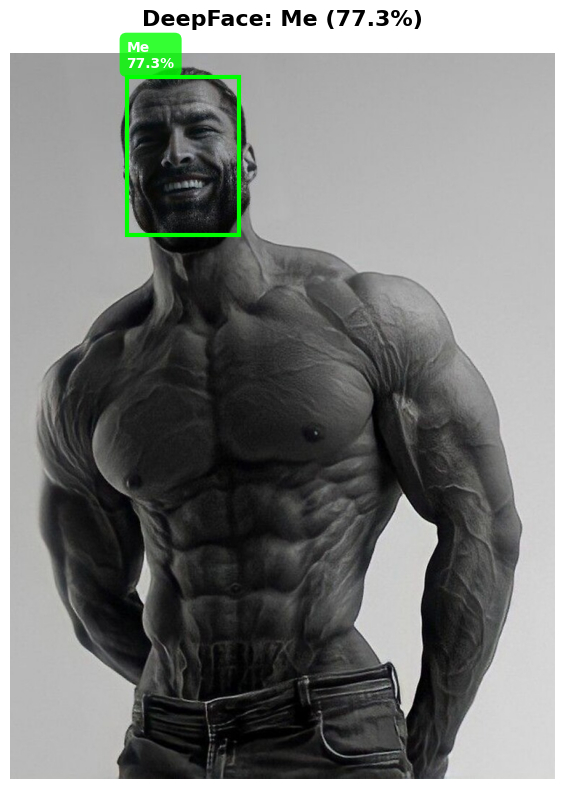


Файл: Ali_test.jpg
Знайдено облич: 1

Обличчя #1:
Rank   Name                      Confidence   Distance  
------------------------------------------------------------
#1    Muhammad_Ali                80.53%      0.1947
#2    Mike_Tyson                  60.66%      0.3934
#3    Mike_Myers                  38.70%      0.6130

ЧАС ОБРОБКИ:
  - Детекція облич:    111.6 ms
  - Розпізнавання:     339.4 ms
  - Загальний час:     460.3 ms


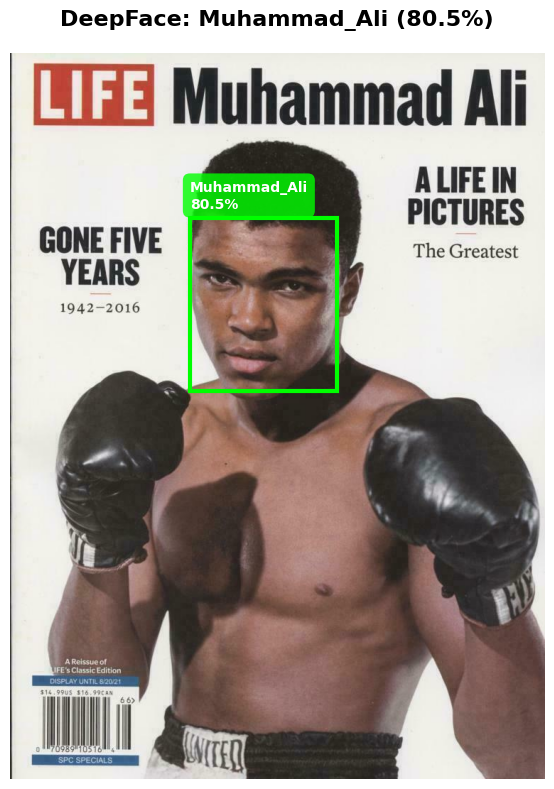


Файл: Tyson_test.jpg
Знайдено облич: 2 (обробляється тільки найбільше)

Обличчя #1:
Rank   Name                      Confidence   Distance  
------------------------------------------------------------
#1    Mike_Tyson                  63.77%      0.3623
#2    Muhammad_Ali                45.34%      0.5466
#3    Me                          40.14%      0.5986

ЧАС ОБРОБКИ:
  - Детекція облич:    109.1 ms
  - Розпізнавання:     350.3 ms
  - Загальний час:     470.6 ms


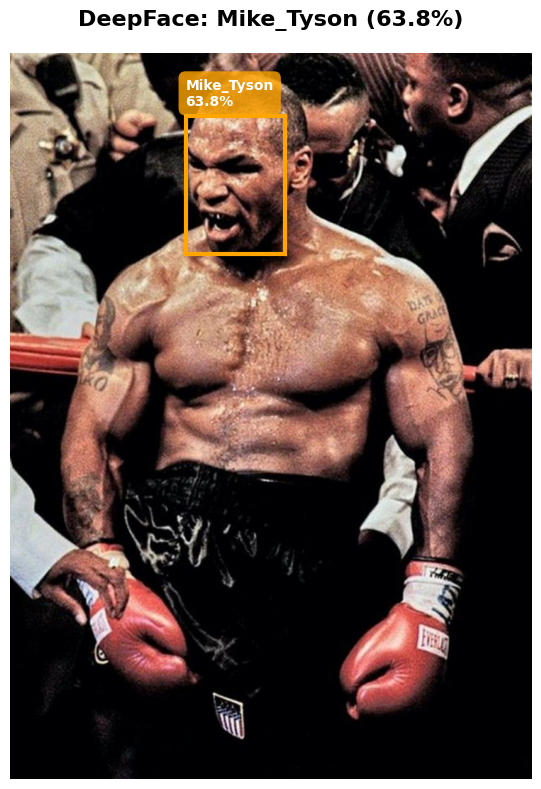


Файл: VV_IK-23_test.jpg
Знайдено облич: 1

Обличчя #1:
Rank   Name                      Confidence   Distance  
------------------------------------------------------------
#1    Vitaliy_Volnushkin_IK-23    79.73%      0.2027
#2    Me                          49.35%      0.5065
#3    Muhammad_Ali                38.84%      0.6116

ЧАС ОБРОБКИ:
  - Детекція облич:    161.7 ms
  - Розпізнавання:     454.8 ms
  - Загальний час:     634.2 ms


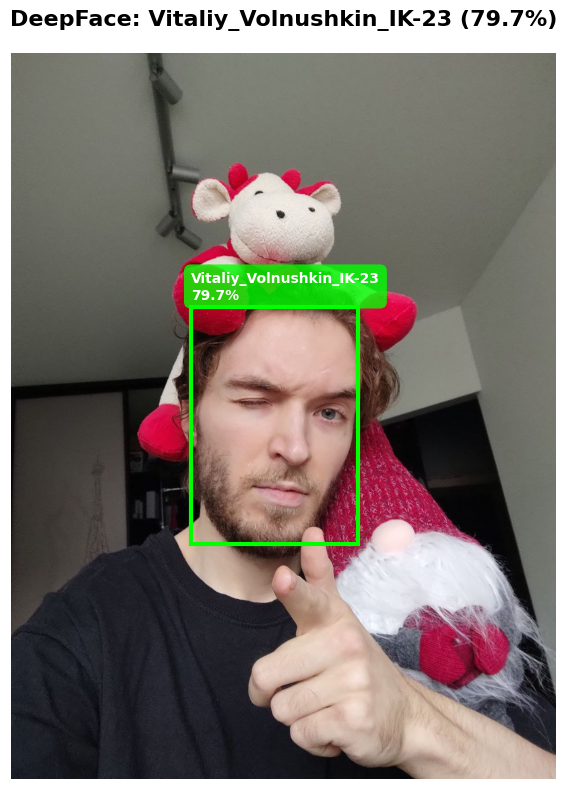


Файл: VV1_IK-23_test.jpg
Знайдено облич: 1

Обличчя #1:
Rank   Name                      Confidence   Distance  
------------------------------------------------------------
#1    Vitaliy_Volnushkin_IK-23    85.37%      0.1463
#2    Vincent_Gallo               42.75%      0.5725
#3    Me                          35.79%      0.6421

ЧАС ОБРОБКИ:
  - Детекція облич:    406.0 ms
  - Розпізнавання:     690.9 ms
  - Загальний час:     1121.8 ms


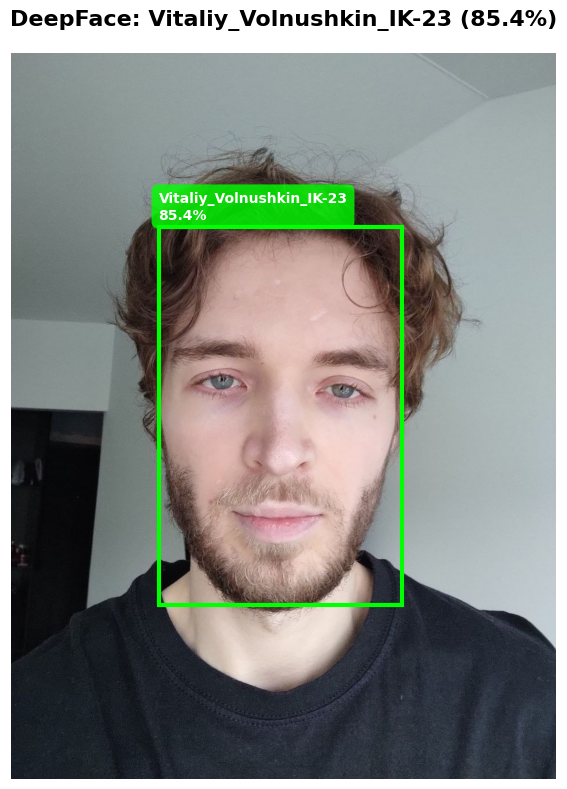

In [21]:
deepface_of_mine2 = FaceRecognitionDeepFace("Facenet512", "ssd")
deepface_of_mine2.create_database("datasetik_of_mine")
results_deepface_of_mine2 = deepface_of_mine2.recognize(["me_test.jpg", "Ali_test.jpg", "Tyson_test.jpg", "VV_IK-23_test.jpg", "VV1_IK-23_test.jpg"])

Ініціалізація InsightFace (buffalo_l)...
Applied providers: ['CUDAExecutionProvider', 'CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}, 'CUDAExecutionProvider': {'sdpa_kernel': '0', 'use_tf32': '1', 'fuse_conv_bias': '0', 'prefer_nhwc': '0', 'tunable_op_max_tuning_duration_ms': '0', 'enable_skip_layer_norm_strict_mode': '0', 'tunable_op_tuning_enable': '0', 'tunable_op_enable': '0', 'use_ep_level_unified_stream': '0', 'device_id': '0', 'has_user_compute_stream': '0', 'gpu_external_empty_cache': '0', 'cudnn_conv_algo_search': 'EXHAUSTIVE', 'cudnn_conv1d_pad_to_nc1d': '0', 'gpu_mem_limit': '18446744073709551615', 'gpu_external_alloc': '0', 'gpu_external_free': '0', 'arena_extend_strategy': 'kNextPowerOfTwo', 'do_copy_in_default_stream': '1', 'enable_cuda_graph': '0', 'user_compute_stream': '0', 'cudnn_conv_use_max_workspace': '1'}}
find model: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CUDAExecutionP

  Monica_Lewinsky: 3 embeddings


  Marie-Josee_Croze: 1 embeddings


  Michelle_Lecky: 1 embeddings


  Wei_Wu: 1 embeddings


  Martha_Sahagun_de_Fox: 1 embeddings


  Ornella_Muti: 1 embeddings


  Norman_Mineta: 1 embeddings


  Michael_Killeen: 1 embeddings


  Pat_Burns: 2 embeddings


  Vanessa_Williams: 3 embeddings


  Mahathir_Mohamad: 14 embeddings


  Keanu_Reeves: 12 embeddings


  Mireya_Moscoso: 5 embeddings


  Vitaliy_Volnushkin_IK-23: 3 embeddings


  Michael_Schumacher: 18 embeddings


  Vicente_Fox: 32 embeddings


  Mike_Tyson: 12 embeddings


  Oscar_De_La_Hoya: 7 embeddings


  Mark_Butcher: 1 embeddings


  Mahmoud_Abbas: 29 embeddings


  Me: 12 embeddings


  Nestor_Kirchner: 37 embeddings


  Whoopi_Goldberg: 1 embeddings


  Nicole_Kidman: 19 embeddings


  Muhammad_Ali: 17 embeddings


  Mohamed_Benaissa: 2 embeddings


  Werner_Schlager: 1 embeddings


  Patricia_Medina: 1 embeddings


  Mickey_Rooney: 1 embeddings


  Valery_Giscard_dEstaing: 6 embeddings


  Patrice_Chereau: 2 embeddings


  Mike_Myers: 7 embeddings


  Wang_Nan: 1 embeddings


  Tony_Elias: 1 embeddings


  Mel_Brooks: 2 embeddings


  Wanda_de_la_Jesus: 1 embeddings


  Vincent_Gallo: 3 embeddings


  Michael_Bloomberg: 20 embeddings


  Meryl_Streep: 15 embeddings


  Paul_McCartney: 7 embeddings


  Nan_Wang: 4 embeddings


  Patty_Schnyder: 4 embeddings


  Tommy_Franks: 16 embeddings


  Valentina_Cervi: 1 embeddings


  Miguel_Contreras: 2 embeddings


  Tora_Takagi: 1 embeddings


  Mary_Matalin: 1 embeddings

База даних створена:
  - Осіб: 47
  - Embeddings: 333
  - Успішно оброблено: 333
  - Невдалих: 0

Компіляція бази даних...
Використано GPU прискорення (CuPy)
База скомпільована: матриця (333, 512)
  - Загальна кількість embeddings: 333
  - Розмір в пам'яті: ~0.7 MB
  - Час створення+компіляції бази: 12.4сек
  - Швидкість: 26.8 embeddings/сек

Файл: me_test.jpg
Знайдено облич: 1

Обличчя #1:
Rank   Name                      Confidence   Distance  
------------------------------------------------------------
#1    Me                          60.41%      0.3959
#2    Michael_Schumacher          16.39%      0.8361
#3    Oscar_De_La_Hoya            13.93%      0.8607

ЧАС ОБРОБКИ:
  - Детекція облич:    21.6 ms
  - Розпізнавання:     0.6 ms
  - Загальний час:     33.2 ms


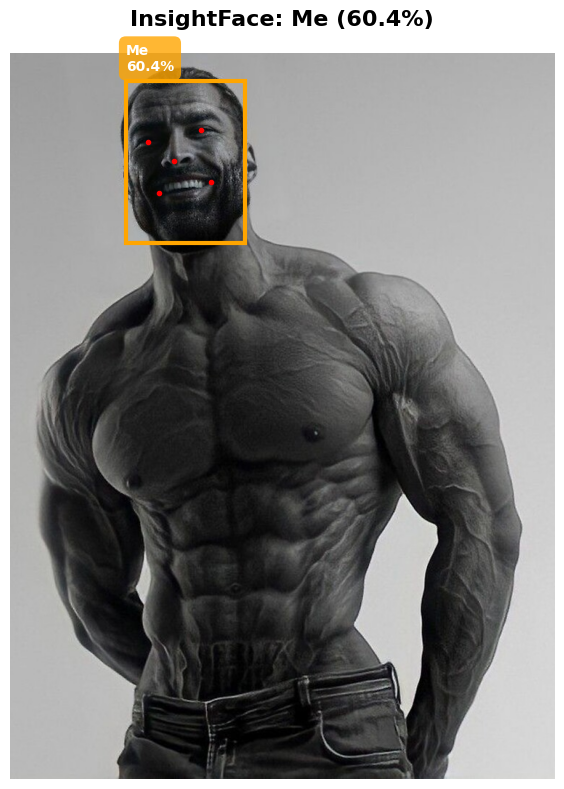


Файл: Ali_test.jpg
Знайдено облич: 1

Обличчя #1:
Rank   Name                      Confidence   Distance  
------------------------------------------------------------
#1    Muhammad_Ali                75.15%      0.2485
#2    Oscar_De_La_Hoya            17.66%      0.8234
#3    Tony_Elias                  14.63%      0.8537

ЧАС ОБРОБКИ:
  - Детекція облич:    25.6 ms
  - Розпізнавання:     0.6 ms
  - Загальний час:     36.9 ms


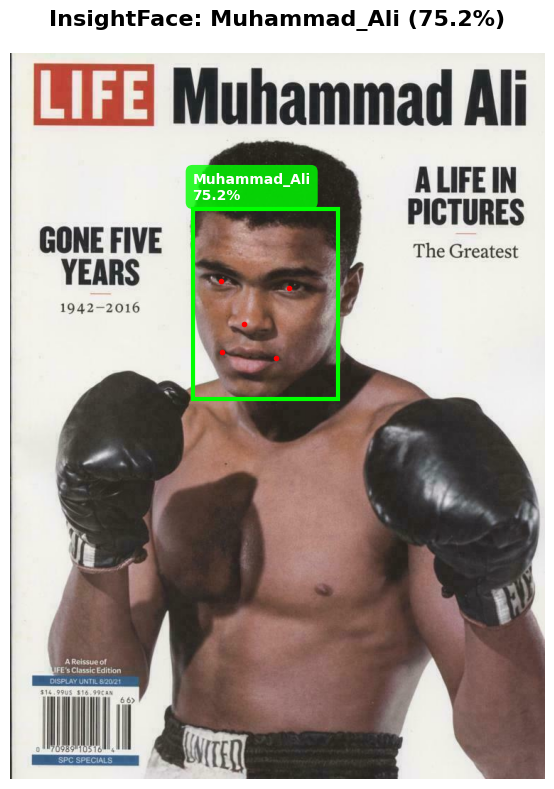


Файл: Tyson_test.jpg
Знайдено облич: 3 (обробляється тільки найбільше)

Обличчя #1:
Rank   Name                      Confidence   Distance  
------------------------------------------------------------
#1    Mike_Tyson                  63.68%      0.3632
#2    Muhammad_Ali                20.86%      0.7914
#3    Nestor_Kirchner             13.27%      0.8673

ЧАС ОБРОБКИ:
  - Детекція облич:    69.6 ms
  - Розпізнавання:     0.7 ms
  - Загальний час:     82.8 ms


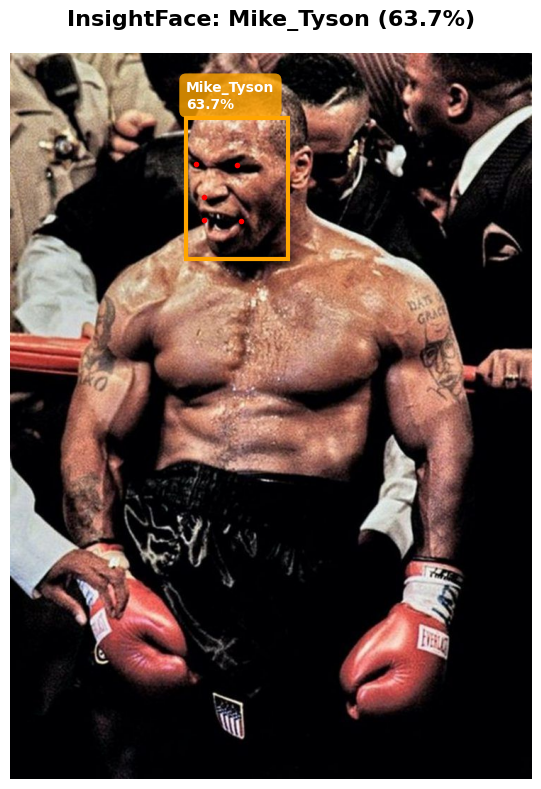


Файл: VV_IK-23_test.jpg
Знайдено облич: 1

Обличчя #1:
Rank   Name                      Confidence   Distance  
------------------------------------------------------------
#1    Vitaliy_Volnushkin_IK-23    76.73%      0.2327
#2    Vincent_Gallo               18.43%      0.8157
#3    Me                          16.66%      0.8334

ЧАС ОБРОБКИ:
  - Детекція облич:    27.4 ms
  - Розпізнавання:     0.7 ms
  - Загальний час:     48.2 ms


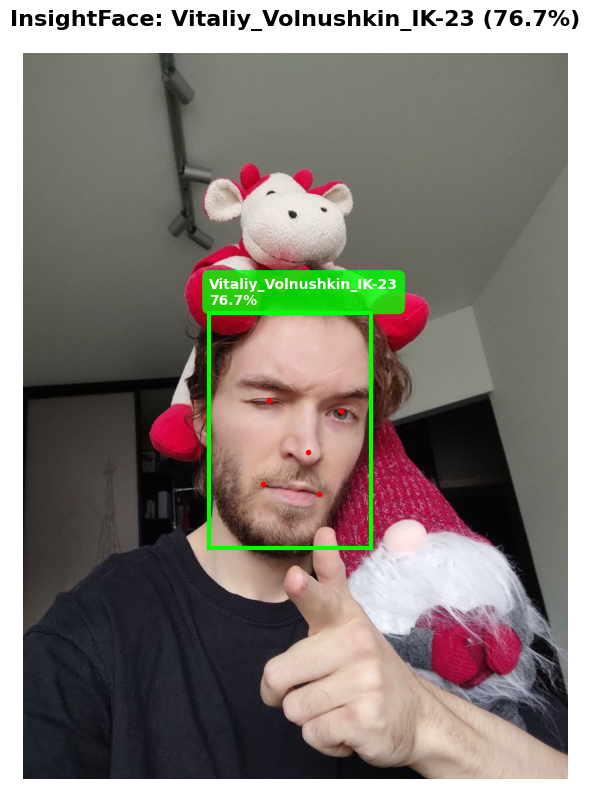


Файл: VV1_IK-23_test.jpg
Знайдено облич: 1

Обличчя #1:
Rank   Name                      Confidence   Distance  
------------------------------------------------------------
#1    Vitaliy_Volnushkin_IK-23    85.19%      0.1481
#2    Vincent_Gallo               19.82%      0.8018
#3    Oscar_De_La_Hoya            16.66%      0.8334

ЧАС ОБРОБКИ:
  - Детекція облич:    25.8 ms
  - Розпізнавання:     0.6 ms
  - Загальний час:     47.1 ms


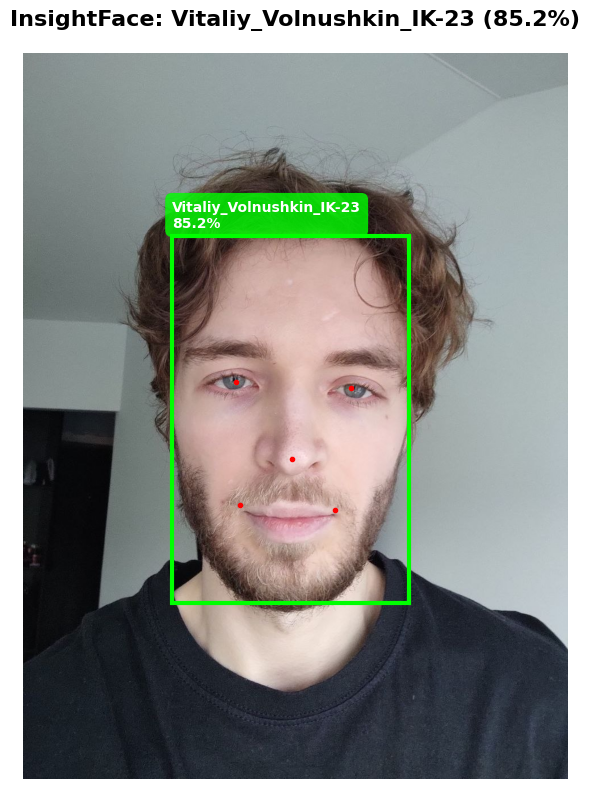

In [22]:
insight_of_mine2 = FaceRecognitionInsightFace('buffalo_l')
insight_of_mine2.create_database("datasetik_of_mine")
results_insight_of_mine2 = insight_of_mine2.recognize(["me_test.jpg", "Ali_test.jpg", "Tyson_test.jpg", "VV_IK-23_test.jpg", "VV1_IK-23_test.jpg"])

In [49]:
# INSIGHTFACE
insight_full = FaceRecognitionInsightFace('buffalo_l')
insight_full.create_database("lfw_80-20/train/")


Ініціалізація InsightFace (buffalo_l)...
Applied providers: ['CUDAExecutionProvider', 'CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}, 'CUDAExecutionProvider': {'sdpa_kernel': '0', 'use_tf32': '1', 'fuse_conv_bias': '0', 'prefer_nhwc': '0', 'tunable_op_max_tuning_duration_ms': '0', 'enable_skip_layer_norm_strict_mode': '0', 'tunable_op_tuning_enable': '0', 'tunable_op_enable': '0', 'use_ep_level_unified_stream': '0', 'device_id': '0', 'has_user_compute_stream': '0', 'gpu_external_empty_cache': '0', 'cudnn_conv_algo_search': 'EXHAUSTIVE', 'cudnn_conv1d_pad_to_nc1d': '0', 'gpu_mem_limit': '18446744073709551615', 'gpu_external_alloc': '0', 'gpu_external_free': '0', 'arena_extend_strategy': 'kNextPowerOfTwo', 'do_copy_in_default_stream': '1', 'enable_cuda_graph': '0', 'user_compute_stream': '0', 'cudnn_conv_use_max_workspace': '1'}}
find model: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CUDAExecutionP

  David_Tornberg: 1 embeddings


  Franz_Muentefering: 2 embeddings


  James_Kopp: 4 embeddings


  Scott_McClellan: 4 embeddings


  Arantxa_Sanchez-Vicario: 1 embeddings


  Javier_Zanetti: 1 embeddings


  Jesper_Parnevik: 1 embeddings


  Kristin_Chenoweth: 1 embeddings


  Maria_Burks: 1 embeddings


  Sylvie_Guillem: 1 embeddings


  Robert_Pollack: 1 embeddings


  Kobe_Bryant: 2 embeddings


  Alejandro_Atchugarry: 1 embeddings


  Chen_Liang_Yu: 1 embeddings


  Steve_Lavin: 4 embeddings


  Keith_Olbermann: 1 embeddings


  Gonzalo_Barrientos: 1 embeddings


  Robert_Lange: 1 embeddings


  Lon_Kruger: 2 embeddings


  John_McKay: 1 embeddings


  Dick_Devine: 1 embeddings


  Ray_Liotta: 1 embeddings


  Joe_Carnahan: 1 embeddings


  Carlos_De_Abreu: 1 embeddings


  Jennette_Bradley: 1 embeddings


  Daniel_Darnell: 1 embeddings


  Luis_Gonzalez: 1 embeddings


  Nikki_Teasley: 1 embeddings


  Paul_Farley: 1 embeddings


  Frank_Solich: 4 embeddings


  Tom_Osborne: 1 embeddings


  Jason_Jennings: 2 embeddings


  Roger_Lyons: 1 embeddings


  Abdel_Madi_Shabneh: 1 embeddings


  Edward_Seaga: 1 embeddings


  Mahmoud_Diyab_al-Ahmed: 1 embeddings


  Ricardo_Mayorga: 1 embeddings


  Bill_Sizemore: 1 embeddings


  Mitt_Romney: 1 embeddings


  Naomi_Watts: 17 embeddings


  Ion_Iliescu: 1 embeddings


  Milo_Maestrecampo: 3 embeddings


  Victor_Kraatz: 1 embeddings


  Alex_Sink: 3 embeddings


  Monica_Lewinsky: 3 embeddings


  Ben_Broussard: 1 embeddings


  Richard_Palmer: 1 embeddings


  Richard_Virenque: 6 embeddings


  Bob_Colvin: 1 embeddings


  Paul_Gascoigne: 2 embeddings


  Venus_Williams: 13 embeddings


  Emma_Watson: 4 embeddings


  Cynthia_Nixon: 1 embeddings


  Patricia_Garone: 1 embeddings


  Gina_Torres: 1 embeddings


  Phillip_Fulmer: 1 embeddings


  Ernie_Els: 3 embeddings


  Jose_Rosado: 1 embeddings


  Peter_Holmberg: 1 embeddings


  Rick_Dinse: 1 embeddings


  Tanya_Lindenmuth: 1 embeddings


  Allen_Rock: 1 embeddings


  Debra_Yang: 1 embeddings


  Sadam_Hassan: 1 embeddings


  Sandra_Banning: 1 embeddings


  Evander_Holyfield: 1 embeddings


  Jamie_Carey: 1 embeddings


  Cathy_Freeman: 1 embeddings


  Teresa_Graves: 1 embeddings


  Kelly_Santos: 1 embeddings


  Yasser_Arafat: 6 embeddings


  Ahmet_Demir: 1 embeddings


  Marc_Anthony: 1 embeddings


  Branko_Crvenkovski: 3 embeddings


  Marsah_Ambrosius: 1 embeddings


  Christian_Fittipaldi: 1 embeddings


  Ilan_Ramon: 2 embeddings


  Goldie_Hawn: 5 embeddings


  Isabelle_Huppert: 2 embeddings


  Mladen_Naletilic: 1 embeddings


  Slobodan_Milosevic: 4 embeddings


  Patrick_Bourrat: 1 embeddings


  Ronald_Kessler: 1 embeddings


  Katie_Couric: 1 embeddings


  Juanes: 2 embeddings


  Felix_Trinidad: 1 embeddings


  Alvaro_Uribe: 28 embeddings


  Mohammed_Salmane: 1 embeddings


  Erika_Christensen: 2 embeddings


  Alex_Wallau: 1 embeddings


  Paula_Dobriansky: 1 embeddings


  Jody_Richards: 1 embeddings


  Asa_Hutchinson: 2 embeddings


  Mike_Babcock: 2 embeddings


  Se_Hyuk_Joo: 1 embeddings


  Alex_Cejka: 1 embeddings


  Jason_Alexander: 2 embeddings


  Manfred_Reyes_Villa: 1 embeddings


  Dino_de_Laurentis: 1 embeddings


  Klaus_Zwickel: 1 embeddings


  Calvin_Joseph_Coleman: 1 embeddings


  Fujio_Mitarai: 1 embeddings


  Brad_Russ: 1 embeddings


  Oliver_Stone: 1 embeddings


  Ibrahim_Al-Marashi: 1 embeddings


  Jonathan_Schroeder: 1 embeddings


  Phil_Gramm: 2 embeddings


  Lenny_Kravitz: 1 embeddings


  Mick_McCarthy: 1 embeddings


  Eduard_Shevardnadze: 4 embeddings


  Van_Hilley: 1 embeddings


  Rohinton_Mistry: 1 embeddings


  Jane_Kaczmarek: 2 embeddings


  Kathy_Bates: 1 embeddings


  Kim_Su_Nam: 1 embeddings


  James_Watt: 1 embeddings


  Mike_Maroth: 1 embeddings


  Monica_Bellucci: 4 embeddings


  Dorothy_Lamour: 1 embeddings


  Marie-Josee_Croze: 1 embeddings


  Sereyvuth_Kem: 1 embeddings


  Herb_Brooks: 1 embeddings


  Jack_Nicholson: 3 embeddings


  Troy_Hudson: 1 embeddings


  Robbie_Coltrane: 1 embeddings


  Goran_Persson: 1 embeddings


  Sean_Penn: 3 embeddings


  Tom_Amstutz: 1 embeddings


  Donald_Carty: 1 embeddings


  Zoran_Djindjic: 2 embeddings


  Carolyn_Dawn_Johnson: 2 embeddings


  Bill_Rainer: 1 embeddings


  Jim_Ahern: 1 embeddings


  Joe_Mantegna: 1 embeddings


  Al_Leiter: 1 embeddings


  Rick_Lu: 1 embeddings


  Doug_Collins: 2 embeddings


  Brendan_Hansen: 1 embeddings


  Queen_Latifah: 3 embeddings


  Donna_Shalala: 2 embeddings


  Li_Peng: 7 embeddings


  Greg_Frers: 1 embeddings


  David_Coulthard: 1 embeddings


  Andre_Lange: 1 embeddings


  Bashar_Assad: 1 embeddings


  Ivan_Lee: 1 embeddings


  Brian_Kerr: 1 embeddings


  Chuck_Bednarik: 1 embeddings


  Carlos_Iturgaitz: 1 embeddings


  Art_Hoffmann: 2 embeddings


  Hank_Stram: 1 embeddings


  Chris_Klein: 1 embeddings


  Peter_Greenspun: 1 embeddings


  Andrew_Firestone: 1 embeddings


  Ron_Howard: 1 embeddings


  Paul_Coppin: 1 embeddings


  Martin_Lawrence: 1 embeddings


  Miles_Stewart: 1 embeddings


  Gunter_Pleuger: 5 embeddings


  Patricia_Heaton: 2 embeddings


  Derek_Jeter: 3 embeddings


  Michelle_Branch: 1 embeddings


  Mikhail_Wehbe: 2 embeddings


  Danny_Elfman: 1 embeddings


  Adam_Herbert: 1 embeddings


  Carlos_Ruckauf: 1 embeddings


  Dave_Potter: 1 embeddings


  Gene_Hackman: 1 embeddings


  John_Fox: 1 embeddings


  Craig_David: 1 embeddings


  Deece_Eckstein: 1 embeddings


  Natanaela_Barnova: 1 embeddings


  Dyab_Abou_Jahjah: 1 embeddings


  Mary_Hill: 1 embeddings


  Bernard_Ebbers: 1 embeddings


  Davey_Johnson: 1 embeddings


  Edie_Falco: 1 embeddings


  Denys_Arcand: 1 embeddings


  William_Ford_Jr: 5 embeddings


  Pete_Beaudrault: 1 embeddings


  Adrian_Annus: 1 embeddings


  John_Velazquez: 1 embeddings


  Jason_Statham: 1 embeddings


  Roy_Romanow: 1 embeddings


  Larry_Pleau: 1 embeddings


  Gregg_Berhalter: 1 embeddings


  Joan_Collins: 1 embeddings


  Taufik_Kiemas: 1 embeddings


  Michael_Lopez-Alegria: 1 embeddings


  Michael_Jasny: 1 embeddings


  Walter_Annenberg: 1 embeddings


  Howard_Dean: 9 embeddings


  Goh_Kun: 2 embeddings


  Latrell_Sprewell: 1 embeddings


  Stanley_Ho: 1 embeddings


  Julio_De_Brun: 1 embeddings


  John_Kerry: 13 embeddings


  Zydrunas_Ilgauskas: 1 embeddings


  Ann_Landers: 1 embeddings


  Odai_Hussein: 1 embeddings


  Harold_Brown: 1 embeddings


  Andy_Rooney: 1 embeddings


  Madeleine_Albright: 2 embeddings


  Monica_Gabrielle: 1 embeddings


  Franz_Beckenbauer: 1 embeddings


  Ismail_Khan: 1 embeddings


  Lesia_Burlak: 1 embeddings


  Anders_Ebbeson: 3 embeddings


  Frank_Beamer: 1 embeddings


  Bruce_Lunsford: 1 embeddings


  Roberto_Carlos: 4 embeddings


  Alexis_Bledel: 1 embeddings


  Mitzi_Gaynor: 1 embeddings


  Delphine_Chuillot: 1 embeddings


  Stan_Kroenke: 1 embeddings


  Paddy_Torsney: 1 embeddings


  Khatol_Mohammad_Zai: 1 embeddings


  Morris_Watts: 1 embeddings


  Luke_Ridnour: 1 embeddings


  Stefano_Accorsi: 2 embeddings


  Yoon_Jeong_Cho: 1 embeddings


  Anthony_Rackauckas: 1 embeddings


  Michelle_Yeoh: 4 embeddings


  Dan_Wheldon: 2 embeddings


  Lene_Espersen: 1 embeddings


  Emile_Lahoud: 2 embeddings


  Henry_Suazo: 1 embeddings


  Joanna_Poitier: 1 embeddings


  Jens_Lehmann: 1 embeddings


  Koichi_Tanaka: 1 embeddings


  Jennifer_Keller: 4 embeddings


  Costas_Simitis: 4 embeddings


  Hayley_Tullett: 2 embeddings


  Dan_Ackroyd: 1 embeddings


  Johnnie_Lynn: 1 embeddings


  Atsushi_Sato: 1 embeddings


  Patrick_Rafter: 1 embeddings


  John_Geoghan: 1 embeddings


  Svetlana_Belousova: 1 embeddings


  Jesse_Helms: 1 embeddings


  Derek_Bond: 1 embeddings


  Manuel_Jesus: 1 embeddings


  Chok_Tong_Goh: 1 embeddings


  Mathilda_Karel_Spak: 1 embeddings


  Teri_Files: 1 embeddings


  Andrew_Weissmann: 2 embeddings


  Ximena_Bohorquez: 1 embeddings


  Darin_Erstad: 1 embeddings


  Benito_Santiago: 1 embeddings


  Chris_Rock: 2 embeddings


  Robert_Blake: 6 embeddings


  Jan_Petersen: 1 embeddings


  Ahmed_Lopez: 1 embeddings


  Jimmy_Szymanski: 1 embeddings


  Eriko_Tamura: 1 embeddings


  Julian_Fantino: 1 embeddings


  Skip_Prosser: 1 embeddings


  Prince_Edward: 2 embeddings


  Pascal_Lamy: 2 embeddings


  Kai-Uwe_Ricke: 1 embeddings


  Jeffrey_Scott_Postell: 2 embeddings


  Nora_Bendijo: 1 embeddings


  Eric_Daze: 1 embeddings


  Jean-David_Levitte: 8 embeddings


  Mike_Farrar: 1 embeddings


  Paul_Johnson: 1 embeddings


  Michael_Goldrich: 1 embeddings


  Frank_Griswold: 1 embeddings


  Azra_Akin: 3 embeddings


  Gwyneth_Paltrow: 4 embeddings


  Fabricio_Oberto: 1 embeddings


  Ivan_Helguera: 1 embeddings


  Elgin_Baylor: 1 embeddings


  Asif_Hanif: 1 embeddings


  Compay_Segundo: 1 embeddings


  Leon_Silver: 1 embeddings


  Anzori_Kikalishvili: 1 embeddings


  Brian_Weaver: 1 embeddings


  Charlie_Hunnam: 1 embeddings


  Edward_Said: 2 embeddings


  Curt_Weldon: 1 embeddings


  Mack_Brown: 2 embeddings


  Takashi_Yamamoto: 1 embeddings


  Drew_Barrymore: 2 embeddings


  Nigel_Redden: 1 embeddings


  Della_Clara: 1 embeddings


  Jonathan_Byrd: 1 embeddings


  Erin_Hershey_Presley: 1 embeddings


  Joaquin_Sanchez: 1 embeddings


  Toby_Keith: 1 embeddings


  Ruth_Pearce: 1 embeddings


  Marquis_Estill: 1 embeddings


  Deena_Burnett: 1 embeddings


  Rowan_Williams: 1 embeddings


  Pauley_Perrette: 1 embeddings


  Keith_Urban: 1 embeddings


  Fazal-ur-Rehman: 1 embeddings


  Tina_Pisnik: 1 embeddings


  Billy_Boyd: 1 embeddings


  Prospero_Pichay: 1 embeddings


  Paul_Bremer: 16 embeddings


  Robin_Tunney: 1 embeddings


  Javier_Vazquez: 1 embeddings


  Eddy_Merckx: 1 embeddings


  Khalid_Khannouchi: 1 embeddings


  Aicha_El_Ouafi: 3 embeddings


  Camille_Colvin: 1 embeddings


  Kim_Dae-jung: 6 embeddings


  Dan_Boyle: 1 embeddings


  Franklin_Damann: 1 embeddings


  Eric_Hinske: 2 embeddings


  Duane_Barber: 1 embeddings


  Glen_DaSilva: 1 embeddings


  Jim_Beattie: 1 embeddings


  Angel_Lockward: 1 embeddings


  Otto_Schily: 1 embeddings


  Kelli_White: 2 embeddings


  Alfredo_di_Stefano: 1 embeddings


  Tiger_Woods: 18 embeddings


  Abdulaziz_Kamilov: 1 embeddings


  Kathryn_Tucker: 1 embeddings


  Jim_OBrien: 2 embeddings


  Gary_Bettman: 1 embeddings


  Gerry_Parsky: 2 embeddings


  William_Hyde: 1 embeddings


  Karol_Kucera: 1 embeddings


  Donna_Barrera: 1 embeddings


  Aleksander_Kwasniewski: 4 embeddings


  Bruno_Junquiera: 1 embeddings


  Elizabeth_Dole: 4 embeddings


  Hartmut_Mehdorn: 1 embeddings


  Larry_Thompson: 4 embeddings


  Sylvester_Stallone: 7 embeddings


  Islam_Karimov: 1 embeddings


  John_Rowland: 1 embeddings


  Frank_Shea: 1 embeddings


  Emelie_Loit: 1 embeddings


  Spike_Lee: 1 embeddings


  Thomas_Haeggstroem: 1 embeddings


  Ahmed_Ahmed: 1 embeddings


  Gina_Gershon: 1 embeddings


  Hermogenes_Ebdane_Jr: 1 embeddings


  Bruna_Colosio: 1 embeddings


  Alicia_Keys: 1 embeddings


  Mariangel_Ruiz_Torrealba: 3 embeddings


  Prince_Charles: 4 embeddings


  Anatoliy_Kinakh: 1 embeddings


  Julie_Infante: 1 embeddings


  Jack_Valenti: 1 embeddings


  Hugh_Carey: 1 embeddings


  Hal_Sellers: 1 embeddings


  Queen_Silvia: 1 embeddings


  Holly_Robinson_Peete: 1 embeddings


  Owen_Nolan: 1 embeddings


  John_Philip_Elkann: 1 embeddings


  Gore_Vidal: 1 embeddings


  Lois_Smart: 1 embeddings


  Camilla_Parker_Bowles: 2 embeddings


  Kamal_Kharrazi: 4 embeddings


  Shingo_Suetsugu: 1 embeddings


  Liliana_Cavani: 1 embeddings


  Lily_Safra: 1 embeddings


  Eliott_Spitzer: 1 embeddings


  Thor_Pedersen: 1 embeddings


  Frank_Dunham_Jr: 2 embeddings


  Marianne_Stanley: 1 embeddings


  Lyle_Vanclief: 1 embeddings


  Stacey_Dales-Schuman: 1 embeddings


  San_Lan: 1 embeddings


  Mike_Montgomery: 2 embeddings


  Joanne_Duquette: 1 embeddings


  Guillermo_Ortiz: 2 embeddings


  Albrecht_Mentz: 2 embeddings


  Vassilis_Xiros: 1 embeddings


  Pedro_Duque: 1 embeddings


  Gustavo_Franco: 1 embeddings


  Amram_Mitzna: 2 embeddings


  Queen_Sofia: 1 embeddings


  Jamie_Cooke: 1 embeddings


  Paul_Kariya: 1 embeddings


  Michelle_Lecky: 1 embeddings


  John_Wayne: 1 embeddings


  Bilal_Erdogan: 1 embeddings


  Monique_Ferreira: 1 embeddings


  Sarah_Jessica_Parker: 4 embeddings


  Alanis_Morissette: 1 embeddings


  Tommy_Lewis: 1 embeddings


  Ciaran_Hinds: 1 embeddings


  Odilia_Collazo: 1 embeddings


  Erika_Harold: 4 embeddings


  Keith_Bogans: 3 embeddings


  Mauricio_Macri: 1 embeddings


  Matt_Braker: 1 embeddings


  T_Boone_Pickens: 1 embeddings


  Carlos_Queiroz: 1 embeddings


  Wei_Wu: 1 embeddings


  John_Darby: 1 embeddings


  Bison_Dele: 1 embeddings


  Milan_Milutinovic: 1 embeddings


  OJ_Simpson: 2 embeddings


  Elena_de_Chavez: 1 embeddings


  Sergio_Castellitto: 1 embeddings


  Paul_Walker: 1 embeddings


  Irv_Nathan: 1 embeddings


  Antonio_Cassano: 1 embeddings


  Stephanie_Cohen_Aloro: 1 embeddings


  Stephen_Ebberharter: 1 embeddings


  William_Pryor_Jr: 1 embeddings


  Bob_Hope: 6 embeddings


  Guillaume_Soro: 2 embeddings


  Claire_Tomalin: 1 embeddings


  Damarius_Bilbo: 1 embeddings


  Ricardo_Sanchez: 4 embeddings


  Hugo_Conte: 1 embeddings


  Muwafak_al-Ani: 1 embeddings


  Brian_Grazier: 1 embeddings


  Rudi_Voeller: 1 embeddings


  Halle_Berry: 12 embeddings


  Guillermo_Canas: 3 embeddings


  Kevin_Gil: 1 embeddings


  Robert_Altman: 1 embeddings


  Lee_Hyung-taik: 1 embeddings


  Bonnie_Hunt: 1 embeddings


  Robin_Johansen: 1 embeddings


  Jim_Fassel: 1 embeddings


  Paul_Burrell: 8 embeddings


  Jesus_Cardenal: 1 embeddings


  Tom_Craddick: 3 embeddings


  Tim_Salmon: 1 embeddings


  Mickey_Gilley: 1 embeddings


  Flavia_Pennetta: 1 embeddings


  Brian_Florence: 1 embeddings


  Martin_Luther_King_III: 1 embeddings


  Brandon_Lloyd: 1 embeddings


  Ronaldo_Luis_Nazario_de_Lima: 4 embeddings


  Martha_Sahagun_de_Fox: 1 embeddings


  Joan_Jett: 1 embeddings


  Angelo_Reyes: 3 embeddings


  Michelle_Bachelet: 1 embeddings


  Debra_Messing: 3 embeddings


  Mario_Dominguez: 1 embeddings


  Norm_Coleman: 5 embeddings


  Jim_Ryan: 1 embeddings


  Craig_Doblin: 1 embeddings


  Stefano_Gabbana: 1 embeddings


  Jim_Sterk: 1 embeddings


  Gael_Garcia_Bermal: 1 embeddings


  Phil_Morris: 1 embeddings


  David_Hyde_Pierce: 3 embeddings


  Larry_Campbell: 1 embeddings


  Jane_Leeves: 1 embeddings


  Barry_Ford: 1 embeddings


  Mike_Matheny: 1 embeddings


  Lorne_Michaels: 1 embeddings


  Markus_Naslund: 2 embeddings


  Bronson_Arroyo: 1 embeddings


  Felipe_De_Borbon: 1 embeddings


  Jorge_Valdano: 1 embeddings


  Jim_Otto: 1 embeddings


  Adam_Sandler: 2 embeddings


  Billy_Edelin: 1 embeddings


  Thierry_Falise: 3 embeddings


  David_Duke: 1 embeddings


  Kevin_Hearn: 1 embeddings


  Marco_Archer_Cardoso_Moreira: 1 embeddings


  JK_Rowling: 4 embeddings


  Karl-Heinz_Rummenigge: 1 embeddings


  Rachel_Wadsworth: 1 embeddings


  Baburam_Bhattari: 1 embeddings


  James_Layug: 1 embeddings


  Tamika_Catchings: 1 embeddings


  Hee-Won_Han: 2 embeddings


  Wayne_Gretzky: 4 embeddings


  Claudio_Ranieri: 1 embeddings


  Shaun_Rusling: 1 embeddings


  John_Anderson: 1 embeddings


  Wilbert_Foy: 1 embeddings


  Rick_Rickert: 1 embeddings


  Phillip_Seymor_Hoffmann: 1 embeddings


  Lachlan_Murdoch: 1 embeddings


  Xiang_Xu: 1 embeddings


  Lucio_Cecchinello: 1 embeddings


  Bill_Duffey: 1 embeddings


  Hamza_Atiya_Muhsen: 1 embeddings


  Nadia_Forte: 1 embeddings


  Jane_Menelaus: 1 embeddings


  Nicolas_Eyzaguirre: 1 embeddings


  Lauren_Hutton: 2 embeddings


  Lorraine_Bracco: 1 embeddings


  Jean_Carnahan: 1 embeddings


  Nick_Rahall: 1 embeddings


  Dwayne_Williams: 1 embeddings


  Peter_Rasch: 1 embeddings


  Ben_Braun: 1 embeddings


  Dominik_Hrbaty: 1 embeddings


  Michel_Duclos: 1 embeddings


  Greg_Kinsey: 1 embeddings


  Christian_Olsson: 1 embeddings


  Stephen_Swindal: 1 embeddings


  John_Stallworth: 2 embeddings


  Carlo_Ancelotti: 3 embeddings


  Bijan_Darvish: 3 embeddings


  Steve_Karsay: 1 embeddings


  Rio_Ferdinand: 2 embeddings


  Himmler_Rebu: 1 embeddings


  Wolfgang_Schwarz: 1 embeddings


  Aldo_Paredes: 1 embeddings


  Corinne_Coman: 2 embeddings


  Jim_Piper: 1 embeddings


  Janice_Abreu: 1 embeddings


  Maria_Shriver: 6 embeddings


  Stella_Keitel: 1 embeddings


  Larry_Donald: 1 embeddings


  Muffet_McGraw: 1 embeddings


  Fred_Wilpon: 1 embeddings


  MC_Hammer: 1 embeddings


  Ana_Isabel_Sanchez: 1 embeddings


  GL_Peiris: 3 embeddings


  Manuel_Poggiali: 2 embeddings


  Marisol_Breton: 1 embeddings


  Arie_Haan: 1 embeddings


  Jim_Freudenberg: 1 embeddings


  Dai_Bachtiar: 2 embeddings


  Steve_Mariucci: 3 embeddings


  Michael_Peat: 1 embeddings


  Mike_Matthews: 1 embeddings


  Colleen_Ryan: 1 embeddings


  Diana_Krall: 4 embeddings


  Bertrand_Bonello: 1 embeddings


  Boris_Henry: 1 embeddings


  Kostya_Tszyu: 1 embeddings


  Travis_Rudolph: 1 embeddings


  Rachel_Roy: 1 embeddings


  Thomas_Manger: 1 embeddings


  Sonia_Lopez: 1 embeddings


  Justine_Pasek: 5 embeddings


  Dennis_Kucinich: 5 embeddings


  Johnny_Depp: 2 embeddings


  Michelle_Collins: 2 embeddings


  Roger_Penske: 1 embeddings


  John_Rusnak: 1 embeddings


  Poala_Suarez: 1 embeddings


  Cindy_Taylor: 1 embeddings


  Walter_Woods: 1 embeddings


  Vicente_Fox_de_la_Concha: 1 embeddings


  Bryant_Young: 1 embeddings


  Eloy_Gutierrez: 1 embeddings


  Toshihiko_Fukui: 2 embeddings


  Luo_Linquan: 1 embeddings


  Chhouk_Rin: 1 embeddings


  Max_Mayfield: 1 embeddings


  Mstislav_Rostropovich: 1 embeddings


  Joe_Pantoliano: 1 embeddings


  Taufik_Hidayat: 2 embeddings


  Cheryl_Little: 1 embeddings


  Sherri_Coale: 1 embeddings


  Robert_Horan: 2 embeddings


  Franco_Frattini: 1 embeddings


  Mark_Sacco: 1 embeddings


  Norah_Jones: 12 embeddings


  John_Snow: 13 embeddings


  Patricia_Phillips: 1 embeddings


  Jim_Talent: 1 embeddings


  John_Abizaid: 7 embeddings


  Christian_Lirette: 1 embeddings


  Dick_Posthumus: 1 embeddings


  Jacques_Kallis: 1 embeddings


  Dexter_Jackson: 2 embeddings


  Brett_Hawke: 1 embeddings


  John_Cornyn: 1 embeddings


  Alessandra_Cerna: 1 embeddings


  Tim_Allen: 3 embeddings


  Mel_Gibson: 1 embeddings


  Geoff_Dixon: 1 embeddings


  Michael_Arif: 1 embeddings


  Dustin_Brown: 1 embeddings


  Mark_Mishkin: 1 embeddings


  Howard_Schultz: 2 embeddings


  Paul_Gannon: 1 embeddings


  James_Kelly: 8 embeddings


  Gwendal_Peizerat: 3 embeddings


  Percy_Gibson: 1 embeddings


  John_Cusack: 2 embeddings


  Tom_Miller: 1 embeddings


  Tommy_Robredo: 3 embeddings


  Fran_Drescher: 2 embeddings


  Shane_Mosley: 1 embeddings


  Gary_Dellaverson: 1 embeddings


  Tyron_Garner: 1 embeddings


  Jenny_Romero: 1 embeddings


  Jiri_Novak: 8 embeddings


  Hal_Gehman: 4 embeddings


  Lutz_Freitag: 1 embeddings


  George_Pataki: 4 embeddings


  Laila_Ali: 1 embeddings


  Roger_Staubach: 1 embeddings


  Andy_North: 1 embeddings


  Michael_Sheehan: 1 embeddings


  Tony_Curtis: 1 embeddings


  Isabela_Moraes: 1 embeddings


  Meles_Zenawi: 1 embeddings


  Michael_Jackson: 9 embeddings


  Kevin_Sorbo: 1 embeddings


  Mariam_Ali_Hassan: 1 embeddings


  Kate_Hudson: 7 embeddings


  Claudette_Robinson: 1 embeddings


  Daniel_Comisso_Urdaneta: 1 embeddings


  Luca_Cordero_di_Montezemolo: 1 embeddings


  Lauren_Killian: 1 embeddings


  Gianna_Angelopoulos-Daskalaki: 3 embeddings


  Dave_Lewis: 1 embeddings


  Wolfgang_Clement: 1 embeddings


  Shingo_Katayama: 1 embeddings


  Arnie_Boehm: 1 embeddings


  William_Shatner: 1 embeddings


  Marco_Antonio_Barrera: 4 embeddings


  Dick_Clark: 2 embeddings


  Angie_Arzola: 1 embeddings


  Orrin_Hatch: 2 embeddings


  Sarah_Hughes: 4 embeddings


  Andrew_Niccol: 1 embeddings


  Theo_Epstein: 1 embeddings


  Richard_Branson: 2 embeddings


  Frank_Van_Ecke: 1 embeddings


  Jan_De_Bont: 1 embeddings


  Stefan_Tafrov: 1 embeddings


  Narayan_Singh_Pun: 1 embeddings


  Harald_Ringstorff: 1 embeddings


  Chip_Knight: 1 embeddings


  Melinda_Czink: 1 embeddings


  Lenny_Wilkens: 1 embeddings


  Gustavo_Terrazas: 1 embeddings


  Victoria_Clarke: 4 embeddings


  Tom_Glavine: 1 embeddings


  Mikhail_Gorbachev: 1 embeddings


  Amy_Cotton: 1 embeddings


  Rachel_Leigh_Cook: 1 embeddings


  Kurt_Warner: 4 embeddings


  Mukesh_Ambani: 1 embeddings


  Mark_Warner: 2 embeddings


  Choi_Yun-yong: 1 embeddings


  Chris_Tucker: 2 embeddings


  Betty_Williams: 1 embeddings


  Omar_Sharif: 2 embeddings


  Ornella_Muti: 1 embeddings


  James_Becker: 1 embeddings


  Hiroki_Gomi: 1 embeddings


  Mike_Smith: 1 embeddings


  Mohammad_Khatami: 8 embeddings


  Atal_Bihari_Vajpayee: 19 embeddings


  Amanda_Plumer: 1 embeddings


  Dwayne_Johnson: 2 embeddings


  Richard_Ward: 1 embeddings


  Sara_Silverman: 1 embeddings


  Emilio_Azcarraga_Jean: 1 embeddings


  James_Wattana: 1 embeddings


  Elizabeth_Smart: 4 embeddings


  Hassan_Wirajuda: 1 embeddings


  Gerald_Riley: 1 embeddings


  Tony_Blair: 115 embeddings


  Barry_Zito: 2 embeddings


  Salman_Rushdie: 2 embeddings


  Hermann_Maier: 2 embeddings


  Eurico_Guterres: 1 embeddings


  William_Hochul: 2 embeddings


  Leon_Lai: 1 embeddings


  Gerald_Calabrese: 1 embeddings


  John_Duprey: 1 embeddings


  Larry_Hagman: 1 embeddings


  Barbara_Bodine: 1 embeddings


  Claire_Leger: 2 embeddings


  Tom_Hanks: 8 embeddings


  Kim_Yun-kyu: 1 embeddings


  Princess_Caroline: 4 embeddings


  Ahmed_Ghazi: 1 embeddings


  Heather_Locklear: 1 embeddings


  Amelia_Vega: 5 embeddings


  Rich_Brooks: 1 embeddings


  Valorie_Brabazon: 1 embeddings


  Jessica_Lange: 2 embeddings


  Rafael_Bielsa: 1 embeddings


  Martin_Verkerk: 3 embeddings


  Norman_Mineta: 1 embeddings


  Daniele_Nardello: 1 embeddings


  Jaymon_Crabb: 1 embeddings


  John_Daly_Jr: 1 embeddings


  Lynne_Thigpen: 1 embeddings


  Bart_Freundlich: 1 embeddings


  Olivier_Boulay: 1 embeddings


  Evan_Marriott: 1 embeddings


  Alicia_Witt: 1 embeddings


  Cristina_Fernandez: 1 embeddings


  Sonja_Kesselschlager: 1 embeddings


  Eva_Herzigova: 1 embeddings


  Aline_Chretien: 1 embeddings


  Chris_Byrd: 1 embeddings


  Ivan_Shvedoff: 1 embeddings


  Michael_Kirby: 1 embeddings


  Dave_Williams: 1 embeddings


  Sheldon_Silver: 1 embeddings


  Michael_Killeen: 1 embeddings


  Sergei_Ivanov: 4 embeddings


  Garry_Witherall: 1 embeddings


  Pat_Burns: 2 embeddings


  Pete_Gillen: 1 embeddings


  Kjell_Magne_Bondevik: 3 embeddings


  Alan_Greenspan: 4 embeddings


  Armando_Calderon_Sol: 1 embeddings


  Chris_Thomas: 1 embeddings


  Oscar_Elias_Biscet: 2 embeddings


  Walter_Mondale: 8 embeddings


  Hans_Eichel: 3 embeddings


  Farouk_al-Sharaa: 3 embeddings


  James_Lockhart: 1 embeddings


  Joseph_Galante: 1 embeddings


  Daryl_Hannah: 2 embeddings


  Nick_Price: 1 embeddings


  Clark_Randt: 1 embeddings


  Amy_Redford: 1 embeddings


  Ted_Maher: 2 embeddings


  Lee_Ann_Knight: 1 embeddings


  Mark_Hamister: 2 embeddings


  Ed_Smart: 1 embeddings


  Mike_Miller: 2 embeddings


  Paul_Henderson: 1 embeddings


  Sami_Al-Arian: 1 embeddings


  Brenda_Magana: 1 embeddings


  Mehmet_Okur: 1 embeddings


  Roh_Moo-hyun: 25 embeddings


  Ambrose_Lee: 1 embeddings


  Jose_Vicente_Rangel: 1 embeddings


  Debra_Shank: 1 embeddings


  Steve_Fehr: 1 embeddings


  Leonard_Hamilton: 2 embeddings


  Orlando_Bloom: 2 embeddings


  Daryl_Parks: 1 embeddings


  Marta_Dominguz: 1 embeddings


  Rena_Sofer: 1 embeddings


  Richard_Barry: 1 embeddings


  Tim_Pawlenty: 1 embeddings


  Guillermo_Coria: 24 embeddings


  Justin_Wilson: 1 embeddings


  Hutomo_Mandala_Putra: 1 embeddings


  Anthony_Scott_Miller: 1 embeddings


  Lars_Von_Trier: 3 embeddings


  Alison_Krauss: 1 embeddings


  Amanda_Bynes: 3 embeddings


  Alejandro_Fernandez: 1 embeddings


  Lance_Bass: 4 embeddings


  Olesya_Bonabarenko: 2 embeddings


  David_Braley: 1 embeddings


  Greg_Gilbert: 1 embeddings


  Bill_Cartwright: 1 embeddings


  Zorica_Radovic: 1 embeddings


  Michael_Moore: 2 embeddings


  Johan_Bruyneel: 1 embeddings


  Scott_Fawell: 1 embeddings


  Toshi_Izawa: 1 embeddings


  Tuncay_Sanli: 1 embeddings


  James_Wolfensohn: 4 embeddings


  Dennis_Hastert: 4 embeddings


  Brajesh_Mishra: 1 embeddings


  Harrison_Ford: 9 embeddings


  Leigh_Winchell: 1 embeddings


  Tom_Brennan: 1 embeddings


  Jana_Henke: 1 embeddings


  Sherry_Irving: 1 embeddings


  Artieas_Shanks: 1 embeddings


  Nikolay_Davydenko: 1 embeddings


  Tom_Ridge: 26 embeddings


  Lord_Hutton: 1 embeddings


  Prince_Rainier_III: 1 embeddings


  James_Wallack: 1 embeddings


  Qusai_Hussein: 1 embeddings


  Gregorio_Honasan: 1 embeddings


  Jennifer_Aniston: 16 embeddings


  Grace_Brinell: 1 embeddings


  Stephen_Daldry: 1 embeddings


  John_Goold: 1 embeddings


  Vanessa_Williams: 2 embeddings


  Celia_Cruz: 1 embeddings


  AJ_Lamas: 1 embeddings


  Pak_Gil_Yon: 1 embeddings


  Mesut_Yilmaz: 2 embeddings


  Chante_Jawan_Mallard: 1 embeddings


  Ashley_Postell: 1 embeddings


  Joshua_Davey: 1 embeddings


  LK_Advani: 3 embeddings


  Brendan_Gaughan: 1 embeddings


  Zahir_Shah: 1 embeddings


  Chuck_Eidson: 1 embeddings


  Alastair_Campbell: 4 embeddings


  Oswaldo_Paya: 4 embeddings


  Maureen_Fanning: 2 embeddings


  Scott_Peterson: 4 embeddings


  Kimberly_Bruckner: 1 embeddings


  Paul_McNulty: 1 embeddings


  Leticia_Van_de_Putte: 1 embeddings


  Michael_Kors: 1 embeddings


  Gary_Gitnick: 1 embeddings


  Maribel_Dominguez: 1 embeddings


  Brendan_Fraser: 1 embeddings


  George_Robertson: 17 embeddings


  David_Dodge: 2 embeddings


  Chris_Andrews: 1 embeddings


  Judy_Dean: 1 embeddings


  Linda_Mason: 1 embeddings


  Vince_Vaughan: 1 embeddings


  John_Howard: 15 embeddings


  Mike_Krzyzewski: 4 embeddings


  Steven_Feldman: 1 embeddings


  Calbert_Cheaney: 1 embeddings


  Dave_Odom: 1 embeddings


  Mara_Georges: 1 embeddings


  Manuela_Montebrun: 1 embeddings


  Ontario_Lett: 1 embeddings


  Eunice_Barber: 1 embeddings


  Erik_Morales: 2 embeddings


  Samantha_Ledster: 1 embeddings


  Des_Brown: 1 embeddings


  James_Baker: 1 embeddings


  Strom_Thurmond: 3 embeddings


  Chris_Noth: 1 embeddings


  Larry_Brown: 5 embeddings


  Budd_Schulberg: 1 embeddings


  Paris_Hilton: 2 embeddings


  Hubie_Brown: 1 embeddings


  David_Bisbal: 1 embeddings


  Shawn_Bradley: 1 embeddings


  Matt_Doherty: 2 embeddings


  Roman_Coppola: 1 embeddings


  Emmanuel_Filiberto: 1 embeddings


  Marian_Dolan: 1 embeddings


  Wayne_Allard: 1 embeddings


  Andres_DAlessandro: 1 embeddings


  Katrin_Susi: 1 embeddings


  AJ_Cook: 1 embeddings


  Dereck_Whittenburg: 1 embeddings


  Khalid_Qazi: 1 embeddings


  Hushiar_Zebari: 1 embeddings


  Mukhtar_Alytnbayev: 1 embeddings


  Jim_Letten: 1 embeddings


  Paul_Byrd: 2 embeddings


  Paul-Henri_Mathieu: 3 embeddings


  Craig_OClair: 1 embeddings


  Adolfo_Aguilar_Zinser: 2 embeddings


  Melana_Scantlin: 1 embeddings


  Malcolm_Glazer: 1 embeddings


  Raja_Zafar-ul-Haq: 1 embeddings


  Guy_Verhofstadt: 1 embeddings


  Chen_Kaige: 1 embeddings


  John_Walsh: 1 embeddings


  Pierre_Boulanger: 1 embeddings


  Gerald_Fitch: 1 embeddings


  Boris_Trajkovski: 1 embeddings


  Coco_dEste: 1 embeddings


  Judy_Spreckels: 1 embeddings


  Abdullah: 3 embeddings


  Nina_Pecari: 1 embeddings


  Jose_Serra: 7 embeddings


  Carol_Williams: 1 embeddings


  John_Prescott: 1 embeddings


  Jaromir_Jagr: 1 embeddings


  Donna_Walker: 1 embeddings


  Stephen_Friedman: 1 embeddings


  Surakait_Sathirathai: 2 embeddings


  Gene_Sauers: 1 embeddings


  Anna_Kournikova: 9 embeddings


  Derek_King: 1 embeddings


  Michael_Jordan: 3 embeddings


  Bud_Selig: 3 embeddings


  Sarah_Weddington: 1 embeddings


  Roman_Tam: 1 embeddings


  Kathleen_Glynn: 2 embeddings


  Mahathir_Mohamad: 11 embeddings


  John_Eastman: 1 embeddings


  Jay_Rasulo: 1 embeddings


  Jose_Jose: 1 embeddings


  Ellen_Engleman: 1 embeddings


  Charles_Cope: 1 embeddings


  Derrick_Taylor: 1 embeddings


  Peter_Harrison: 2 embeddings


  Mike_Szymanczyk: 1 embeddings


  JJ_Redick: 2 embeddings


  Razali_Ismail: 1 embeddings


  Ward_Cuff: 1 embeddings


  Stephen_Funk: 1 embeddings


  Michael_Ballack: 3 embeddings


  Rogerio_Romero: 2 embeddings


  Luiz_Inacio_Lula_da_Silva: 38 embeddings


  Ronald_Young_Jr: 1 embeddings


  Dick_Cheney: 11 embeddings


  Mohammed_Mehdi_Saleh: 1 embeddings


  Gwen_Stefani: 1 embeddings


  Gil_Cates: 1 embeddings


  Kirk_Johnson: 2 embeddings


  Frank_Zappa: 1 embeddings


  Paul_Luvera: 1 embeddings


  Steve_Lenard: 1 embeddings


  Tim_Henman: 15 embeddings


  Gorden_Tallis: 1 embeddings


  Sandy_Wise: 1 embeddings


  Alejandro_Toledo: 31 embeddings


  Cyndi_Thompson: 2 embeddings


  Marisol_Martinez_Sambran: 1 embeddings


  Michael_Chang: 6 embeddings


  Ray_Price: 1 embeddings


  Kevin_Keegan: 1 embeddings


  William_Bratton: 3 embeddings


  Abdul_Majeed_Shobokshi: 1 embeddings


  Brett_Hull: 1 embeddings


  David_Caraway: 1 embeddings


  Baz_Luhrmann: 1 embeddings


  Jim_Wall: 1 embeddings


  Henry_Castellanos: 1 embeddings


  Ellen_Barkin: 1 embeddings


  David_Collenette: 1 embeddings


  Patrick_McEnroe: 2 embeddings


  Charles_Chandler_IV: 1 embeddings


  Stanley_Tong: 2 embeddings


  Emmanuel_Milingo: 1 embeddings


  Marion_Barry: 1 embeddings


  Neil_Goldman: 1 embeddings


  Rosie_Perez: 1 embeddings


  Tatyana_Tomashova: 1 embeddings


  Eddie_Lewis: 1 embeddings


  James_Hill: 1 embeddings


  Justin_Guarini: 3 embeddings


  Paul_Vathis: 1 embeddings


  Amy_Yasbeck: 1 embeddings


  Dominique_de_Villepin: 12 embeddings


  Patrick_Stewart: 2 embeddings


  Ali_Naimi: 6 embeddings


  Dominic_Monaghan: 1 embeddings


  Simona_Hradil: 1 embeddings


  Kim_Ryong-sung: 8 embeddings


  Matt_Dillon: 2 embeddings


  Joshua_Perper: 1 embeddings


  Paul_Tagliabue: 4 embeddings


  Luis_Gonzalez_Macchi: 4 embeddings


  Jack_LaLanne: 1 embeddings


  Rand_Miller: 1 embeddings


  Taha_Yassin_Ramadan: 12 embeddings


  Nancy_Kerrigan: 1 embeddings


  Trevor_Watson: 1 embeddings


  Ilie_Nastase: 1 embeddings


  Ricky_Ponting: 2 embeddings


  Alecos_Markides: 1 embeddings


  Fernando_Velardez: 1 embeddings


  Karen_Sharpe_Kramer: 1 embeddings


  Kent_McCord: 1 embeddings


  Nancy_Pelosi: 12 embeddings


  Natalie_Williams: 1 embeddings


  Larenz_Tate: 1 embeddings


  Lydia_Shum: 1 embeddings


  Nathan_Powell: 1 embeddings


  Sandra_Shamas: 1 embeddings


  John_Manley: 5 embeddings


  Clint_Lamebear: 1 embeddings


  Elena_Tihomirova: 1 embeddings


  Rafael_Vinoly: 1 embeddings


  Mike_Scioscia: 1 embeddings


  Pat_Rochester: 1 embeddings


  Patty_Sheehan: 1 embeddings


  Jaime_Pressly: 1 embeddings


  Ramiro_Goben_Reducindo: 1 embeddings


  James_Brown: 1 embeddings


  Jason_Biggs: 1 embeddings


  Chin-Feng_Chen: 1 embeddings


  Barbara_Bach: 1 embeddings


  Hun_Sen: 3 embeddings


  Svend_Robinson: 1 embeddings


  Oleksandr_Moroz: 2 embeddings


  Steve_Kerr: 1 embeddings


  Kay_Behrensmeyer: 1 embeddings


  Michelle_Kwan: 6 embeddings


  George_P_Bush: 2 embeddings


  Lionel_Chalmers: 1 embeddings


  Marieta_Chrousala: 3 embeddings


  Thomas_OBrien: 7 embeddings


  Paulie_Ayala: 1 embeddings


  Bill_Hughes: 1 embeddings


  Tatsuya_Fuji: 1 embeddings


  Enos_Slaughter: 1 embeddings


  Michael_Frayn: 1 embeddings


  George_Bovell: 1 embeddings


  Jane_Rooney: 1 embeddings


  Tim_Conway: 2 embeddings


  Bill_Walton: 1 embeddings


  Fidel_Castro: 14 embeddings


  Zach_Pillar: 1 embeddings


  Patsy_Mink: 1 embeddings


  Jose_Cevallos: 1 embeddings


  Dai_Chul_Chyung: 1 embeddings


  Nanni_Moretti: 1 embeddings


  Linda_Lingle: 1 embeddings


  Scott_Weiland: 1 embeddings


  Hrithik_Roshan: 1 embeddings


  Mike_Stefanik: 1 embeddings


  Hernan_Diaz: 1 embeddings


  Mark_Podlesny: 1 embeddings


  Robin_McGraw: 1 embeddings


  Gray_Davis: 20 embeddings


  Richard_Hellfant: 1 embeddings


  Charles_Kartman: 1 embeddings


  Giuseppe_Morchio: 1 embeddings


  Joaquim_Rodriguez: 1 embeddings


  Naomi_Hayashi: 1 embeddings


  Marcelo_Rios: 4 embeddings


  Hashan_Tillakaratne: 1 embeddings


  Tracy_Wyle: 1 embeddings


  Priscilla_Owen: 1 embeddings


  Paradorn_Srichaphan: 8 embeddings


  Cora_Cambell: 1 embeddings


  George_Foreman: 1 embeddings


  Rick_Husband: 1 embeddings


  Peter_Gilmour: 1 embeddings


  Javier_Camara: 1 embeddings


  Herb_Sendek: 3 embeddings


  Ben_Stein: 1 embeddings


  John_McCain: 5 embeddings


  Mark_Shapiro: 1 embeddings


  George_Ryan: 3 embeddings


  Jacques_Villeneuve: 1 embeddings


  Susilo_Bambang_Yudhoyono: 4 embeddings


  Benjamin_Netanyahu: 4 embeddings


  Sean_Patrick_Thomas: 1 embeddings


  Maria_Garcia: 1 embeddings


  Jason_Petty: 1 embeddings


  Elmar_Brok: 1 embeddings


  Robert_Bullock: 2 embeddings


  Rick_Stansbury: 3 embeddings


  Keanu_Reeves: 9 embeddings


  Queen_Beatrix: 2 embeddings


  John_Sweeney: 1 embeddings


  Valerie_Harper: 2 embeddings


  Mohammed_Abu_Sharia: 1 embeddings


  Debbie_Reynolds: 3 embeddings


  Mike_Johanns: 1 embeddings


  Jeff_Bridges: 1 embeddings


  Andre_Bucher: 1 embeddings


  Abdullah_al-Attiyah: 3 embeddings


  Denis_Fassou-Nguesso: 1 embeddings


  Takenori_Kanzaki: 1 embeddings


  Andy_Hebb: 2 embeddings


  Simon_Chalk: 1 embeddings


  Michael_Clarke_Duncan: 1 embeddings


  Job_Cohen: 2 embeddings


  Polona_Bas: 1 embeddings


  Sidney_Poitier: 1 embeddings


  Bob_Eskridge: 1 embeddings


  Tony_Cummo: 1 embeddings


  Heather_Mills: 2 embeddings


  Leszek_Miller: 3 embeddings


  Gideon_Yago: 1 embeddings


  Mireya_Moscoso: 4 embeddings


  Elizabeth_Hurley: 4 embeddings


  Wilfredo_Moreno: 1 embeddings


  Viara_Vike-Freiberga: 1 embeddings


  Juliette_Binoche: 1 embeddings


  Jessica_Lynch: 1 embeddings


  Greg_Rusedski: 3 embeddings


  Patrick_Coleman: 1 embeddings


  Hilary_Duff: 3 embeddings


  Miguel_Rosseto: 1 embeddings


  Caio_Blat: 1 embeddings


  Jonathan_Horton: 1 embeddings


  Nebojsa_Pavkovic: 1 embeddings


  James_McPherson: 1 embeddings


  Sahim_Alwan: 1 embeddings


  Nick_Cassavetes: 1 embeddings


  Deniz_Baykal: 1 embeddings


  Mehdi_Baala: 1 embeddings


  Sean_Hayes: 1 embeddings


  Gabrielle_Rose: 1 embeddings


  Lee_Chang-dong: 1 embeddings


  Jean-Francois_Lemounier: 1 embeddings


  Ahmad_Masood: 1 embeddings


  Denise_Johnson: 1 embeddings


  Clive_Woodward: 1 embeddings


  Kathryn_Grayson: 1 embeddings


  Inam-ul-Haq: 2 embeddings


  Carlos_Paternina: 1 embeddings


  Lee_Hoi-chang: 2 embeddings


  Monica_Vergara: 1 embeddings


  Lily_Tomlin: 1 embeddings


  Johnny_Htu: 1 embeddings


  Charles_Bell: 1 embeddings


  Darren_Campel: 1 embeddings


  Shanna_Zolman: 1 embeddings


  Penelope_Cruz: 3 embeddings


  Claire_Hentzen: 1 embeddings


  Petria_Thomas: 1 embeddings


  Tariq_Aziz: 4 embeddings


  Ariel_Sharon: 61 embeddings


  Gregg_Popovich: 4 embeddings


  Amy_Gale: 1 embeddings


  Michael_Denzel: 1 embeddings


  Charley_Armey: 1 embeddings


  Milton_Berle: 1 embeddings


  Joseph_Nacchio: 1 embeddings


  Michael_Powell: 4 embeddings


  Yuri_Fedotov: 2 embeddings


  Gerry_Adams: 6 embeddings


  Eladio_Larez: 1 embeddings


  Mike_Bair: 1 embeddings


  Gloria_Trevi: 4 embeddings


  Yoo_Jay-Kun: 1 embeddings


  Michael_Haneke: 1 embeddings


  Svetoslav_Todorov: 1 embeddings


  Jeremy_Gompertz: 1 embeddings


  Luke_Smith: 1 embeddings


  Marcelo_Salas: 3 embeddings


  Jeff_Schiffner: 1 embeddings


  Viktor_Yushchenko: 1 embeddings


  Donald_Anderson: 1 embeddings


  Solomon_Passy: 1 embeddings


  Roberto_Benigni: 2 embeddings


  Gilberto_Rodriguez_Orejuela: 3 embeddings


  Alan_Trammell: 1 embeddings


  Mariah_Carey: 5 embeddings


  Jose_Theodore: 1 embeddings


  Alan_Dershowitz: 1 embeddings


  Kathleen_Kennedy_Townsend: 1 embeddings


  Meghann_Shaughnessy: 2 embeddings


  Inga_Hall: 1 embeddings


  LeRoy_Millette_Jr: 1 embeddings


  Trisha_Meili: 1 embeddings


  Kenny_Chesney: 1 embeddings


  Catherine_Bell: 1 embeddings


  Hank_Azaria: 1 embeddings


  Sophie: 1 embeddings


  Simon_Cowell: 2 embeddings


  Jaap_de_Hoop_Scheffer: 1 embeddings


  Tracee_Ellis_Ross: 1 embeddings


  Mary_Bono: 1 embeddings


  Hayden_Panettiere: 1 embeddings


  Imad_Khadduri: 1 embeddings


  Gustavo_Cisneros: 1 embeddings


  Billy_Andrade: 1 embeddings


  Kelly_Leigh: 1 embeddings


  Guy_Hemmings: 2 embeddings


  Alfonso_Cuaron: 1 embeddings


  Willie_Nelson: 1 embeddings


  Joan_Dangerfield: 1 embeddings


  Jamie_King: 1 embeddings


  Joschka_Fischer: 15 embeddings


  Bruce_Springsteen: 4 embeddings


  Tamara_Mowry: 1 embeddings


  Iain_Richmond: 1 embeddings


  Luis_Sanchez: 1 embeddings


  Danis_Tanovic: 1 embeddings


  Joe_Crede: 1 embeddings


  Martin_Torrijos: 1 embeddings


  Jeane_Kirkpatrick: 1 embeddings


  Charlie_Sheen: 1 embeddings


  Yannos_Papantoniou: 1 embeddings


  Mitsou_Gelinas: 1 embeddings


  Raoul_Ruiz: 3 embeddings


  Garry_Alejano: 1 embeddings


  Vincent_Sombrotto: 1 embeddings


  Anibal_Ibarra: 2 embeddings


  Amy_Smart: 1 embeddings


  Bob_Beauprez: 2 embeddings


  Ilan_Goldfajn: 1 embeddings


  Amer_al-Saadi: 4 embeddings


  Astrid_Eyzaguirre: 1 embeddings


  Ozzie_Smith: 1 embeddings


  Roger_Etchegaray: 1 embeddings


  Lou_Ye: 1 embeddings


  David_Nalbandian: 11 embeddings


  Julianne_Moore: 15 embeddings


  Chadha_Gurinder: 1 embeddings


  Aly_Wagner: 1 embeddings


  Ken_Wharfe: 1 embeddings


  Gabi_Zimmer: 1 embeddings


  Robert_Towne: 1 embeddings


  Monica_Seles: 4 embeddings


  Herta_Daeubler-Gmelin: 1 embeddings


  Bettina_Rheims: 1 embeddings


  Marion_Fahnestock: 1 embeddings


  Tocker_Pudwill: 1 embeddings


  Karen_Lynn_Gorney: 1 embeddings


  Jesse_Harris: 3 embeddings


  Jamling_Norgay: 1 embeddings


  Thomas_Rupprath: 3 embeddings


  Intisar_Ajouri: 3 embeddings


  Dule_Hill: 1 embeddings


  Lindsey_Graham: 1 embeddings


  Alan_Dreher: 1 embeddings


  Sabah_Al-Ahmad_Al-Jaber_Al-Sabah: 1 embeddings


  David_Welch: 1 embeddings


  Thomas_Kelly: 1 embeddings


  Gabriel_Batistuta: 2 embeddings


  Aiysha_Smith: 1 embeddings


  Robert_F_Kennedy_Jr: 1 embeddings


  Marina_Anissina: 2 embeddings


  Monte_Kiffin: 1 embeddings


  Chan_Gailey: 2 embeddings


  Olivia_Newton-John: 1 embeddings


  Jeffrey_Archer: 2 embeddings


  Vernon_Forrest: 1 embeddings


  Chang_Saio-yue: 1 embeddings


  Ataollah_Mohajerani: 1 embeddings


  Tim_Jones: 1 embeddings


  Hana_Urushima: 1 embeddings


  Francis_Mer: 2 embeddings


  Allen_Iverson: 2 embeddings


  Terry_Lynn_Barton: 1 embeddings


  Michele_Placido: 1 embeddings


  Amanda_Marsh: 1 embeddings


  Pierre_Pettigrew: 3 embeddings


  Koichiro_Matsuura: 1 embeddings


  Fred_Rogers: 1 embeddings


  Sebastian_Porto: 1 embeddings


  Yukio_Hatoyama: 1 embeddings


  Rollie_Massimino: 1 embeddings


  Robert_Ehrlich: 1 embeddings


  Suzanne_Gaudet: 2 embeddings


  Jon_Gruden: 5 embeddings


  Jim_Bollman: 1 embeddings


  Surya_Bahadur_Thapa: 1 embeddings


  Eddie_Fenech_Adami: 1 embeddings


  Peter_Costello: 2 embeddings


  Janine_Pietsch: 1 embeddings


  Wim_Duisenberg: 1 embeddings


  Kenneth_Bowersox: 1 embeddings


  Paul_Wilson: 1 embeddings


  Antonio_Trillanes: 3 embeddings


  Scott_Wittman: 1 embeddings


  Jim_Leach: 1 embeddings


  Steve_Coogan: 1 embeddings


  Christopher_Conyers: 1 embeddings


  Joe_Dicaro: 1 embeddings


  Brett_Boone: 1 embeddings


  Vitaliy_Volnushkin_IK-23: 3 embeddings


  Toshimitsu_Motegi: 1 embeddings


  Tom_Vilsack: 1 embeddings


  Keira_Knightley: 1 embeddings


  Michael_Schumacher: 14 embeddings


  Betsy_Smith: 2 embeddings


  Richard_Krajicek: 3 embeddings


  Dick_Armey: 1 embeddings


  Johnny_Hallyday: 1 embeddings


  Jim_Anderson: 1 embeddings


  Jane_Walker_Wood: 1 embeddings


  Masahiko_Nagasawa: 1 embeddings


  Vicente_Fox: 25 embeddings


  Alex_Barros: 2 embeddings


  Kirsten_Clark: 1 embeddings


  Enola_Rice: 1 embeddings


  Christian_Lacroix: 1 embeddings


  Dionigi_Tettamanzi: 1 embeddings


  Leon_LaPorte: 2 embeddings


  Abdullatif_Sener: 2 embeddings


  Carson_Daly: 2 embeddings


  Marc_Grossman: 2 embeddings


  Nona_Gaye: 1 embeddings


  Jeffrey_Immelt: 2 embeddings


  Edmund_Stoiber: 10 embeddings


  Roger_Grimes: 1 embeddings


  Darko_Milicic: 1 embeddings


  Roberta_Combs: 1 embeddings


  Kent_Robinson: 1 embeddings


  Nicanor_Duarte_Frutos: 8 embeddings


  Lyudmila_Putin: 1 embeddings


  Maria_Simon: 1 embeddings


  Jason_Lezak: 1 embeddings


  Katie_Smith: 1 embeddings


  Dennis_Johnson: 1 embeddings


  Tom_Harkin: 4 embeddings


  Antonio_Elias_Saca: 1 embeddings


  Gholamreza_Aghazadeh: 1 embeddings


  Sarah_Canale: 1 embeddings


  Jane_Russell: 1 embeddings


  Donald_Hays: 1 embeddings


  Melissa_Mulloy: 1 embeddings


  Joe_DeLamielleure: 1 embeddings


  Tina_Brown: 1 embeddings


  Doug_Racine: 1 embeddings


  Lili_Marinho: 1 embeddings


  Sam_Gerald: 1 embeddings


  Diane_Ladd: 1 embeddings


  Terry_Gilliam: 1 embeddings


  Raul_Rivero: 1 embeddings


  Jose_Miguel_Aleman: 1 embeddings


  Tom_Kelly: 1 embeddings


  Prince_Harry: 2 embeddings


  Joerg_Haider: 1 embeddings


  Juergen_Schrempp: 1 embeddings


  Tyrone_Medley: 1 embeddings


  Ron_Dittemore: 6 embeddings


  David_Eldon: 1 embeddings


  Mike_Tyson: 9 embeddings


  Tommy_Amaker: 1 embeddings


  Harbhajan_Singh: 2 embeddings


  Frank_Lautenberg: 1 embeddings


  Wang_Hailan: 1 embeddings


  Robert_Schuller: 1 embeddings


  Timothy_McVeigh: 1 embeddings


  Yasushi_Akashi: 1 embeddings


  Gary_Bergeron: 2 embeddings


  Nicole_Parker: 1 embeddings


  Catriona_Le_May_Doan: 1 embeddings


  Eduardo_Chillida: 1 embeddings


  Kultida_Woods: 1 embeddings


  Jim_Zorn: 1 embeddings


  Aram_Adler: 1 embeddings


  Amanda_Beard: 2 embeddings


  Ren_Qingjin: 1 embeddings


  Natalia_Dmitrieva: 1 embeddings


  Buddy_Ryan: 1 embeddings


  Oscar_De_La_Hoya: 5 embeddings


  Sok_An: 1 embeddings


  Sanja_Papic: 1 embeddings


  Julia_Tymoshenko: 2 embeddings


  Eric_Snow: 1 embeddings


  Todd_Wike: 1 embeddings


  Richard_Myers: 14 embeddings


  Bruce_Gebhardt: 1 embeddings


  Kurt_Busch: 2 embeddings


  Ali_Mohammed_Maher: 1 embeddings


  Stanley_Nelson: 1 embeddings


  Jack_Osbourne: 1 embeddings


  Demi_Moore: 3 embeddings


  John_Burnett: 1 embeddings


  Ben_Cohen: 1 embeddings


  Chang_Dae-whan: 2 embeddings


  Nabil_Shaath: 3 embeddings


  Tom_Hanusik: 1 embeddings


  Jack_Grubman: 1 embeddings


  Marcelo_Ebrard: 1 embeddings


  Scott_McNealy: 1 embeddings


  Juan_Roman_Riquelme: 1 embeddings


  Rick_Wagoner: 1 embeddings


  Robert_Hanssen: 1 embeddings


  Isabella_Rossellini: 2 embeddings


  Arthur_Martinez: 1 embeddings


  Harry_Schmidt: 4 embeddings


  Marcus_Gronholm: 2 embeddings


  Chuanyun_Li: 1 embeddings


  Uthai_Pimchaichon: 1 embeddings


  Scott_Wolf: 2 embeddings


  Mariano_Zabaleta: 1 embeddings


  Katerina_Smrzova: 1 embeddings


  Ricky_Barnes: 2 embeddings


  Angela_Mascia-Frye: 1 embeddings


  Theresa_Gattung: 1 embeddings


  William_Burns: 2 embeddings


  Roger_Daltrey: 1 embeddings


  Annette_Bening: 1 embeddings


  Dimitri_Perricos: 1 embeddings


  Donald_Evans: 2 embeddings


  Mary_Catherine_Correll: 1 embeddings


  Phillips_Idowu: 1 embeddings


  Renee_Zellweger: 13 embeddings


  Bill_Bradley: 1 embeddings


  Tzipora_Obziler: 1 embeddings


  Mary_Tyler_Moore: 1 embeddings


  Katrin_Cartlidge: 1 embeddings


  Jefferson_Perez: 1 embeddings


  King_Bhumibol_Adulyadej: 1 embeddings


  Dave_Johnson: 1 embeddings


  Richard_Shelby: 1 embeddings


  Rod_Stewart: 1 embeddings


  Jerome_Jenkins: 1 embeddings


  Sam_Torrance: 3 embeddings


  Manuel_Gehring: 1 embeddings


  Cameron_Diaz: 4 embeddings


  Johnny_Benson: 1 embeddings


  Stephen_Glassroth: 1 embeddings


  Brian_Cashman: 1 embeddings


  John_Kerr: 1 embeddings


  Dan_Kellner: 1 embeddings


  Brian_De_Palma: 1 embeddings


  Hector_Mitelman: 1 embeddings


  Javier_Saviola: 1 embeddings


  Susan_Sarandon: 4 embeddings


  Matt_Walters: 1 embeddings


  Nadine_Vinzens: 1 embeddings


  James_McMahon: 1 embeddings


  Hal_McCoy: 1 embeddings


  Fredric_Seaman: 1 embeddings


  Tony_Bennett: 3 embeddings


  Dustin_Hoffman: 1 embeddings


  Cathy_Cunningham: 1 embeddings


  Cecilia_Bolocco: 3 embeddings


  Marie-Reine_Le_Gougne: 1 embeddings


  Christian_Wulff: 2 embeddings


  John_Bond: 1 embeddings


  Hoda_Asfor: 1 embeddings


  Jana_Pittman: 1 embeddings


  Edward_Burns: 1 embeddings


  Kimi_Raikkonen: 1 embeddings


  Mike_Sweeney: 1 embeddings


  Estelle_Morris: 1 embeddings


  Donna_Morrissey: 1 embeddings


  Leslie_Moonves: 2 embeddings


  Parthiv_Patel: 1 embeddings


  Hisao_Oguchi: 2 embeddings


  Thomas_Cloyd: 1 embeddings


  Arnaud_Clement: 2 embeddings


  Muhammad_Saeed_al-Sahhaf: 4 embeddings


  Michel_Charles_Chretien: 1 embeddings


  Alfredo_Pena: 1 embeddings


  David_Ballantyne: 1 embeddings


  Liane_Janda: 1 embeddings


  Alain_Cervantes: 1 embeddings


  Hugo_Chavez: 56 embeddings


  Bill_Byrne: 1 embeddings


  Martha_Bowen: 1 embeddings


  Christian_Longo: 1 embeddings


  Jason_Sorens: 1 embeddings


  Abdullah_Ahmad_Badawi: 1 embeddings


  Richard_Parsons: 1 embeddings


  Suzanne_Torrance: 1 embeddings


  Mark_Butcher: 1 embeddings


  Liam_Neeson: 2 embeddings


  Adriana_Lima: 1 embeddings


  Humberto_Coelho: 1 embeddings


  Rubens_Barrichello: 9 embeddings


  James_Ivory: 2 embeddings


  Roberto_Robaina: 1 embeddings


  Phil_McGraw: 1 embeddings


  Andre_Smith: 1 embeddings


  Steven_Spielberg: 5 embeddings


  Aishwarya_Rai: 1 embeddings


  Yashwant_Sinha: 5 embeddings


  Lin_Yi-fu: 1 embeddings


  Sid_Caesar: 1 embeddings


  Jose_Carlo_Fernandez: 1 embeddings


  Katie_Wagner: 1 embeddings


  Bob_Wright: 1 embeddings


  Vytas_Danelius: 1 embeddings


  Lane_Bryant: 1 embeddings


  David_Sibleyk: 1 embeddings


  Wang_Yi: 2 embeddings


  Goran_Zivkovic: 1 embeddings


  Francesco_Totti: 1 embeddings


  Troy_Garity: 1 embeddings


  Hichiro_Naemura: 1 embeddings


  Johannes_Rau: 1 embeddings


  Pascal_Rheaume: 1 embeddings


  Kristin_Scott: 1 embeddings


  David_Anderson: 4 embeddings


  Connie_Freydell: 1 embeddings


  Jason_Mewes: 1 embeddings


  Tsutomu_Takebe: 2 embeddings


  Marcella_Anderson: 1 embeddings


  Dewayne_White: 1 embeddings


  Chuck_Amato: 2 embeddings


  Stacy_Dragila: 2 embeddings


  Julianna_Margulies: 2 embeddings


  Roger_Toussaint: 1 embeddings


  Momir_Nikolic: 1 embeddings


  Robert_De_Niro: 4 embeddings


  Pauline_Landers: 1 embeddings


  Johnny_Carson: 2 embeddings


  Christine_Arron: 1 embeddings


  Calvin_Harrison: 1 embeddings


  Paula_Zahn: 2 embeddings


  SJ_Twu: 1 embeddings


  Raaf_Schefter: 1 embeddings


  Spencer_Abraham: 13 embeddings


  Tim_Norbeck: 1 embeddings


  Bulent_Ecevit: 4 embeddings


  Fann_Wong: 1 embeddings


  Michael_Keaton: 1 embeddings


  Justine_Henin: 3 embeddings


  Ben_Affleck: 5 embeddings


  Clare_Latimer: 1 embeddings


  John_Hartson: 1 embeddings


  Pele: 1 embeddings


  Rien_Long: 1 embeddings


  Francis_Ricciardone: 1 embeddings


  Richard_Sambrook: 1 embeddings


  Jeffrey_Jones: 2 embeddings


  Mona_Locke: 1 embeddings


  Didier_Defago: 1 embeddings


  Paige_Fitzgerald: 1 embeddings


  Daniel_Montgomery: 1 embeddings


  Keith_Snyder: 1 embeddings


  Tori_Amos: 1 embeddings


  Tom_Curley: 1 embeddings


  Ben_Glisan: 2 embeddings


  Anthony_Carter: 1 embeddings


  Rosalyn_Carter: 1 embeddings


  Hilary_McKay: 1 embeddings


  George_Blaney: 1 embeddings


  Adrian_Murrell: 1 embeddings


  Carol_Carmody: 1 embeddings


  Alexandra_Vodjanikova: 1 embeddings


  John_Mayer: 3 embeddings


  Jose_Canseco_Sr: 1 embeddings


  Rodney_Rempt: 1 embeddings


  Peter_OToole: 1 embeddings


  Conan_OBrien: 3 embeddings


  Fiona_Milne: 1 embeddings


  Edwin_Edwards: 3 embeddings


  Evelyn_Lauder: 1 embeddings


  Damon_van_Dam: 2 embeddings


  Alex_King: 1 embeddings


  Kate_Starbird: 1 embeddings


  Gerard_Tronche: 1 embeddings


  Erin_Brockovich: 1 embeddings


  Glen_Clark: 1 embeddings


  Leslie_Caldwell: 3 embeddings


  Ramon_Delgado: 1 embeddings


  Eric_Benet: 1 embeddings


  Uma_Thurman: 3 embeddings


  Julia_Glass: 1 embeddings


  Michael_Douglas: 4 embeddings


  Chip_Ganassi: 1 embeddings


  Steve_Pagliuca: 1 embeddings


  Ajit_Agarkar: 1 embeddings


  Estella_Warren: 1 embeddings


  Tom_Brady: 2 embeddings


  Charles_Richardson: 1 embeddings


  Julie_Taymor: 2 embeddings


  Gary_Coleman: 1 embeddings


  Rodrigo_Rato: 1 embeddings


  Angela_Merkel: 4 embeddings


  Paul_Shanley: 2 embeddings


  Halbert_Fillinger: 1 embeddings


  Juan_Carlos_Ferrero: 22 embeddings


  Greg_Owen: 2 embeddings


  Luis_Horna: 4 embeddings


  Jacqueline_Obradors: 1 embeddings


  Hideki_Sato: 1 embeddings


  James_Barksdale: 1 embeddings


  Penelope_Taylor: 1 embeddings


  Stipe_Mesic: 1 embeddings


  Mark_Cuban: 1 embeddings


  Miguel_Angel_Rodriguez: 1 embeddings


  Pablo_Latras: 1 embeddings


  Yusaku_Miyazato: 1 embeddings


  Pedro_Almodovar: 5 embeddings


  Catherine_Deneuve: 4 embeddings


  Erwin_Abdullah: 1 embeddings


  Jerry_Oliver: 1 embeddings


  Jim_Furyk: 4 embeddings


  Carolina_Barco: 1 embeddings


  Jason_Campbell: 1 embeddings


  Shane_Reynolds: 1 embeddings


  Nathirah_Hussein: 1 embeddings


  Chip_Burrus: 1 embeddings


  Gabriel_Farhi: 1 embeddings


  Dennis_Powell: 1 embeddings


  Rachel_Kempson: 1 embeddings


  Daniel_Scioli: 1 embeddings


  Margaret_Thatcher: 2 embeddings


  Leisel_Jones: 1 embeddings


  Rudolf_Schuster: 1 embeddings


  Asmaa_Assad: 1 embeddings


  Fred_Thompson: 2 embeddings


  Robert_Evans: 3 embeddings


  Helo_Pinheiro: 1 embeddings


  Jeremy_Fogel: 1 embeddings


  Reese_Witherspoon: 2 embeddings


  Wen_Jiabao: 10 embeddings


  Abel_Pacheco: 3 embeddings


  Andrew_Bunner: 2 embeddings


  Tim_Welsh: 1 embeddings


  Sachiko_Yamada: 4 embeddings


  Lim_Dong-won: 2 embeddings


  Naoto_Kan: 3 embeddings


  Wolfgang_Schuessel: 4 embeddings


  Joseph_Hoy: 1 embeddings


  Michael_Michele: 1 embeddings


  Peter_Mugyeni: 1 embeddings


  Carlos_Menem: 16 embeddings


  Annika_Sorenstam: 1 embeddings


  Placido_Domingo: 2 embeddings


  Mahmoud_Abbas: 23 embeddings


  Marty_Mornhinweg: 3 embeddings


  Yale_Kamisar: 1 embeddings


  William_Hurt: 1 embeddings


  Hana_Sadiq: 1 embeddings


  Michael_DeMinico: 1 embeddings


  Javier_Bardem: 1 embeddings


  Sepp_Blatter: 3 embeddings


  Jim_Calhoun: 1 embeddings


  Patrick_Clawsen: 1 embeddings


  Beatrice_Dalle: 1 embeddings


  Charles_Taylor: 7 embeddings


  Tim_Curley: 1 embeddings


  Harold_Scott: 1 embeddings


  Elisabeth_Welch: 1 embeddings


  Conrad_Black: 1 embeddings


  Alex_Gonzalez: 1 embeddings


  Winston_Churchill: 1 embeddings


  Lemuel_Montulo: 1 embeddings


  Ted_Turner: 1 embeddings


  Kurt_Russell: 2 embeddings


  Ben_Wallace: 1 embeddings


  Peter_Hunt: 1 embeddings


  Gloria_Gaynor: 1 embeddings


  Alfred_Ford: 1 embeddings


  Billy_Gilman: 1 embeddings


  Nicolas_Massu: 1 embeddings


  Bill_Paxton: 2 embeddings


  Huang_Suey-Sheng: 1 embeddings


  Timothy_Coughlin: 1 embeddings


  John_Ferguson: 1 embeddings


  Michel_Kratochvil: 1 embeddings


  Rafeeuddin_Ahmed: 1 embeddings


  Winona_Ryder: 19 embeddings


  Chris_Cirino: 1 embeddings


  Sue_Johnston: 1 embeddings


  Ray_Wasden: 1 embeddings


  Bernard_Kerik: 1 embeddings


  Ann_Morgan: 1 embeddings


  Rafiq_Hariri: 1 embeddings


  Carlos_Ortega: 2 embeddings


  Mike_Fisher: 1 embeddings


  Moshe_Katsav: 3 embeddings


  Yevgeny_Kafelnikov: 4 embeddings


  Rick_Romley: 3 embeddings


  Jaouad_Gharib: 1 embeddings


  Anna_Faris: 1 embeddings


  Ian_Smith: 1 embeddings


  Bob_Holden: 1 embeddings


  Natalie_Juniardi: 1 embeddings


  Chris_Cooper: 1 embeddings


  Max_Biaggi: 1 embeddings


  Jim_Haslett: 1 embeddings


  Herman_Edwards: 1 embeddings


  Curtis_Joseph: 1 embeddings


  Trent_Lott: 12 embeddings


  Fernando_Leon_de_Aranoa: 1 embeddings


  Bob_Alper: 1 embeddings


  Chris_Matthews: 1 embeddings


  Alanna_Ubach: 1 embeddings


  Cecilia_Chang: 1 embeddings


  Kim_Weeks: 1 embeddings


  Olivier_Rochus: 1 embeddings


  Peter_Fisher: 1 embeddings


  Ronald_Reagan: 2 embeddings


  Bill_Guerin: 1 embeddings


  Matthew_McConaughey: 1 embeddings


  Joey_Buttafuoco: 1 embeddings


  Jacques_Chirac: 41 embeddings


  Abid_Hamid_Mahmud_Al-Tikriti: 3 embeddings


  Jay_Garner: 4 embeddings


  Malcolm_Wild: 1 embeddings


  Eduardo_Duhalde: 11 embeddings


  Laurie_Chan: 1 embeddings


  Roger_Suarez: 1 embeddings


  Micheal_Jourdain_Jr: 1 embeddings


  Me: 9 embeddings


  Nestor_Kirchner: 29 embeddings


  Jennifer_Love_Hewitt: 1 embeddings


  John_Malkovich: 3 embeddings


  Dave_Barr: 1 embeddings


  Jose_Luis_Chilavert: 1 embeddings


  Harriet_Lessy: 1 embeddings


  Katja_Riemann: 1 embeddings


  Suzanne_Haik_Terrell: 1 embeddings


  Shawn_Kemp: 1 embeddings


  Elaine_Chao: 1 embeddings


  Robert_Duvall: 6 embeddings


  Tian_Zhuang_Zhuang: 1 embeddings


  Wendy_Kennedy: 1 embeddings


  Thomas_Gottschalk: 1 embeddings


  Whoopi_Goldberg: 1 embeddings


  Ed_Rendell: 1 embeddings


  Ann_Veneman: 8 embeddings


  Norodom_Sihanouk: 3 embeddings


  Basdeo_Panday: 1 embeddings


  Rhett_Warrener: 1 embeddings


  Alek_Wek: 1 embeddings


  Brian_Henson: 1 embeddings


  Vladimir_Putin: 39 embeddings


  Alina_Kabaeva: 1 embeddings


  Mitoji_Yabunaka: 2 embeddings


  Takeshi_Kitano: 1 embeddings


  Laura_Ziskin: 1 embeddings


  Mohammed_Al_Hindi: 1 embeddings


  George_HW_Bush: 10 embeddings


  Nikki_Reed: 2 embeddings


  Collis_Temple_III: 1 embeddings


  Sean_Patrick_OMalley: 3 embeddings


  Craig_MacTavish: 1 embeddings


  Kelvin_Sampson: 2 embeddings


  Eva_Amurri: 1 embeddings


  Ronald_Kadish: 1 embeddings


  Mufti_Mohammad_Syed: 1 embeddings


  Steve_Ballmer: 2 embeddings


  Lee_Yeo-jin: 1 embeddings


  Vitali_Klitschko: 3 embeddings


  Aidan_Quinn: 1 embeddings


  Khum_Bahadur_Khadka: 1 embeddings


  Stephen_Silas: 1 embeddings


  Mehmet_Ali_Sahin: 1 embeddings


  Paul_Otellini: 1 embeddings


  Jong_Thae_Hwa: 2 embeddings


  Gunilla_Backman: 1 embeddings


  Daniel_Rouse: 1 embeddings


  Emyr_Jones_Parry: 1 embeddings


  Yuri_Malenchenko: 2 embeddings


  Linda_Amicangioli: 1 embeddings


  Alan_Mulally: 1 embeddings


  Chyung_Dai-chul: 1 embeddings


  Daniel_Coats: 1 embeddings


  Mitar_Rasevic: 1 embeddings


  Chen_Tsai-chin: 1 embeddings


  Mike_Holmgren: 2 embeddings


  Kevin_James: 1 embeddings


  Mark_Polansky: 1 embeddings


  Muhammad_Ibrahim_Bilal: 1 embeddings


  Lynne_Cheney: 3 embeddings


  Tom_Koenigs: 1 embeddings


  Ravan_AG_Farhadi: 1 embeddings


  Brian_Lara: 1 embeddings


  Misty_Dawn_Clymer: 1 embeddings


  Nia_Vardalos: 4 embeddings


  Sheila_Taormina: 1 embeddings


  Eric_Staal: 1 embeddings


  Diana_Munz: 3 embeddings


  Emmanuelle_Jagodsinski: 1 embeddings


  Arnold_Schwarzenegger: 33 embeddings


  Judi_Dench: 2 embeddings


  Diego_Diego_Lerman: 1 embeddings


  Jorge_Quiroga: 1 embeddings


  Karin_Viard: 1 embeddings


  Tim_Howard: 1 embeddings


  Gary_Doer: 3 embeddings


  George_W_Bush: 424 embeddings


  Lili_Taylor: 1 embeddings


  Harland_Braun: 1 embeddings


  John_Franco: 1 embeddings


  Kim_Cattrall: 1 embeddings


  Gary_Marshall: 1 embeddings


  Tim_Chapman: 2 embeddings


  David_Westerfield: 1 embeddings


  Paul_Hogan: 1 embeddings


  Sam_Rockwell: 1 embeddings


  Tony_Shalhoub: 4 embeddings


  Juan_Roman_Carrasco: 1 embeddings


  Cecile_de_France: 1 embeddings


  Flavia_Delaroli: 1 embeddings


  Manuel_Pellegrini: 1 embeddings


  Abdul_Rahman: 1 embeddings


  Phil_Bennett: 1 embeddings


  Chan_Ho_Park: 1 embeddings


  Ronde_Barber: 1 embeddings


  Muammar_Gaddafi: 2 embeddings


  Marcus_Allen: 1 embeddings


  Charlotte_Casiraghi: 1 embeddings


  Stephen_Joseph: 1 embeddings


  Sebastian_Saja: 2 embeddings


  Eric_Idle: 1 embeddings


  Jean-Claude_Juncker: 1 embeddings


  Mike_Martz: 5 embeddings


  Cliff_Ellis: 1 embeddings


  Thomas_Franklin: 1 embeddings


  Todd_Reid: 1 embeddings


  Mia_Mottley: 1 embeddings


  Eric_Robert_Rudolph: 3 embeddings


  Eric_Shinseki: 1 embeddings


  Mekhi_Phifer: 1 embeddings


  Sheryl_Crow: 6 embeddings


  Jennifer_Murray: 1 embeddings


  Paul_Kelleher: 1 embeddings


  Normand_Legault: 1 embeddings


  Mahmoud_Al_Zhar: 1 embeddings


  Don_King: 1 embeddings


  Jack_Knowlton: 1 embeddings


  Nicole_Kidman: 15 embeddings


  Bernard_Siegel: 1 embeddings


  Na_Na_Keum: 1 embeddings


  Stuart_Knoll: 1 embeddings


  Fred_Eckhard: 2 embeddings


  James_Butts: 2 embeddings


  Jim_Bunning: 1 embeddings


  Paul_Reiser: 1 embeddings


  Rahul_Dravid: 1 embeddings


  Mark_Everson: 1 embeddings


  Max_Mosley: 1 embeddings


  Piotr_Anderszewski: 1 embeddings


  Rashid_Qureshi: 1 embeddings


  Jan-Michael_Gambill: 3 embeddings


  Allison_Janney: 2 embeddings


  Linus_Roache: 1 embeddings


  David_Surrett: 1 embeddings


  Earl_Counter: 1 embeddings


  John_Bolton: 13 embeddings


  Bob_Ferguson: 1 embeddings


  Gian_Marco: 1 embeddings


  Sybille_Schmid: 1 embeddings


  Vincent_Cianci_Jr: 1 embeddings


  Mary_Katherine_Smart: 1 embeddings


  Rob_Lowe: 4 embeddings


  Mary_Lou_Retton: 1 embeddings


  Rosny_Desroches: 1 embeddings


  Robert_Beck: 1 embeddings


  Kate_Capshaw: 2 embeddings


  Sue_Grafton: 1 embeddings


  David_Obey: 1 embeddings


  Patrick_Leahy: 2 embeddings


  Craig_Morgan: 1 embeddings


  Andy_Garcia: 1 embeddings


  Michael_Sullivan: 2 embeddings


  Andrea_Yates: 1 embeddings


  Yoon_Jin-Sik: 1 embeddings


  Bruce_Weber: 2 embeddings


  Kevin_Costner: 6 embeddings


  Masja_Juel: 1 embeddings


  Ian_Moran: 1 embeddings


  Kate_Moss: 1 embeddings


  Norman_Jewison: 2 embeddings


  Arminio_Fraga: 4 embeddings


  Uzi_Landau: 1 embeddings


  Andrew_Luster: 1 embeddings


  Habib_Rizieq: 4 embeddings


  Florencia_Kirchner: 1 embeddings


  Michael_Olowokandi: 1 embeddings


  Gordon_Campbell: 1 embeddings


  Roseanne_Barr: 3 embeddings


  Todd_MacCulloch: 1 embeddings


  Peter_Goldmark: 1 embeddings


  Tippi_Hedren: 2 embeddings


  Nick_Markakis: 1 embeddings


  Antonio_Bernardo: 1 embeddings


  Muhammad_Ali: 13 embeddings


  Melissa_Manchester: 1 embeddings


  Richard_Rodriguez: 1 embeddings


  Roland_Koch: 1 embeddings


  Luis_Guzman: 1 embeddings


  Terunobu_Maeda: 1 embeddings


  Suh_Chung-won: 1 embeddings


  Florecita_Cobian: 1 embeddings


  Magui_Serna: 1 embeddings


  Hamad_Bin_Isa_al-Khalifa: 1 embeddings


  Donny_Osmond: 1 embeddings


  Ken_Kutaragi: 1 embeddings


  Jose_Sarney: 2 embeddings


  Takeo_Fukui: 1 embeddings


  Ralph_Klein: 2 embeddings


  Paul_Lockhart: 1 embeddings


  Steve_Allee: 1 embeddings


  Pervez_Musharraf: 14 embeddings


  Paul_Wellstone: 1 embeddings


  Hana_Makhmalbaf: 1 embeddings


  Dyana_Calub: 1 embeddings


  Heinz_Feldmann: 3 embeddings


  Phil_Cline: 1 embeddings


  Laurence_Tribe: 1 embeddings


  George_Lopez: 4 embeddings


  John_Banko: 1 embeddings


  Wes_Craven: 1 embeddings


  Leonard_Glick: 1 embeddings


  Priscilla_Presley: 1 embeddings


  Benazir_Bhutto: 4 embeddings


  Dariusz_Michalczewski: 1 embeddings


  Alan_Ball: 1 embeddings


  Wanda_Ilene_Barzee: 1 embeddings


  Maria_Wetterstrand: 1 embeddings


  Kim_Yong-il: 2 embeddings


  Carlos_Savedra: 1 embeddings


  Asif_Ali_Zardari: 1 embeddings


  Ana_Sebastiao: 1 embeddings


  Gabriel_Jorge_Ferreia: 1 embeddings


  Charles_Schumer: 2 embeddings


  Richard_Crenna: 1 embeddings


  Raymond_Arthurs: 1 embeddings


  Silvan_Shalom: 4 embeddings


  Gerhard_Schroeder: 87 embeddings


  Matt_Siebrandt: 1 embeddings


  Spike_Jonze: 1 embeddings


  Laura_Pausini: 1 embeddings


  Patrick_Roy: 1 embeddings


  Steve_Austin: 1 embeddings


  Eglis_Yaima_Cruz: 1 embeddings


  Marc_Leger: 1 embeddings


  Gary_Winnick: 2 embeddings


  Doug_Duncan: 2 embeddings


  Jane_Krakowski: 1 embeddings


  Richard_Regenhard: 1 embeddings


  Daniell_Sunjata: 1 embeddings


  George_Lucas: 1 embeddings


  David_Brinkley: 1 embeddings


  Hank_Aaron: 1 embeddings


  Roberto_Arguelles: 1 embeddings


  Feliciano_Lopez: 1 embeddings


  Richard_Pennington: 1 embeddings


  Rulon_Gardner: 1 embeddings


  JC_Chasez: 1 embeddings


  Steven_Curtis_Chapman: 1 embeddings


  Rick_Caruso: 1 embeddings


  Jesse_James_Leija: 1 embeddings


  Alexandra_Pelosi: 1 embeddings


  Nick_Nolte: 4 embeddings


  Rudy_Tomjanovich: 1 embeddings


  Beth_Blough: 1 embeddings


  Ann_Godbehere: 1 embeddings


  Arnold_Palmer: 3 embeddings


  Evan_Rachel_Wood: 2 embeddings


  Charles_Tannok: 1 embeddings


  Charlene_Barshefsky: 1 embeddings


  Kathleen_Abernathy: 1 embeddings


  Daniel_Radcliffe: 4 embeddings


  Elvis_Presley: 1 embeddings


  Ken_Loach: 1 embeddings


  Ralph_Friedgen: 1 embeddings


  Laura_Romero: 1 embeddings


  Kenneth_Branagh: 1 embeddings


  Steven_Briggs: 1 embeddings


  Dalia_Rabin-Pelosoff: 1 embeddings


  Masao_Azuma: 1 embeddings


  Jacques_Rogge: 8 embeddings


  David_Dewayne_Williams: 1 embeddings


  Hashim_Thaci: 1 embeddings


  Lana_Clarkson: 1 embeddings


  David_Ho: 1 embeddings


  Bill_Gates: 13 embeddings


  Chen_Shui-bian: 4 embeddings


  Raquel_Welch: 1 embeddings


  Pharrell_Williams: 1 embeddings


  David_Modell: 1 embeddings


  Robert_Nillson: 1 embeddings


  Dario_Franchitti: 1 embeddings


  Pascal_Quignard: 2 embeddings


  Tommy_Maddox: 1 embeddings


  Chandrika_Kumaratunga: 1 embeddings


  Colin_Powell: 188 embeddings


  Lee_Soo-hyuck: 2 embeddings


  Syed_Abdul_Rahman_Geelani: 1 embeddings


  Bernard_Lord: 2 embeddings


  Hank_McKinnell: 1 embeddings


  Randall_Tobias: 1 embeddings


  Tirunesh_Dibaba: 1 embeddings


  Ian_Campbell: 1 embeddings


  Andy_Benes: 1 embeddings


  Henry_Hyde: 1 embeddings


  Kemal_Dervis: 3 embeddings


  Fayssal_Mekdad: 4 embeddings


  Candice_Beatty: 1 embeddings


  Morgan_Fairchild: 1 embeddings


  Bart_Hendricks: 1 embeddings


  George_McCloud: 1 embeddings


  Mohamed_Benaissa: 1 embeddings


  Lisa_Raymond: 2 embeddings


  John_Gordnick: 1 embeddings


  Mary_Landrieu: 3 embeddings


  Douglas_Gansler: 1 embeddings


  Victoria_Beckham: 3 embeddings


  John_Negroponte: 24 embeddings


  Mike_Sherman: 1 embeddings


  Fernando_Alonso: 1 embeddings


  Suzanne_Fox: 1 embeddings


  Hamad_Bin_Jassim: 1 embeddings


  Barry_Switzer: 1 embeddings


  Pat_Summerall: 1 embeddings


  Din_Samsudin: 1 embeddings


  Robert_Woody_Johnson: 1 embeddings


  Shamai_Leibowitz: 1 embeddings


  Alexis_Dennisoff: 1 embeddings


  Javier_Weber: 2 embeddings


  Francis_Crick: 1 embeddings


  Brad_Smith: 1 embeddings


  George_Brumley_III: 1 embeddings


  Michel_Minard: 1 embeddings


  Keith_Fotta: 1 embeddings


  Jesse_Ventura: 2 embeddings


  Rolf_Zimmermann: 1 embeddings


  Nathan_Lane: 2 embeddings


  Wayne_Ferreira: 4 embeddings


  Tim_Curry: 2 embeddings


  Billy_Rork: 1 embeddings


  Gene_Robinson: 4 embeddings


  Andrew_Shutley: 1 embeddings


  Nicolas_Escude: 2 embeddings


  Supachai_Panitchpakdi: 1 embeddings


  Martin_McGuinness: 4 embeddings


  Vladimir_Ustinov: 1 embeddings


  Maggie_Cheung: 1 embeddings


  Tom_Schnackenberg: 1 embeddings


  BB_King: 1 embeddings


  Harry_Belafonte: 2 embeddings


  Habib_Hisham: 1 embeddings


  Tonya_Payne: 1 embeddings


  Jayson_Williams: 3 embeddings


  Mark_Wahlberg: 4 embeddings


  Larry_Johnson: 2 embeddings


  Antonio_Catania: 1 embeddings


  John_Nimmo: 1 embeddings


  Yao_Ming: 6 embeddings


  John_Robbins: 1 embeddings


  Frank_Keating: 1 embeddings


  Marlon_Devonish: 1 embeddings


  Sue_Guevara: 1 embeddings


  Maria_Guida: 1 embeddings


  Gerrit_Zalm: 1 embeddings


  Debbie_Allen: 1 embeddings


  Kwon_Yang-sook: 3 embeddings


  Peter_Shaw: 1 embeddings


  Rainer_Gut: 1 embeddings


  Antony_Leung: 3 embeddings


  Mike_Duke: 1 embeddings


  Monica_Serra: 1 embeddings


  Natalie_Coughlin: 4 embeddings


  Tony_Clement: 1 embeddings


  Andy_Madikians: 1 embeddings


  Diana_Ross: 1 embeddings


  Stephane_Delajoux: 1 embeddings


  Gloria_Macapagal_Arroyo: 35 embeddings


  Janet_Leigh: 1 embeddings


  Robert_Bonner: 3 embeddings


  Andres_Pastrana: 1 embeddings


  Khaled_Sawalhi: 1 embeddings


  Chris_Whitney: 1 embeddings


  Jerelle_Kraus: 1 embeddings


  Gala_Leon_Garcia: 1 embeddings


  Chris_Cookson: 1 embeddings


  Corliss_Williamson: 1 embeddings


  Charles_Mathews: 1 embeddings


  Vaclav_Klaus: 2 embeddings


  Steve_Blankenship: 1 embeddings


  Kyle_Shewfelt: 1 embeddings


  Peter_Hillary: 2 embeddings


  Pedro_Solbes: 4 embeddings


  Peter_Albertsen: 1 embeddings


  Thomas_Enqvist: 1 embeddings


  Todd_Petit: 1 embeddings


  Saied_Hadi_al_Mudarissi: 1 embeddings


  Ruth_Stubbs: 1 embeddings


  Yang_Pao-yu: 1 embeddings


  Zhang_Wenkang: 1 embeddings


  Jackie_Dennis: 1 embeddings


  Scott_Rolen: 1 embeddings


  Saparmurat_Niyazov: 2 embeddings


  Tommy_Thompson: 8 embeddings


  Bernadette_Peters: 1 embeddings


  Val_Ackerman: 1 embeddings


  Vanessa_Incontrada: 3 embeddings


  Hestrie_Cloette: 1 embeddings


  Laurie_Laychak: 1 embeddings


  Mark_Philippoussis: 8 embeddings


  Kang_Gum-sil: 1 embeddings


  Caroline_Dhavernas: 1 embeddings


  Akbar_Hashemi_Rafsanjani: 2 embeddings


  Brandon_Larson: 1 embeddings


  Peter_Ahearn: 1 embeddings


  Julio_Rossi: 1 embeddings


  Rose_Marie: 1 embeddings


  Alberto_Ruiz_Gallardon: 2 embeddings


  Steven_Van_Zandt: 1 embeddings


  Edward_Belvin: 1 embeddings


  Tom_Christerson: 1 embeddings


  Doug_Melvin: 2 embeddings


  Adrien_Brody: 9 embeddings


  Stephen_Keener: 1 embeddings


  Marcus_Garrettson: 1 embeddings


  Kosuke_Kitajima: 2 embeddings


  Carson_Palmer: 3 embeddings


  Leonardo_Del_Vecchio: 1 embeddings


  Hal_Sutton: 2 embeddings


  Brad_Johnson: 4 embeddings


  Joel_Gallen: 1 embeddings


  Michael_Adams: 1 embeddings


  Joseph_Estrada: 4 embeddings


  Emily_Mortimer: 1 embeddings


  Tommy_Tubberville: 1 embeddings


  Ana_Palacio: 6 embeddings


  John_Warner: 4 embeddings


  John_F_Kennedy_Jr: 2 embeddings


  Heather_Chinnock: 1 embeddings


  Joe_Dumars: 2 embeddings


  Steve_Waugh: 2 embeddings


  Hugh_Grant: 7 embeddings


  Sebastien_Grosjean: 2 embeddings


  Jose_Alencar: 1 embeddings


  Paul_Tracy: 1 embeddings


  Dionne_Warwick: 1 embeddings


  Tex_Ritter: 1 embeddings


  John_Baldacci: 1 embeddings


  Ian_Knop: 1 embeddings


  Adam_Ant: 1 embeddings


  Crandall_Bowles: 1 embeddings


  Sarah_Michelle_Gellar: 1 embeddings


  Jeanette_Stauffer: 1 embeddings


  Franz_Fischler: 4 embeddings


  John_Lawrence: 1 embeddings


  Lope_Mendoza: 1 embeddings


  Zhong_Nanshan: 1 embeddings


  Thomas_Stewart: 1 embeddings


  Norman_Mailer: 1 embeddings


  Pat_Summitt: 1 embeddings


  Christopher_Whittle: 1 embeddings


  Mickey_Loomis: 1 embeddings


  Sherry_Fisher: 1 embeddings


  Zaini_Abdullah: 1 embeddings


  Daniel_Day-Lewis: 3 embeddings


  Erin_Runnion: 3 embeddings


  Jodie_Foster: 2 embeddings


  Nikki_Cascone: 1 embeddings


  Mike_Flanagan: 1 embeddings


  Audrey_Lacroix: 1 embeddings


  Ramona_Rispton: 1 embeddings


  Zumrati_Juma: 1 embeddings


  Osama_Al_Baz: 1 embeddings


  Daniel_Bruehl: 1 embeddings


  Sean_Astin: 3 embeddings


  Hatsui_Hasuike: 1 embeddings


  Xavier_Malisse: 4 embeddings


  Samuel_Waksal: 3 embeddings


  John_Coomber: 1 embeddings


  Jeff_Roehm: 1 embeddings


  Mike_Gable: 1 embeddings


  Margaret_Caruso: 1 embeddings


  Gilles_Panizzi: 1 embeddings


  Rita_Grande: 3 embeddings


  Pete_Aldridge: 1 embeddings


  Gerhard_Schmid: 1 embeddings


  James_Meredeth: 1 embeddings


  Helen_Alvare: 1 embeddings


  Betty_Garrison: 1 embeddings


  Stephen_Push: 1 embeddings


  Marc_Bulger: 1 embeddings


  Elvis_Stojko: 1 embeddings


  Valeri_Bure: 1 embeddings


  Eli_Broad: 1 embeddings


  Zhang_Yimou: 1 embeddings


  Brooke_Gordon: 1 embeddings


  John_Edwards: 6 embeddings


  Theresa_May: 3 embeddings


  Carina_Lau_Ka-ling: 1 embeddings


  Martin_Kristof: 1 embeddings


  Christopher_Russell: 1 embeddings


  Derek_Parra: 1 embeddings


  Jorge_Rodolfo_Canicoba_Corral: 2 embeddings


  Dorothy_Wilson: 1 embeddings


  Reggie_Sanders: 1 embeddings


  Ana_Paula_Gerard: 1 embeddings


  Lazaro_Castro: 1 embeddings


  Yekaterina_Guseva: 1 embeddings


  Pete_Sampras: 17 embeddings


  Brook_Robinson: 1 embeddings


  Doug_Wilson: 1 embeddings


  Roberto_Marinho: 2 embeddings


  John_Herrington: 1 embeddings


  Etta_James: 1 embeddings


  Howard_Stern: 1 embeddings


  Hilmi_Akin_Zorlu: 1 embeddings


  Peter_Arnett: 3 embeddings


  Khin_Nyunt: 1 embeddings


  Larry_Eustachy: 1 embeddings


  Jim_Hendry: 1 embeddings


  Michael_Chertoff: 1 embeddings


  Carl_Levin: 1 embeddings


  TA_McLendon: 1 embeddings


  Peter_Mullan: 1 embeddings


  Roy_Rogers: 1 embeddings


  Mauro_Viza: 1 embeddings


  Joe_Vandever: 1 embeddings


  Nestor_Gonzalez: 1 embeddings


  Stanislas_Wawrinka: 1 embeddings


  Jane_Fonda: 2 embeddings


  Mitchell_Crooks: 1 embeddings


  Cate_Blanchett: 3 embeddings


  Yann_Martel: 2 embeddings


  Jamie_Dimon: 1 embeddings


  Colin_Phillips: 1 embeddings


  Franco_Cangele: 1 embeddings


  Kaio_Almeida: 1 embeddings


  Lynn_Abraham: 2 embeddings


  Rafael_Ramirez: 4 embeddings


  Jean-Claude_Van_Damme: 1 embeddings


  Carey_Lowell: 1 embeddings


  Alexander_Lukashenko: 1 embeddings


  Dan_Quayle: 1 embeddings


  Jim_Abbott: 1 embeddings


  Bill_Readdy: 1 embeddings


  Bill_Frist: 7 embeddings


  James_Franco: 2 embeddings


  Mike_Samp: 1 embeddings


  Jennifer_Capriati: 33 embeddings


  Maxim_Afinogenov: 1 embeddings


  Werner_Schlager: 1 embeddings


  Park_Na-kyong: 1 embeddings


  Philippe_Gagnon: 1 embeddings


  Bob_Taft: 1 embeddings


  Jerry_Falwell: 1 embeddings


  Fruit_Chan: 1 embeddings


  Garth_Drabinsky: 1 embeddings


  Dieter_Holzer: 1 embeddings


  Eduard_Limonov: 1 embeddings


  Janela_Jara: 1 embeddings


  Taia_Balk: 1 embeddings


  Jimmy_Smits: 1 embeddings


  Marina_Silva: 1 embeddings


  Matthew_Broderick: 4 embeddings


  Mike_Alden: 1 embeddings


  Calista_Flockhart: 4 embeddings


  Victor_Hanescu: 1 embeddings


  David_Hannay: 1 embeddings


  Roberto_Cavalli: 1 embeddings


  David_Rivkin_Jr: 1 embeddings


  Lloyd_Mudiwa: 1 embeddings


  Arnaud_Lagardere: 1 embeddings


  Lee_Yuan-tseh: 1 embeddings


  Deepa_Mehta: 1 embeddings


  Mary_Robinson: 1 embeddings


  Charlotte_Church: 1 embeddings


  Richard_Cohen: 1 embeddings


  Barbara_Esbin: 1 embeddings


  Kwame_Kilpatrick: 1 embeddings


  Ralf_Schumacher: 6 embeddings


  Mona_Rishmawi: 1 embeddings


  Jose_Canseco: 3 embeddings


  Charles_Holzner: 1 embeddings


  Tom_Cruise: 8 embeddings


  David_Caruso: 2 embeddings


  Carla_Del_Ponte: 4 embeddings


  Bruce_Willis: 1 embeddings


  George_Papandreou: 2 embeddings


  Freda_Black: 1 embeddings


  Tom_Poston: 1 embeddings


  Mahendra_Chaudhry: 1 embeddings


  Christine_Rau: 1 embeddings


  Seydou_Diarra: 1 embeddings


  Jeb_Bush: 9 embeddings


  Mark_Martin: 1 embeddings


  Mian_Khursheed_Mehmood_Kasuri: 4 embeddings


  Steve_Park: 2 embeddings


  Claudia_Cardinale: 1 embeddings


  Hwang_Doo-yun: 1 embeddings


  Roy_Moore: 4 embeddings


  Suk_Chung_Hong: 1 embeddings


  Brian_Griese: 2 embeddings


  Colleen_Atwood: 1 embeddings


  Robert_Mueller: 4 embeddings


  Princess_Hisako: 1 embeddings


  John_Rosa: 3 embeddings


  Barry_Bonds: 1 embeddings


  Mike_Price: 1 embeddings


  Alejandro_Lopez: 1 embeddings


  Martha_Burk: 3 embeddings


  Jeremy_Wotherspoon: 1 embeddings


  Gary_Forsee: 2 embeddings


  Gordon_Cooper: 1 embeddings


  John_McEnroe: 1 embeddings


  Sandra_Ceccarelli: 1 embeddings


  Andrew_Sabey: 1 embeddings


  Bob_Guccione: 1 embeddings


  Krishna_Bhadur_Mahara: 1 embeddings


  Randy_Brown: 1 embeddings


  Rupert_Murdoch: 2 embeddings


  Bernice_Wong: 1 embeddings


  Tom_Lantos: 1 embeddings


  Doug_Christie: 1 embeddings


  Sadie_Frost: 1 embeddings


  Daniel_Patrick_Moynihan: 1 embeddings


  Kim_Chinn: 1 embeddings


  Filip_De_Winter: 1 embeddings


  Keith_Osik: 1 embeddings


  Bo_Ryan: 2 embeddings


  Lester_Holt: 1 embeddings


  Alberto_Sordi: 1 embeddings


  Frank_Hsieh: 1 embeddings


  Len_Jenoff: 1 embeddings


  Silvia_Farina_Elia: 3 embeddings


  Jack_Straw: 22 embeddings


  James_Robertson_Jr: 1 embeddings


  Valentino_Rossi: 4 embeddings


  Farouk_Kaddoumi: 1 embeddings


  Michael_Leavitt: 2 embeddings


  Hidetoshi_Nakata: 1 embeddings


  Arnoldo_Aleman: 4 embeddings


  Nuon_Chea: 1 embeddings


  Stephen_Oake: 1 embeddings


  Adam_Scott: 1 embeddings


  Scott_Sullivan: 1 embeddings


  Leuris_Pupo: 1 embeddings


  Marcio_de_Souza: 1 embeddings


  Chris_Bell: 2 embeddings


  Daryl_Jones: 1 embeddings


  Princess_Anne: 2 embeddings


  Chris_Terry: 1 embeddings


  Kevin_Stallings: 2 embeddings


  Charles_Rogers: 1 embeddings


  Pedro_Pauleta: 1 embeddings


  Anthony_Pisciotti: 1 embeddings


  Mario_Kreutzberger: 2 embeddings


  Steve_Cox: 1 embeddings


  Mikhail_Kalashnikov: 1 embeddings


  Maria_Callas: 1 embeddings


  Vivica_Fox: 1 embeddings


  Gus_Van_Sant: 3 embeddings


  Elinor_Caplan: 1 embeddings


  Carlos_Juarez: 1 embeddings


  Chick_Hearn: 2 embeddings


  Jim_Hahn: 4 embeddings


  Ismail_Abu_Shanab: 1 embeddings


  Farida_Ragoonanan: 1 embeddings


  Josh_Kronfeld: 1 embeddings


  Christopher_Amolsch: 1 embeddings


  Brooke_Adams: 1 embeddings


  Woody_Allen: 4 embeddings


  Kim_Gandy: 1 embeddings


  Angelica_Romero: 1 embeddings


  David_Arquette: 1 embeddings


  Fernando_Sanz: 1 embeddings


  Saeed_Mortazavi: 1 embeddings


  Ed_Sullivan: 1 embeddings


  Nikki_McKibbin: 1 embeddings


  Sharon_Stone: 4 embeddings


  Jan_Bjoerklund: 1 embeddings


  Yang_Jianli: 1 embeddings


  Ruben_Wolkowyski: 1 embeddings


  Leah_Remini: 1 embeddings


  Ian_Huntley: 1 embeddings


  Christy_Ferer: 1 embeddings


  Nicole_Hiltz: 1 embeddings


  Lucrecia_Orozco: 1 embeddings


  Clara_Harris: 4 embeddings


  Brandon_Spann: 1 embeddings


  Darrell_Porter: 1 embeddings


  Brooke_Shields: 2 embeddings


  Jason_Bentley: 1 embeddings


  Michael_Andretti: 1 embeddings


  Katie_Holmes: 1 embeddings


  Juan_Carlos: 1 embeddings


  Diego_Colorado: 1 embeddings


  Margaret_Hoelzer: 1 embeddings


  Keizo_Yamada: 1 embeddings


  Miguel_Cotto: 1 embeddings


  Sila_Calderon: 4 embeddings


  Mark_Kelly: 1 embeddings


  James_Spalding: 1 embeddings


  Brian_Gregory: 1 embeddings


  Matthew_During: 1 embeddings


  Mireya_Elisa_Moscoso_Rodriguez: 1 embeddings


  Alicia_Hollowell: 1 embeddings


  Bob_Huggins: 4 embeddings


  Gary_Williams: 2 embeddings


  Matt_Morris: 1 embeddings


  Eric_Dubin: 1 embeddings


  Wallace_Capel: 1 embeddings


  Esteban_Cordoba-Velazquez: 1 embeddings


  John_Rowe: 1 embeddings


  Gabriella_Bo: 1 embeddings


  Rainer_Geulen: 1 embeddings


  Denise_Locke: 1 embeddings


  Joan_Laporta: 7 embeddings


  Dinora_Rosales: 1 embeddings


  Roger_Corbett: 1 embeddings


  Portia_de_Rossi: 1 embeddings


  Michael_Capellas: 1 embeddings


  Christy_Turlington: 1 embeddings


  Jose_Carreras: 1 embeddings


  Olympia_Dukakis: 1 embeddings


  Wally_Szczerbiak: 1 embeddings


  Ralph_Sampson: 1 embeddings


  Allan_Houston: 1 embeddings


  Larry_Bowa: 2 embeddings


  Paul_Celluci: 1 embeddings


  Prince_Naruhito: 3 embeddings


  Nathalie_Gagnon: 1 embeddings


  Boris_Jordan: 1 embeddings


  Mario_Gallegos: 1 embeddings


  Herb_Dhaliwal: 1 embeddings


  Edward_Greenspan: 1 embeddings


  Eva_Dimas: 2 embeddings


  Doris_Roberts: 2 embeddings


  Gary_Bauer: 1 embeddings


  Fernando_Henrique_Cardoso: 6 embeddings


  William_Umbach: 1 embeddings


  Donald_Trump: 1 embeddings


  Thomas_Wyman: 1 embeddings


  Jen_Schefft: 1 embeddings


  Robert_DeFraites: 2 embeddings


  John_Petty: 1 embeddings


  James_Brazelton: 1 embeddings


  Kurt_Hellstrom: 1 embeddings


  Carrie-Anne_Moss: 4 embeddings


  Gabrielle_Union: 1 embeddings


  Todd_Haynes: 2 embeddings


  Cesar_Maia: 2 embeddings


  Chance_Mock: 1 embeddings


  Yoko_Ono: 4 embeddings


  Russell_Coutts: 2 embeddings


  Christina_Aguilera: 4 embeddings


  Bill_King: 1 embeddings


  Dave_Ragone: 1 embeddings


  John_Reid: 1 embeddings


  Mel_Karmazin: 1 embeddings


  Mary-Kate_Olsen: 3 embeddings


  Iva_Majoli: 2 embeddings


  Charlotte_Rampling: 1 embeddings


  Melissa_Joan_Hart: 1 embeddings


  Stephen_Cooper: 1 embeddings


  James_Ballenger: 1 embeddings


  Thomas_Van_Essen: 1 embeddings


  Herb_Ritts: 1 embeddings


  Barbara_Roberts: 1 embeddings


  Ashanti: 4 embeddings


  Jimmy_Kimmel: 2 embeddings


  Leonid_Kuchma: 4 embeddings


  David_Chase: 1 embeddings


  Kwon_Young-gil: 1 embeddings


  Faye_Wong: 1 embeddings


  Ai_Sugiyama: 4 embeddings


  Marwan_Barghouthi: 2 embeddings


  Steffi_Graf: 4 embeddings


  Yoriko_Kawaguchi: 11 embeddings


  Kim_Dong-tae: 1 embeddings


  Laura_Hernandez: 2 embeddings


  Billy_Joel: 1 embeddings


  Ed_Case: 1 embeddings


  Warren_Beatty: 2 embeddings


  Kristen_Breitweiser: 2 embeddings


  Raghad_Saddam_Hussein: 2 embeddings


  Derek_Lowe: 2 embeddings


  Larry_Coker: 2 embeddings


  Zara_Akhmadova: 1 embeddings


  Rob_Morrow: 1 embeddings


  Richard_Norton-Taylor: 2 embeddings


  Sananda_Maitreya: 1 embeddings


  Takeo_Hiranuma: 1 embeddings


  Martina_McBride: 4 embeddings


  Patricia_Medina: 1 embeddings


  Richard_Harris: 1 embeddings


  Michelle_Pfeiffer: 3 embeddings


  Sergei_Alexandrovitch_Ordzhonikidze: 1 embeddings


  Jack_Smith: 1 embeddings


  Ben_Betts: 1 embeddings


  Franko_Simatovic: 2 embeddings


  Alvaro_Silva_Calderon: 3 embeddings


  Anne_Donovan: 1 embeddings


  Bob_Graham: 4 embeddings


  Tony_Parker: 1 embeddings


  Milt_Heflin: 1 embeddings


  Julio_Cesar_Chavez: 1 embeddings


  Douglas_Faneuil: 1 embeddings


  Jack_Welch: 1 embeddings


  Frank_Pallone: 1 embeddings


  Miguel_Juarez_Perez: 1 embeddings


  Gil_de_Ferran: 4 embeddings


  Martha_Stewart: 4 embeddings


  Gore_Verbinski: 1 embeddings


  Naji_Sabri: 6 embeddings


  Edgar_Savisaar: 1 embeddings


  Nizar_Trabelsi: 1 embeddings


  Xiang_Liu: 1 embeddings


  Saman_Shali: 1 embeddings


  John_White: 1 embeddings


  Chris_Claiborne: 1 embeddings


  Kenneth_Reichert: 1 embeddings


  Vladimiro_Montesinos: 3 embeddings


  Edmund_Hillary: 3 embeddings


  Ismael_Miranda: 1 embeddings


  Ruben_Sierra: 1 embeddings


  Vecdi_Gonul: 1 embeddings


  Grace_Dodd: 1 embeddings


  Nadia_Petrova: 4 embeddings


  Paul_ONeill: 7 embeddings


  William_Genego: 1 embeddings


  Markus_Beyer: 1 embeddings


  Colin_Cowie: 1 embeddings


  Robert_Flodquist: 1 embeddings


  Emmit_Smith: 2 embeddings


  Gerardo_Gambala: 2 embeddings


  Abdoulaye_Wade: 4 embeddings


  Jeff_Van_Gundy: 2 embeddings


  James_Parker: 2 embeddings


  Prince_Claus: 2 embeddings


  Lee_Ann_Terlaji: 1 embeddings


  Alain_Ducasse: 1 embeddings


  Jennifer_Reilly: 1 embeddings


  William_Donaldson: 5 embeddings


  Will_Self: 1 embeddings


  Pernilla_Bjorn: 1 embeddings


  Cindy_Crawford: 3 embeddings


  Barbara_Brezigar: 2 embeddings


  Lela_Rochon: 1 embeddings


  Gracia_Burnham: 1 embeddings


  Carlos_Barragan: 1 embeddings


  Peter_Hollingworth: 1 embeddings


  Blas_Ople: 1 embeddings


  Mike_Davis: 1 embeddings


  Susan_Walvius: 1 embeddings


  Michael_Kostelnik: 2 embeddings


  Adam_Kennedy: 1 embeddings


  Daniela_Cicarelli: 1 embeddings


  Jorge_Arce: 1 embeddings


  Mark_Leno: 1 embeddings


  Emmanuelle_Beart: 3 embeddings


  Lindy_Ruff: 1 embeddings


  Margaret_Hasley: 1 embeddings


  Juergen_Braehmer: 1 embeddings


  Laurence_Fishburne: 1 embeddings


  Holly_Hunter: 5 embeddings


  Eric_Wedge: 1 embeddings


  Scott_Gorelick: 1 embeddings


  Chung_Mong-hun: 1 embeddings


  Will_Ferrell: 1 embeddings


  Zavad_Zarif: 1 embeddings


  George_Allen: 1 embeddings


  John_Timoney: 1 embeddings


  Mickey_Rooney: 1 embeddings


  Jose_Mourinho: 2 embeddings


  John_Nash: 1 embeddings


  Hector_Babenco: 3 embeddings


  Cheryl_Tiegs: 1 embeddings


  Jerry_Sexton: 1 embeddings


  Matt_Damon: 2 embeddings


  Nina_Jacobson: 1 embeddings


  Clint_Eastwood: 4 embeddings


  Vagit_Alekperov: 1 embeddings


  Beatriz_Merino: 1 embeddings


  Wilson_Alvarez: 1 embeddings


  Carolina_Moraes: 2 embeddings


  Louis_Van_Gaal: 1 embeddings


  Ricky_Ray: 1 embeddings


  Phil_Jackson: 1 embeddings


  Tina_Andrews: 1 embeddings


  Salma_Hayek: 10 embeddings


  Vaclav_Havel: 7 embeddings


  Anastasia_Kelesidou: 1 embeddings


  Luis_Rosario_Huertas: 1 embeddings


  Pringe_Ernst_August: 1 embeddings


  Rhina_Villatoro: 1 embeddings


  German_Khan: 1 embeddings


  Andy_Griffith: 1 embeddings


  Michael_Boyce: 1 embeddings


  Robert_Torricelli: 2 embeddings


  Sammy_Sosa: 2 embeddings


  Claudia_Schiffer: 3 embeddings


  Charles_Ingram: 1 embeddings


  Johnny_Tapia: 3 embeddings


  Jason_Sehorn: 1 embeddings


  Pham_Sy_Chien: 1 embeddings


  Gerhard_Boekel: 1 embeddings


  Al_Pacino: 3 embeddings


  Jeremy_Greenstock: 19 embeddings


  Meirion_Evans: 1 embeddings


  Dave_McNally: 1 embeddings


  Anastasia_Myskina: 3 embeddings


  Koichi_Haraguchi: 1 embeddings


  Yoelbi_Quesada: 1 embeddings


  Dalai_Lama: 1 embeddings


  Jennifer_Lopez: 16 embeddings


  Rosemarie_Stack: 1 embeddings


  Dennis_Franchione: 1 embeddings


  Leandro_Andrade: 1 embeddings


  Robert_Blackwill: 2 embeddings


  Peter_Medgyessy: 1 embeddings


  Jane_Riley: 1 embeddings


  Rolf_Eckrodt: 2 embeddings


  Richard_Lugar: 1 embeddings


  Enrik_Vendt: 1 embeddings


  Kristanna_Loken: 4 embeddings


  Charlie_Coles: 1 embeddings


  Idi_Amin: 1 embeddings


  James_Coviello: 1 embeddings


  Lisa_Ling: 2 embeddings


  Ron_Zook: 1 embeddings


  Jeremy_Shockey: 2 embeddings


  Bela_Karolyi: 1 embeddings


  Gene_Autry: 1 embeddings


  Christopher_Walken: 3 embeddings


  Junichi_Inamoto: 1 embeddings


  Faisal_Saleh_Hayat: 1 embeddings


  Robert_Downey_Jr: 1 embeddings


  Maggie_Smith: 2 embeddings


  Jeff_Feldman: 1 embeddings


  Mikhail_Khodorkovsky: 1 embeddings


  Ranil_Wickremasinghe: 2 embeddings


  Ricky_Martin: 2 embeddings


  Stephen_Thompson: 1 embeddings


  Hadley_Bilger: 1 embeddings


  Esther_Macklin: 1 embeddings


  Guenter_Verheugen: 1 embeddings


  Barbara_Boxer: 1 embeddings


  Richard_Chamberlain: 1 embeddings


  Trevor_McDonald: 1 embeddings


  Heizo_Takenaka: 7 embeddings


  Alimzhan_Tokhtakhounov: 2 embeddings


  Michael_Bolton: 1 embeddings


  Nicola_Bono: 1 embeddings


  Ali_Abbas: 2 embeddings


  Elizabeth_Regan: 1 embeddings


  Jeff_Hornacek: 1 embeddings


  Jewel_Howard-Taylor: 1 embeddings


  Minnie_Driver: 2 embeddings


  Perry_Compton: 1 embeddings


  Imre_Kertasz: 1 embeddings


  David_Montoya: 1 embeddings


  Tomoko_Hagiwara: 1 embeddings


  Rachel_Wheatley: 1 embeddings


  Bertrand_Delanoe: 1 embeddings


  Tina_Conner: 1 embeddings


  Gary_Carter: 3 embeddings


  Brennon_Leighton: 1 embeddings


  Greg_Hodge: 1 embeddings


  Talisa_Bratt: 1 embeddings


  Pierce_Brosnan: 12 embeddings


  Brittany_Snow: 1 embeddings


  Karin_Pilsaeter: 1 embeddings


  Tung_Chee-hwa: 7 embeddings


  Andres_Manuel_Lopez_Obrador: 1 embeddings


  Craig_Fitzgibbon: 1 embeddings


  Peter_Sejna: 1 embeddings


  Rita_Moreno: 2 embeddings


  Phillipe_Comtois: 1 embeddings


  Ainsworth_Dyer: 1 embeddings


  Kimberly_Stewart: 1 embeddings


  George_Tenet: 1 embeddings


  Hu_Jintao: 12 embeddings


  Kajsa_Bergqvist: 1 embeddings


  Jerry_Seinfeld: 1 embeddings


  Romario_Farias: 1 embeddings


  Hideki_Matsui: 2 embeddings


  Julie_Gerberding: 12 embeddings


  Hussein_Malik: 1 embeddings


  Sachin_Tendulkar: 1 embeddings


  Naomi_Campbell: 2 embeddings


  Arye_Mekel: 2 embeddings


  Geraldo_Rivera: 1 embeddings


  Kim_Jong-Il: 4 embeddings


  Eric_Fehr: 1 embeddings


  Salman_Khan: 1 embeddings


  Melissa_Gilbert: 1 embeddings


  Donald_Pettit: 2 embeddings


  Steve_Allan: 1 embeddings


  Jalen_Rose: 1 embeddings


  Philippe_Noiret: 1 embeddings


  Selma_Phoenix: 1 embeddings


  Shaul_Mofaz: 2 embeddings


  George_Karl: 2 embeddings


  Phil_Donahue: 1 embeddings


  Sharon_Davis: 1 embeddings


  Juan_Ignacio_Chela: 2 embeddings


  Rick_Santorum: 2 embeddings


  Silvio_Berlusconi: 26 embeddings


  Cindy_Moll: 1 embeddings


  Jim_Carrey: 1 embeddings


  Michael_Shane_Jolly: 1 embeddings


  Natalia_Verbeke: 1 embeddings


  Penelope_Ann_Miller: 2 embeddings


  Fidel_Castro_Daiz-Balart: 1 embeddings


  Pat_DAmuro: 1 embeddings


  Anthony_Hazen: 1 embeddings


  Richard_Lennon: 1 embeddings


  Mo_Elleithee: 1 embeddings


  Alexandre_Daigle: 1 embeddings


  Dianne_Feinstein: 3 embeddings


  Keith_Tyson: 1 embeddings


  Chloe_Sevigny: 1 embeddings


  Valery_Giscard_dEstaing: 4 embeddings


  Bob_Curtis: 1 embeddings


  Colin_Jackson: 2 embeddings


  Zhu_Rongji: 7 embeddings


  Leandro_Garcia: 1 embeddings


  Michael_Chiklis: 4 embeddings


  Graeme_Smith: 1 embeddings


  Kelly_Ripa: 1 embeddings


  Kim_Jin-sun: 1 embeddings


  Bob_Herz: 1 embeddings


  Bartosz_Kizierowski: 1 embeddings


  Mario_Austin: 1 embeddings


  Dick_Vermeil: 1 embeddings


  Mike_Leach: 1 embeddings


  Alejandro_Avila: 3 embeddings


  Mary_Zorn: 1 embeddings


  John_McCormack: 2 embeddings


  Roger_Federer: 11 embeddings


  Eve_Ensler: 1 embeddings


  Ruth_Dreifuss: 2 embeddings


  Lucia_Kenny_Anthony: 1 embeddings


  Desiree_McKenzie: 1 embeddings


  Felix_Sanchez: 1 embeddings


  Jean-Marc_de_La_Sabliere: 2 embeddings


  Kong_Quan: 1 embeddings


  Bob_Petrino: 1 embeddings


  Deb_Santos: 1 embeddings


  Grant_Rossenmeyer: 1 embeddings


  Trista_Rehn: 1 embeddings


  Gerry_Kelly: 1 embeddings


  John_Norquist: 1 embeddings


  Roberto_Canessa: 1 embeddings


  Mario_Vasquez_Rana: 1 embeddings


  Mary_Elizabeth_Mastrantonio: 1 embeddings


  Roger_Cook: 1 embeddings


  Janice_Goldfinger: 1 embeddings


  Peter_Fitzgerald: 1 embeddings


  Momcilo_Perisic: 1 embeddings


  Bob_Geldof: 2 embeddings


  Stacey_Yamaguchi: 1 embeddings


  Linda_Franklin: 1 embeddings


  Vanessa_Laine: 1 embeddings


  Dave_McGinnis: 1 embeddings


  Mario_Dumont: 2 embeddings


  Elisabeth_Schumacher: 2 embeddings


  Glafcos_Clerides: 4 embeddings


  Garry_Trudeau: 2 embeddings


  Edward_Egan: 1 embeddings


  Gary_Sinise: 1 embeddings


  Christine_Ebersole: 2 embeddings


  Saddam_Hussein: 18 embeddings


  Brian_Clemens: 1 embeddings


  Ben_Cahoon: 1 embeddings


  Yusuf_Misbac: 1 embeddings


  Amanda_Coetzer: 2 embeddings


  Nicholoas_DiMarzio: 1 embeddings


  Freddy_Garcia: 1 embeddings


  Eileen_Spina: 1 embeddings


  Alma_Powell: 1 embeddings


  Tom_DeLay: 1 embeddings


  Oleg_Romantsev: 1 embeddings


  Jessica_Simpson: 1 embeddings


  Martin_Cauchon: 1 embeddings


  Queen_Noor: 1 embeddings


  Andrea_De_Cruz: 1 embeddings


  Teddy_Kollek: 1 embeddings


  Dan_Dickau: 1 embeddings


  Takahiro_Mori: 1 embeddings


  Rosa_Haywa_de_Condori: 1 embeddings


  Teresa_Heinz_Kerry: 1 embeddings


  Thalia: 1 embeddings


  Patrice_Chereau: 1 embeddings


  Gina_Lollobrigida: 1 embeddings


  Bryan_Murray: 1 embeddings


  Courtney_Love: 2 embeddings


  Warren_Granados: 1 embeddings


  Bernard_Landry: 3 embeddings


  James_Maguire: 2 embeddings


  Tamara_Brooks: 2 embeddings


  Tim_Lobinger: 1 embeddings


  Lara_Logan: 1 embeddings


  Connie_Chung: 1 embeddings


  Janet_Napolitano: 4 embeddings


  Eddie_Sutton: 2 embeddings


  Tommy_Haas: 4 embeddings


  Uri_Lopolianski: 1 embeddings


  E_Clay_Shaw: 1 embeddings


  Rick_Barnes: 3 embeddings


  Joe_Plumeri: 1 embeddings


  Judy_Vassar: 1 embeddings


  Francisco_Garcia: 1 embeddings


  Serge_Melac: 1 embeddings


  Steve_Largent: 1 embeddings


  Osama_bin_Laden: 3 embeddings


  Stellan_Skarsgard: 2 embeddings


  Toni_Braxton: 1 embeddings


  Scott_OGrady: 1 embeddings


  Gregor_Gysi: 1 embeddings


  Jennifer_Rodriguez: 1 embeddings


  Patsy_Kensit: 1 embeddings


  Lima_Azimi: 1 embeddings


  Robert_Mugabe: 2 embeddings


  Laura_Schlessinger: 1 embeddings


  Jawad_Boulus: 1 embeddings


  Maria_Shkolnikova: 1 embeddings


  Gavin_Degraw: 1 embeddings


  Daniele_Bergamin: 1 embeddings


  Edina_Batar: 1 embeddings


  Veronica_Lake: 1 embeddings


  Richard_Haass: 2 embeddings


  Raf_Vallone: 1 embeddings


  Bode_Miller: 1 embeddings


  Jeong_Se-hyun: 7 embeddings


  Tony_Fernandes: 1 embeddings


  Carmen_Electra: 4 embeddings


  Bob_Stoops: 5 embeddings


  Joseph_Safra: 1 embeddings


  Don_Siegelman: 4 embeddings


  Griffin_Colvin: 1 embeddings


  Dan_Reeves: 1 embeddings


  Gao_Qiang: 2 embeddings


  Masatoshi_Koshiba: 1 embeddings


  Susan_Collins: 2 embeddings


  John_Stockton: 4 embeddings


  Richard_Sterner: 1 embeddings


  Patricia_Wartusch: 1 embeddings


  Carlos_Ruiz: 3 embeddings


  Otto_Reich: 1 embeddings


  Theodore_Tweed_Roosevelt: 3 embeddings


  Lou_Lang: 1 embeddings


  Tamara_Stokes: 1 embeddings


  Frank_Bell: 1 embeddings


  Ismail_Cem: 1 embeddings


  JT_Snow: 1 embeddings


  Terry_Hoeppner: 1 embeddings


  David_Dewhurst: 1 embeddings


  Jen_Bice: 1 embeddings


  Tom_Crean: 4 embeddings


  Felipe_Perez_Roque: 4 embeddings


  Amber_Frey: 1 embeddings


  Brian_Billick: 1 embeddings


  Alex_Zanardi: 1 embeddings


  Cassandra_Heise: 1 embeddings


  Marsha_Sharp: 1 embeddings


  Stephan_Eberharter: 1 embeddings


  James_Brosnahan: 1 embeddings


  Philip_Zalewski: 1 embeddings


  Nelson_Mandela: 4 embeddings


  Elva_Hsiao: 1 embeddings


  Mike_Bryan: 1 embeddings


  Martin_Hoellwarth: 1 embeddings


  Alexander_Downer: 3 embeddings


  Andy_Bryant: 1 embeddings


  Bill_Simon: 12 embeddings


  Manuel_Rosendo: 1 embeddings


  Bertie_Ahern: 4 embeddings


  Rocco_Buttiglione: 1 embeddings


  Iban_Mayo: 1 embeddings


  Walt_Harris: 1 embeddings


  Todd_Robbins: 1 embeddings


  Yasar_Yakis: 3 embeddings


  Gustavo_Noboa: 1 embeddings


  Robert_Marshall: 1 embeddings


  Marcelo_Bielsa: 1 embeddings


  Carly_Fiorina: 3 embeddings


  Steve_Backley: 2 embeddings


  Arif_Mardin: 1 embeddings


  Alice_Fisher: 1 embeddings


  Richard_Reid: 1 embeddings


  Javier_Delgado: 1 embeddings


  Elizabeth_Shue: 2 embeddings


  Georgia_Giddings: 1 embeddings


  Kim_Hong-gul: 1 embeddings


  Jules_Asner: 1 embeddings


  Daisy_Fuentes: 3 embeddings


  John_Lithgow: 1 embeddings


  Caroline_Kennedy: 2 embeddings


  Chung_Mong-joon: 2 embeddings


  Vladimir_Voltchkov: 1 embeddings


  Morgan_Freeman: 2 embeddings


  Janis_Ruth_Coulter: 1 embeddings


  Felicity_Huffman: 1 embeddings


  Melchor_Cob_Castro: 1 embeddings


  Ari_Fleischer: 10 embeddings


  Princess_Maxima: 1 embeddings


  Gordon_McDonald: 1 embeddings


  Martin_McCauley: 1 embeddings


  Mikulas_Dzurinda: 2 embeddings


  Narendra_Modi: 1 embeddings


  Shaukat_Aziz: 2 embeddings


  Jimmy_Lee: 1 embeddings


  Roberto_Cercelletta: 1 embeddings


  Alexandre_Despatie: 1 embeddings


  Robbie_Mc_Ewen: 1 embeddings


  Anil_Ramsook: 1 embeddings


  Roger_Moore: 4 embeddings


  Eric_Rosser: 1 embeddings


  Marc_Racicot: 1 embeddings


  Richard_Naughton: 1 embeddings


  Rachel_Hunter: 4 embeddings


  David_Przybyszewski: 1 embeddings


  Coretta_Scott_King: 1 embeddings


  Drew_Gooden: 1 embeddings


  Jennifer_Granholm: 1 embeddings


  Kim_Hong-up: 1 embeddings


  Anthony_Hopkins: 2 embeddings


  Vladimir_Spidla: 2 embeddings


  Mike_Myers: 5 embeddings


  David_Dorfman: 1 embeddings


  Jim_Jeffords: 1 embeddings


  Sanjay_Gupta: 1 embeddings


  Henri_Proglio: 1 embeddings


  Shi_Guangsheng: 1 embeddings


  Gary_Bald: 1 embeddings


  Troy_Aikman: 1 embeddings


  Roel_Campos: 1 embeddings


  Gerard_Butler: 1 embeddings


  Jim_Schwarz: 1 embeddings


  Rod_Blagojevich: 2 embeddings


  David_Siegel: 1 embeddings


  Sergei_Yastrzhembsky: 1 embeddings


  Mark_Gangloff: 1 embeddings


  Nathalie_Baye: 4 embeddings


  Barzan_al-Tikriti: 1 embeddings


  Lawrence_Di_Rita: 1 embeddings


  Howard_Stringer: 1 embeddings


  Katalin_Kollat: 1 embeddings


  Giulietta_Masina: 1 embeddings


  Svend_Aage_Jensby: 1 embeddings


  Bill_Richardson: 1 embeddings


  David_Myers: 1 embeddings


  Sonia_Gandhi: 3 embeddings


  Justin_Timberlake: 6 embeddings


  Robin_Cook: 2 embeddings


  Aitor_Gonzalez: 1 embeddings


  Emanuel_Ginobili: 4 embeddings


  Naomi_Bronstein: 1 embeddings


  Hamzah_Haz: 2 embeddings


  Bob_Menendez: 1 embeddings


  Richard_Langille: 1 embeddings


  Phil_Mickelson: 2 embeddings


  Michael_J_Fox: 1 embeddings


  Tassos_Papadopoulos: 2 embeddings


  Michelangelo_Antonioni: 1 embeddings


  Seymour_Cassell: 1 embeddings


  Rodolfo_Abalos: 1 embeddings


  Arianna_Huffington: 4 embeddings


  Raja_Ibrahim: 1 embeddings


  Tanya_Holyk: 1 embeddings


  Colin_Montgomerie: 4 embeddings


  Yolanda_King: 1 embeddings


  Anders_Fogh_Rasmussen: 4 embeddings


  Paul_Ebert: 1 embeddings


  Diana_Renee_Valdivieso_Dubon: 1 embeddings


  Aaron_Sorkin: 2 embeddings


  Shavon_Earp: 1 embeddings


  Benjamin_Martinez: 1 embeddings


  Lorraine_Fenton: 1 embeddings


  Demetrius_Ferraciu: 1 embeddings


  Nastassia_Kinski: 1 embeddings


  Cuba_Gooding_Jr: 1 embeddings


  Jerry_Sloan: 1 embeddings


  Carlos_Vives: 4 embeddings


  Hannah_Stockbauer: 1 embeddings


  Parris_Glendening: 1 embeddings


  Richard_Gephardt: 8 embeddings


  Meg_Wakeman: 1 embeddings


  Elena_Likhovtseva: 1 embeddings


  Xanana_Gusmao: 4 embeddings


  Natalie_Imbruglia: 1 embeddings


  Augusto_Roa_Bastos: 2 embeddings


  Lucie_Lapovsky: 1 embeddings


  Christine_Todd_Whitman: 4 embeddings


  Mark_Geragos: 1 embeddings


  Tyler_Hamilton: 2 embeddings


  Hassan_Nasrallah: 2 embeddings


  Matt_Roney: 1 embeddings


  Kathryn_Morris: 1 embeddings


  Stepan_Demirchian: 1 embeddings


  Ramon_Cardenas: 1 embeddings


  Dennis_Erickson: 1 embeddings


  Margaret_Okayo: 1 embeddings


  Alec_Baldwin: 2 embeddings


  Ali_Bin_Hussein: 1 embeddings


  Mark_Gottfried: 1 embeddings


  Earl_Fritts: 1 embeddings


  Kent_Rominger: 1 embeddings


  Malik_Mahmud: 1 embeddings


  Tim_Blake_Nelson: 1 embeddings


  Taylyn_Solomon: 1 embeddings


  Terri_Clark: 1 embeddings


  Bob_Krueger: 1 embeddings


  Mary_Maddux: 1 embeddings


  Jorge_Enrique_Jimenez: 1 embeddings


  Christian_Malcolm: 1 embeddings


  Brandon_Boyd: 1 embeddings


  Diane_Green: 2 embeddings


  Frank_Taylor: 1 embeddings


  Ernie_Eves: 2 embeddings


  Aung_San_Suu_Kyi: 2 embeddings


  Tyler_Grillo: 1 embeddings


  Kelsey_Grammer: 1 embeddings


  Chris_Hernandez: 1 embeddings


  Ali_Fallahian: 1 embeddings


  Ben_Howland: 3 embeddings


  Donald_Keyser: 1 embeddings


  Carl_Reiner: 1 embeddings


  Richard_Paul_Evans: 1 embeddings


  Lee_Nam-shin: 1 embeddings


  Dick_Jauron: 1 embeddings


  Sonya_Walger: 1 embeddings


  Nicole: 1 embeddings


  Sharon_Frey: 2 embeddings


  Robin_Wagner: 1 embeddings


  Martina_Hingis: 3 embeddings


  Jerry_Pauley: 1 embeddings


  Martin_Rodriguez: 1 embeddings


  Igor_Ivanov: 16 embeddings


  Eli_Rosenbaum: 1 embeddings


  Brett_Perry: 1 embeddings


  Li_Changchun: 1 embeddings


  Casey_Mears: 1 embeddings


  Sheila_Wellstone: 2 embeddings


  Agnelo_Queiroz: 1 embeddings


  Melanie_Griffith: 1 embeddings


  Fernando_Vargas: 4 embeddings


  Lionel_Richie: 2 embeddings


  Loretta_Lynn_Harper: 1 embeddings


  Emily_Robison: 2 embeddings


  Patricia_Russo: 1 embeddings


  Joe_Garner: 1 embeddings


  Natalie_Cole: 3 embeddings


  Dudley_Rogers: 1 embeddings


  Gerald_Ford: 1 embeddings


  Renato_Soru: 1 embeddings


  Graham_Bentley: 1 embeddings


  Sergio_Garcia: 2 embeddings


  Charlie_Garner: 1 embeddings


  Chuck_Yeager: 1 embeddings


  Helena_Schneider: 1 embeddings


  Clay_Aiken: 4 embeddings


  Jim_Greenwood: 1 embeddings


  Koji_Uehara: 1 embeddings


  Joe_Mendes: 1 embeddings


  Jimmy_Carter: 7 embeddings


  William_Morrow: 1 embeddings


  Hermes_Gamonal: 1 embeddings


  Oxana_Fedorova: 3 embeddings


  Dominick_Dunne: 1 embeddings


  Thomas_Ferguson: 1 embeddings


  Suzanne_Somers: 1 embeddings


  Binyamin_Ben-Eliezer: 5 embeddings


  James_Cameron: 1 embeddings


  Sinead_OConnor: 1 embeddings


  Keith_Rodriguez: 1 embeddings


  Sara_Elisabeth_Ahmad: 1 embeddings


  Pedro_Malan: 4 embeddings


  John_Jumper: 1 embeddings


  Shane_Warne: 1 embeddings


  Diane_Lane: 1 embeddings


  Ed_Book: 1 embeddings


  Jose_Manuel_Durao_Barroso: 4 embeddings


  Tang_Jiaxuan: 8 embeddings


  Martin_Brooke: 1 embeddings


  Ester_Canadas: 1 embeddings


  Carl_Pope: 1 embeddings


  Sandra_Bullock: 4 embeddings


  Sharon_Osbourne: 3 embeddings


  John_Brady: 2 embeddings


  Dave_Campo: 3 embeddings


  Grady_Irvin_Jr: 2 embeddings


  Benjamin_McKenzie: 1 embeddings


  Lea_Fastow: 2 embeddings


  Zhang_Ziyi: 2 embeddings


  Laurel_Clark: 1 embeddings


  Mireille_Jospin-Dandieu: 1 embeddings


  Scott_Yates: 1 embeddings


  Yasein_Taher: 1 embeddings


  Regina_Ip: 1 embeddings


  Atiabet_Ijan_Amabel: 1 embeddings


  Jeff_George: 1 embeddings


  Lee_Baca: 1 embeddings


  Kate_Burton: 1 embeddings


  Nobuyuki_Idei: 1 embeddings


  Afton_Smith: 1 embeddings


  Bill_McBride: 8 embeddings


  Pedro_Alvarez: 1 embeddings


  Jim_Wessling: 1 embeddings


  Francis_Ford_Coppola: 2 embeddings


  Oswald_Gruebel: 1 embeddings


  Eli_Stutsman: 1 embeddings


  Ham_Pong-sil: 1 embeddings


  Andrea_Bocelli: 1 embeddings


  Elizabeth_Taylor: 2 embeddings


  Rupert_Grint: 3 embeddings


  Amber_Tamblyn: 2 embeddings


  Vinnie_Jones: 1 embeddings


  Kathy_Winters: 2 embeddings


  Fernando_Gonzalez: 7 embeddings


  James_Hallock: 1 embeddings


  Crispin_Glover: 1 embeddings


  Luciano_Pavarotti: 2 embeddings


  Mohammed_Ashraf_Hafiz: 1 embeddings


  Jonathan_Edwards: 6 embeddings


  Al_Cardenas: 1 embeddings


  Lucio_Gutierrez: 10 embeddings


  George_Roy_Hill: 2 embeddings


  Eve_Pelletier: 2 embeddings


  Jiang_Zemin: 16 embeddings


  Maureen_Kanka: 1 embeddings


  Clemente_de_la_Vega: 1 embeddings


  Suh_Young-hoon: 1 embeddings


  Jim_Paxson: 1 embeddings


  Gen_Meredith: 1 embeddings


  Rick_Carlisle: 4 embeddings


  Maura_Tierney: 1 embeddings


  Maria_Soledad_Alvear_Valenzuela: 4 embeddings


  Paul_Krueger: 1 embeddings


  John_Scarlett: 1 embeddings


  Richie_Adubato: 2 embeddings


  Jamie_Kellner: 1 embeddings


  Hisham_Halawi: 1 embeddings


  Sun_Myung_Moon: 1 embeddings


  Silvie_Cabero: 1 embeddings


  William_Martin: 1 embeddings


  Gabriel_Valdes: 1 embeddings


  Nathan_Smith: 1 embeddings


  Chris_Reitsma: 1 embeddings


  Leslie_Ann_Woodward: 1 embeddings


  Alberta_Lee: 1 embeddings


  Roger_Machado: 1 embeddings


  Anne_McLellan: 2 embeddings


  Ryan_Goodman: 1 embeddings


  Wilton_Gregory: 1 embeddings


  David_Wells: 5 embeddings


  David_Bell: 2 embeddings


  Terrence_Trammell: 1 embeddings


  Moby: 1 embeddings


  Aaron_Peirsol: 3 embeddings


  Haydar_Aliyev: 1 embeddings


  Kofi_Annan: 25 embeddings


  Tom_Sizemore: 1 embeddings


  Steve_Zahn: 1 embeddings


  Alicia_Silverstone: 1 embeddings


  Gerard_de_Cortanze: 1 embeddings


  Jerry_Tarkanian: 1 embeddings


  Kevin_Garnett: 1 embeddings


  Michel_Therrien: 2 embeddings


  Donatella_Versace: 3 embeddings


  Nancy_Humbert: 1 embeddings


  Nick_Turner: 1 embeddings


  Glenn_Tilton: 1 embeddings


  Michael_Shelby: 1 embeddings


  Antonio_Palocci: 6 embeddings


  Carla_Sullivan: 1 embeddings


  Cathryn_Crawford: 1 embeddings


  Jerry_Hall: 1 embeddings


  Frank_Murkowski: 1 embeddings


  Micky_Ward: 1 embeddings


  Jimmy_Iovine: 1 embeddings


  Helen_Clark: 4 embeddings


  Robbie_Fowler: 2 embeddings


  Francois_Botha: 1 embeddings


  Bobby_Robson: 1 embeddings


  Steven_Tyler: 1 embeddings


  Taylor_Twellman: 1 embeddings


  Sheila_Copps: 4 embeddings


  David_Oh: 1 embeddings


  Abdullah_Nasseef: 1 embeddings


  Dimitar_Berbatov: 1 embeddings


  Robert_Tyrrell: 1 embeddings


  Andrei_Mikhnevich: 2 embeddings


  Jean_Charest: 13 embeddings


  Jean-Pierre_Bemba: 1 embeddings


  Denzel_Washington: 4 embeddings


  Paola_Espinoza: 1 embeddings


  Yu_Shyi-kun: 4 embeddings


  Carroll_Weimer: 1 embeddings


  Kaye_Young: 1 embeddings


  Pupi_Avati: 2 embeddings


  Diego_Armando_Maradona: 1 embeddings


  Bruce_Arena: 1 embeddings


  Tom_Izzo: 1 embeddings


  Sandra_Milo: 1 embeddings


  Paul_Wals: 1 embeddings


  James_Morris: 2 embeddings


  Alejandro_Lerner: 1 embeddings


  Luis_Berrondo: 1 embeddings


  Geraldine_Chaplin: 4 embeddings


  Dan_Morales: 2 embeddings


  William_Bulger: 3 embeddings


  Kenneth_Carlsen: 1 embeddings


  Dick_Latessa: 1 embeddings


  Michael_Dell: 1 embeddings


  David_Bowie: 1 embeddings


  Augusto_Pinochet: 1 embeddings


  Barbra_Streisand: 3 embeddings


  John_Jones: 1 embeddings


  Richard_Jewell: 1 embeddings


  Raul_Cubas: 1 embeddings


  Sergey_Lavrov: 8 embeddings


  Kevin_Spacey: 4 embeddings


  Fatma_Kusibeh: 1 embeddings


  Florencia_Macri: 1 embeddings


  Jerome_Golmard: 1 embeddings


  Bob_Cantrell: 1 embeddings


  Thaksin_Shinawatra: 4 embeddings


  Mark_Richt: 3 embeddings


  Trudi_Lacey: 1 embeddings


  Ralph_Lauren: 2 embeddings


  Lesley_McCulloch: 3 embeddings


  Alonzo_Mourning: 1 embeddings


  Picabo_Street: 1 embeddings


  Mark_Rosenbaum: 1 embeddings


  Aretha_Franklin: 1 embeddings


  Richard_Dreyfuss: 1 embeddings


  Warren_Truss: 1 embeddings


  Alyse_Beaupre: 1 embeddings


  Nur_Jaafar: 1 embeddings


  Scott_Blum: 1 embeddings


  Emma_Nicholson: 1 embeddings


  Jimmy_Jimenez: 1 embeddings


  Ellen_DeGeneres: 2 embeddings


  Greg_Ostertag: 2 embeddings


  Catherine_Woodard: 1 embeddings


  Jerry_McEntee: 1 embeddings


  Samira_Makhmalbaf: 2 embeddings


  Shia_LaBeouf: 2 embeddings


  Steve_Peace: 1 embeddings


  Peter_Bacanovic: 2 embeddings


  Joseph_Kabila: 1 embeddings


  Chris_Kolanas: 1 embeddings


  Guillermo_Ruiz_Polanco: 1 embeddings


  Claudio_Lopez: 1 embeddings


  Ted_Williams: 1 embeddings


  Liza_Minnelli: 5 embeddings


  Fujio_Cho: 4 embeddings


  Luciano_Bovicelli: 1 embeddings


  Thierry_Mariani: 1 embeddings


  Tom_Jones: 2 embeddings


  Jose_Woldenberg: 1 embeddings


  Francois_Pienaar: 1 embeddings


  Shane_Phillips: 1 embeddings


  Stella_Tennant: 1 embeddings


  Riek_Blanjaar: 1 embeddings


  Joaquin_Phoenix: 1 embeddings


  Jose_Lopez_Beltran: 1 embeddings


  Jim_Harrick: 2 embeddings


  Ben_Lee: 1 embeddings


  Sue_Wicks: 2 embeddings


  Princess_Masako: 2 embeddings


  Julius_Erving: 1 embeddings


  Douglas_Meester: 1 embeddings


  Richard_Tubb: 1 embeddings


  Billy_Graham: 2 embeddings


  Laura_Elena_Harring: 1 embeddings


  Al_Davis: 1 embeddings


  Omar_Vizquel: 1 embeddings


  Guillaume_Depardieu: 1 embeddings


  Ruano_Pascual: 1 embeddings


  Brandon_Webb: 1 embeddings


  Xiang_Huaicheng: 1 embeddings


  Francois_Ozon: 1 embeddings


  Melissa_Stark: 1 embeddings


  Rachel_Griffiths: 3 embeddings


  Eliza_Dushku: 1 embeddings


  Liu_Mingkang: 2 embeddings


  Howard_Smith: 2 embeddings


  Randy_Ferbey: 1 embeddings


  Michelle_Rodriguez: 1 embeddings


  Albert_Costa: 4 embeddings


  Andrew_Bernard: 1 embeddings


  Abdel_Nasser_Assidi: 2 embeddings


  Wen_Ho_Lee: 1 embeddings


  Daniel_Osorno: 1 embeddings


  Roman_Polanski: 4 embeddings


  Cristina_Kirchner: 1 embeddings


  Hector_Grullon: 1 embeddings


  Larry_Beinfest: 1 embeddings


  TJ_Ford: 1 embeddings


  Tim_Duncan: 1 embeddings


  Tom_OBrien: 1 embeddings


  Sven_Goran_Eriksson: 1 embeddings


  Pio_Laghi: 1 embeddings


  Gonzalo_Sanchez_de_Lozada: 9 embeddings


  Chuck_Woolery: 1 embeddings


  Nathalia_Gillot: 1 embeddings


  Shaun_Pollock: 1 embeddings


  Nancy_Sinatra: 2 embeddings


  Gary_Condit: 1 embeddings


  Shinya_Taniguchi: 1 embeddings


  Larry_Ellison: 3 embeddings


  Kevin_Marshall: 1 embeddings


  John_Belushi: 1 embeddings


  Sigourney_Weaver: 1 embeddings


  Ernesto_Zedillo: 2 embeddings


  Billy_Donovan: 1 embeddings


  Mark_Foley: 1 embeddings


  Iran_Brown: 1 embeddings


  Tina_Fey: 1 embeddings


  Li_Zhaoxing: 6 embeddings


  Dennis_Miller: 1 embeddings


  Uzi_Even: 1 embeddings


  Chris_Penn: 1 embeddings


  Paul_Martin: 6 embeddings


  Miroljub: 2 embeddings


  John_Wright: 1 embeddings


  Jerry_Colangelo: 1 embeddings


  Jolanta_Kwasniewski: 2 embeddings


  Charlie_Zaa: 2 embeddings


  Mauricio_Pochetino: 1 embeddings


  Thanongsak_Tuvinan: 1 embeddings


  Dita_Von_Tesse: 1 embeddings


  Iain_Anderson: 1 embeddings


  Randy_Jackson: 1 embeddings


  Bill_Parsons: 1 embeddings


  Paul_Schrader: 1 embeddings


  Francisco_Maturana: 1 embeddings


  Francis_Collins: 1 embeddings


  Philip_Cummings: 1 embeddings


  Akmal_Taher: 1 embeddings


  Robert_Lee_Yates_Jr: 1 embeddings


  Mike_Weir: 8 embeddings


  Enrica_Fico: 1 embeddings


  Adrian_McPherson: 1 embeddings


  Alfonso_Soriano: 1 embeddings


  Daniel_Zelman: 1 embeddings


  Paula_Prentiss: 1 embeddings


  Julius_Barnes: 1 embeddings


  Sally_Clark: 1 embeddings


  Leticia_Dolera: 1 embeddings


  Kalid_Kaid: 1 embeddings


  Paula_Radcliffe: 4 embeddings


  Antwun_Echols: 1 embeddings


  Phil_Johnson: 1 embeddings


  Peter_Mansbridge: 1 embeddings


  John_Mabry: 1 embeddings


  Andy_Dick: 1 embeddings


  Russell_Crowe: 2 embeddings


  Julia_Ormond: 1 embeddings


  Karin_Stoiber: 2 embeddings


  Hassanal_Bolkiah: 1 embeddings


  Bill_OReilly: 1 embeddings


  Stephen_Ambrose: 2 embeddings


  Marcos_Daniel_Jimenez: 1 embeddings


  Kellie_Coffey: 1 embeddings


  Wang_Nan: 1 embeddings


  Matt_LeBlanc: 1 embeddings


  Rick_Bragg: 1 embeddings


  Virgina_Ruano_Pascal: 1 embeddings


  Robert_Kocharian: 4 embeddings


  Jennifer_Connelly: 4 embeddings


  Leonardo_Fernandez: 1 embeddings


  Javier_Solana: 8 embeddings


  Anna_Chicherova: 1 embeddings


  Hitomi_Soga: 4 embeddings


  Laurent_Woulzy: 1 embeddings


  Richard_Butler: 2 embeddings


  Harry_Kalas: 2 embeddings


  Suzie_McConnell_Serio: 1 embeddings


  Steve_Rush: 1 embeddings


  Linda_Dano: 1 embeddings


  Patrick_Ewing: 1 embeddings


  William_Macy: 4 embeddings


  Rolandas_Paksas: 2 embeddings


  Thomas_Fargo: 2 embeddings


  John_McCallum: 2 embeddings


  Alexander_Payne: 1 embeddings


  Horace_Donovan_Reid: 1 embeddings


  Joe_Nichols: 2 embeddings


  Abdullah_Gul: 15 embeddings


  Queen_Elizabeth_II: 10 embeddings


  Akiko_Morigami: 1 embeddings


  Pete_Rose: 1 embeddings


  Christian_Patino: 1 embeddings


  James_Cunningham: 3 embeddings


  Jose_Luis_Rodriguez_Zapatero: 1 embeddings


  Roberto_Laratro: 1 embeddings


  Kenenisa_Bekele: 1 embeddings


  Dagmar_Dunlevy: 1 embeddings


  Shania_Twain: 1 embeddings


  Billy_Sollie: 1 embeddings


  Barbora_Strycova: 1 embeddings


  Ralph_Firman: 1 embeddings


  Pham_Thi_Mai_Phuong: 1 embeddings


  Jake_Gyllenhaal: 4 embeddings


  Micah_Knorr: 1 embeddings


  Vince_Dooley: 1 embeddings


  Thomas_Watjen: 1 embeddings


  Ally_Sheedy: 1 embeddings


  Kristy_Curry: 1 embeddings


  Jacqueline_Marris: 1 embeddings


  Dennis_Oswald: 1 embeddings


  Dominique_Perben: 1 embeddings


  Mike_OConnell: 1 embeddings


  Rina_Lazo: 1 embeddings


  Kenneth_Brill: 1 embeddings


  Saoud_Al_Faisal: 1 embeddings


  Marat_Safin: 2 embeddings


  Keith_Van_Horn: 1 embeddings


  Jose_Genoino: 1 embeddings


  Landon_Donovan: 1 embeddings


  Kyle_McLaren: 1 embeddings


  William_Harrison: 1 embeddings


  Catherine_Ndereba: 1 embeddings


  Prince_Willem-Alexander: 2 embeddings


  Iain_Duncan_Smith: 4 embeddings


  John_Dallager: 1 embeddings


  Tina_Sinatra: 1 embeddings


  Ivana_Trump: 1 embeddings


  Amelie_Mauresmo: 16 embeddings


  Saeb_Erekat: 1 embeddings


  Stephane_Rousseau: 1 embeddings


  Marlene_Weingartner: 2 embeddings


  Anna_Nicole_Smith: 1 embeddings


  Carla_Tricoli: 1 embeddings


  Valentina_Tereshkova: 1 embeddings


  Edith_Masai: 1 embeddings


  Jim_Nochols: 1 embeddings


  Jim_Edmonds: 2 embeddings


  Nelson_Shanks: 1 embeddings


  Randall_Terry: 1 embeddings


  Mary_Jo_Myers: 1 embeddings


  Tony_Elias: 1 embeddings


  Hans-Christian_Schmid: 1 embeddings


  Nora_Ephron: 1 embeddings


  David_Beckham: 24 embeddings


  Adoor_Gopalakarishnan: 1 embeddings


  Kevin_Tarrant: 1 embeddings


  Vadim_Strogalev: 1 embeddings


  Susie_Castillo: 1 embeddings


  Leonard_Schrank: 1 embeddings


  Jorge_Alberto_Galindo: 1 embeddings


  Guillermo_Monroy: 1 embeddings


  Robert_Douglas: 1 embeddings


  Serge_Klarsfeld: 1 embeddings


  Mary_Steenburgen: 2 embeddings


  Vadim_Devyatovskiy: 1 embeddings


  Diana_Taylor: 1 embeddings


  John_Paul_II: 8 embeddings


  Steve_Coterill: 1 embeddings


  Li_Ruihuan: 1 embeddings


  Infanta_Cristina: 1 embeddings


  Jake_Brace: 1 embeddings


  Rob_Schneider: 2 embeddings


  Kamel_Morjane: 1 embeddings


  Evgeni_Plushenko: 1 embeddings


  Young_Kim: 1 embeddings


  Takashi_Sorimachi: 1 embeddings


  Mary_Sue_Coleman: 1 embeddings


  King_Gyanendra: 1 embeddings


  Kirsten_Dunst: 1 embeddings


  Ian_Thorpe: 8 embeddings


  Mary_Descenza: 1 embeddings


  Yana_Klochkova: 1 embeddings


  Pyar_Jung_Thapa: 1 embeddings


  Kurt_Tanabe: 1 embeddings


  Jia_Qinglin: 2 embeddings


  Juergen_Chrobog: 1 embeddings


  Mark_Stuart: 1 embeddings


  Patrick_Eaves: 1 embeddings


  Ivo_Dubs: 1 embeddings


  Jerry_Rice: 1 embeddings


  Hussam_Mohammed_Amin: 1 embeddings


  Gianni_Agnelli: 1 embeddings


  John_Madden: 1 embeddings


  Alexa_Vega: 1 embeddings


  Princess_Victoria: 1 embeddings


  Candice_Bergen: 3 embeddings


  Ralph_Nader: 1 embeddings


  Benedita_da_Silva: 1 embeddings


  Alfredo_Moreno: 1 embeddings


  Stephen_Arigbabu: 1 embeddings


  Mike_Brey: 2 embeddings


  Petro_Symonenko: 2 embeddings


  Mel_Brooks: 2 embeddings


  Shigeo_Nagashima: 1 embeddings


  Amy_Pascal: 1 embeddings


  Lech_Walesa: 2 embeddings


  Miguel_Estrada: 2 embeddings


  Bo_Pelini: 2 embeddings


  Turner_Gill: 1 embeddings


  Patrik_Kristiansson: 1 embeddings


  Akhmed_Zakayev: 3 embeddings


  Marco_Irizarry: 1 embeddings


  Sarah_Price: 1 embeddings


  Grady_Little: 1 embeddings


  Eugene_Melnyk: 1 embeddings


  Milton_Wynants: 1 embeddings


  Ali_Khamenei: 3 embeddings


  Liu_Ye: 1 embeddings


  Jonathan_Arden: 1 embeddings


  Mike_Richter: 1 embeddings


  Taoufik_Mathlouthi: 1 embeddings


  Kurt_Thomas: 1 embeddings


  Bob_Dole: 2 embeddings


  Ted_Christopher: 1 embeddings


  Michel_Temer: 2 embeddings


  Gregory_Hines: 2 embeddings


  Spike_Helmick: 1 embeddings


  Jason_Kidd: 8 embeddings


  Pedro_Martinez: 1 embeddings


  Keith_Bishop_Jr: 1 embeddings


  Flor_Montulo: 2 embeddings


  Junko_Tabei: 1 embeddings


  David_Stern: 1 embeddings


  Shoshana_Johnson: 1 embeddings


  Columba_Bush: 1 embeddings


  Priyanka_Chopra: 1 embeddings


  Luis_Pujols: 1 embeddings


  Munir_Akram: 1 embeddings


  Alan_Zemaitis: 1 embeddings


  Kyra_Sedgwick: 1 embeddings


  Stan_Kasten: 1 embeddings


  Jeff_Dederian: 1 embeddings


  Joe_Lieberman: 10 embeddings


  Jeffery_Strelzin: 1 embeddings


  Terry_McAuliffe: 3 embeddings


  Jorge_Marquez-Ruarte: 1 embeddings


  Jung_Bong: 1 embeddings


  Lawrence_Roberts: 1 embeddings


  Bono: 3 embeddings


  Eric_Taino: 1 embeddings


  Seth_Gorney: 1 embeddings


  Chistian_Stahl: 1 embeddings


  Mohammad_Al-Sharief: 1 embeddings


  Geno_Auriemma: 2 embeddings


  Ray_Romano: 7 embeddings


  Carlos_Alberto_Parreira: 1 embeddings


  Dunn_Lampton: 1 embeddings


  Henry_Hilow: 1 embeddings


  Eddie_Jordan: 1 embeddings


  Antonio_Banderas: 4 embeddings


  Nicolas_Sarkozy: 1 embeddings


  Christine_Baumgartner: 4 embeddings


  Allyson_Felix: 4 embeddings


  Ricky_Cottrill: 1 embeddings


  Boris_Becker: 4 embeddings


  James_May: 1 embeddings


  Linda_Baboolal: 1 embeddings


  Raul_Castaneda: 1 embeddings


  Juergen_Peters: 2 embeddings


  Billy_Beane: 1 embeddings


  Elena_Bereznaya: 1 embeddings


  Richard_Carl: 1 embeddings


  Hans_Blix: 31 embeddings


  Guy_Ritchie: 1 embeddings


  Anthony_Pico: 1 embeddings


  Karen_Allen: 1 embeddings


  Claudio_Abbado: 1 embeddings


  Hama_Arba_Diallo: 1 embeddings


  Rick_Perry: 4 embeddings


  Silvio_Fernandez: 2 embeddings


  Chris_Gratton: 1 embeddings


  Princess_Stephanie: 1 embeddings


  Urmila_Matondkar: 1 embeddings


  Christine_Gregoire: 2 embeddings


  Toni_Jennings: 1 embeddings


  Kitin_Munoz: 1 embeddings


  Andy_Graves: 1 embeddings


  Natasha_McElhone: 3 embeddings


  Izzat_Ibrahim: 1 embeddings


  David_Leahy: 1 embeddings


  Laurent_Gbagbo: 2 embeddings


  James_Meeks: 1 embeddings


  Raymond_Odierno: 2 embeddings


  Akbar_Al_Baker: 1 embeddings


  Bob_Hartley: 1 embeddings


  Evo_Morales: 1 embeddings


  Milo_Djukanovic: 3 embeddings


  Alexandre_Herchcovitch: 1 embeddings


  Nancy_Demme: 2 embeddings


  Tab_Turner: 1 embeddings


  Jeffrey_Ashby: 1 embeddings


  Laurent_Jalabert: 1 embeddings


  Stephen_Covey: 1 embeddings


  Barry_Collier: 1 embeddings


  Bill_Maher: 1 embeddings


  Danny_Ainge: 1 embeddings


  Frank_Stallone: 2 embeddings


  Richard_Fine: 1 embeddings


  Ronald_Post: 1 embeddings


  Melissa_Etheridge: 2 embeddings


  Elisha_Cuthbert: 1 embeddings


  Elena_Bovina: 3 embeddings


  Barry_Alvarez: 1 embeddings


  Laszlo_Kovacs: 1 embeddings


  Li_Ka-shing: 1 embeddings


  Peggy_McGuinness: 1 embeddings


  Zeljko_Rebraca: 1 embeddings


  Brian_Schneider: 1 embeddings


  Ahmad_Jbarah: 1 embeddings


  Princess_Elisabeth: 2 embeddings


  Anne_Krueger: 2 embeddings


  Wanda_de_la_Jesus: 1 embeddings


  Tom_Daschle: 20 embeddings


  John_Ashcroft: 42 embeddings


  Timothy_Goebel: 1 embeddings


  Peter_Care: 1 embeddings


  Suzanne_Mubarak: 1 embeddings


  Hitoshi_Oshitani: 1 embeddings


  Maritza_Macias_Furano: 1 embeddings


  Jessica_Biel: 1 embeddings


  Tara_VanDerveer: 1 embeddings


  Ryan_Newman: 1 embeddings


  Kimora_Lee: 1 embeddings


  Jim_Parque: 1 embeddings


  Bobby_Bowden: 1 embeddings


  Mike_Thibault: 1 embeddings


  Annie_Chaplin: 1 embeddings


  Henrique_Meirelles: 1 embeddings


  Luke_Walton: 2 embeddings


  Doris_Schroeder: 3 embeddings


  Frank_Coraci: 1 embeddings


  Lewis_Booth: 1 embeddings


  El_Hadji_Diouf: 1 embeddings


  Alexandra_Jackson: 1 embeddings


  Marc-Andre_Fleury: 2 embeddings


  Ed_Wade: 1 embeddings


  Yingfan_Wang: 1 embeddings


  Claire_Danes: 3 embeddings


  Carla_Moreno: 1 embeddings


  Han_Sung_Joo: 1 embeddings


  Adriana_Perez_Navarro: 1 embeddings


  Edward_Johnson: 1 embeddings


  Andy_Roddick: 12 embeddings


  Carlos_Ghosn: 2 embeddings


  Jesse_Jackson: 7 embeddings


  Courtney_Cox: 1 embeddings


  John_Williams: 1 embeddings


  Nestor_Santillan: 1 embeddings


  Gus_Frerotte: 1 embeddings


  Serena_Karlan: 1 embeddings


  John_Paul_DeJoria: 1 embeddings


  Madeleine_Webber: 1 embeddings


  Mario_Lemieux: 1 embeddings


  Stockard_Channing: 3 embeddings


  Anjum_Hussain: 1 embeddings


  Thomas_Daily: 1 embeddings


  Nathan_Doudney: 1 embeddings


  Stefanie_De_Roux: 1 embeddings


  Horst_Koehler: 2 embeddings


  Andrew_Cuomo: 2 embeddings


  Manuel_Llorente: 1 embeddings


  Karen_Mok: 1 embeddings


  Filippo_Inzaghi: 3 embeddings


  Mary_Lou_Markakis: 1 embeddings


  Svetlana_Koroleva: 2 embeddings


  William_Delahunt: 1 embeddings


  Desmon_Farmer: 1 embeddings


  Du_Qinglin: 1 embeddings


  Huan_Chung_Yi: 1 embeddings


  Stuart_Townsend: 1 embeddings


  Missy_Crider: 1 embeddings


  Ricky_Quick: 1 embeddings


  Johnny_Unitas: 2 embeddings


  George_Harrison: 1 embeddings


  Charlton_Heston: 4 embeddings


  Steve_Shiver: 1 embeddings


  Vanessa_Redgrave: 4 embeddings


  Lesley_Coppin: 1 embeddings


  Pilar_Montenegro: 1 embeddings


  William_McDonough: 1 embeddings


  Pierre_Gagnon: 1 embeddings


  Robert_Kipkoech_Cheruiyot: 1 embeddings


  Ken_Balk: 1 embeddings


  Humberto_Espinoza: 1 embeddings


  Charmaine_Crooks: 1 embeddings


  Craig_Burley: 1 embeddings


  Serge_Tchuruk: 1 embeddings


  Hilmi_Ozkok: 2 embeddings


  Martin_Scorsese: 5 embeddings


  Yuvraj_Singh: 1 embeddings


  David_Brown: 1 embeddings


  Andrei_Nikolishin: 1 embeddings


  Minnie_Mendoza: 1 embeddings


  Donald_Rumsfeld: 96 embeddings


  Giannina_Facio: 1 embeddings


  Lucy_Liu: 4 embeddings


  Kenny_Brack: 1 embeddings


  Brian_Heidik: 2 embeddings


  Lance_Armstrong: 14 embeddings


  Ethan_Hawke: 3 embeddings


  James_Caan: 1 embeddings


  Ryan_Drese: 1 embeddings


  Vojislav_Seselj: 1 embeddings


  Terrence_Kiel: 1 embeddings


  Faye_Dunaway: 2 embeddings


  Rick_Pitino: 2 embeddings


  Vincent_Gallo: 2 embeddings


  Michael_Rolinee: 1 embeddings


  Scott_Ritter: 2 embeddings


  Yukiko_Okudo: 2 embeddings


  Irina_Framtsova: 1 embeddings


  Cristina_Saralegui: 2 embeddings


  Richard_Gere: 8 embeddings


  Rod_Thorn: 1 embeddings


  Valerie_Thwaites: 1 embeddings


  Lino_Oviedo: 3 embeddings


  Ivan_Stambolic: 1 embeddings


  Bob_Newhart: 1 embeddings


  Celso_Lafer: 1 embeddings


  Alan_Stonecipher: 1 embeddings


  Sergio_Vieira_De_Mello: 8 embeddings


  Anthony_Garotinho: 1 embeddings


  Steven_Seagal: 2 embeddings


  Roy_Williams: 3 embeddings


  Jeanne_Anne_Schroeder: 1 embeddings


  Turner_Stevenson: 1 embeddings


  Ibrahim_Rugova: 1 embeddings


  Fabrice_Santoro: 3 embeddings


  Michael_Diekmann: 1 embeddings


  Gisele_Bundchen: 1 embeddings


  Jose_Viegas_Filho: 2 embeddings


  Gillian_Anderson: 2 embeddings


  Ian_McKellen: 3 embeddings


  Doc_Rivers: 1 embeddings


  Mark_Hurlbert: 4 embeddings


  Micky_Arison: 1 embeddings


  Brent_Coles: 1 embeddings


  Hank_Bass: 1 embeddings


  Bill_Nelson: 1 embeddings


  Duane_Lee_Chapman: 2 embeddings


  Joseph_Salgado: 1 embeddings


  Will_Young: 1 embeddings


  Joe_Cocker: 1 embeddings


  Manfred_Stolpe: 2 embeddings


  Ahmed_Chalabi: 4 embeddings


  Tubby_Smith: 3 embeddings


  Shobha_De: 1 embeddings


  Matthew_Vaughan: 1 embeddings


  Imelda_Marcos: 1 embeddings


  Rodney_Dangerfield: 1 embeddings


  Jamie_Villafane: 2 embeddings


  Michael_Bloomberg: 16 embeddings


  Mohammad_Aktar: 1 embeddings


  Jon_Constance: 1 embeddings


  Reggie_Miller: 1 embeddings


  Sidney_Kimmel: 1 embeddings


  Andy_Perez: 1 embeddings


  John_Spencer: 2 embeddings


  Robert_Zoellick: 5 embeddings


  Wolfgang_Becker: 1 embeddings


  Prakash_Hinduja: 1 embeddings


  Qian_Qichen: 1 embeddings


  Ion_Tiriac: 1 embeddings


  Thomas_Ulrich: 1 embeddings


  Laura_Flessel: 1 embeddings


  Anne_Cavers: 1 embeddings


  Martin_Brodeur: 1 embeddings


  Andy_Warhol: 1 embeddings


  David_Wolf: 1 embeddings


  Susan_Whelan: 1 embeddings


  John_Sununu: 1 embeddings


  Geoff_Hoon: 5 embeddings


  Don_Carcieri: 1 embeddings


  Jelena_Dokic: 6 embeddings


  Chawki_Armali: 1 embeddings


  Ira_Einhorn: 1 embeddings


  Guus_Hiddink: 1 embeddings


  Tessa_Jowell: 1 embeddings


  Roger_Winter: 1 embeddings


  Martin_Sheen: 2 embeddings


  Brad_Brownell: 1 embeddings


  Isabel_Orellana: 1 embeddings


  Talisa_Soto: 1 embeddings


  Federico_Trillo: 2 embeddings


  Mohamed_Seineldin: 1 embeddings


  James_Roberts: 1 embeddings


  Juan_Francisco_Palencia: 1 embeddings


  Molly_Sims: 1 embeddings


  Brandon_Inge: 1 embeddings


  Chris_Crocker: 1 embeddings


  Laura_Bush: 32 embeddings


  Herbie_Hancock: 1 embeddings


  Chita_Rivera: 1 embeddings


  JP_Suarez: 1 embeddings


  Alyson_Hannigan: 1 embeddings


  Jim_Kelly: 1 embeddings


  Barry_Nakell: 1 embeddings


  Terry_Bradshaw: 1 embeddings


  Derek_Abney: 1 embeddings


  Kenneth_Cooper: 1 embeddings


  Jesse_James: 1 embeddings


  Laura_Gobai: 1 embeddings


  Jason_Vale: 1 embeddings


  Brian_Cook: 1 embeddings


  Irene_Kahn: 1 embeddings


  Ricardo_Maduro: 1 embeddings


  Miranda_Otto: 1 embeddings


  Ernie_Stewart: 1 embeddings


  Daniel_Kurtzer: 1 embeddings


  Jose_Santos: 1 embeddings


  Pa_Kou_Hang: 1 embeddings


  Shae-Lynn_Bourne: 1 embeddings


  Scott_Hoch: 1 embeddings


  Tammy_Lynn_Michaels: 2 embeddings


  Kenneth_Dam: 1 embeddings


  Magdalena_Maleeva: 2 embeddings


  Adrian_Nastase: 1 embeddings


  Judd_Davies: 1 embeddings


  Almeida_Baptista: 1 embeddings


  Anneli_Jaatteenmaki: 2 embeddings


  Adel_Al-Jubeir: 2 embeddings


  Jack_Goodman: 1 embeddings


  Peter_Harvey: 1 embeddings


  Bobby_Goldwater: 2 embeddings


  Carol_Niedermayer: 1 embeddings


  Erick_Barkley: 1 embeddings


  Sada_Jacobson: 1 embeddings


  Michael_Guiler: 1 embeddings


  Mae_Jemison: 1 embeddings


  Janet_Thorpe: 2 embeddings


  Jennifer_Thompson: 2 embeddings


  Jean_Chretien: 44 embeddings


  Jimmy_Gurule: 1 embeddings


  Ross_Verba: 1 embeddings


  Bob_Bowlsby: 1 embeddings


  Bing_Crosby: 1 embeddings


  Derrick_Battie: 1 embeddings


  Eva_Mendes: 1 embeddings


  Edward_Flynn: 1 embeddings


  Luis_Figo: 4 embeddings


  Hermando_Harton: 1 embeddings


  Judy_Locy: 1 embeddings


  Nick_Reilly: 1 embeddings


  Helen_Darling: 1 embeddings


  Thomas_Mesereau_Jr: 1 embeddings


  Michael_Phelps: 4 embeddings


  Brian_Meadors: 1 embeddings


  Michael_Bouchard: 1 embeddings


  John_Rigas: 1 embeddings


  Chris_Moore: 1 embeddings


  Jim_Tressel: 4 embeddings


  Carlos_Mesa: 2 embeddings


  Will_Ofenheusle: 1 embeddings


  Heath_Ledger: 2 embeddings


  Bernard_Law: 4 embeddings


  Rob_Marshall: 4 embeddings


  Celine_Dion: 6 embeddings


  Wesley_Clark: 2 embeddings


  Begum_Khaleda_Zia: 1 embeddings


  Catherine_Zeta-Jones: 8 embeddings


  Charles_Bronson: 2 embeddings


  Justin_Leonard: 3 embeddings


  Ernie_Fletcher: 2 embeddings


  John_Allen_Muhammad: 8 embeddings


  Gerard_Depardieu: 2 embeddings


  Mohamed_ElBaradei: 6 embeddings


  Bobby_Jackson: 1 embeddings


  Einars_Repse: 1 embeddings


  Sim_Yong: 1 embeddings


  Carla_Myers: 1 embeddings


  Park_Jung_Sung: 1 embeddings


  Dora_Bakoyianni: 1 embeddings


  Michael_Caine: 3 embeddings


  Chuck_Hagel: 1 embeddings


  Michael_Lechner: 1 embeddings


  Tiffany_Limos: 1 embeddings


  Teri_Garr: 1 embeddings


  Makhdoom_Amin_Fahim: 3 embeddings


  Roberto_Tovar: 1 embeddings


  Satnarine_Sharma: 1 embeddings


  Rudolph_Giuliani: 20 embeddings


  Stacey_Jones: 1 embeddings


  Ray_Sherman: 1 embeddings


  Red_Auerbach: 1 embeddings


  Gordon_Brown: 10 embeddings


  Joseph_Ralston: 1 embeddings


  Lisa_Marie_Presley: 4 embeddings


  Masum_Turker: 3 embeddings


  Malcolm_Jamal_Warner: 1 embeddings


  Mamdouh_Habib: 1 embeddings


  Gary_Barnett: 1 embeddings


  Santiago_Botero: 1 embeddings


  Laura_Bozzo: 1 embeddings


  Helio_Rubens_Garcia: 1 embeddings


  Ferenc_Madl: 2 embeddings


  Mark_Lazarus: 1 embeddings


  Paulo_Cesar_Pinheiro: 2 embeddings


  John_Sidgmore: 1 embeddings


  Dionyssis_Georgiadis: 1 embeddings


  Rand_Beers: 1 embeddings


  Hootie_Johnson: 2 embeddings


  Filippo_Volandri: 1 embeddings


  Bryan_Thomas: 1 embeddings


  Patricia_Clarkson: 3 embeddings


  Ghassan_Elashi: 1 embeddings


  Melvin_Talbert: 1 embeddings


  Francisco_Santos: 1 embeddings


  Hedayat_Amin_Arsala: 1 embeddings


  Mary_McCarty: 1 embeddings


  Tatiana_Panova: 1 embeddings


  Teresa_Worbis: 1 embeddings


  Frederique_van_der_Wal: 1 embeddings


  Dawn_Staley: 1 embeddings


  Hillary_Clinton: 11 embeddings


  Nino_DAngelo: 1 embeddings


  Jean_Brumley: 2 embeddings


  Noah_Wyle: 2 embeddings


  Alex_Cabrera: 1 embeddings


  Steven_Kinlock: 1 embeddings


  Geoffrey_Rush: 1 embeddings


  Anton_Balasingham: 1 embeddings


  Rosalie_Perkov: 1 embeddings


  Horace_Newcomb: 1 embeddings


  Judi_Patton: 1 embeddings


  Lee_Tae-sik: 2 embeddings


  Ashley_Olsen: 1 embeddings


  Maurice_Cheeks: 1 embeddings


  Dolma_Tsering: 2 embeddings


  Andre_Agassi: 28 embeddings


  Paul_Wollnough: 1 embeddings


  Azmi_Bishara: 1 embeddings


  Sean_Townsend: 1 embeddings


  Ryan_Nyquist: 1 embeddings


  Bijan_Namdar_Zangeneh: 2 embeddings


  Tom_Smothers: 1 embeddings


  Robert_Nardelli: 1 embeddings


  Brian_Wells: 2 embeddings


  Sushma_Swaraj: 1 embeddings


  Alvaro_Noboa: 2 embeddings


  Claudia_Pechstein: 4 embeddings


  Edward_Lu: 4 embeddings


  Heidi_Klum: 4 embeddings


  Matt_Welsh: 1 embeddings


  Fred_Funk: 2 embeddings


  Kaisser_Bazan: 1 embeddings


  Greg_Kinnear: 1 embeddings


  Cathy_Chisholm: 1 embeddings


  Natasa_Micic: 1 embeddings


  Tomas_Malik: 1 embeddings


  Paul_Wolfowitz: 8 embeddings


  Adrian_Fernandez: 1 embeddings


  Nancy_Greenlaw: 1 embeddings


  Lucas_Wysocki: 1 embeddings


  Paula_Abdul: 1 embeddings


  Arnold_Scott: 1 embeddings


  Michael_Munoz: 1 embeddings


  Paul_Li_Calsi: 1 embeddings


  Damon_Dash: 1 embeddings


  Augustin_Calleri: 4 embeddings


  Anja_Paerson: 1 embeddings


  Philip_Murtaugh: 1 embeddings


  Rebekah_Chantay_Revels: 3 embeddings


  Daniel_Barenboim: 1 embeddings


  Jo_Dee_Messina: 2 embeddings


  Michael_Smith_Foster: 1 embeddings


  Lokendra_Bahadur_Chand: 1 embeddings


  Miguel_Hakim: 1 embeddings


  Mark_Swartz: 1 embeddings


  Roger_Clemens: 1 embeddings


  Horacio_Julio_Pina: 1 embeddings


  Meryl_Streep: 12 embeddings


  Gary_Locke: 2 embeddings


  Mile_Mrksic: 1 embeddings


  Sung_Hong_Choi: 1 embeddings


  Glenn_Rivers: 1 embeddings


  Sam_Brownback: 1 embeddings


  James_Mathis: 1 embeddings


  Angela_Lansbury: 2 embeddings


  Edward_Albee: 1 embeddings


  Quin_Snyder: 1 embeddings


  Caroline_Link: 1 embeddings


  Jose_Acasuso: 1 embeddings


  Janica_Kostelic: 1 embeddings


  Rustu_Recber: 1 embeddings


  Rosario_Dawson: 1 embeddings


  Maria_Sanchez_Lorenzo: 1 embeddings


  King_Abdullah_II: 4 embeddings


  Adam_Mair: 1 embeddings


  Ridley_Scott: 1 embeddings


  Hugh_Campbell: 1 embeddings


  Sam_Bith: 3 embeddings


  Cesar_Gaviria: 6 embeddings


  Andrew_Wetzler: 1 embeddings


  Gideon_Black: 1 embeddings


  Richard_Levin: 1 embeddings


  Jose_Maria_Aznar: 18 embeddings


  Ken_Macha: 3 embeddings


  Dot_Helms: 1 embeddings


  Pedro_Velasquez: 1 embeddings


  Paul_LeClerc: 1 embeddings


  Beyonce_Knowles: 1 embeddings


  Buck_Rodgers: 1 embeddings


  Abbas_Kiarostami: 1 embeddings


  Joe_Torre: 3 embeddings


  Gro_Harlem_Brundtland: 2 embeddings


  Peter_Hartz: 1 embeddings


  Paul_Kagame: 2 embeddings


  Matthew_Perry: 5 embeddings


  Dieter_Zetsche: 1 embeddings


  Carolyn_Kuhl: 1 embeddings


  Imad_Moustapha: 1 embeddings


  Alex_Ferguson: 1 embeddings


  Graciano_Rocchigiani: 1 embeddings


  Hilda_Fortune: 1 embeddings


  Mohammed_Abulhasan: 1 embeddings


  Derrick_Rodgers: 1 embeddings


  James_Smith: 1 embeddings


  Joe_Mantello: 2 embeddings


  Tammy_Helm: 1 embeddings


  Anthony_Corso: 1 embeddings


  Dennis_Kozlowski: 1 embeddings


  Gene_Orza: 1 embeddings


  Dave_Wannstedt: 1 embeddings


  Tonino_Guerra: 1 embeddings


  Adolfo_Rodriguez_Saa: 2 embeddings


  Shireen_Amir_Begum: 1 embeddings


  Samantha_Daniels: 1 embeddings


  Gennifer_Flowers: 1 embeddings


  Aaron_Eckhart: 1 embeddings


  Desiree_Lemosi: 2 embeddings


  Terje_Roed-Larsen: 2 embeddings


  Nicolas_Kiefer: 1 embeddings


  Tayshaun_Prince: 1 embeddings


  Festus_Mogae: 1 embeddings


  Scott_Hubbard: 1 embeddings


  Tab_Baldwin: 1 embeddings


  Nicoletta_Braschi: 1 embeddings


  Harvey_Weinstein: 1 embeddings


  Saeed_Anwar: 1 embeddings


  Hitoshi_Tanaka: 1 embeddings


  William_Rehnquist: 2 embeddings


  Bill_Mauldin: 1 embeddings


  David_Kelley: 2 embeddings


  Mohammed_Baqir_al-Hakim: 3 embeddings


  Carol_Moseley_Braun: 2 embeddings


  Brian_Williams: 1 embeddings


  Sally_Kirkland: 3 embeddings


  Jerry_Regier: 3 embeddings


  Ray_Lewis: 1 embeddings


  Roy_Halladay: 1 embeddings


  Brian_Scalabrine: 1 embeddings


  Padraig_Harrington: 4 embeddings


  Lleyton_Hewitt: 32 embeddings


  Terry_Semel: 1 embeddings


  John_Blaney: 1 embeddings


  Stephen_Crampton: 1 embeddings


  James_W_Kennedy: 1 embeddings


  Isaiah_Washington: 1 embeddings


  Scott_Rudin: 2 embeddings


  Platon_Lebedev: 1 embeddings


  Vincent_Brooks: 5 embeddings


  Steve_Patterson: 1 embeddings


  Ronald_White: 1 embeddings


  Lennox_Lewis: 2 embeddings


  Tom_Coverdale: 1 embeddings


  Megawati_Sukarnoputri: 26 embeddings


  Ed_Rosenthal: 3 embeddings


  Inocencio_Arias: 2 embeddings


  Vince_Carter: 4 embeddings


  Raul_Chacon: 1 embeddings


  Evie_Lazarou: 1 embeddings


  Javier_Vargas: 1 embeddings


  William_Overlin: 1 embeddings


  Graeme_Lloyd: 1 embeddings


  Bill_Pryor: 1 embeddings


  Natalie_Stewart: 1 embeddings


  Ibrahim_Haddad: 1 embeddings


  Angelo_Genova: 1 embeddings


  Tatjana_Gsell: 1 embeddings


  Cecilia_Cheung: 1 embeddings


  Marsha_Thomason: 1 embeddings


  Carlos_Manuel_Pruneda: 3 embeddings


  Kay_Bailey_Hutchison: 1 embeddings


  Garry_Kasparov: 2 embeddings


  Geoffrey_Davis: 1 embeddings


  Patricia_Hearst: 1 embeddings


  Karen_Clarkson: 1 embeddings


  Frances_Fisher: 1 embeddings


  Jean-Claude_Trichet: 2 embeddings


  Peter_Rasmussen: 1 embeddings


  Aaron_Patterson: 1 embeddings


  Clive_Lloyd: 1 embeddings


  Mother_Teresa: 1 embeddings


  Ishaq_Shahryar: 2 embeddings


  Freddy_Vasques_Kinchokpe: 1 embeddings


  Mitchell_McLaughlin: 1 embeddings


  Celso_Amorim: 2 embeddings


  Ozzy_Osbourne: 3 embeddings


  David_Suazo: 1 embeddings


  Darryl_Stingley: 1 embeddings


  Georgina_Bardach: 1 embeddings


  Larry_Harris: 1 embeddings


  Eddy_Hartenstein: 1 embeddings


  Pedro_Mahecha: 1 embeddings


  Ibrahim_Hilal: 1 embeddings


  Mickey_Sherman: 1 embeddings


  Wilbert_Elki_Meza_Majino: 1 embeddings


  Dean_Barkley: 4 embeddings


  Chan_Choi: 1 embeddings


  Jason_Kapono: 1 embeddings


  Romano_Prodi: 5 embeddings


  Darryl_McDaniels: 1 embeddings


  Tom_Tunney: 1 embeddings


  Dan_Bartlett: 1 embeddings


  Mario_Lobo_Zagallo: 1 embeddings


  Frank_Abagnale_Jr: 1 embeddings


  Alexa_Loren: 1 embeddings


  Ewan_McGregor: 1 embeddings


  Igor_Trunov: 1 embeddings


  Dick_Smothers: 1 embeddings


  Corey_Maggette: 1 embeddings


  Milt_Palacio: 1 embeddings


  Brandon_Hammond: 1 embeddings


  Patrick_Kron: 1 embeddings


  Kevin_Borseth: 1 embeddings


  Joe_Metz: 1 embeddings


  Robert_Gallo: 1 embeddings


  Charlize_Theron: 1 embeddings


  John_Reilly: 2 embeddings


  Darrell_Issa: 2 embeddings


  Nicolas_Cage: 4 embeddings


  Jerry_Springer: 3 embeddings


  Marilyn_Monroe: 2 embeddings


  Marvan_Atapattu: 1 embeddings


  Alexandra_Spann: 1 embeddings


  Peter_Struck: 4 embeddings


  Sophia_Loren: 5 embeddings


  Lisa_Gottsegen: 2 embeddings


  Chanda_Rubin: 4 embeddings


  Sheikh_Ahmed_Yassin: 1 embeddings


  Lena_Olin: 1 embeddings


  Jessica_Alba: 2 embeddings


  Albert_Brooks: 1 embeddings


  Alan_Jackson: 1 embeddings


  Johnson_Panjaitan: 2 embeddings


  Denise_van_Outen: 1 embeddings


  Pat_Cox: 2 embeddings


  Torri_Edwards: 2 embeddings


  Queen_Rania: 4 embeddings


  Derian_Hatcher: 1 embeddings


  Grant_Hackett: 4 embeddings


  William_Ragland: 1 embeddings


  Dale_Earnhardt_Jr: 4 embeddings


  Mario_Puzo: 1 embeddings


  Rene_Portland: 1 embeddings


  Simon_Yam: 1 embeddings


  Tim_Robbins: 4 embeddings


  George_Voinovich: 3 embeddings


  Jean-Francois_Pontal: 3 embeddings


  Monique_Garbrecht-Enfeldt: 3 embeddings


  Pete_Carroll: 3 embeddings


  Carlos_Bianchi: 2 embeddings


  Bob_Sulkin: 1 embeddings


  Eddie_Murray: 1 embeddings


  Condoleezza_Rice: 8 embeddings


  Lucio_Angulo: 1 embeddings


  Martin_Howard: 1 embeddings


  Rogelio_Montemayor: 1 embeddings


  Robert_Redford: 6 embeddings


  Robinson_Stevenin: 2 embeddings


  Carol_Burnett: 2 embeddings


  Wolfgang_Schneiderhan: 1 embeddings


  Edward_Kennedy: 2 embeddings


  Nova_Esther_Guthrie: 1 embeddings


  Jessica_Brungo: 1 embeddings


  George_Clooney: 7 embeddings


  Clare_Short: 4 embeddings


  Roy_Chaderton: 1 embeddings


  Diana_Silvius: 1 embeddings


  Anne_Heche: 1 embeddings


  John_Thune: 1 embeddings


  Eric_Lindros: 1 embeddings


  Sourav_Ganguly: 4 embeddings


  Tyra_Banks: 2 embeddings


  Billy_Crystal: 4 embeddings


  Gretchen_Mol: 1 embeddings


  Heather_Whitestone_McCallum: 1 embeddings


  Vidar_Helgesen: 2 embeddings


  Jean-Patrick_Nazon: 1 embeddings


  Irina_Yatchenko: 1 embeddings


  Colin_Farrell: 7 embeddings


  Thad_Matta: 1 embeddings


  John_Travolta: 5 embeddings


  Stan_Heath: 2 embeddings


  Paul_McCartney: 5 embeddings


  Roger_King: 1 embeddings


  Giancarlo_Fisichella: 1 embeddings


  Atom_Egoyan: 1 embeddings


  Mary_Frances_Seiter: 1 embeddings


  James_Comey: 1 embeddings


  Rose_Linkins: 1 embeddings


  Valdas_Adamkus: 2 embeddings


  Monique_Gagnon-Tremblay: 1 embeddings


  Eric_Schacht: 1 embeddings


  Hugh_Hefner: 1 embeddings


  Jim_Doyle: 1 embeddings


  Armando_Carrillo: 1 embeddings


  Bill_Elliott: 1 embeddings


  Jay_Leno: 2 embeddings


  Michael_Piuze: 1 embeddings


  Joe_Finley: 1 embeddings


  Paul_Sarbanes: 1 embeddings


  Carlton_Dotson: 1 embeddings


  Robin_McLaurin_Williams: 2 embeddings


  Aaron_Guiel: 1 embeddings


  Ruben_Studdard: 1 embeddings


  Jeri_Ryan: 1 embeddings


  Lloyd_Richards: 1 embeddings


  Ali_Ahmeti: 1 embeddings


  Leonardo_DiCaprio: 7 embeddings


  Yasushi_Chimura: 1 embeddings


  Fernando_Valenzuela: 1 embeddings


  Zdravko_Mucic: 1 embeddings


  Tom_Foy: 1 embeddings


  Mariana_Ohata: 1 embeddings


  Nan_Wang: 3 embeddings


  Osmond_Smith: 1 embeddings


  Jacob_Frenkel: 1 embeddings


  Brendan_Stai: 1 embeddings


  Britney_Spears: 11 embeddings


  Chang_Tso: 1 embeddings


  Steve_McManaman: 1 embeddings


  Jennifer_Garner: 9 embeddings


  Joxel_Garcia: 1 embeddings


  David_Hasselhoff: 1 embeddings


  Marc_Shaiman: 1 embeddings


  Francisco_Flores: 4 embeddings


  Keiko_Sofia_Fujimori: 1 embeddings


  Alberto_Gonzales: 1 embeddings


  Armand_Sargen: 1 embeddings


  Sharon_Robinson: 1 embeddings


  Eric_Lloyd: 1 embeddings


  Henry_Kissinger: 1 embeddings


  Ain_Seppik: 1 embeddings


  Luis_Fonsi: 1 embeddings


  Brad_Garrett: 4 embeddings


  Ruth_Harlow: 1 embeddings


  S_Jayakumar: 1 embeddings


  Eileen_Coparropa: 2 embeddings


  Phoenix_Chang: 1 embeddings


  Todd_Parrott: 1 embeddings


  Bill_Parcells: 2 embeddings


  Mohammad_Fares: 1 embeddings


  Luis_Ernesto_Derbez_Bautista: 4 embeddings


  Jean-Sebastien_Giguere: 2 embeddings


  John_Danforth: 1 embeddings


  Malak_Habbak: 1 embeddings


  Paul_Patton: 2 embeddings


  Reginald_Hudlin: 1 embeddings


  Patty_Duke: 1 embeddings


  Alexander_Losyukov: 3 embeddings


  Khader_Rashid_Rahim: 1 embeddings


  Tracy_McGrady: 2 embeddings


  Tara_Dawn_Christensen: 1 embeddings


  Ken_Watanabe: 2 embeddings


  Angela_Alvarado_Rosa: 1 embeddings


  Jong_Wook_Lee: 3 embeddings


  Eliane_Karp: 3 embeddings


  Angel_Maza: 1 embeddings


  Danny_Glover: 1 embeddings


  Phil_Vassar: 1 embeddings


  Candie_Kung: 2 embeddings


  Jon_Voight: 3 embeddings


  Michalis_Chrisohoides: 1 embeddings


  Steffeny_Holtz: 1 embeddings


  Joey_Mantia: 1 embeddings


  Maryn_McKenna: 1 embeddings


  Claudia_Coslovich: 1 embeddings


  Ellen_Pompeo: 1 embeddings


  Bridget_Fonda: 2 embeddings


  Norio_Ohga: 1 embeddings


  Penny_Dupuie: 1 embeddings


  Cori_Enghusen: 1 embeddings


  Martha_Beatriz_Roque: 1 embeddings


  Eva_Marie_Saint: 1 embeddings


  Abdel_Aziz_Al-Hakim: 1 embeddings


  Conchita_Martinez: 3 embeddings


  Lynne_Slepian: 1 embeddings


  Dusty_Baker: 1 embeddings


  Alison_Lohman: 1 embeddings


  Howard_Wilkinson: 1 embeddings


  Dion_Glover: 1 embeddings


  Olene_Walker: 1 embeddings


  George_Plimpton: 1 embeddings


  Lawrence_Foley: 1 embeddings


  Raja_Qureshi: 1 embeddings


  Glen_Sather: 1 embeddings


  Art_Howe: 3 embeddings


  Tom_Rouen: 1 embeddings


  Joseph_Biden: 4 embeddings


  Patty_Schnyder: 2 embeddings


  Mike_Helton: 2 embeddings


  Chris_Dodd: 1 embeddings


  Ellen_MacArthur: 1 embeddings


  Bianca_Jagger: 1 embeddings


  Katie_Boone: 1 embeddings


  Martha_Martinez_Flores: 1 embeddings


  Bonnie_Fuller: 1 embeddings


  Natasha_Henstridge: 1 embeddings


  Tatiana_Shchegoleva: 1 embeddings


  Julio_Toro: 1 embeddings


  David_Zeplowitz: 1 embeddings


  Herman_Moore: 1 embeddings


  Kim_Dong-hwa: 1 embeddings


  Hamid_Efendi: 1 embeddings


  Enrique_Haroldo_Gorriaran_Merlo: 1 embeddings


  Hosni_Mubarak: 7 embeddings


  Rodrigo_Borja: 1 embeddings


  Kathryn_Bigelow: 2 embeddings


  Askar_Akayev: 1 embeddings


  Blythe_Danner: 2 embeddings


  Hanns_Schumacher: 1 embeddings


  Don_Nickles: 1 embeddings


  Jane_Clayson: 1 embeddings


  Robert_Morvillo: 1 embeddings


  Damon_Stoudamire: 1 embeddings


  Juergen_Trittin: 1 embeddings


  Megan_Mullally: 1 embeddings


  Sheila_Fraser: 1 embeddings


  Jeffery_Hendren: 1 embeddings


  Linn_Thornton: 1 embeddings


  Ms_Dynamite: 1 embeddings


  Alessandro_Nesta: 1 embeddings


  James_Sensenbrenner: 1 embeddings


  Agnes_Bruckner: 1 embeddings


  Lionel_Hampton: 1 embeddings


  John_Fenn: 1 embeddings


  Bixente_LIzarazu: 1 embeddings


  Lloyd_Ward: 2 embeddings


  Rafidah_Aziz: 1 embeddings


  Cho_Myung-kyun: 1 embeddings


  Federico_Castelan_Sayre: 1 embeddings


  Mohammaed_Ahmad_Al_Jarallah: 1 embeddings


  Dave_Robertson: 1 embeddings


  Keith_Lowen: 1 embeddings


  Ismail_Merchant: 1 embeddings


  Marissa_Jaret_Winokur: 2 embeddings


  Mikhail_Youzhny: 2 embeddings


  Wayne_Newton: 1 embeddings


  Jean_Todt: 1 embeddings


  Gregory_Geoffroy: 2 embeddings


  Yogi_Berra: 1 embeddings


  John_Burkett: 1 embeddings


  Enrique_Oliu: 1 embeddings


  John_Perrota: 1 embeddings


  Emmy_Rossum: 1 embeddings


  Zafarullah_Khan_Jamali: 2 embeddings


  Juan_Carlos_Ortega: 1 embeddings


  James_Kirtley: 1 embeddings


  Hans_Peter_Briegel: 1 embeddings


  Mohammad_Mustapha_Miro: 1 embeddings


  Tommy_Franks: 12 embeddings


  James_Jones: 2 embeddings


  Karen_Pereiras: 1 embeddings


  Jeanette_Gray: 1 embeddings


  Joan_Claybrook: 2 embeddings


  Andy_Griggs: 1 embeddings


  Dave_Tucker: 1 embeddings


  Tim_Floyd: 2 embeddings


  Bill_Butler: 1 embeddings


  Laura_Linney: 3 embeddings


  Andrzej_Tyszkiewicz: 1 embeddings


  Jim_Hardin: 1 embeddings


  Randy_Travis: 1 embeddings


  John_Richardson: 1 embeddings


  Ricardo_Lagos: 21 embeddings


  Nasser_al-Kidwa: 1 embeddings


  Christian_Von_Wernich: 1 embeddings


  Dean_Sheremet: 1 embeddings


  Paul_Pierce: 2 embeddings


  Ernie_Preate: 1 embeddings


  Carla_Gugino: 1 embeddings


  Nicolas_Lapentti: 2 embeddings


  Gong_Li: 1 embeddings


  Luther_Htu: 1 embeddings


  Annie-Jeanne_Reynaud: 1 embeddings


  Annette_Lu: 3 embeddings


  Maha_Habib: 1 embeddings


  Kelly_Clarkson: 2 embeddings


  Alfonso_Portillo: 1 embeddings


  Lane_Odom: 1 embeddings


  Robert_Korzeniowski: 1 embeddings


  Jonathan_Mostow: 2 embeddings


  Patti_Labelle: 2 embeddings


  Charles_Moose: 10 embeddings


  Dave_Matthews: 1 embeddings


  Charlotte_Chambers: 1 embeddings


  Ron_Gonzales: 1 embeddings


  Juan_Carlos_Morales: 1 embeddings


  Kirk_Ferentz: 2 embeddings


  Rudolph_Holton: 1 embeddings


  Guennadi_Chipouline: 1 embeddings


  Stefan_Holm: 1 embeddings


  Aaron_Tippin: 1 embeddings


  Edouard_Michelin: 1 embeddings


  Judy_Genshaft: 1 embeddings


  Barrett_Jackman: 2 embeddings


  Don_Lake: 1 embeddings


  Shigeru_Ishiba: 1 embeddings


  Willis_Roberts: 1 embeddings


  Mitch_Kupchak: 1 embeddings


  Faisal_Iqbal: 1 embeddings


  Mary_Carey: 4 embeddings


  Kiki_Vandeweghe: 1 embeddings


  Steven_Craig: 1 embeddings


  Wayne_Brady: 1 embeddings


  Michael_Deutsch: 1 embeddings


  Frank_Cassell: 3 embeddings


  Bill_Graham: 7 embeddings


  Perri_Shaw: 1 embeddings


  Tavis_Smiley: 1 embeddings


  Dan_Snyder: 1 embeddings


  Tia_Mowry: 1 embeddings


  Miyako_Miyazaki: 1 embeddings


  James_McGreevey: 3 embeddings


  Yossi_Beilin: 2 embeddings


  Elton_John: 5 embeddings


  Laurie_Hobbs: 1 embeddings


  Nicholas_Byron: 2 embeddings


  Bill_Clancy: 1 embeddings


  Craig_Wilson: 1 embeddings


  Jim_Thome: 1 embeddings


  Jean-Claude_Braquet: 1 embeddings


  Ronald_Brower: 1 embeddings


  Mario_Jardel: 1 embeddings


  Eminem: 1 embeddings


  Mona_Ayoub: 1 embeddings


  Mark_Heller: 1 embeddings


  Darla_Moore: 1 embeddings


  Ibrahim_Jaafari: 2 embeddings


  Dolly_Parton: 1 embeddings


  Noer_Muis: 1 embeddings


  Emilio_Botin: 1 embeddings


  John_Garamendi: 2 embeddings


  Mark_Dacey: 1 embeddings


  Gabriel_Hughes: 1 embeddings


  Camille_Lewis: 1 embeddings


  Barbara_Walters: 3 embeddings


  Constance_Marie: 3 embeddings


  Juan_Pablo_Montoya: 6 embeddings


  Assad_Ahmadi: 1 embeddings


  Martin_Short: 1 embeddings


  Ana_Claudia_Talancon: 1 embeddings


  Kirby_Puckett: 1 embeddings


  Anthony_Ervin: 1 embeddings


  Liu_Xiaoqing: 1 embeddings


  Bryce_Carmine: 1 embeddings


  Aparna_Pillai: 1 embeddings


  Shimon_Peres: 6 embeddings


  Peter_Fonda: 1 embeddings


  Gregorio_Rosal: 1 embeddings


  Amy_Brenneman: 1 embeddings


  Paek_Nam_Sun: 1 embeddings


  Alfred_Sant: 1 embeddings


  Christopher_Reeve: 3 embeddings


  Kathie_Louise_Saunders: 1 embeddings


  James_Blake: 11 embeddings


  Gerald_Barbarito: 1 embeddings


  Larry_Lucchino: 2 embeddings


  Arturo_Gatti: 3 embeddings


  Ludivine_Sagnier: 4 embeddings


  Tom_Reilly: 3 embeddings


  Sally_Ride: 2 embeddings


  Lisa_Girman: 1 embeddings


  Drew_Bledsoe: 1 embeddings


  Yory_Boy_Campas: 1 embeddings


  Marcos_Cafu: 1 embeddings


  Abraham_Foxman: 1 embeddings


  Steve_Spurrier: 2 embeddings


  Fred_Swan: 1 embeddings


  Rob_Niedermayer: 1 embeddings


  Rachel_Corrie: 1 embeddings


  Michael_Brandon: 1 embeddings


  Brigitte_Boisselier: 2 embeddings


  David_Spade: 2 embeddings


  Ray_Allen: 3 embeddings


  Helmut_Panke: 1 embeddings


  Edward_James_Olmos: 2 embeddings


  Wycliffe_Grousbeck: 1 embeddings


  Princess_Aiko: 1 embeddings


  Diana_Taurasi: 1 embeddings


  Thomas_Day: 1 embeddings


  Emma_Thompson: 2 embeddings


  Timothy_Wirth: 1 embeddings


  Zico: 3 embeddings


  Neri_Marcore: 2 embeddings


  Lindsay_Benko: 1 embeddings


  Sally_Field: 4 embeddings


  John_Elway: 1 embeddings


  BJ_Habibie: 1 embeddings


  Michael_Weiss: 1 embeddings


  Larry_Tanenbaum: 1 embeddings


  Thomas_Malchow: 1 embeddings


  Oracene_Williams: 1 embeddings


  Dinah_Turner: 1 embeddings


  Mohammed_Al-Douri: 12 embeddings


  Cindy_Margolis: 2 embeddings


  Jackie_Sherrill: 1 embeddings


  Bill_Callahan: 2 embeddings


  David_Carradine: 1 embeddings


  Jennifer_McCoy: 1 embeddings


  Robert_Fico: 1 embeddings


  Irwan_Fadzi_Idris: 1 embeddings


  Kirk_Douglas: 1 embeddings


  Carlos_Lordkipanitse: 1 embeddings


  Tony_Stewart: 4 embeddings


  Ray_Halbritter: 1 embeddings


  Melina_Kanakaredes: 1 embeddings


  Juljia_Vysotskij: 1 embeddings


  Sue_Slavec: 1 embeddings


  Ahmet_Necdet_Sezer: 2 embeddings


  Jennifer_Renee_Short: 1 embeddings


  Juan_Jose_Lucas: 1 embeddings


  Jude_Law: 2 embeddings


  Kenneth_Evans: 1 embeddings


  Fabian_Vargas: 1 embeddings


  Warren_Buffett: 1 embeddings


  Roberto_Guaterroma: 1 embeddings


  Julie_Andrews: 1 embeddings


  Stefano_Basalini: 1 embeddings


  Cole_Chapman: 1 embeddings


  Matthew_Ouimet: 1 embeddings


  Matt_Herden: 1 embeddings


  Martin_Keown: 1 embeddings


  LeBron_James: 4 embeddings


  Antje_Buschschulte: 1 embeddings


  Noelle_Bush: 4 embeddings


  Anthony_Fauci: 1 embeddings


  Albert_Pujols: 1 embeddings


  David_Provost: 1 embeddings


  Omar_Khan_Sharif: 1 embeddings


  Butch_Davis: 2 embeddings


  Steve_Cutler: 1 embeddings


  Steven_Hatfill: 1 embeddings


  Tonga: 1 embeddings


  Liv_Tyler: 1 embeddings


  Dirk_Kempthorne: 1 embeddings


  Brawley_King: 1 embeddings


  Rebecca_Romijn-Stamos: 4 embeddings


  Wu_Yi: 3 embeddings


  George_Gregan: 1 embeddings


  Lou_Reed: 1 embeddings


  Dustan_Mohr: 1 embeddings


  Jorma_Huhtala: 1 embeddings


  Peter_Schultz: 1 embeddings


  Dean_Barker: 1 embeddings


  Najib_al-Salhi: 1 embeddings


  Jessica_Capshaw: 1 embeddings


  Junichiro_Koizumi: 48 embeddings


  Nate_Huffman: 1 embeddings


  Ted_Nolan: 1 embeddings


  Zalmay_Khalilzad: 1 embeddings


  Natalie_Maines: 4 embeddings


  Kevin_Satterfield: 1 embeddings


  Jim_Flaherty: 1 embeddings


  Jon_Kitna: 1 embeddings


  Corinna_Harfouch: 1 embeddings


  Madonna: 4 embeddings


  Stefaan_Declerk: 1 embeddings


  Oprah_Winfrey: 4 embeddings


  Jeffrey_Katzenberg: 1 embeddings


  Hunter_Kemper: 1 embeddings


  Thomas_Weston: 1 embeddings


  Valentina_Cervi: 1 embeddings


  Kellie_Greene: 1 embeddings


  Elsa_Zylberstein: 4 embeddings


  Mick_Jagger: 4 embeddings


  Ryan_Leaf: 1 embeddings


  Jada_Pinkett_Smith: 2 embeddings


  Roman_Abramovich: 1 embeddings


  Brandon_Jones: 1 embeddings


  Larry_Templeton: 1 embeddings


  Peter_Max: 1 embeddings


  Ashley_Judd: 1 embeddings


  Noel_Niell: 1 embeddings


  Ciro_Gomes: 4 embeddings


  Hamid_Karzai: 17 embeddings


  Christiane_Wulff: 1 embeddings


  Christoph_Daum: 1 embeddings


  Mike_Webster: 1 embeddings


  Stanley_McChrystal: 2 embeddings


  Joseph_Lopez: 1 embeddings


  Marina_Hands: 1 embeddings


  Jerry_Lewis: 1 embeddings


  Keith_Lockhart: 1 embeddings


  Nursultan_Nazarbayev: 2 embeddings


  John_Swofford: 2 embeddings


  Michael_Linscott: 1 embeddings


  Qazi_Afzal: 1 embeddings


  Jalal_Talabani: 1 embeddings


  Joe_Cravens: 1 embeddings


  David_Heymann: 4 embeddings


  Lina_Krasnoroutskaya: 2 embeddings


  Giulio_Andreotti: 1 embeddings


  Vicente_Fernandez: 4 embeddings


  Pieter_Bouw: 1 embeddings


  Juan_Valencia_Osorio: 1 embeddings


  Heidi_Fleiss: 4 embeddings


  Ben_Chandler: 1 embeddings


  Oscar_de_la_Renta: 1 embeddings


  Shane_Hmiel: 1 embeddings


  Giselle_Estefania_Tavarelli: 1 embeddings


  Wang_Yingfan: 2 embeddings


  Cherie_Blair: 2 embeddings


  Juan_Fernandez: 1 embeddings


  Talal_Keenaan: 1 embeddings


  Ilham_Aliev: 1 embeddings


  Max_von_Sydow: 1 embeddings


  Don_Henley: 1 embeddings


  Fatmir_Limaj: 1 embeddings


  Harvey_Fierstein: 1 embeddings


  Russell_Simmons: 4 embeddings


  Maurice_Papon: 1 embeddings


  Debra_Brown: 2 embeddings


  Joe_Calzaghe: 2 embeddings


  Mark_Hogan: 1 embeddings


  Dan_LaCoutre: 1 embeddings


  Aleksander_Voloshin: 1 embeddings


  Jeff_Bzdelik: 1 embeddings


  Kevin_Millwood: 1 embeddings


  Raag_Singhal: 1 embeddings


  Mathias_Reichhold: 2 embeddings


  Zinedine_Zidane: 4 embeddings


  Carlos_Salinas: 1 embeddings


  Elvis_Costello: 1 embeddings


  Kieran_Prendergast: 2 embeddings


  Bill_Clinton: 23 embeddings


  Thabo_Mbeki: 4 embeddings


  Avril_Lavigne: 1 embeddings


  Buzz_Hargrove: 1 embeddings


  Ali_Adbul_Karim_Madani: 1 embeddings


  Jorge_Batlle: 3 embeddings


  Rita_Wilson: 4 embeddings


  Cheryl_Hines: 1 embeddings


  Ahmed_Ibrahim_Bilal: 1 embeddings


  Franklin_Brown: 1 embeddings


  Ray_Nagin: 2 embeddings


  Al_Sharpton: 5 embeddings


  Ratna_Sari_Dewi_Sukarno: 1 embeddings


  Choi_Sung-hong: 4 embeddings


  Tangra_Riggle: 1 embeddings


  John_Cruz: 1 embeddings


  Maria_Luisa_Mendonca: 2 embeddings


  Devin_Harris: 1 embeddings


  Zulfiqar_Ahmed: 1 embeddings


  Stephen_Webster: 1 embeddings


  Brandon_Knight: 1 embeddings


  Brad_Alexander_Smith: 1 embeddings


  Colleen_Jones: 1 embeddings


  Fred_Durst: 1 embeddings


  Gustavo_Kuerten: 3 embeddings


  Ruth_Bader_Ginsburg: 1 embeddings


  Terry_Stotts: 2 embeddings


  Arlen_Specter: 3 embeddings


  Richard_Armitage: 7 embeddings


  Leander_Paes: 1 embeddings


  Barbara_Becker: 1 embeddings


  Rene_Antonio_Leon_Rodriguez: 1 embeddings


  David_Howard: 1 embeddings


  Qazi_Hussain_Ahmed: 1 embeddings


  Jon_Corzine: 2 embeddings


  Vin_Diesel: 2 embeddings


  Christian_Bale: 1 embeddings


  James_Traficant: 3 embeddings


  Alexandre_Vinokourov: 1 embeddings


  Eliza_Manningham-Buller: 1 embeddings


  Bob_Riley: 1 embeddings


  Kim_Clijsters: 11 embeddings


  Peri_Gilpin: 1 embeddings


  Katie_Harman: 2 embeddings


  John_Ruiz: 2 embeddings


  Teresa_Williams: 1 embeddings


  Jorge_Moreno: 1 embeddings


  Francis_George: 2 embeddings


  Riccardo_Muti: 1 embeddings


  Severino_Antinori: 1 embeddings


  Troy_Polamalu: 1 embeddings


  Uday_Hussein: 1 embeddings


  Georgi_Parvanov: 2 embeddings


  Nathalie_Dechy: 1 embeddings


  Elias_Attallah: 1 embeddings


  Jamie_Olis: 1 embeddings


  George_Galloway: 3 embeddings


  Jo_Joong-hyon: 1 embeddings


  Kalpana_Chawla: 4 embeddings


  Wendy_Selig: 1 embeddings


  James_Collinson: 1 embeddings


  Brian_Cowen: 1 embeddings


  Kurt_Schottenheimer: 1 embeddings


  Ignacio_Antonio_Velasco: 1 embeddings


  Carolina_Kluft: 3 embeddings


  Julio_Iglesias_Jr: 1 embeddings


  Hanan_Ashrawi: 2 embeddings


  Mikhail_Kasyanov: 2 embeddings


  Recep_Tayyip_Erdogan: 24 embeddings


  Vyacheslav_Fetisov: 1 embeddings


  James_Young: 1 embeddings


  Daniela_Hantuchova: 2 embeddings


  Jennifer_Tilly: 1 embeddings


  Laura_Marlow: 1 embeddings


  John_Gruden: 1 embeddings


  Aron_Ralston: 2 embeddings


  Sarah_Wynter: 1 embeddings


  Barbara_Felt-Miller: 1 embeddings


  James_Dingemans: 1 embeddings


  Jayne_Yarris: 1 embeddings


  Joe_Darrell: 1 embeddings


  Katherine_Harris: 4 embeddings


  Eduardo_Fischer: 1 embeddings


  Mark_McClellan: 1 embeddings


  Donald_Regan: 1 embeddings


  Elijah_Wood: 2 embeddings


  James_Gandolfini: 3 embeddings


  Ekke_Hard_Forberg: 1 embeddings


  Shannon_OBrien: 1 embeddings


  Ricardo_Lopez_Murphy: 2 embeddings


  James_Hoffa: 1 embeddings


  Rob_Moore: 1 embeddings


  Joshua_Gracin: 1 embeddings


  Gary_Stevens: 1 embeddings


  David_Shayler: 1 embeddings


  Al_Gore: 6 embeddings


  Sofyan_Dawood: 1 embeddings


  Bridgette_Wilson-Sampras: 2 embeddings


  Reina_Hayes: 1 embeddings


  Pierre_Lacroix: 1 embeddings


  Bob_Goldman: 1 embeddings


  John_Salazar: 1 embeddings


  Mitchell_Garabedian: 1 embeddings


  Greg_Hennigar: 1 embeddings


  Simon_Larose: 1 embeddings


  Joshua_Harapko: 1 embeddings


  Carlos_Quintanilla_Schmidt: 2 embeddings


  Imran_Khan: 1 embeddings


  Teruaki_Masumoto: 1 embeddings


  Robert_Stack: 2 embeddings


  Brad_Wilk: 1 embeddings


  Rainer_Schuettler: 4 embeddings


  Vince_Gill: 2 embeddings


  Michael_Stark: 1 embeddings


  Paul_Cerjan: 1 embeddings


  Peter_Gabriel: 1 embeddings


  Garry_McCoy: 1 embeddings


  Willie_Wilson: 1 embeddings


  Franck_Cerutti: 1 embeddings


  Ashton_Kutcher: 2 embeddings


  William_Jackson: 1 embeddings


  Natalia_Motuziuk: 1 embeddings


  Miguel_Contreras: 1 embeddings


  Jan_Ullrich: 4 embeddings


  Toutai_Kefu: 1 embeddings


  Nate_Blackwell: 1 embeddings


  Giuseppe_Gibilisco: 3 embeddings


  Michael_J_Sheehan: 2 embeddings


  Mark_Schweiker: 1 embeddings


  Lynn_Redgrave: 2 embeddings


  Kaspar_Villiger: 1 embeddings


  Henk_Bekedam: 1 embeddings


  Denis_Coderre: 1 embeddings


  Jim_Cantalupo: 1 embeddings


  Nila_Ferran: 1 embeddings


  Thomas_Birmingham: 2 embeddings


  Larry_Lindsey: 2 embeddings


  Cherry_Jones: 1 embeddings


  Ellen_Saracini: 1 embeddings


  Mary_Blige: 1 embeddings


  Ashlea_Talbot: 1 embeddings


  Alejandro_Lembo: 1 embeddings


  Bak_Chang-Ryun: 1 embeddings


  Mario_Alfaro-Lopez: 1 embeddings


  Phil_Cullen: 1 embeddings


  Serena_Williams: 41 embeddings


  Albert_Montanes: 1 embeddings


  Cruz_Bustamante: 4 embeddings


  Audrey_Sauret: 1 embeddings


  Erika_Reyes: 1 embeddings


  Brock_Berlin: 1 embeddings


  Lucio_Stanca: 1 embeddings


  Rod_Paige: 1 embeddings


  Kara_Lynn_Joyce: 1 embeddings


  Alexander_Rumyantsev: 2 embeddings


  John_Tyson: 1 embeddings


  Vicki_Zhao_Wei: 2 embeddings


  Casy_Preslar: 1 embeddings


  David_Trimble: 4 embeddings


  Jackie_Chan: 10 embeddings


  Tom_Gamboa: 1 embeddings


  Ernest_Hollings: 1 embeddings


  Natasha_Lyonne: 1 embeddings


  John_Taylor: 2 embeddings


  Juan_Manuel_Marquez: 2 embeddings


  Barry_Diller: 1 embeddings


  Chakib_Khelil: 2 embeddings


  Tora_Takagi: 1 embeddings


  Phan_Van_Khai: 3 embeddings


  Terrell_Suggs: 2 embeddings


  Kristin_Davis: 3 embeddings


  Paul_Newman: 1 embeddings


  William_Perry: 1 embeddings


  Pablo_Khulental: 1 embeddings


  Charles_Lebois: 1 embeddings


  Owen_Wilson: 2 embeddings


  Mitchell_Daniels: 3 embeddings


  Faye_Alibocus: 1 embeddings


  Lisa_Murkowski: 1 embeddings


  Peter_Caruana: 1 embeddings


  Jose_Dirceu: 2 embeddings


  Angelina_Jolie: 16 embeddings


  Steve_Nash: 4 embeddings


  Hernan_Crespo: 1 embeddings


  Ben_Curtis: 2 embeddings


  Jane_Pauley: 2 embeddings


  Mariana_Pollack: 3 embeddings


  Sam_Mendes: 2 embeddings


  Bill_Self: 1 embeddings


  Marquier_Montano_Contreras: 1 embeddings


  Mary_Anne_Souza: 1 embeddings


  Marricia_Tate: 1 embeddings


  Mitchell_Swartz: 1 embeddings


  Jose_Lina: 1 embeddings


  Felix_Doh: 1 embeddings


  Jonathan_Woodgate: 1 embeddings


  Noel_Forgeard: 1 embeddings


  Amr_Moussa: 1 embeddings


  Christopher_Patten: 2 embeddings


  Laurie_Pirtle: 1 embeddings


  Robbie_Naish: 1 embeddings


  Isidro_Pastor: 1 embeddings


  Pamela_Anderson: 4 embeddings


  Makiya_Ali_Hassan: 1 embeddings


  Pat_Riley: 1 embeddings


  Martie_Maguire: 1 embeddings


  Larry_Ralston: 1 embeddings


  Cha_Yung-gu: 1 embeddings


  Jeannette_Biedermann: 1 embeddings


  Manijeh_Hekmat: 1 embeddings


  Lou_Piniella: 3 embeddings


  Qais_al-Kazali: 1 embeddings


  Carly_Gullickson: 1 embeddings


  AnFernce_Negron: 1 embeddings


  Nicklas_Lidstrom: 1 embeddings


  Kate_Winslet: 3 embeddings


  Masamori_Tokuyama: 1 embeddings


  Brad_Gushue: 1 embeddings


  Heinrich_Wolfgang: 1 embeddings


  Olivera_Labus: 1 embeddings


  John_Engler: 1 embeddings


  Ray_Evernham: 1 embeddings


  Miguel_Aldana_Ibarra: 1 embeddings


  Joseph_Deiss: 3 embeddings


  Andreas_Vinciguerra: 1 embeddings


  Sedigh_Barmak: 1 embeddings


  Cristian_Barros: 1 embeddings


  Alex_Penelas: 2 embeddings


  Thomas_Bjorn: 1 embeddings


  Dan_Bylsma: 1 embeddings


  Sivan_Klein: 1 embeddings


  Justin_Gatlin: 1 embeddings


  Alexandra_Stevenson: 3 embeddings


  Bill_Belichick: 2 embeddings


  Marisa_Tomei: 1 embeddings


  Joe_Friedberg: 1 embeddings


  Rick_Bland: 1 embeddings


  Arsinee_Khanjian: 1 embeddings


  Don_Flanagan: 1 embeddings


  Saburo_Kawabuchi: 1 embeddings


  Angela_Bassett: 4 embeddings


  David_Millar: 1 embeddings


  Jonathan_Karsh: 1 embeddings


  Gary_Sayler: 1 embeddings


  Masaru_Hayami: 1 embeddings


  Galen_Rowell: 1 embeddings


  Darren_Clarke: 2 embeddings


  Ruth_Christofferson: 1 embeddings


  Abner_Martinez: 1 embeddings


  Shannyn_Sossamon: 1 embeddings


  Reinhard_Buetikofer: 1 embeddings


  Joanne_Woodward: 1 embeddings


  Georgina_Papin: 1 embeddings


  David_Kelly: 1 embeddings


  Danielle_Spencer: 1 embeddings


  Tayyeb_Abdel_Rahim: 1 embeddings


  Takuma_Sato: 1 embeddings


  Piers_Sellers: 1 embeddings


  Pat_Wharton: 1 embeddings


  Jerry_Jones: 1 embeddings


  Catherine_Donkers: 1 embeddings


  Win_Aung: 4 embeddings


  Elena_Dementieva: 1 embeddings


  Steve_Avery: 1 embeddings


  David_Gest: 1 embeddings


  Franco_Dragone: 2 embeddings


  Fabiola_Zuluaga: 1 embeddings


  Octavio_Lara: 1 embeddings


  Soenarno: 1 embeddings


  Andrew_Caldecott: 1 embeddings


  Paddy_Long: 1 embeddings


  Alan_Greer: 1 embeddings


  Nancy_Reagan: 2 embeddings


  Janet_Ecker: 1 embeddings


  Bernardo_Segura: 2 embeddings


  Itamar_Franco: 1 embeddings


  Lee_Jun: 1 embeddings


  Chang_Jae_On: 1 embeddings


  Alberto_Fujimori: 2 embeddings


  Steve_Nesbitt: 1 embeddings


  Paulina_Rodriguez_Davila: 1 embeddings


  Bryan_Cooley: 1 embeddings


  Sterling_Hitchcock: 1 embeddings


  Tom_Watson: 1 embeddings


  Vojislav_Kostunica: 5 embeddings


  Pier_Ferdinando_Casini: 1 embeddings


  Zeng_Qinghong: 1 embeddings


  Peter_Ueberroth: 1 embeddings


  Paul_Michael_Daniels: 1 embeddings


  Robert_Wiener: 1 embeddings


  Roger_Mahony: 1 embeddings


  Hugo_Colace: 1 embeddings


  William_Webster: 1 embeddings


  Larry_Greene: 1 embeddings


  Sean_OKeefe: 4 embeddings


  Lyle_Lovett: 1 embeddings


  Tristan_Gretzky: 1 embeddings


  Floyd_Keith: 1 embeddings


  Jeff_Weaver: 1 embeddings


  James_Phelps: 1 embeddings


  Stefan_Koubek: 1 embeddings


  Joy_Bryant: 1 embeddings


  Gregory_Peck: 1 embeddings


  Roberto_Lavagna: 1 embeddings


  Charles_Grassley: 2 embeddings


  Billy_Tibbets: 1 embeddings


  Beecher_Ray_Kirby: 1 embeddings


  Rich_Gannon: 1 embeddings


  Joe_Gatti: 2 embeddings


  Roy_Blunt: 1 embeddings


  Tony_LaRussa: 1 embeddings


  Amporn_Falise: 1 embeddings


  Leland_Chapman: 1 embeddings


  Enrique_Bolanos: 4 embeddings


  Svetislav_Pesic: 1 embeddings


  Szu_Yu_Chen: 1 embeddings


  William_Swor: 1 embeddings


  William_Joppy: 1 embeddings


  Patti_Smith: 1 embeddings


  Mark_Mariscal: 1 embeddings


  Lincoln_Chafee: 1 embeddings


  Bill_Doba: 1 embeddings


  Ascencion_Barajas: 1 embeddings


  Elodie_Bouchez: 1 embeddings


  Daniel_Chin: 1 embeddings


  Ringo_Starr: 1 embeddings


  Oscar_DLeon: 1 embeddings


  Boris_Berezovsky: 2 embeddings


  David_Scott_Morris: 1 embeddings


  Jean-Pierre_Raffarin: 5 embeddings


  Billy_Bob_Thornton: 1 embeddings


  Martin_Burnham: 1 embeddings


  Doug_Moe: 1 embeddings


  Henning_Scherf: 1 embeddings


  Biljana_Plavsic: 2 embeddings


  Brian_Campbell: 1 embeddings


  Magda_Kertasz: 1 embeddings


  Guido_Westerwelle: 1 embeddings


  Hunter_Bates: 1 embeddings


  Chuck_Finley: 1 embeddings


  Carlos_Moya: 15 embeddings


  Wang_Fei: 1 embeddings


  Hipolito_Mejia: 3 embeddings


  Michael_Winterbottom: 2 embeddings


  Ana_Guevara: 5 embeddings


  Brian_McIntyre: 1 embeddings


  Lindsay_Davenport: 17 embeddings


  Gavyn_Arthur: 1 embeddings


  Peter_Greenaway: 1 embeddings


  Rani_Mukherjee: 1 embeddings


  Robert_Witt: 1 embeddings


  Jean_Nagel: 1 embeddings


  Jennie_Finch: 1 embeddings


  Martha_Lucia_Ramirez: 4 embeddings


  Edwina_Currie: 2 embeddings


  Bill_Curry: 1 embeddings


  Hong_Myung: 1 embeddings


  Tom_Moss: 1 embeddings


  Wilma_McNabb: 1 embeddings


  Dino_Risi: 1 embeddings


  Thomas_Klestil: 1 embeddings


  Donald_Fehr: 3 embeddings


  George_Brumley: 2 embeddings


  Bob_Melvin: 1 embeddings


  Robby_Ginepri: 2 embeddings


  Luiz_Felipe_Scolari: 2 embeddings


  Mary_Matalin: 1 embeddings


  Jerry_Angelo: 1 embeddings


  Pierre_Png: 1 embeddings


  Zach_Safrin: 1 embeddings


  Frank_Marshall: 1 embeddings


  Lloyd_Novick: 1 embeddings


  Hans_Leistritz: 1 embeddings


  John_Connolly: 1 embeddings


  Namuddu_Florence: 1 embeddings


  Shafal_Mosed: 1 embeddings


  Robbie_Williams: 2 embeddings


  Norbert_van_Heyst: 1 embeddings


  Mark_Bellhorn: 1 embeddings


  Tara_Kirk: 1 embeddings


  Kit_Bond: 1 embeddings


  Boris_Yeltsin: 2 embeddings


  Maurice_Strong: 1 embeddings


  Mario_Cipollini: 1 embeddings

База даних створена:
  - Осіб: 4954
  - Embeddings: 10519
  - Успішно оброблено: 10519
  - Невдалих: 0

Компіляція бази даних...
База скомпільована: матриця (10519, 512)
  - Загальна кількість embeddings: 10519
  - Розмір в пам'яті: ~20.5 MB
  - Час створення+компіляції бази: 360.2сек
  - Швидкість: 29.2 embeddings/сек


In [50]:
insight_full.save_database("insight_full_lfw8020.pkl")


База даних збережена:
   Шлях: /content/insight_full_lfw8020.pkl
   Файл: insight_full_lfw8020.pkl
   Осіб: 4954
   Embeddings: 10519
   Розмір: 20.87 MB
   Створено: 2025-12-15 13:37:12


'/content/insight_full_lfw8020.pkl'

In [54]:
insight_new = FaceRecognitionInsightFace('buffalo_l')
insight_new.load_database("insight_full_lfw8020.pkl")

Ініціалізація InsightFace (buffalo_l)...
Applied providers: ['CUDAExecutionProvider', 'CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}, 'CUDAExecutionProvider': {'sdpa_kernel': '0', 'use_tf32': '1', 'fuse_conv_bias': '0', 'prefer_nhwc': '0', 'tunable_op_max_tuning_duration_ms': '0', 'enable_skip_layer_norm_strict_mode': '0', 'tunable_op_tuning_enable': '0', 'tunable_op_enable': '0', 'use_ep_level_unified_stream': '0', 'device_id': '0', 'has_user_compute_stream': '0', 'gpu_external_empty_cache': '0', 'cudnn_conv_algo_search': 'EXHAUSTIVE', 'cudnn_conv1d_pad_to_nc1d': '0', 'gpu_mem_limit': '18446744073709551615', 'gpu_external_alloc': '0', 'gpu_external_free': '0', 'arena_extend_strategy': 'kNextPowerOfTwo', 'do_copy_in_default_stream': '1', 'enable_cuda_graph': '0', 'user_compute_stream': '0', 'cudnn_conv_use_max_workspace': '1'}}
find model: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CUDAExecutionP

True

lfw2

In [10]:
# INSIGHTFACE_LFW2
insight_lfw2 = FaceRecognitionInsightFace('buffalo_l')
insight_lfw2.create_database("lfw2/train/")

Ініціалізація InsightFace (buffalo_l)...
download_path: /root/.insightface/models/buffalo_l


100%|██████████| 281857/281857 [00:07<00:00, 39869.34KB/s]


Applied providers: ['CUDAExecutionProvider', 'CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}, 'CUDAExecutionProvider': {'sdpa_kernel': '0', 'use_tf32': '1', 'fuse_conv_bias': '0', 'prefer_nhwc': '0', 'tunable_op_max_tuning_duration_ms': '0', 'enable_skip_layer_norm_strict_mode': '0', 'tunable_op_tuning_enable': '0', 'tunable_op_enable': '0', 'use_ep_level_unified_stream': '0', 'device_id': '0', 'has_user_compute_stream': '0', 'gpu_external_empty_cache': '0', 'cudnn_conv_algo_search': 'EXHAUSTIVE', 'cudnn_conv1d_pad_to_nc1d': '0', 'gpu_mem_limit': '18446744073709551615', 'gpu_external_alloc': '0', 'gpu_external_free': '0', 'arena_extend_strategy': 'kNextPowerOfTwo', 'do_copy_in_default_stream': '1', 'enable_cuda_graph': '0', 'user_compute_stream': '0', 'cudnn_conv_use_max_workspace': '1'}}
find model: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CUDAExecutionProvider', 'CPUExecutionProvider'], with o

  Scott_McClellan: 4 embeddings


  Steve_Lavin: 4 embeddings


  Frank_Solich: 4 embeddings


  Naomi_Watts: 17 embeddings


  Richard_Virenque: 6 embeddings


  Venus_Williams: 13 embeddings


  Emma_Watson: 4 embeddings


  Yasser_Arafat: 6 embeddings


  Goldie_Hawn: 5 embeddings


  Alvaro_Uribe: 28 embeddings


  Eduard_Shevardnadze: 4 embeddings


  Li_Peng: 7 embeddings


  Gunter_Pleuger: 5 embeddings


  William_Ford_Jr: 5 embeddings


  Howard_Dean: 9 embeddings


  John_Kerry: 13 embeddings


  Michelle_Yeoh: 4 embeddings


  Costas_Simitis: 4 embeddings


  Robert_Blake: 6 embeddings


  Jean-David_Levitte: 8 embeddings


  Gwyneth_Paltrow: 4 embeddings


  Paul_Bremer: 16 embeddings


  Kim_Dae-jung: 6 embeddings


  Tiger_Woods: 18 embeddings


  Sylvester_Stallone: 7 embeddings


  Prince_Charles: 4 embeddings


  Kamal_Kharrazi: 4 embeddings


  Sarah_Jessica_Parker: 4 embeddings


  Erika_Harold: 4 embeddings


  Bob_Hope: 6 embeddings


  Ricardo_Sanchez: 4 embeddings


  Halle_Berry: 12 embeddings


  Paul_Burrell: 8 embeddings


  Norm_Coleman: 5 embeddings


  JK_Rowling: 4 embeddings


  Maria_Shriver: 6 embeddings


  Diana_Krall: 4 embeddings


  Justine_Pasek: 5 embeddings


  Dennis_Kucinich: 5 embeddings


  Norah_Jones: 12 embeddings


  John_Snow: 13 embeddings


  John_Abizaid: 7 embeddings


  James_Kelly: 8 embeddings


  Jiri_Novak: 8 embeddings


  Hal_Gehman: 4 embeddings


  George_Pataki: 4 embeddings


  Michael_Jackson: 9 embeddings


  Kate_Hudson: 7 embeddings


  Marco_Antonio_Barrera: 4 embeddings


  Sarah_Hughes: 4 embeddings


  Victoria_Clarke: 4 embeddings


  Kurt_Warner: 4 embeddings


  Mohammad_Khatami: 8 embeddings


  Atal_Bihari_Vajpayee: 19 embeddings


  Elizabeth_Smart: 4 embeddings


  Tony_Blair: 115 embeddings


  Tom_Hanks: 8 embeddings


  Princess_Caroline: 4 embeddings


  Amelia_Vega: 5 embeddings


  Sergei_Ivanov: 4 embeddings


  Alan_Greenspan: 4 embeddings


  Walter_Mondale: 8 embeddings


  Roh_Moo-hyun: 25 embeddings


  Guillermo_Coria: 24 embeddings


  Lance_Bass: 4 embeddings


  James_Wolfensohn: 4 embeddings


  Dennis_Hastert: 4 embeddings


  Harrison_Ford: 9 embeddings


  Tom_Ridge: 26 embeddings


  Jennifer_Aniston: 16 embeddings


  Alastair_Campbell: 4 embeddings


  Oswaldo_Paya: 4 embeddings


  Scott_Peterson: 4 embeddings


  George_Robertson: 17 embeddings


  John_Howard: 15 embeddings


  Mike_Krzyzewski: 4 embeddings


  Larry_Brown: 5 embeddings


  Jose_Serra: 7 embeddings


  Anna_Kournikova: 9 embeddings


  Mahathir_Mohamad: 11 embeddings


  Luiz_Inacio_Lula_da_Silva: 38 embeddings


  Dick_Cheney: 11 embeddings


  Tim_Henman: 15 embeddings


  Alejandro_Toledo: 31 embeddings


  Michael_Chang: 6 embeddings


  Dominique_de_Villepin: 12 embeddings


  Ali_Naimi: 6 embeddings


  Kim_Ryong-sung: 8 embeddings


  Luis_Gonzalez_Macchi: 4 embeddings


  Taha_Yassin_Ramadan: 12 embeddings


  Nancy_Pelosi: 12 embeddings


  John_Manley: 5 embeddings


  Michelle_Kwan: 6 embeddings


  Thomas_OBrien: 7 embeddings


  Fidel_Castro: 14 embeddings


  Gray_Davis: 20 embeddings


  Marcelo_Rios: 4 embeddings


  Paradorn_Srichaphan: 8 embeddings


  John_McCain: 5 embeddings


  Benjamin_Netanyahu: 4 embeddings


  Keanu_Reeves: 9 embeddings


  Mireya_Moscoso: 4 embeddings


  Elizabeth_Hurley: 4 embeddings


  Tariq_Aziz: 4 embeddings


  Ariel_Sharon: 61 embeddings


  Gregg_Popovich: 4 embeddings


  Michael_Powell: 4 embeddings


  Gerry_Adams: 6 embeddings


  Mariah_Carey: 5 embeddings


  Joschka_Fischer: 15 embeddings


  David_Nalbandian: 11 embeddings


  Julianne_Moore: 15 embeddings


  Monica_Seles: 4 embeddings


  Jon_Gruden: 5 embeddings


  Michael_Schumacher: 14 embeddings


  Vicente_Fox: 25 embeddings


  Edmund_Stoiber: 10 embeddings


  Nicanor_Duarte_Frutos: 8 embeddings


  Tom_Harkin: 4 embeddings


  Ron_Dittemore: 6 embeddings


  Mike_Tyson: 9 embeddings


  Oscar_De_La_Hoya: 5 embeddings


  Richard_Myers: 14 embeddings


  Renee_Zellweger: 13 embeddings


  Cameron_Diaz: 4 embeddings


  Susan_Sarandon: 4 embeddings


  Muhammad_Saeed_al-Sahhaf: 4 embeddings


  Hugo_Chavez: 56 embeddings


  Rubens_Barrichello: 9 embeddings


  Steven_Spielberg: 5 embeddings


  Yashwant_Sinha: 5 embeddings


  David_Anderson: 4 embeddings


  Robert_De_Niro: 4 embeddings


  Spencer_Abraham: 13 embeddings


  Bulent_Ecevit: 4 embeddings


  Ben_Affleck: 5 embeddings


  Michael_Douglas: 4 embeddings


  Angela_Merkel: 4 embeddings


  Juan_Carlos_Ferrero: 22 embeddings


  Luis_Horna: 4 embeddings


  Pedro_Almodovar: 5 embeddings


  Catherine_Deneuve: 4 embeddings


  Jim_Furyk: 4 embeddings


  Wen_Jiabao: 10 embeddings


  Carlos_Menem: 16 embeddings


  Mahmoud_Abbas: 23 embeddings


  Charles_Taylor: 7 embeddings


  Winona_Ryder: 19 embeddings


  Trent_Lott: 12 embeddings


  Jacques_Chirac: 41 embeddings


  Jay_Garner: 4 embeddings


  Eduardo_Duhalde: 11 embeddings


  Me: 9 embeddings


  Nestor_Kirchner: 29 embeddings


  Robert_Duvall: 6 embeddings


  Ann_Veneman: 8 embeddings


  Vladimir_Putin: 39 embeddings


  George_HW_Bush: 10 embeddings


  Nia_Vardalos: 4 embeddings


  Arnold_Schwarzenegger: 33 embeddings


  George_W_Bush: 424 embeddings


  Mike_Martz: 5 embeddings


  Sheryl_Crow: 6 embeddings


  Nicole_Kidman: 15 embeddings


  John_Bolton: 13 embeddings


  Kevin_Costner: 6 embeddings


  Arminio_Fraga: 4 embeddings


  Habib_Rizieq: 4 embeddings


  Muhammad_Ali: 13 embeddings


  Pervez_Musharraf: 14 embeddings


  George_Lopez: 4 embeddings


  Benazir_Bhutto: 4 embeddings


  Silvan_Shalom: 4 embeddings


  Gerhard_Schroeder: 87 embeddings


  Nick_Nolte: 4 embeddings


  Jacques_Rogge: 8 embeddings


  Bill_Gates: 13 embeddings


  Chen_Shui-bian: 4 embeddings


  Colin_Powell: 188 embeddings


  John_Negroponte: 24 embeddings


  Wayne_Ferreira: 4 embeddings


  Gene_Robinson: 4 embeddings


  Martin_McGuinness: 4 embeddings


  Yao_Ming: 6 embeddings


  Natalie_Coughlin: 4 embeddings


  Gloria_Macapagal_Arroyo: 35 embeddings


  Tommy_Thompson: 8 embeddings


  Mark_Philippoussis: 8 embeddings


  Adrien_Brody: 9 embeddings


  Brad_Johnson: 4 embeddings


  Ana_Palacio: 6 embeddings


  Hugh_Grant: 7 embeddings


  Xavier_Malisse: 4 embeddings


  John_Edwards: 6 embeddings


  Pete_Sampras: 17 embeddings


  Bill_Frist: 7 embeddings


  Jennifer_Capriati: 33 embeddings


  Calista_Flockhart: 4 embeddings


  Ralf_Schumacher: 6 embeddings


  Tom_Cruise: 8 embeddings


  Carla_Del_Ponte: 4 embeddings


  Jeb_Bush: 9 embeddings


  Roy_Moore: 4 embeddings


  Robert_Mueller: 4 embeddings


  Jack_Straw: 22 embeddings


  Valentino_Rossi: 4 embeddings


  Arnoldo_Aleman: 4 embeddings


  Woody_Allen: 4 embeddings


  Sharon_Stone: 4 embeddings


  Clara_Harris: 4 embeddings


  Joan_Laporta: 7 embeddings


  Fernando_Henrique_Cardoso: 6 embeddings


  Carrie-Anne_Moss: 4 embeddings


  Yoko_Ono: 4 embeddings


  Ashanti: 4 embeddings


  Leonid_Kuchma: 4 embeddings


  Ai_Sugiyama: 4 embeddings


  Steffi_Graf: 4 embeddings


  Yoriko_Kawaguchi: 11 embeddings


  Martina_McBride: 4 embeddings


  Bob_Graham: 4 embeddings


  Gil_de_Ferran: 4 embeddings


  Martha_Stewart: 4 embeddings


  Naji_Sabri: 6 embeddings


  Nadia_Petrova: 4 embeddings


  Paul_ONeill: 7 embeddings


  William_Donaldson: 5 embeddings


  Holly_Hunter: 5 embeddings


  Clint_Eastwood: 4 embeddings


  Salma_Hayek: 10 embeddings


  Vaclav_Havel: 7 embeddings


  Jeremy_Greenstock: 19 embeddings


  Jennifer_Lopez: 16 embeddings


  Kristanna_Loken: 4 embeddings


  Heizo_Takenaka: 7 embeddings


  Pierce_Brosnan: 12 embeddings


  Tung_Chee-hwa: 7 embeddings


  Hu_Jintao: 12 embeddings


  Julie_Gerberding: 12 embeddings


  Silvio_Berlusconi: 26 embeddings


  Valery_Giscard_dEstaing: 4 embeddings


  Zhu_Rongji: 7 embeddings


  Michael_Chiklis: 4 embeddings


  Roger_Federer: 11 embeddings


  Saddam_Hussein: 18 embeddings


  Tommy_Haas: 4 embeddings


  Jeong_Se-hyun: 7 embeddings


  Carmen_Electra: 4 embeddings


  Bob_Stoops: 5 embeddings


  John_Stockton: 4 embeddings


  Tom_Crean: 4 embeddings


  Bill_Simon: 12 embeddings


  Bertie_Ahern: 4 embeddings


  Ari_Fleischer: 10 embeddings


  Roger_Moore: 4 embeddings


  Mike_Myers: 5 embeddings


  Justin_Timberlake: 6 embeddings


  Emanuel_Ginobili: 4 embeddings


  Colin_Montgomerie: 4 embeddings


  Richard_Gephardt: 8 embeddings


  Xanana_Gusmao: 4 embeddings


  Christine_Todd_Whitman: 4 embeddings


  Igor_Ivanov: 16 embeddings


  Clay_Aiken: 4 embeddings


  Jimmy_Carter: 7 embeddings


  Binyamin_Ben-Eliezer: 5 embeddings


  Pedro_Malan: 4 embeddings


  Jose_Manuel_Durao_Barroso: 4 embeddings


  Tang_Jiaxuan: 8 embeddings


  Bill_McBride: 8 embeddings


  Fernando_Gonzalez: 7 embeddings


  Jonathan_Edwards: 6 embeddings


  Lucio_Gutierrez: 10 embeddings


  Jiang_Zemin: 16 embeddings


  Maria_Soledad_Alvear_Valenzuela: 4 embeddings


  David_Wells: 5 embeddings


  Kofi_Annan: 25 embeddings


  Antonio_Palocci: 6 embeddings


  Jean_Charest: 13 embeddings


  Denzel_Washington: 4 embeddings


  Sergey_Lavrov: 8 embeddings


  Kevin_Spacey: 4 embeddings


  Thaksin_Shinawatra: 4 embeddings


  Liza_Minnelli: 5 embeddings


  Fujio_Cho: 4 embeddings


  Albert_Costa: 4 embeddings


  Roman_Polanski: 4 embeddings


  Gonzalo_Sanchez_de_Lozada: 9 embeddings


  Li_Zhaoxing: 6 embeddings


  Paul_Martin: 6 embeddings


  Mike_Weir: 8 embeddings


  Paula_Radcliffe: 4 embeddings


  Robert_Kocharian: 4 embeddings


  Javier_Solana: 8 embeddings


  Hitomi_Soga: 4 embeddings


  William_Macy: 4 embeddings


  Abdullah_Gul: 15 embeddings


  Queen_Elizabeth_II: 10 embeddings


  Jake_Gyllenhaal: 4 embeddings


  Amelie_Mauresmo: 16 embeddings


  David_Beckham: 24 embeddings


  John_Paul_II: 8 embeddings


  Ian_Thorpe: 8 embeddings


  Jason_Kidd: 8 embeddings


  Joe_Lieberman: 10 embeddings


  Ray_Romano: 7 embeddings


  Antonio_Banderas: 4 embeddings


  Christine_Baumgartner: 4 embeddings


  Allyson_Felix: 4 embeddings


  Boris_Becker: 4 embeddings


  Hans_Blix: 31 embeddings


  Rick_Perry: 4 embeddings


  Tom_Daschle: 20 embeddings


  John_Ashcroft: 42 embeddings


  Andy_Roddick: 12 embeddings


  Jesse_Jackson: 7 embeddings


  Charlton_Heston: 4 embeddings


  Vanessa_Redgrave: 4 embeddings


  Martin_Scorsese: 5 embeddings


  Donald_Rumsfeld: 96 embeddings


  Lucy_Liu: 4 embeddings


  Lance_Armstrong: 14 embeddings


  Richard_Gere: 8 embeddings


  Sergio_Vieira_De_Mello: 8 embeddings


  Mark_Hurlbert: 4 embeddings


  Ahmed_Chalabi: 4 embeddings


  Michael_Bloomberg: 16 embeddings


  Robert_Zoellick: 5 embeddings


  Geoff_Hoon: 5 embeddings


  Jelena_Dokic: 6 embeddings


  Laura_Bush: 32 embeddings


  Jean_Chretien: 44 embeddings


  Michael_Phelps: 4 embeddings


  Bernard_Law: 4 embeddings


  Rob_Marshall: 4 embeddings


  Celine_Dion: 6 embeddings


  Catherine_Zeta-Jones: 8 embeddings


  John_Allen_Muhammad: 8 embeddings


  Mohamed_ElBaradei: 6 embeddings


  Rudolph_Giuliani: 20 embeddings


  Gordon_Brown: 10 embeddings


  Hillary_Clinton: 11 embeddings


  Andre_Agassi: 28 embeddings


  Claudia_Pechstein: 4 embeddings


  Edward_Lu: 4 embeddings


  Heidi_Klum: 4 embeddings


  Paul_Wolfowitz: 8 embeddings


  Meryl_Streep: 12 embeddings


  King_Abdullah_II: 4 embeddings


  Cesar_Gaviria: 6 embeddings


  Jose_Maria_Aznar: 18 embeddings


  Matthew_Perry: 5 embeddings


  Lleyton_Hewitt: 32 embeddings


  Vincent_Brooks: 5 embeddings


  Megawati_Sukarnoputri: 26 embeddings


  Romano_Prodi: 5 embeddings


  Peter_Struck: 4 embeddings


  Sophia_Loren: 5 embeddings


  Chanda_Rubin: 4 embeddings


  Queen_Rania: 4 embeddings


  Grant_Hackett: 4 embeddings


  Tim_Robbins: 4 embeddings


  Condoleezza_Rice: 8 embeddings


  Robert_Redford: 6 embeddings


  George_Clooney: 7 embeddings


  Sourav_Ganguly: 4 embeddings


  Billy_Crystal: 4 embeddings


  Colin_Farrell: 7 embeddings


  John_Travolta: 5 embeddings


  Paul_McCartney: 5 embeddings


  Leonardo_DiCaprio: 7 embeddings


  Britney_Spears: 11 embeddings


  Jennifer_Garner: 9 embeddings


  Luis_Ernesto_Derbez_Bautista: 4 embeddings


  Joseph_Biden: 4 embeddings


  Hosni_Mubarak: 7 embeddings


  Tommy_Franks: 12 embeddings


  Ricardo_Lagos: 21 embeddings


  Charles_Moose: 10 embeddings


  Bill_Graham: 7 embeddings


  Elton_John: 5 embeddings


  Juan_Pablo_Montoya: 6 embeddings


  Shimon_Peres: 6 embeddings


  James_Blake: 11 embeddings


  Ludivine_Sagnier: 4 embeddings


  Mohammed_Al-Douri: 12 embeddings


  Tony_Stewart: 4 embeddings


  LeBron_James: 4 embeddings


  Junichiro_Koizumi: 48 embeddings


  Natalie_Maines: 4 embeddings


  Madonna: 4 embeddings


  Elsa_Zylberstein: 4 embeddings


  Mick_Jagger: 4 embeddings


  Ciro_Gomes: 4 embeddings


  Hamid_Karzai: 17 embeddings


  David_Heymann: 4 embeddings


  Vicente_Fernandez: 4 embeddings


  Russell_Simmons: 4 embeddings


  Zinedine_Zidane: 4 embeddings


  Bill_Clinton: 23 embeddings


  Thabo_Mbeki: 4 embeddings


  Al_Sharpton: 5 embeddings


  Choi_Sung-hong: 4 embeddings


  Richard_Armitage: 7 embeddings


  Kim_Clijsters: 11 embeddings


  Kalpana_Chawla: 4 embeddings


  Recep_Tayyip_Erdogan: 24 embeddings


  Al_Gore: 6 embeddings


  Rainer_Schuettler: 4 embeddings


  Jan_Ullrich: 4 embeddings


  Serena_Williams: 41 embeddings


  Cruz_Bustamante: 4 embeddings


  David_Trimble: 4 embeddings


  Jackie_Chan: 10 embeddings


  Angelina_Jolie: 16 embeddings


  Steve_Nash: 4 embeddings


  Pamela_Anderson: 4 embeddings


  Angela_Bassett: 4 embeddings


  Vojislav_Kostunica: 5 embeddings


  Sean_OKeefe: 4 embeddings


  Enrique_Bolanos: 4 embeddings


  Jean-Pierre_Raffarin: 5 embeddings


  Carlos_Moya: 15 embeddings


  Ana_Guevara: 5 embeddings


  Lindsay_Davenport: 17 embeddings

База даних створена:
  - Осіб: 425
  - Embeddings: 4663
  - Успішно оброблено: 4663
  - Невдалих: 0

Компіляція бази даних...
База скомпільована: матриця (4663, 512)
  - Загальна кількість embeddings: 4663
  - Розмір в пам'яті: ~9.1 MB
  - Час створення+компіляції бази: 153.2сек
  - Швидкість: 30.4 embeddings/сек


In [12]:
insight_lfw2.save_database("insight_lfw2.pkl")


База даних збережена:
   Шлях: /content/insight_lfw2.pkl
   Файл: insight_lfw2.pkl
   Осіб: 425
   Embeddings: 4663
   Розмір: 9.14 MB
   Створено: 2025-12-15 14:15:55


'/content/insight_lfw2.pkl'


ТЕСТУВАННЯ МОДЕЛІ НА TEST DATASET
Поріг (threshold): 0.35
Режим пошуку: Швидкий (компільований)

Завантаження test зображень...


100%|██████████| 425/425 [00:00<00:00, 50402.33it/s]


Знайдено 1353 test зображень:
  - Known persons (в базі): 425 осіб
  - Unknown/Strangers (поза базою): 0 осіб

Розпізнавання облич...


100%|██████████| 1353/1353 [00:48<00:00, 27.66it/s]



Оброблено: 1353 зображень за 48.9 сек
Швидкість: 27.7 зображень/сек
Середній час на зображення: 36.2 ms
Пошкоджені файли (виключено): 0
Не детектовано облич: 0 (0.0%)
Класифіковано як Unknown: 110 (8.1%)

Деталі розпізнавання:
  Known (в базі):
    - Правильно розпізнано: 1226
    - Неправильно розпізнано: 17
    - Класифіковано як Unknown: 110
  Strangers (поза базою):
    - Правильно відхілено (True Negative): 0
    - Помилково прийнято (False Accept): 0

РЕЗУЛЬТАТИ ТЕСТУВАННЯ

Основні метрики:
  Overall Accuracy:       90.61%  (включає своїх і чужих)
  Detection Rate:         100.00%
  Known Accuracy:         90.61%  (тільки свої)
  Stranger Rejection:     0.00%  (тільки чужі)
  Precision (recognized): 98.76%
  Recall (recognized):    98.63%
  F1-Score (recognized):  98.59%

Деталі класифікації:
  Не детектовано:  0 (0.0%)
  Unknown:         110 (8.1%)
  Розпізнано:      1243 (91.9%)

Біометричні метрики:
  Genuine pairs:  1226
  Impostor pairs: 17
  TAR@FAR=0.1%: 0.00%
  TAR@FAR=1

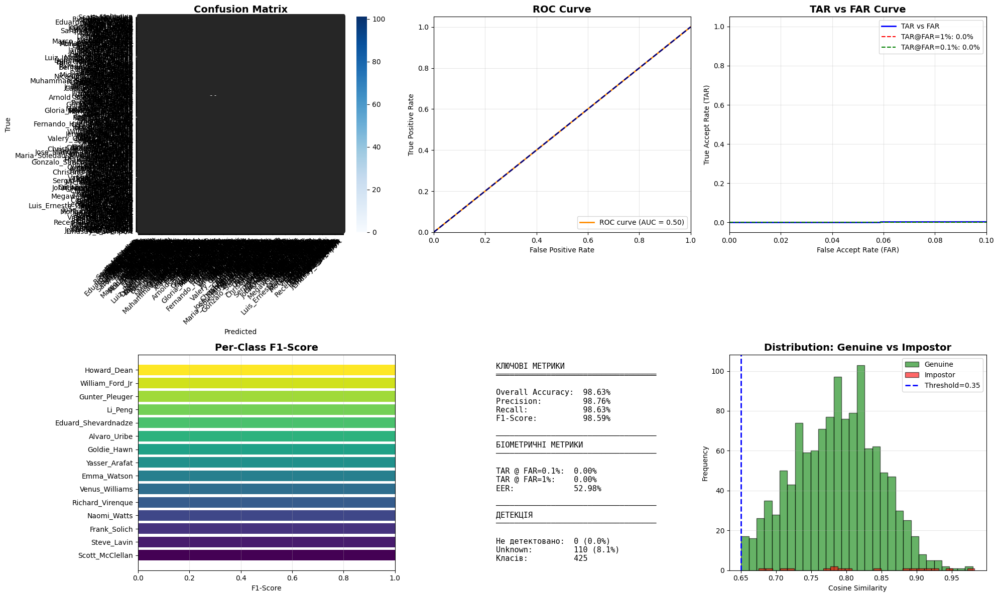


Виконання зайняло 296.4 сек


In [13]:
resulf_lfw2 = insight_lfw2.evaluate_on_test_set("lfw2/test/", 0.35)

load

In [ ]:
insight_new2 = FaceRecognitionInsightFace('buffalo_l')
insight_new2.load_database("insight_full_lfw8020.pkl")

In [ ]:
m2 = insight_new2.evaluate_on_test_set("lfw_80-20/test/", 0.35)

dom


In [17]:
# INSIGHTFACE
insight_dom = FaceRecognitionInsightFace('buffalo_l')
insight_dom.create_database("dom/train/")


Ініціалізація InsightFace (buffalo_l)...
Applied providers: ['CUDAExecutionProvider', 'CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}, 'CUDAExecutionProvider': {'sdpa_kernel': '0', 'use_tf32': '1', 'fuse_conv_bias': '0', 'prefer_nhwc': '0', 'tunable_op_max_tuning_duration_ms': '0', 'enable_skip_layer_norm_strict_mode': '0', 'tunable_op_tuning_enable': '0', 'tunable_op_enable': '0', 'use_ep_level_unified_stream': '0', 'device_id': '0', 'has_user_compute_stream': '0', 'gpu_external_empty_cache': '0', 'cudnn_conv_algo_search': 'EXHAUSTIVE', 'cudnn_conv1d_pad_to_nc1d': '0', 'gpu_mem_limit': '18446744073709551615', 'gpu_external_alloc': '0', 'gpu_external_free': '0', 'arena_extend_strategy': 'kNextPowerOfTwo', 'do_copy_in_default_stream': '1', 'enable_cuda_graph': '0', 'user_compute_stream': '0', 'cudnn_conv_use_max_workspace': '1'}}
find model: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CUDAExecutionP

  Monica_Lewinsky: 2 embeddings


  Wei_Wu: 1 embeddings


  Martha_Sahagun_de_Fox: 1 embeddings


  Michael_Killeen: 1 embeddings


  Pat_Burns: 1 embeddings


  Vanessa_Williams: 2 embeddings


  Mahathir_Mohamad: 11 embeddings


  Keanu_Reeves: 9 embeddings


  Mireya_Moscoso: 4 embeddings


  Vitaliy_Volnushkin_IK-23: 3 embeddings


  Michael_Schumacher: 14 embeddings


  Vicente_Fox: 25 embeddings


  Mike_Tyson: 9 embeddings


  Oscar_De_La_Hoya: 5 embeddings


  Mark_Butcher: 1 embeddings


  Mahmoud_Abbas: 23 embeddings


  Me: 9 embeddings


  Nestor_Kirchner: 29 embeddings


  Whoopi_Goldberg: 1 embeddings


  Nicole_Kidman: 15 embeddings


  Muhammad_Ali: 13 embeddings


  Mohamed_Benaissa: 2 embeddings


  Werner_Schlager: 1 embeddings


  Mickey_Rooney: 1 embeddings


  Valery_Giscard_dEstaing: 4 embeddings


  Patrice_Chereau: 2 embeddings


  Mike_Myers: 5 embeddings


  Wang_Nan: 1 embeddings


  Tony_Elias: 1 embeddings


  Mel_Brooks: 2 embeddings


  Vincent_Gallo: 2 embeddings


  Michael_Bloomberg: 16 embeddings


  Meryl_Streep: 12 embeddings


  Paul_McCartney: 5 embeddings


  Nan_Wang: 3 embeddings


  Patty_Schnyder: 3 embeddings


  Tommy_Franks: 12 embeddings


  Valentina_Cervi: 1 embeddings


  Miguel_Contreras: 1 embeddings


  Tora_Takagi: 1 embeddings


  Mary_Matalin: 1 embeddings

База даних створена:
  - Осіб: 41
  - Embeddings: 255
  - Успішно оброблено: 255
  - Невдалих: 0

Компіляція бази даних...
База скомпільована: матриця (255, 512)
  - Загальна кількість embeddings: 255
  - Розмір в пам'яті: ~0.5 MB
  - Час створення+компіляції бази: 10.9сек
  - Швидкість: 23.5 embeddings/сек



ТЕСТУВАННЯ МОДЕЛІ НА TEST DATASET
Поріг (threshold): 0.35
Режим пошуку: Швидкий (компільований)

Завантаження test зображень...


100%|██████████| 31/31 [00:00<00:00, 5986.90it/s]


Знайдено 78 test зображень:
  - Known persons (в базі): 25 осіб
  - Unknown/Strangers (поза базою): 6 осіб

Розпізнавання облич...


100%|██████████| 78/78 [00:03<00:00, 21.61it/s]



Оброблено: 78 зображень за 3.6 сек
Швидкість: 21.6 зображень/сек
Середній час на зображення: 46.4 ms
Пошкоджені файли (виключено): 0
Не детектовано облич: 0 (0.0%)
Класифіковано як Unknown: 19 (24.4%)

Деталі розпізнавання:
  Known (в базі):
    - Правильно розпізнано: 59
    - Неправильно розпізнано: 0
    - Класифіковано як Unknown: 13
  Strangers (поза базою):
    - Правильно відхілено (True Negative): 6
    - Помилково прийнято (False Accept): 0

РЕЗУЛЬТАТИ ТЕСТУВАННЯ

Основні метрики:
  Overall Accuracy:       83.33%  (включає своїх і чужих)
  Detection Rate:         100.00%
  Known Accuracy:         81.94%  (тільки свої)
  Stranger Rejection:     100.00%  (тільки чужі)
  Precision (recognized): 100.00%
  Recall (recognized):    100.00%
  F1-Score (recognized):  100.00%

Деталі класифікації:
  Не детектовано:  0 (0.0%)
  Unknown:         19 (24.4%)
  Розпізнано:      59 (75.6%)

Попередження: Недостатньо даних для TAR/FAR
  Genuine scores: 59
  Impostor scores: 0

Біометричні мет

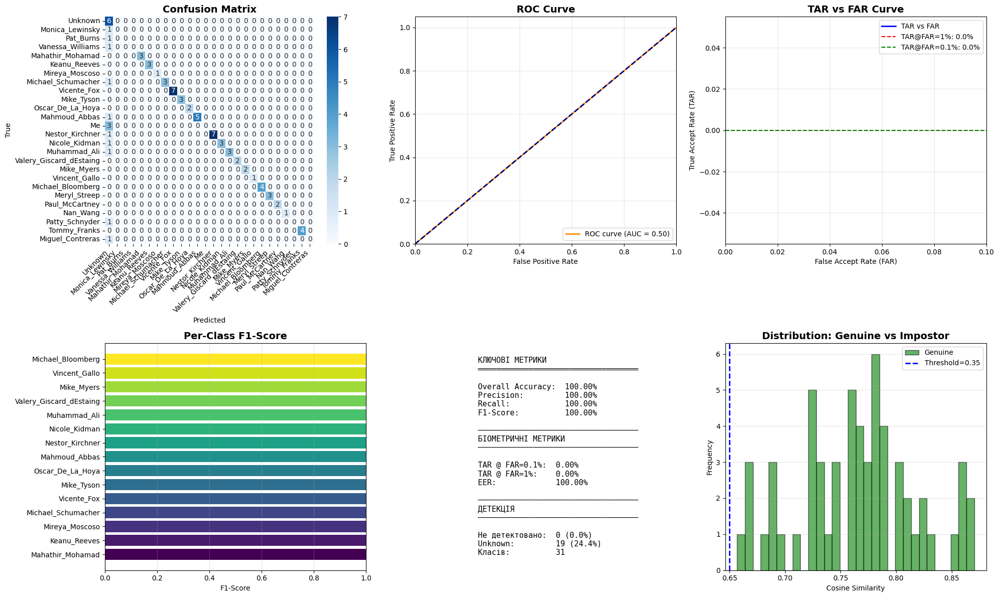


Виконання зайняло 8.3 сек


In [19]:
result_isnight_dom = insight_dom.evaluate_on_test_set("dom/test/", 0.35)

Main!!!

In [47]:
# INSIGHTFACE
insight_dom_bio = FaceRecognitionInsightFace('buffalo_l')
insight_dom_bio.create_database("dom/train/")

Ініціалізація InsightFace (buffalo_l)...
Applied providers: ['CUDAExecutionProvider', 'CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}, 'CUDAExecutionProvider': {'sdpa_kernel': '0', 'use_tf32': '1', 'fuse_conv_bias': '0', 'prefer_nhwc': '0', 'tunable_op_max_tuning_duration_ms': '0', 'enable_skip_layer_norm_strict_mode': '0', 'tunable_op_tuning_enable': '0', 'tunable_op_enable': '0', 'use_ep_level_unified_stream': '0', 'device_id': '0', 'has_user_compute_stream': '0', 'gpu_external_empty_cache': '0', 'cudnn_conv_algo_search': 'EXHAUSTIVE', 'cudnn_conv1d_pad_to_nc1d': '0', 'gpu_mem_limit': '18446744073709551615', 'gpu_external_alloc': '0', 'gpu_external_free': '0', 'arena_extend_strategy': 'kNextPowerOfTwo', 'do_copy_in_default_stream': '1', 'enable_cuda_graph': '0', 'user_compute_stream': '0', 'cudnn_conv_use_max_workspace': '1'}}
find model: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CUDAExecutionP

  Monica_Lewinsky: 2 embeddings


  Wei_Wu: 1 embeddings


  Martha_Sahagun_de_Fox: 1 embeddings


  Michael_Killeen: 1 embeddings


  Pat_Burns: 1 embeddings


  Vanessa_Williams: 2 embeddings


  Mahathir_Mohamad: 11 embeddings


  Keanu_Reeves: 9 embeddings


  Mireya_Moscoso: 4 embeddings


  Vitaliy_Volnushkin_IK-23: 3 embeddings


  Michael_Schumacher: 14 embeddings


  Vicente_Fox: 25 embeddings


  Mike_Tyson: 9 embeddings


  Oscar_De_La_Hoya: 5 embeddings


  Mark_Butcher: 1 embeddings


  Mahmoud_Abbas: 23 embeddings


  Me: 9 embeddings


  Nestor_Kirchner: 29 embeddings


  Whoopi_Goldberg: 1 embeddings


  Nicole_Kidman: 15 embeddings


  Muhammad_Ali: 13 embeddings


  Mohamed_Benaissa: 2 embeddings


  Werner_Schlager: 1 embeddings


  Mickey_Rooney: 1 embeddings


  Valery_Giscard_dEstaing: 4 embeddings


  Patrice_Chereau: 2 embeddings


  Mike_Myers: 5 embeddings


  Wang_Nan: 1 embeddings


  Tony_Elias: 1 embeddings


  Mel_Brooks: 2 embeddings


  Vincent_Gallo: 2 embeddings


  Michael_Bloomberg: 16 embeddings


  Meryl_Streep: 12 embeddings


  Paul_McCartney: 5 embeddings


  Nan_Wang: 3 embeddings


  Patty_Schnyder: 3 embeddings


  Tommy_Franks: 12 embeddings


  Valentina_Cervi: 1 embeddings


  Miguel_Contreras: 1 embeddings


  Tora_Takagi: 1 embeddings


  Mary_Matalin: 1 embeddings

База даних створена:
  - Осіб: 41
  - Embeddings: 255
  - Успішно оброблено: 255
  - Невдалих: 0

Компіляція бази даних...
База скомпільована: матриця (255, 512)
  - Загальна кількість embeddings: 255
  - Розмір в пам'яті: ~0.5 MB
  - Час створення+компіляції бази: 9.9сек
  - Швидкість: 25.7 embeddings/сек



ТЕСТУВАННЯ МОДЕЛІ НА TEST DATASET
Поріг (threshold): 0.35
Режим пошуку: Швидкий (компільований)
Біометричні метрики: Увімкнено

Завантаження test зображень...


100%|██████████| 31/31 [00:00<00:00, 31566.75it/s]


Знайдено 78 test зображень:
  - Known persons (в базі): 25 осіб
  - Unknown/Strangers (поза базою): 6 осіб

Розпізнавання облич...


100%|██████████| 78/78 [00:02<00:00, 34.15it/s]



Оброблено: 78 зображень за 2.3 сек
Швидкість: 34.1 зображень/сек
Середній час на зображення: 29.3 ms
Пошкоджені файли (виключено): 0
Не детектовано облич: 0 (0.0%)
Класифіковано як Unknown: 19 (24.4%)

Деталі розпізнавання:
  Known (в базі):
    - Правильно розпізнано: 59
    - Неправильно розпізнано: 0
    - Класифіковано як Unknown: 13
  Strangers (поза базою):
    - Правильно відхілено (True Negative): 6
    - Помилково прийнято (False Accept): 0

РЕЗУЛЬТАТИ ТЕСТУВАННЯ

Основні метрики:
  Overall Accuracy:       83.33%  (включає своїх і чужих)
  Detection Rate:         100.00%
  Known Accuracy:         81.94%  (тільки свої)
  Stranger Rejection:     100.00%  (тільки чужі)
  Precision (recognized): 100.00%
  Recall (recognized):    100.00%
  F1-Score (recognized):  100.00%

Деталі класифікації:
  Не детектовано:  0 (0.0%)
  Unknown:         19 (24.4%)
  Розпізнано:      59 (75.6%)

Попередження: Недостатньо даних для TAR/FAR
  Genuine scores: 59
  Impostor scores: 0

Біометричні мет

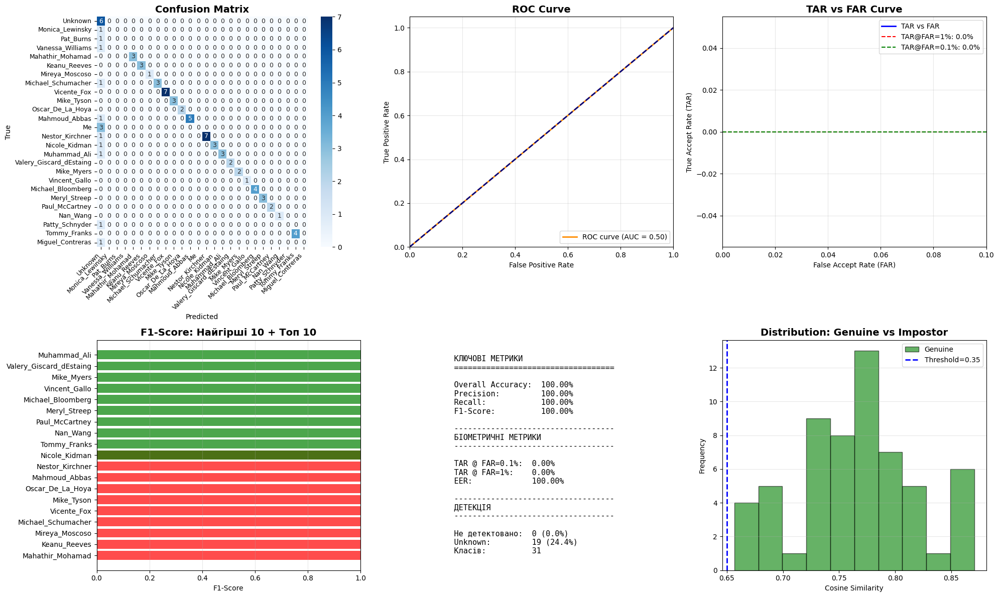


ДЕТАЛЬНИЙ F1-SCORE ПО КЛАСАХ
Rank   Person                         F1-Score   Precision  Recall     Support   
--------------------------------------------------------------------------------
#1     Mahathir_Mohamad               1.000      1.000      1.000      3         
#2     Keanu_Reeves                   1.000      1.000      1.000      3         
#3     Mireya_Moscoso                 1.000      1.000      1.000      1         
#4     Michael_Schumacher             1.000      1.000      1.000      3         
#5     Vicente_Fox                    1.000      1.000      1.000      7         
#6     Mike_Tyson                     1.000      1.000      1.000      3         
#7     Oscar_De_La_Hoya               1.000      1.000      1.000      2         
#8     Mahmoud_Abbas                  1.000      1.000      1.000      5         
#9     Nestor_Kirchner                1.000      1.000      1.000      7         
#10    Nicole_Kidman                  1.000      1.000      1.000    

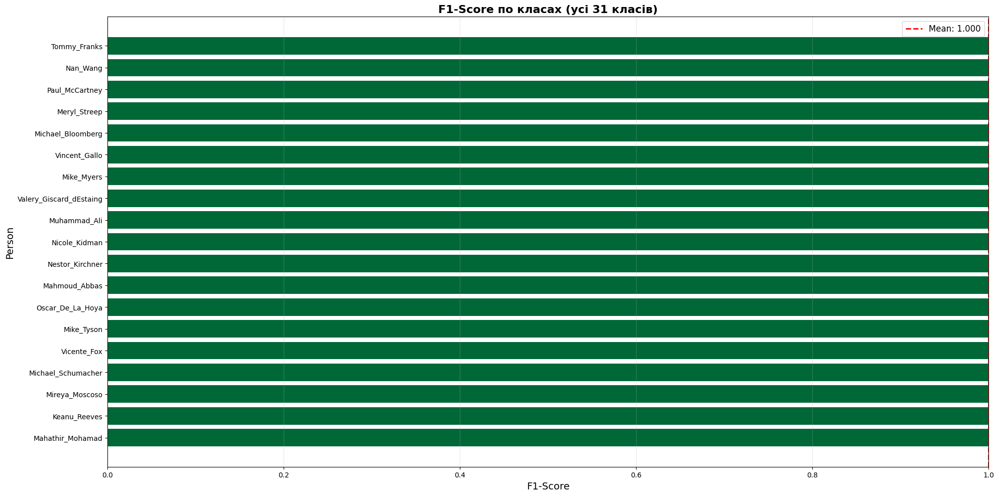


Виконання зайняло 4.5 сек


In [48]:
result_isnight_dom_bio = insight_dom_bio.evaluate_on_test_set("dom/test/", 0.35, compute_biometric=True)

In [42]:
# INSIGHTFACE
insight_dom3 = FaceRecognitionInsightFace('buffalo_l')
insight_dom3.create_database("dom/train/")

Ініціалізація InsightFace (buffalo_l)...
Applied providers: ['CUDAExecutionProvider', 'CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}, 'CUDAExecutionProvider': {'sdpa_kernel': '0', 'use_tf32': '1', 'fuse_conv_bias': '0', 'prefer_nhwc': '0', 'tunable_op_max_tuning_duration_ms': '0', 'enable_skip_layer_norm_strict_mode': '0', 'tunable_op_tuning_enable': '0', 'tunable_op_enable': '0', 'use_ep_level_unified_stream': '0', 'device_id': '0', 'has_user_compute_stream': '0', 'gpu_external_empty_cache': '0', 'cudnn_conv_algo_search': 'EXHAUSTIVE', 'cudnn_conv1d_pad_to_nc1d': '0', 'gpu_mem_limit': '18446744073709551615', 'gpu_external_alloc': '0', 'gpu_external_free': '0', 'arena_extend_strategy': 'kNextPowerOfTwo', 'do_copy_in_default_stream': '1', 'enable_cuda_graph': '0', 'user_compute_stream': '0', 'cudnn_conv_use_max_workspace': '1'}}
find model: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CUDAExecutionP

  Monica_Lewinsky: 2 embeddings


  Wei_Wu: 1 embeddings


  Martha_Sahagun_de_Fox: 1 embeddings


  Michael_Killeen: 1 embeddings


  Pat_Burns: 1 embeddings


  Vanessa_Williams: 2 embeddings


  Mahathir_Mohamad: 11 embeddings


  Keanu_Reeves: 9 embeddings


  Mireya_Moscoso: 4 embeddings


  Vitaliy_Volnushkin_IK-23: 3 embeddings


  Michael_Schumacher: 14 embeddings


  Vicente_Fox: 25 embeddings


  Mike_Tyson: 9 embeddings


  Oscar_De_La_Hoya: 5 embeddings


  Mark_Butcher: 1 embeddings


  Mahmoud_Abbas: 23 embeddings


  Me: 9 embeddings


  Nestor_Kirchner: 29 embeddings


  Whoopi_Goldberg: 1 embeddings


  Nicole_Kidman: 15 embeddings


  Muhammad_Ali: 13 embeddings


  Mohamed_Benaissa: 2 embeddings


  Werner_Schlager: 1 embeddings


  Mickey_Rooney: 1 embeddings


  Valery_Giscard_dEstaing: 4 embeddings


  Patrice_Chereau: 2 embeddings


  Mike_Myers: 5 embeddings


  Wang_Nan: 1 embeddings


  Tony_Elias: 1 embeddings


  Mel_Brooks: 2 embeddings


  Vincent_Gallo: 2 embeddings


  Michael_Bloomberg: 16 embeddings


  Meryl_Streep: 12 embeddings


  Paul_McCartney: 5 embeddings


  Nan_Wang: 3 embeddings


  Patty_Schnyder: 3 embeddings


  Tommy_Franks: 12 embeddings


  Valentina_Cervi: 1 embeddings


  Miguel_Contreras: 1 embeddings


  Tora_Takagi: 1 embeddings


  Mary_Matalin: 1 embeddings

База даних створена:
  - Осіб: 41
  - Embeddings: 255
  - Успішно оброблено: 255
  - Невдалих: 0

Компіляція бази даних...
База скомпільована: матриця (255, 512)
  - Загальна кількість embeddings: 255
  - Розмір в пам'яті: ~0.5 MB
  - Час створення+компіляції бази: 10.4сек
  - Швидкість: 24.4 embeddings/сек



ТЕСТУВАННЯ МОДЕЛІ НА TEST DATASET
Поріг (threshold): 0.4
Режим пошуку: Швидкий (компільований)
Біометричні метрики: Вимкнено

Завантаження test зображень...


100%|██████████| 31/31 [00:00<00:00, 48570.57it/s]


Знайдено 78 test зображень:
  - Known persons (в базі): 25 осіб
  - Unknown/Strangers (поза базою): 6 осіб

Розпізнавання облич...


100%|██████████| 78/78 [00:02<00:00, 31.50it/s]



Оброблено: 78 зображень за 2.5 сек
Швидкість: 31.5 зображень/сек
Середній час на зображення: 31.8 ms
Пошкоджені файли (виключено): 0
Не детектовано облич: 0 (0.0%)
Класифіковано як Unknown: 15 (19.2%)

Деталі розпізнавання:
  Known (в базі):
    - Правильно розпізнано: 63
    - Неправильно розпізнано: 0
    - Класифіковано як Unknown: 9
  Strangers (поза базою):
    - Правильно відхілено (True Negative): 6
    - Помилково прийнято (False Accept): 0

РЕЗУЛЬТАТИ ТЕСТУВАННЯ

Основні метрики:
  Overall Accuracy:       88.46%  (включає своїх і чужих)
  Detection Rate:         100.00%
  Known Accuracy:         87.50%  (тільки свої)
  Stranger Rejection:     100.00%  (тільки чужі)
  Precision (recognized): 100.00%
  Recall (recognized):    100.00%
  F1-Score (recognized):  100.00%

Деталі класифікації:
  Не детектовано:  0 (0.0%)
  Unknown:         15 (19.2%)
  Розпізнано:      63 (80.8%)


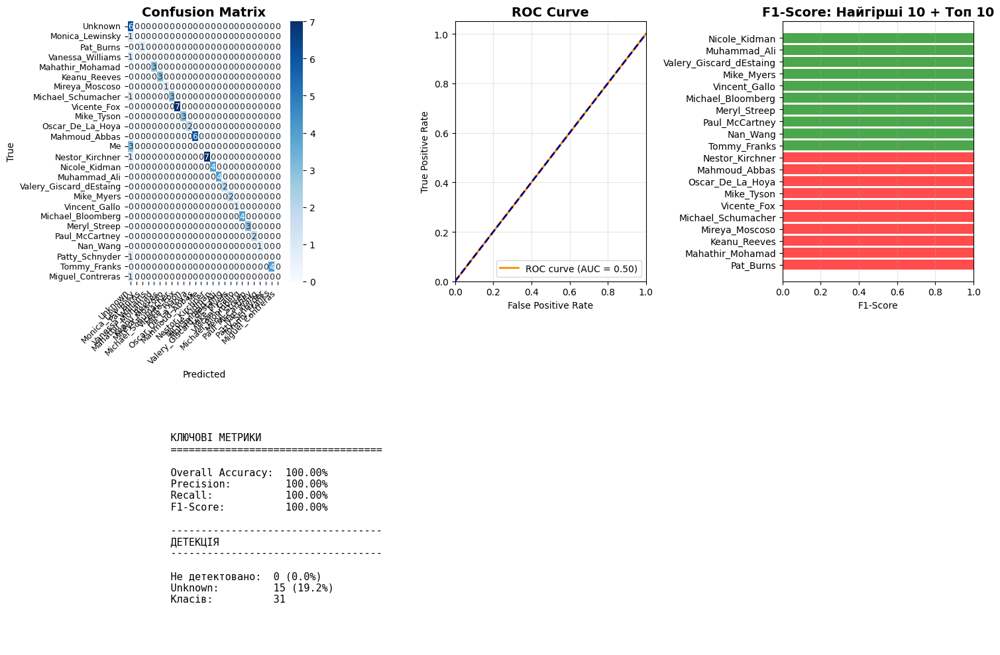


ДЕТАЛЬНИЙ F1-SCORE ПО КЛАСАХ
Rank   Person                         F1-Score   Precision  Recall     Support   
--------------------------------------------------------------------------------
#1     Pat_Burns                      1.000      1.000      1.000      1         
#2     Mahathir_Mohamad               1.000      1.000      1.000      3         
#3     Keanu_Reeves                   1.000      1.000      1.000      3         
#4     Mireya_Moscoso                 1.000      1.000      1.000      1         
#5     Michael_Schumacher             1.000      1.000      1.000      3         
#6     Vicente_Fox                    1.000      1.000      1.000      7         
#7     Mike_Tyson                     1.000      1.000      1.000      3         
#8     Oscar_De_La_Hoya               1.000      1.000      1.000      2         
#9     Mahmoud_Abbas                  1.000      1.000      1.000      6         
#10    Nestor_Kirchner                1.000      1.000      1.000    

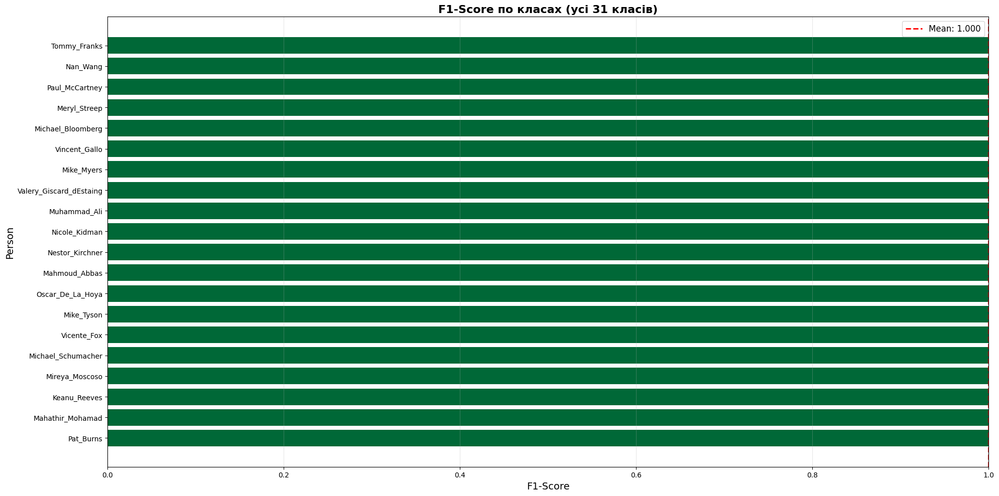


Виконання зайняло 5.1 сек


In [43]:
result_isnight_dom3 = insight_dom3.evaluate_on_test_set("dom/test/", 0.4)

In [45]:
# DEEPFACE
deepface_dom1 = FaceRecognitionDeepFace("Facenet512", "ssd")
deepface_dom1.create_database("dom/train/")

Ініціалізація DeepFace (Facenet512)...
  Модель: Facenet512
  Детектор: ssd
DeepFace готовий!

Створення бази даних з dom/train/


  Monica_Lewinsky: 2 embeddings


  Wei_Wu: 1 embeddings


  Martha_Sahagun_de_Fox: 1 embeddings


  Michael_Killeen: 1 embeddings


  Pat_Burns: 1 embeddings


  Vanessa_Williams: 2 embeddings


  Mahathir_Mohamad: 11 embeddings


  Keanu_Reeves: 9 embeddings


  Mireya_Moscoso: 4 embeddings


  Vitaliy_Volnushkin_IK-23: 3 embeddings


  Michael_Schumacher: 14 embeddings


  Vicente_Fox: 25 embeddings


  Mike_Tyson: 9 embeddings


  Oscar_De_La_Hoya: 5 embeddings


  Mark_Butcher: 1 embeddings


  Mahmoud_Abbas: 23 embeddings


  Me: 9 embeddings


  Nestor_Kirchner: 29 embeddings


  Whoopi_Goldberg: 1 embeddings


  Nicole_Kidman: 15 embeddings


  Muhammad_Ali: 13 embeddings


  Mohamed_Benaissa: 2 embeddings


  Werner_Schlager: 1 embeddings


  Mickey_Rooney: 1 embeddings


  Valery_Giscard_dEstaing: 4 embeddings


  Patrice_Chereau: 2 embeddings


  Mike_Myers: 5 embeddings


  Wang_Nan: 1 embeddings


  Tony_Elias: 1 embeddings


  Mel_Brooks: 2 embeddings


  Vincent_Gallo: 2 embeddings


  Michael_Bloomberg: 16 embeddings


  Meryl_Streep: 12 embeddings


  Paul_McCartney: 5 embeddings


  Nan_Wang: 3 embeddings


  Patty_Schnyder: 3 embeddings


  Tommy_Franks: 12 embeddings


  Valentina_Cervi: 1 embeddings


  Miguel_Contreras: 1 embeddings


  Tora_Takagi: 1 embeddings


  Mary_Matalin: 1 embeddings

База даних створена:
  - Осіб: 41
  - Embeddings: 255
  - Успішно оброблено: 255
  - Невдалих: 0

Компіляція бази даних...
База скомпільована: матриця (255, 512)
  - Загальна кількість embeddings: 255
  - Розмір в пам'яті: ~1.0 MB
  - Час створення+компіляції бази: 74.9сек
  - Швидкість: 3.4 embeddings/сек



ТЕСТУВАННЯ МОДЕЛІ НА TEST DATASET
Поріг (threshold): 0.35
Режим пошуку: Швидкий (компільований)
Біометричні метрики: Вимкнено

Завантаження test зображень...


100%|██████████| 31/31 [00:00<00:00, 27448.47it/s]


Знайдено 78 test зображень:
  - Known persons (в базі): 25 осіб
  - Unknown/Strangers (поза базою): 6 осіб

Розпізнавання облич...


100%|██████████| 78/78 [00:27<00:00,  2.84it/s]



Оброблено: 78 зображень за 27.5 сек
Швидкість: 2.8 зображень/сек
Середній час на зображення: 352.4 ms
Пошкоджені файли (виключено): 0
Не детектовано облич: 0 (0.0%)
Класифіковано як Unknown: 13 (16.7%)

Деталі розпізнавання:
  Known (в базі):
    - Правильно розпізнано: 64
    - Неправильно розпізнано: 1
    - Класифіковано як Unknown: 7
  Strangers (поза базою):
    - Правильно відхілено (True Negative): 6
    - Помилково прийнято (False Accept): 0

РЕЗУЛЬТАТИ ТЕСТУВАННЯ

Основні метрики:
  Overall Accuracy:       89.74%  (включає своїх і чужих)
  Detection Rate:         100.00%
  Known Accuracy:         88.89%  (тільки свої)
  Stranger Rejection:     100.00%  (тільки чужі)
  Precision (recognized): 98.77%
  Recall (recognized):    98.46%
  F1-Score (recognized):  98.29%

Деталі класифікації:
  Не детектовано:  0 (0.0%)
  Unknown:         13 (16.7%)
  Розпізнано:      65 (83.3%)


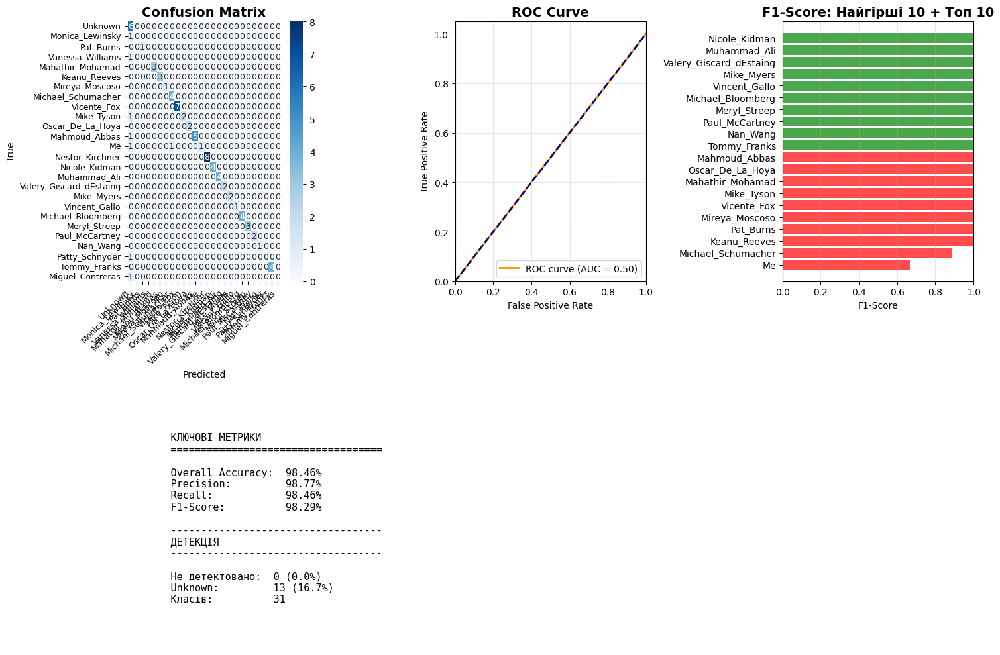


ДЕТАЛЬНИЙ F1-SCORE ПО КЛАСАХ
Rank   Person                         F1-Score   Precision  Recall     Support   
--------------------------------------------------------------------------------
#1     Pat_Burns                      1.000      1.000      1.000      1         
#2     Mahathir_Mohamad               1.000      1.000      1.000      3         
#3     Keanu_Reeves                   1.000      1.000      1.000      3         
#4     Mireya_Moscoso                 1.000      1.000      1.000      1         
#5     Vicente_Fox                    1.000      1.000      1.000      7         
#6     Mike_Tyson                     1.000      1.000      1.000      2         
#7     Oscar_De_La_Hoya               1.000      1.000      1.000      2         
#8     Mahmoud_Abbas                  1.000      1.000      1.000      5         
#9     Nestor_Kirchner                1.000      1.000      1.000      8         
#10    Nicole_Kidman                  1.000      1.000      1.000    

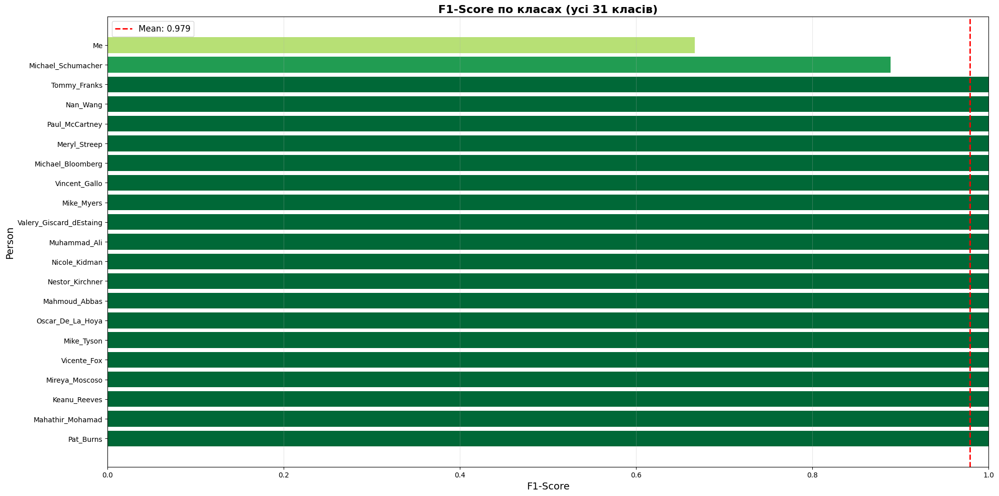


Виконання зайняло 29.4 сек


In [46]:
result_deepface_dom1 = deepface_dom1.evaluate_on_test_set("dom/test/", 0.35)